# MultiModalSpectralTransformer

### Config

In [1]:
# Core libraries
import copy
import glob
import json
import os
import pickle
import random
import statistics
from argparse import Namespace
from collections import defaultdict
from datetime import datetime
import tempfile
import math
import ast
import time
import shutil
from math import ceil
import re
from typing import List, Dict, Any, Union, Tuple


# Data processing and scientific computing
import numpy as np
import pandas as pd
from tqdm import tqdm
from tqdm.autonotebook import tqdm

# Machine learning and data visualization
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.model_selection import train_test_split
import umap
from sklearn.neighbors import RadiusNeighborsRegressor
from scipy.spatial.distance import cosine
from sklearn.neighbors import NearestNeighbors

# PyTorch and related libraries
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data.distributed import DistributedSampler
from torch.optim.lr_scheduler import ReduceLROnPlateau
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.profiler import SimpleProfiler, AdvancedProfiler
from pytorch_lightning.loggers import WandbLogger

# RDKit for cheminformatics
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, Draw, Descriptors, MolFromSmiles, MolToSmiles
from rdkit.Chem.Descriptors import MolWt
from rdkit.Chem.rdMolDescriptors import CalcMolFormula
from rdkit.DataStructs import FingerprintSimilarity, TanimotoSimilarity

# Weights & Biases for experiment tracking
import wandb

# Miscellaneous
from IPython.display import HTML, SVG, display

# Setting up environment
%matplotlib inline
torch.cuda.device_count()
#wandb.login()

# Custom utility modules
import utils_MMT.clip_functions_v15_4 as cf
import utils_MMT.MT_functions_v15_4 as mtf
import utils_MMT.validate_generate_MMT_v15_4 as vgmmt
import utils_MMT.run_batch_gen_val_MMT_v15_4 as rbgvm
import utils_MMT.clustering_visualization_v15_4 as cv
import utils_MMT.plotting_v15_4 as pt
import utils_MMT.execution_function_v15_4 as ex
import utils_MMT.train_test_functions_pl_v15_4 as ttf
import utils_MMT.ir_simulation_v15_4 as irs
import utils_MMT.helper_functions_pl_v15_4 as hf
import utils_MMT.mmt_result_test_functions_15_4 as mrtf
import utils_MMT.experiment_function_v15_4 as exp_func
from utils_MMT.mmt_result_test_functions_15_4 import *
import utils_MMT.improvement_cycle_neg_examples_v15_4 as icne
import shutil

/projects/cc/se_users/knlr326/miniconda_SE/envs/NMR_Structure_Elucidator/lib/python3.7/site-packages/ipykernel_launcher.py:26: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
INFO:rdkit:Enabling RDKit 2023.03.2 jupyter extensions
Using backend: pytorch


783
562


INFO:chemprop.paths:Using BASE_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/chemprop-IR/chemprop
INFO:chemprop.paths:Using MODELS_BASE_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/models
INFO:chemprop.paths:Using CHEMPROP_IR_MODEL_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/models/chemprop-IR
INFO:chemprop.paths:Successfully created model directories


In [2]:

def load_json_dics():
    with open('./itos.json', 'r') as f:
        itos = json.load(f)
    with open('./stoi.json', 'r') as f:
        stoi = json.load(f)
    with open('./stoi_MF.json', 'r') as f:
        stoi_MF = json.load(f)
    with open('./itos_MF.json', 'r') as f:
        itos_MF = json.load(f)    
    return itos, stoi, stoi_MF, itos_MF
    
itos, stoi, stoi_MF, itos_MF = load_json_dics()
rand_num = str(random.randint(1, 10000000))

In [3]:
IR_config_dict = {
    "gpu": list(range(torch.cuda.device_count())),
    "test_path": [os.path.abspath("./models/chemprop-ir/ir_models_data/solvation_example/solvation_spectra.csv")],
    "use_compound_names": [False],
    "preds_path": [os.path.abspath("./models/chemprop-ir/ir_models_data/ir_preds_test_2.csv")],
    "checkpoint_dir": [os.path.abspath("./models/chemprop-ir/ir_models_data/experiment_model/model_files")],
    "spectra_type": ["experimental"],
    "spectra_type_nr": [0],
    "checkpoint_path": [None],
    "batch_size": [50],
    "no_cuda": [[False]],
    "features_generator": [None],
    "features_path": [None],
    "max_data_size": [100],
    "ensemble_variance": [False],
    "ensemble_variance_conv": [0.0],
}

import os

# Determine the project root directory (where the notebook is located)
project_root = os.path.dirname(os.path.abspath('__file__'))

hyperparameters = {
    # General project information
    "project": ["MMST_V1"],  # Name of the project for wandb monitoring
    "ran_num":[rand_num],
    "device": ["cuda"], # device on which training takes place
    "gpu_num":[1], # number of GPUs for training with pytorch lightning
    "num_workers":[4], # Needs to stay 1 otherwise code crashes - ToDO
    "data_type":["sgnn"], #["sgnn", "exp", "acd", "real", "inference"], Different data types to select
    "execution_type":["validate_MMT"], #[ "plot_similarities", "simulate_real", "test_performance", "SMI_generation_MMT", "SMI_generation_MF", "data_generation", "transformer_training","transformer_improvement", "clip_training", "clip_improvement", "validate_MMT"] # different networks to select for training
    "syn_data_simulated": [False],  # For the improvment cycle a ticker that shows whether data has been simulated or not.
    "training_type":["clip"], #["clip","transformer"] # different networks to select for training

    # Encoding dicts
    "itos_path": [os.path.join(project_root, "itos.json")],
    "stoi_path": [os.path.join(project_root, "stoi.json")],
    "itos_MF_path": [os.path.join(project_root, "itos_MF.json")],
    "stoi_MF_path": [os.path.join(project_root, "stoi_MF.json")],
    
    ### Data settings
    "input_dim_1H":[2], # Imput dimensions of the 1H data
    "input_dim_13C": [1], # Imput dimensions of the 13C data
    "input_dim_HSQC": [2], # Imput dimensions of the HSQC data
    "input_dim_COSY": [2],  # Imput dimensions of the COSY data
    "input_dim_IR": [1000],  # Imput dimensions of the IR data
    "MF_vocab_size": [len(stoi_MF)],  # New, size of the vocabulary for molecular formulas
    "MS_vocab_size": [len(stoi)],  # New, size of the vocabulary for molecular formulas
    "tr_te_split":[0.9], # Train-Test split
    "padding_points_number":[64], # Padding number for the embedding layer into the network
    "data_size": [1000], # number of datapoints for the training ZINC:3975764/ PubChem1797828
    "test_size": [10], # number of datapoints for the training ZINC: 3975764
    "model_save_dir": [os.path.join(project_root, "experiments/exp_1/model_save_dir")],
    "ML_dump_folder": [os.path.join(project_root, "experiments/exp_1/dump")],
    "model_save_interval": [10000],
    
    # Option 1 SGNN
    "use_real_data": [False],
    "ref_data_type": ["1H"],
    "csv_train_path": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv")],
    "csv_1H_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv")],
    "csv_13C_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_13C_train_V8.csv")],    
    "csv_HSQC_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_HSQC_train_V8.csv")],    
    "csv_COSY_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_COSY_train_V8.csv")],      
    "csv_IR_MF_path": [''],
    "csv_path_val": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv")], 
    "IR_data_folder": [os.path.join(project_root, "data/ZINK_dataset/IR_spectra_NN")],
    "pickle_file_path": [""],
    "dl_mode": ['val'],
    "isomericSmiles": [False],
    
    #### Transformer Settings ####
    # Training and model settings
    "training_mode":["1H_13C_HSQC_COSY_IR_MF_MW"], #["edding_src_1H = torch.zeros((feature_dim, current_ba"], Modalities selected for training
    "blank_percentage":[0.0], # percentage of spectra that are blanked out during training for better generalizability of the network to various datatypes
    "batch_size":[64], # number needs to be the same as number of GPUs 
    "num_epochs": [10], # number of epochs for training
    "lr_pretraining": [1e-4], # Pretraining learning rate
    "lr_finetuning": [5e-5], # Finetuning learning rate
    "load_model": [True], # if model should be loaded from path
    "checkpoint_path":[os.path.join(project_root,"models/mmst/base_models/1_0_V8i_MMTi_RAW_MW_DROP_Loss_0.112.ckpt")], #V8
    "save_model": [True], # if model should be saved
    
    # Model architecture
    "in_size": [len(stoi)],
    "hidden_size": [128],
    "out_size": [len(stoi)],
    "num_encoder_layers": [6], #8
    "num_decoder_layers": [6], #8
    "num_heads": [16], #8  ### number of attention heads
    "forward_expansion": [4], #4
    "max_len": [128], # maximum length of the generated sequence
    "drop_out": [0.1],
    "fingerprint_size": [512], # Dimensions of encoder output for CLIP contrastive training    
    "gen_SMI_sequence":[True], # If the model generates a sequence with the SMILES current model for evaluation
    "sampling_method":["mix"], # weight_mol_weight ["multinomial", "greedy". "mix"]  
    "training_setup":["pretraining"], # ["pretraining","finetuning"]
    "smi_randomizer":[False], # if smiles are randomized or canonical during training
    
    ### SGNN Feedback
    "sgnn_feedback":[False], # if SGNN generates 1H and 13C spectrum on the fly on the generated smiles -> "gen_SMI_sequence":[True]
    "matching":["HungDist"], #["MinSum","EucDist","HungDist"], # HSQC point matching technique used
    "padding":["NN"], # ["Zero","Trunc","NN"], # HSQC padding technique used -> see publication: XXX
    # Weight feedback
    "train_weight_min":[None], # Calculate on the fly - Used for the weight loss calculation for scaling
    "train_weight_max":[None], # Calculate on the fly - Used for the weight loss calculation for scaling
    # Training Loss Weighting options
    "weight_validity": [0.0], # up to 1
    "weight_SMI": [1.0], # up to 1
    "weight_FP": [0.0], # up to 1
    "weight_MW": [0], # up to 100
    "weight_sgnn": [0.0], # up to 10
    "weight_tanimoto": [0.0], # up to 1
    "change_loss_weights":[False], # if selected the weights get ajusted along the training
    "increment":[0.01], # increment on how much it gets ajusted during training -> TODO
    "batch_frequency":[10000], # Frequency how often it gets ajusted -> TODO
    
    ### For Validation
    "beam_size": [1],  
    "multinom_runs": [1], 
    "temperature":[1],
    "gen_len":[64],
    "pkl_save_folder":[os.path.join(project_root, "exp_1/pkl_save_folder")],
    
    ### Molformer options 
    "MF_max_trails":[500],
    "MF_tanimoto_filter":[0.1],
    "MF_filter_higher":[1], # False = 0 True = 1
    "MF_delta_weight":[5],
    "MF_generations":[30],
    "MF_model_path":[os.path.join(project_root,"models/mol2mol/Alessandro_big/weights_pubchem_with_counts_and_rank_sanitized.ckpt")],
    "MF_vocab":[os.path.join(project_root,"models/mol2mol/Alessandro_big/vocab_new.pkl")],
    "MF_csv_source_folder_location":[os.path.join(project_root,"deep-molecular-optimization/data/MMP")],
    "MF_csv_source_file_name":["test_selection_2"],
    "MF_methods":["MMP"], #["MMP", "scaffold", "MMP_scaffold"],      
    "max_scaffold_generations":[10], #
    
    ### MMT batch generation
    "MMT_batch":[32], # how big is the batch of copies of the same inputs that is processed by MMT 
    "MMT_generations":[4], # need to be multiple of MMT_batch -> number of valid generated molecules
    "n_samples":[10], # number of molecules that should be processed for data generation - needs to be smaller than dataloader size
    "gen_mol_csv_folder_path": [os.path.join(project_root,"data/SGNN_gen_folder")],  # Updated to use local path in the repository
    
    ### Fine-tuning improvement options
    "train_data_blend":[0], # how many additional molecules should be added to the new dataset from the original training dataset
    "train_data_blend_CLIP":[1000], # how many additional molecules should be added to the new dataset from the original training dataset
    

    ### Data generation SGNN -> 1H, 13C, HSQC, COSY
    "SGNN_gen_folder_path":[os.path.join(project_root, "experiments/exp_1/SGNN_gen_folder")],
    "SGNN_csv_gen_smi":[os.path.join(project_root,"data/test_data/IBM_SMI_data_top20.csv")],
    "SGNN_size_filter":[550],
    "SGNN_csv_save_folder": [os.path.join(project_root,"experiments/exp_1/SGNN_gen_folder")],
    "IR_save_folder":[os.path.join(project_root, "experiments/exp_1/IR_data")],

    ##################################################
    #### LEGACY parameters for Future experiments ####
    ##################################################
    ### CLIP Model for contrastive learning ChemBerta VS MultiModalSpectralTransformer
    #### CLIP Settings ####
    ### ChemBerta
    "model_version":[os.path.join(project_root,"models/mmst/OLD/Chemberta_source")],   # Source of pretrained chemberta from paper
    "CB_model_path":[os.path.join(project_root,"models/mmst/OLD/Large_300_15.pth")], # path to pretrained Chemberta model
    "num_class":[1024], #
    "num_linear_layers":[0], # number of linear layers in architecture before num_class output
    "use_dropout":[True],
    "use_relu":[False],
    "loss_fn":["BCEWithLogitsLoss"], #"MSELoss", "BCELoss", 
    "CB_embedding": [1024], #1024
    # PCA
    "fp_dim_reduction":[False], #True
    "pca_components":[300],  
    #"CB_model_name": ["Large_300_15"],

    ### Multimodal Transformer
    "MT_model_path":[os.path.join(project_root,"models/mmst/OLD/MultimodalTransformer_time_1706856620.3718672_Loss_0.202.pth")],  # path to pretrained Multimodal Transformer model  
    #"MT_model_name": ["SpectrumBERT_PCA_large_3.6"],
    "MT_embedding": [512], #512
    ### Projection Head
    "projection_dim": [512],
    "dropout": [0.1],
    
    ### Train parameters
    # Dataloader settings
    "similarity_threshold":[0.6], # Filtere that selects just molecules with a tanimotosimilarity higher than that number
    "max_search_size":[10000], # Size of the data that will be searched to find the similar molecules  # 100000
    "weight_delta":[50], # Filter to molecules with a +/- delta weight of that numbeTraceback (most recent call last):
    "CLIP_batch_size":[128],  #,64,128,256 ### batch size for the CLIP training
    "CLIP_NUM_EPOCHS": [10],    # Number of training epochs
    "CLIP_temperature": [1],
    #"CB_projection_lr": [1e-3], # projection head learning rate for Chemberta
    "MT_projection_lr": [1e-3], # projection head learning rate for Multimodal Transfomer
    "CB_lr": [1e-4], # Chemberta Learning Rate
    "MT_lr": [1e-5], # Multimodal Transfomer Learning Rate
    "weight_decay": [1e-3], # Weight decay for projection heads -> TODO why just on those
    "patience": [1],   # not integrated yet
    "factor": [0.8],   # not integrated yet
    "CLIP_continue_training":[True],
    "CLIP_model_path":[os.path.join(project_root,"models/mmst/OLD/MultimodalCLIP_Epoch_9_Loss0.096.ckpt")],   
    "CLIP_model_save_dir":[os.path.join(project_root,"models/mmst/OLD/test_CLIP")],
    }


def save_config(config, path):
    with open(path, 'w') as f:
        json.dump(config, f)

def load_config(path):
    try:
        with open(path, 'r') as f:
            return json.load(f)
    except FileNotFoundError:
        return None    

def parse_arguments(hyperparameters):
    # Using dictionary comprehension to simplify your code
    parsed_args = {key: val[0] for key, val in hyperparameters.items()}
    return Namespace(**parsed_args)

config = parse_arguments(hyperparameters)
ir_config_path = os.path.join(project_root,'utils_MMT/ir_config_V8.json')
save_config(IR_config_dict, ir_config_path)
IR_config_dict = load_config(ir_config_path)
IR_config = parse_arguments(IR_config_dict)
irs.modify_predict_args(IR_config)

config_path = os.path.join(project_root,'utils_MMT/config_V8.json')
save_config(hyperparameters, config_path)
config_dict = load_config(config_path)
config = parse_arguments(config_dict)

In [4]:
# Import necessary libraries (assuming these are already imported in your script)
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import statistics

# Correct path to the IBM comparison data
ibm_data_path = '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison'

# Load the IBM comparison data
file_path = os.path.join(ibm_data_path, '1.0_prob_dict_results_IBM.pkl')
with open(file_path, 'rb') as file:
    prob_dict_results_ibm = pickle.load(file)

file_path = os.path.join(ibm_data_path, '1.1_results_dict_IBM.pkl')
with open(file_path, 'rb') as file:
    results_dict_ibm = pickle.load(file)

# Plot 1: Violin plot for correct SMILES sample probability
fig, ax = plt.subplots(figsize=(8, 10))
data_for_violin = [prob_dict_results_ibm["aggregated_corr_prob_multi"]]
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('IBM: Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks([1])
ax.set_xticklabels(['IBM Model'], fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_value = np.mean(data_for_violin[0])
ax.text(1, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

plt.tight_layout()
# Commented out save code
# save_path = os.path.abspath('./_FIGURES/IBM_Violin_Prob.png')
# plt.savefig(save_path, format='png')
plt.show()

# Plot 2: Violin plot for Tanimoto similarity
fig, ax = plt.subplots(figsize=(8, 10))
data_for_violin = [results_dict_ibm["tanimoto_scores_"]]
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('IBM: Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks([1])
ax.set_xticklabels(['IBM Model'], fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_value = np.mean(data_for_violin[0])
ax.text(1, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

plt.tight_layout()
# Commented out save code
# save_path = os.path.abspath('./_FIGURES/IBM_Tanimoto_Violin.png')
# plt.savefig(save_path, format='png')
plt.show()

# Plot 3: Bar chart for invalid SMILES count
fig, ax = plt.subplots(figsize=(8, 10))
failed_count = len(results_dict_ibm["failed"])
total_entries = len(results_dict_ibm["gen_conv_SMI_list"])
percentage = (failed_count / total_entries) * 100 if total_entries > 0 else 0

# Define colors for the bars
color = "#8CB0FE"

# Plotting the bar
bar = ax.bar([0], [failed_count], width=0.35, color=color, edgecolor='black')

# Adding value labels inside and percentage on top of each bar
ax.text(0, failed_count / 2, f'{percentage:.1f}%', 
        rotation=90, ha='center', va='center', fontsize=22)

# Set the title and labels
ax.set_title('IBM: Greedy Sampled Number of Invalid SMILES', fontsize=22)
ax.set_ylabel('Invalid Molecules', fontsize=22)
ax.set_xticks([0])
ax.set_xticklabels(['IBM Model'], fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for label visibility
ax.set_ylim(0, failed_count * 1.25)

plt.tight_layout()
# Commented out save code
# save_path = os.path.abspath('./_FIGURES/IBM_Invalid_molecules.png')
# plt.savefig(save_path, format='png')
plt.show()

In [10]:
results_dict_ibm.keys()

dict_keys(['gen_conv_SMI_list', 'trg_conv_SMI_list', 'gen_conv_SMI_list_', 'trg_conv_SMI_list_', 'idx_list', 'token_probs_list', 'validity_term', 'tanimoto_scores_', 'tanimoto_scores_all', 'data_dict_list', 'failed', 'HSQC_sim_error_list', 'COSY_sim_error_list', 'batch_data', 'df_succ_smis', 'tensor_HSQC', 'tensor_COSY'])

In [13]:
len(results_dict_ibm["tanimoto_scores_all"])

63357

### 0.0 Test Sized Models and Different Training Data


##### Data size effect - Training times effect


In [ ]:


"""
# V8i Raw 1M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=07-loss=0.10.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=19-loss=0.04.ckpt")


model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_0a["tanimoto_sim"]))

import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_1M_L_epoch_7.pkl')
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0a, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_1M_L_epoch_7.pkl')
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0a, file)"""

'\n# V8 Raw 1M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=07-loss=0.10.ckpt"\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/MultimodalTransformer_time_1711116450.3325515_Loss_0.042.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=19-loss=0.04.ckpt"\n\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\nprint(np.mean(results_dict_0a["tanimoto_sim"]))\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/pr

In [ ]:
"""
# V8i Raw 2M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_2Mio-epoch=07-loss=0.06.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_2Mio-epoch=09-loss=0.04.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_0b["tanimoto_sim"]))


import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_2M_L_epoch_7.pkl')  
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_2M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_2M_L_epoch_7.pkl')  
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_2M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 2M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/model-epoch=07-loss=0.06.ckpt"\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/MultimodalTransformer_time_1711251408.4834092_Loss_0.031.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/model-epoch=09-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\nprint(np.mean(results_dict_0b["tanimoto_sim"]))\n\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/pr

In [ ]:
"""
# V8i Raw 4M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_4Mio-epoch=07-loss=0.02.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_4Mio-epoch=04-loss=0.04.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_4M_L_epoch_7.pkl') 
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_4M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_4M_L_epoch_7.pkl') 
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_4M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 4M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/model-epoch=07-loss=0.02.ckpt"\n\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/MultimodalTransformer_time_1711912422.1540647_Loss_0.026.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/model-epoch=04-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_4M_L_epo

#### Load saved data - EPOCH 7
- Different data sizes



In [53]:
import pickle
import os
import gc
import numpy as np
import statistics
import matplotlib.pyplot as plt

### Epoch 7 for all molecules seen - File-based loading
results_dict_results = []
prob_dict_results = []
# Define file paths for prob_dict files
prob_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_0.1M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_1M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_2M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_4M_L_epoch_7.pkl'
]

# Load prob_dict files
for i, file_path in enumerate(prob_dict_file_paths):
    print(f"Loading prob_dict file {i+1}/{len(prob_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            prob_dict = pickle.load(file)
            prob_dict_results.append(prob_dict)
        print(f"  - Successfully loaded {labels[i]} prob_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

# Define file paths for results_dict files
results_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_0.1M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_1M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_2M_L_epoch_7.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_4M_L_epoch_7.pkl'
]

# Load results_dict files
for i, file_path in enumerate(results_dict_file_paths):
    print(f"Loading results_dict file {i+1}/{len(results_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
            results_dict_results.append(results_dict)
        print(f"  - Successfully loaded {labels[i]} results_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nLoaded {len(prob_dict_results)} prob_dict files and {len(results_dict_results)} results_dict files")


Loading prob_dict file 1/4: 0.0_prob_dict_results_0.1M_L_epoch_7.pkl
  - Successfully loaded 0.1M Epoch 7 prob_dict
Loading prob_dict file 2/4: 0.0_prob_dict_results_1M_L_epoch_7.pkl
  - Successfully loaded 1M Epoch 7 prob_dict
Loading prob_dict file 3/4: 0.0_prob_dict_results_2M_L_epoch_7.pkl
  - Successfully loaded 2M Epoch 7 prob_dict
Loading prob_dict file 4/4: 0.0_prob_dict_results_4M_L_epoch_7.pkl
  - Successfully loaded 4M Epoch 7 prob_dict
Loading results_dict file 1/4: 0.1_results_dict_0.1M_L_epoch_7.pkl
  - Successfully loaded 0.1M Epoch 7 results_dict
Loading results_dict file 2/4: 0.1_results_dict_1M_L_epoch_7.pkl
  - Successfully loaded 1M Epoch 7 results_dict
Loading results_dict file 3/4: 0.1_results_dict_2M_L_epoch_7.pkl
  - Successfully loaded 2M Epoch 7 results_dict
Loading results_dict file 4/4: 0.1_results_dict_4M_L_epoch_7.pkl
  - Successfully loaded 4M Epoch 7 results_dict

Loaded 4 prob_dict files and 4 results_dict files


##### Probability of Correct SMILES -  Violin Chart

In [68]:

# Assign to original variable names for compatibility
prob_dict_results_2 = prob_dict_results

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []

for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.0_Violin_Epoch_7_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nPlot saved to: {save_path}")
print("\nEpoch 7 probability analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.0_Violin_Epoch_7_v8.png

Epoch 7 probability analysis completed!


##### Tanimoto Chart - Violine Chart

In [69]:
# Tanimoto Similarity Violin Plot
labels = ['0.1M Epoch 7', '1M Epoch 7', '2M Epoch 7', '4M Epoch 7']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data - check for empty datasets
data_for_violin_raw = [d["tanimoto_sim"] for d in results_dict_2]

# Filter out empty datasets
data_for_violin = []
filtered_labels = []
for i, data in enumerate(data_for_violin_raw):
    if len(data) > 0:
        data_for_violin.append(data)
        filtered_labels.append(labels[i])
    else:
        print(f"Warning: {labels[i]} has no Tanimoto data, skipping...")

# Use filtered labels
labels = filtered_labels

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', which='major', labelsize=22)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.0_Tanimoto_Violin_plot_Epoch_7_v8.png')
plt.savefig(save_path, format='png')
plt.show()

##### Correct Molecules - Bar Chart

In [70]:
# Initialize lists to store the extracted data
correct_counts = []
total_counts = []
filtered_labels = []

print("Processing loaded data to count correct molecules (Tanimoto = 1.0)...")

# Process each loaded results_dict
for i, (results_dict, label) in enumerate(zip(results_dict_results, labels)):
    print(f"Processing dataset {i+1}/{len(results_dict_results)}: {label}")
    
    # Extract Tanimoto similarity data - using the same key as your violin plot
    tanimoto_sim = results_dict.get("tanimoto_sim", [])
    
    # Only process if data exists
    if len(tanimoto_sim) > 0:
        # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
        correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
        total_count = len(tanimoto_sim)
        
        correct_counts.append(correct_count)
        total_counts.append(total_count)
        filtered_labels.append(label)
        
        accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  - Total molecules: {total_count}")
        print(f"  - Correct molecules: {correct_count}")
        print(f"  - Accuracy: {accuracy_percentage:.1f}%")
    else:
        print(f"  - No Tanimoto data found for {label}")

print(f"\nProcessed {len(correct_counts)} datasets with Tanimoto data.")

# Check if we have any data
if not correct_counts:
    print("Error: All datasets are empty. Unable to create bar plot.")
else:
    # Calculate percentages
    accuracy_percentages = [(correct / total) * 100 if total > 0 else 0 
                           for correct, total in zip(correct_counts, total_counts)]
    
    # Define colors and styling to match invalid molecules plot
    color2 = "#8CB0FE"
    bar_width = 0.35
    positions = np.arange(len(filtered_labels))
    
    # Create the plot with same dimensions as invalid molecules plot
    fig, ax = plt.subplots(figsize=(6, 10))
    
    # Create bars with consistent styling
    bars = ax.bar(positions, accuracy_percentages, align='center', alpha=0.7, 
                  ecolor='black', capsize=10, edgecolor='black', color=color2)
    
    # Add absolute count labels inside each bar (vertical, black, non-bold)
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        absolute_count = correct_counts[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
                rotation=90, ha='center', va='center', fontsize=22, color='black')

    # Add percentage labels on top of each bar
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        percentage = accuracy_percentages[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
                ha='center', va='bottom', fontsize=22, color='black')
    
    # Set the title and labels to match style
    #plt.title(f'Greedy Sampled Accuracy (Tanimoto = 1.0)           ', fontsize=22)
    plt.ylabel('Accuracy (%) (Tanimoto = 1.0) ', fontsize=22)
    plt.xticks(positions, filtered_labels, ha='center', fontsize=22)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=22)
    
    # Adding grid lines for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Set y-limit slightly higher than max for percentage labels on top
    ax.set_ylim(0, max(accuracy_percentages) * 1.15)
    ax.tick_params(axis='both', which='major', labelsize=22)
    
    # Style the spines to match your other plots
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8)
        
    # Set aspect ratio
    ax.set_aspect(aspect='auto')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/0.0_Training_Strategy_Correct_Molecules_Epoch_7_v8.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*60)
for label, correct, total, percentage in zip(filtered_labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nTraining strategy correct molecules analysis completed!")

Processing loaded data to count correct molecules (Tanimoto = 1.0)...
Processing dataset 1/4: 0.1M Epoch 7
  - Total molecules: 374811
  - Correct molecules: 18
  - Accuracy: 0.0%
Processing dataset 2/4: 1M Epoch 7
  - Total molecules: 434013
  - Correct molecules: 23473
  - Accuracy: 5.4%
Processing dataset 3/4: 2M Epoch 7
  - Total molecules: 453025
  - Correct molecules: 77232
  - Accuracy: 17.0%
Processing dataset 4/4: 4M Epoch 7
  - Total molecules: 460647
  - Correct molecules: 169960
  - Accuracy: 36.9%

Processed 4 datasets with Tanimoto data.

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.0_Training_Strategy_Correct_Molecules_Epoch_7_v8.png

Summary Statistics:
0.1M Epoch 7   :   18/374811 (  0.0%)
1M Epoch 7     : 23473/434013 (  5.4%)
2M Epoch 7     : 77232/453025 ( 17.0%)
4M Epoch 7     : 169960/460647 ( 36.9%)

Training strategy correct molecules analysis completed!


##### Invalid molecules - Bar Chart

In [71]:
# Invalid Molecules Bar Plot
labels = ['0.1M Epoch 7', '1M Epoch 7', '2M Epoch 7', '4M Epoch 7']
results_dict_2 = results_dict_results  # Use your loaded data
# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"])  # Total for percentage calculation

# Calculate percentages for each dataset
percentages = [(num_failed / total_entries) * 100 for num_failed in mean_results_2]

# Define colors for the bars
color2 = "#8CB0FE"
# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(6, 10))

# Plotting the bars
bars = ax.bar(positions, percentages, align='center', alpha=0.7, 
              ecolor='black', capsize=10, edgecolor='black', color=color2)

# Add absolute count labels inside each bar (vertical, black, non-bold)
for i, bar in enumerate(bars):
    yval = bar.get_height()
    absolute_count = mean_results_2[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
            rotation=90, ha='center', va='center', fontsize=22, color='black')

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    percentage = percentages[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval + max(percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=22, color='black')

# Set the title and labels
#plt.title(f'Greedy Sampled Number of Invalid SMILES           ', fontsize=22)
plt.ylabel('Percentage of Invalid Molecules (%)', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for percentage labels on top
ax.set_ylim(0, max(percentages) * 1.15)
ax.tick_params(axis='both', which='major', labelsize=22)

# Style the spines to match your other plots
for spine in ax.spines.values():
    spine.set_edgecolor('gray')
    spine.set_alpha(0.8)

# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.0_Invalid_molecules_Epoch_7_v8.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary
print("\nSummary Statistics:")
print("="*60)
for i, label in enumerate(labels):
    print(f"{label:15s}: {percentages[i]:.1f}% ({mean_results_2[i]:4d}/{total_entries:4d})")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.0_Invalid_molecules_Epoch_7_v5.png

Summary Statistics:
0.1M Epoch 7   : 23.5% (115182/489993)
1M Epoch 7     : 11.4% (55980/489993)
2M Epoch 7     : 7.5% (36968/489993)
4M Epoch 7     : 6.0% (29346/489993)


#### Load saved data - 20M trained network

In [109]:
import pickle
import os
import gc
import numpy as np
import statistics
import matplotlib.pyplot as plt

### Exactly 20M molecules seen - File-based loading
results_dict_results = []
prob_dict_results = []

# Define file paths for prob_dict files
prob_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_0.1M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_0.5M_L_20M_mol.pkl', 
 #   './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_1M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_2M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_4M_L_20M_mol.pkl'
]

# Load prob_dict files
for i, file_path in enumerate(prob_dict_file_paths):
    print(f"Loading prob_dict file {i+1}/{len(prob_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            prob_dict = pickle.load(file)
            prob_dict_results.append(prob_dict)
        print(f"  - Successfully loaded {labels[i]} prob_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

# Define file paths for results_dict files
results_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_0.1M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_0.5M_L_20M_mol.pkl', 
#    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_1M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_2M_L_20M_mol.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_4M_L_20M_mol.pkl'
]

# Load results_dict files
for i, file_path in enumerate(results_dict_file_paths):
    print(f"Loading results_dict file {i+1}/{len(results_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
            results_dict_results.append(results_dict)
        print(f"  - Successfully loaded {labels[i]} results_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nLoaded {len(prob_dict_results)} prob_dict files and {len(results_dict_results)} results_dict files")


Loading prob_dict file 1/4: 0.0_prob_dict_results_0.1M_L_20M_mol.pkl
  - Successfully loaded 1M L prob_dict
Loading prob_dict file 2/4: 0.0_prob_dict_results_0.5M_L_20M_mol.pkl
  - Successfully loaded 1M M prob_dict
Loading prob_dict file 3/4: 0.0_prob_dict_results_2M_L_20M_mol.pkl
  - Successfully loaded 1M S prob_dict
Loading prob_dict file 4/4: 0.0_prob_dict_results_4M_L_20M_mol.pkl
  - Error loading ./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_4M_L_20M_mol.pkl: list index out of range
Loading results_dict file 1/4: 0.1_results_dict_0.1M_L_20M_mol.pkl
  - Successfully loaded 1M L results_dict
Loading results_dict file 2/4: 0.1_results_dict_0.5M_L_20M_mol.pkl
  - Successfully loaded 1M M results_dict
Loading results_dict file 3/4: 0.1_results_dict_2M_L_20M_mol.pkl
  - Successfully loaded 1M S results_dict
Loading results_dict file 4/4: 0.1_results_dict_4M_L_20M_mol.pkl
  - Error loading ./past_experiments/ChemXriv/0.0_Exper

##### Probability of Correct SMILES - Violine Chart

In [91]:
labels = ['0.1M | 20M', '0.5M | 20M', '2M | 20M', '4M | 20M']

# Assign to original variable names for compatibility
prob_dict_results_2 = prob_dict_results

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []

for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.1_Violin_20M_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nPlot saved to: {save_path}")
print("\n20M probability analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.1_Violin_20M_v8.png

20M probability analysis completed!


##### Tanimoto Plot - Violine Chart

In [92]:
# Tanimoto Similarity Violin Plot
labels = ['0.1M | 20M', '0.5M | 20M', '2M | 20M', '4M | 20M']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data - check for empty datasets
data_for_violin_raw = [d["tanimoto_sim"] for d in results_dict_2]

# Filter out empty datasets
data_for_violin = []
filtered_labels = []
for i, data in enumerate(data_for_violin_raw):
    if len(data) > 0:
        data_for_violin.append(data)
        filtered_labels.append(labels[i])
    else:
        print(f"Warning: {labels[i]} has no Tanimoto data, skipping...")

# Use filtered labels
labels = filtered_labels

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', which='major', labelsize=22)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.1_Tanimoto_Violin_plot_20M_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nTanimoto plot saved to: {save_path}")
print("\n20M Tanimoto analysis completed!")


Tanimoto plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.1_Tanimoto_Violin_plot_20M_v8.png

20M Tanimoto analysis completed!


##### Correct Molecules - Bar Chart

In [93]:
# Initialize lists to store the extracted data
correct_counts = []
total_counts = []
filtered_labels = []

labels = ['0.1M | 20M', '0.5M | 20M', '2M | 20M', '4M | 20M']

print("Processing loaded data to count correct molecules (Tanimoto = 1.0)...")

# Process each loaded results_dict
for i, (results_dict, label) in enumerate(zip(results_dict_results, labels)):
    print(f"Processing dataset {i+1}/{len(results_dict_results)}: {label}")
    
    # Extract Tanimoto similarity data - using the same key as your violin plot
    tanimoto_sim = results_dict.get("tanimoto_sim", [])
    
    # Only process if data exists
    if len(tanimoto_sim) > 0:
        # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
        correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
        total_count = len(tanimoto_sim)
        
        correct_counts.append(correct_count)
        total_counts.append(total_count)
        filtered_labels.append(label)
        
        accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  - Total molecules: {total_count}")
        print(f"  - Correct molecules: {correct_count}")
        print(f"  - Accuracy: {accuracy_percentage:.1f}%")
    else:
        print(f"  - No Tanimoto data found for {label}")

print(f"\nProcessed {len(correct_counts)} datasets with Tanimoto data.")

# Check if we have any data
if not correct_counts:
    print("Error: All datasets are empty. Unable to create bar plot.")
else:
    # Calculate percentages
    accuracy_percentages = [(correct / total) * 100 if total > 0 else 0 
                           for correct, total in zip(correct_counts, total_counts)]
    
    # Define colors and styling to match invalid molecules plot
    color2 = "#8CB0FE"
    bar_width = 0.35
    positions = np.arange(len(filtered_labels))
    
    # Create the plot with same dimensions as other plots
    fig, ax = plt.subplots(figsize=(6, 10))
    
    # Create bars with consistent styling
    bars = ax.bar(positions, accuracy_percentages, align='center', alpha=0.7, 
                  ecolor='black', capsize=10, edgecolor='black', color=color2)
    
    # Add absolute count labels inside each bar (vertical, black, non-bold)
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        absolute_count = correct_counts[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
                rotation=90, ha='center', va='center', fontsize=22, color='black')

    # Add percentage labels on top of each bar
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        percentage = accuracy_percentages[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
                ha='center', va='bottom', fontsize=22, color='black')
    
    # Set the title and labels to match style
    #plt.title(f'Greedy Sampled Accuracy (Tanimoto = 1.0)', fontsize=22)
    plt.ylabel('Accuracy (%) (Tanimoto = 1.0) ', fontsize=22)
    plt.xticks(positions, filtered_labels, ha='center', fontsize=22)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=22)
    
    # Adding grid lines for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Set y-limit slightly higher than max for percentage labels on top
    ax.set_ylim(0, max(accuracy_percentages) * 1.15)
    ax.tick_params(axis='both', which='major', labelsize=22)
    
    # Style the spines to match your other plots
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8)
        
    # Set aspect ratio
    ax.set_aspect(aspect='auto')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/0.1_Training_Strategy_Correct_Molecules_20M_v8.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*60)
for label, correct, total, percentage in zip(filtered_labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nTraining strategy correct molecules analysis completed!")

Processing loaded data to count correct molecules (Tanimoto = 1.0)...
Processing dataset 1/4: 0.1M | 20M
  - Total molecules: 413581
  - Correct molecules: 19843
  - Accuracy: 4.8%
Processing dataset 2/4: 0.5M | 20M
  - Total molecules: 459394
  - Correct molecules: 186751
  - Accuracy: 40.7%
Processing dataset 3/4: 2M | 20M
  - Total molecules: 464894
  - Correct molecules: 228075
  - Accuracy: 49.1%
Processing dataset 4/4: 4M | 20M
  - Total molecules: 468236
  - Correct molecules: 247485
  - Accuracy: 52.9%

Processed 4 datasets with Tanimoto data.

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.1_Training_Strategy_Correct_Molecules_20M_v8.png

Summary Statistics:
0.1M | 20M     : 19843/413581 (  4.8%)
0.5M | 20M     : 186751/459394 ( 40.7%)
2M | 20M       : 228075/464894 ( 49.1%)
4M | 20M       : 247485/468236 ( 52.9%)

Training strategy correct molecules analysis completed!


##### Invalid Molecules - Bar Chart

In [110]:
# Invalid Molecules Bar Plot
labels = ['0.1M | 20M', '0.5M | 20M', '2M | 20M', '4M | 20M']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"])  # Total for percentage calculation

# Calculate percentages for each dataset
percentages = [(num_failed / total_entries) * 100 for num_failed in mean_results_2]

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(6, 10))

# Plotting the bars
bars = ax.bar(positions, percentages, align='center', alpha=0.7, 
              ecolor='black', capsize=10, edgecolor='black', color=color2)

# Add absolute count labels inside each bar (vertical, black, non-bold)
for i, bar in enumerate(bars):
    yval = bar.get_height()
    absolute_count = mean_results_2[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
            rotation=90, ha='center', va='center', fontsize=22, color='black')

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    percentage = percentages[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval + max(percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=22, color='black')

# Set the title and labels
#plt.title(f'Greedy Sampled Number of Invalid SMILES', fontsize=22)
plt.ylabel('Percentage of Invalid Molecules (%)', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for percentage labels on top
ax.set_ylim(0, max(percentages) * 1.15)
ax.tick_params(axis='both', which='major', labelsize=22)

# Style the spines to match your other plots
for spine in ax.spines.values():
    spine.set_edgecolor('gray')
    spine.set_alpha(0.8)
    
# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.1_Invalid_molecules_20M_v8.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary
print("\nSummary Statistics:")
print("="*60)
for i, label in enumerate(labels):
    print(f"{label:15s}: {percentages[i]:.1f}% ({mean_results_2[i]:4d}/{total_entries:4d})")

print("\n20M invalid molecules analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.1_Invalid_molecules_20M_v8.png

Summary Statistics:
0.1M | 20M     : 15.6% (76412/489993)
0.5M | 20M     : 6.2% (30599/489993)
2M | 20M       : 5.1% (25099/489993)
4M | 20M       : 4.4% (21757/489993)

20M invalid molecules analysis completed!


#### Model Size  & Training Time


In [ ]:
"""
# V8i Raw 1M Large
config.num_encoder_layers = 6
config.num_decoder_layers = 6
config.num_heads = 16

# V8i Raw 1M
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=19-loss=0.04.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

import pickle
# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_L_epoch_20.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0a, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_Lepoch_20.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0a, file)"""

'\n# V8 Raw 1M Large\nconfig.num_encoder_layers = 6\nconfig.num_decoder_layers = 6\nconfig.num_heads = 16\n\n# V8 Raw 1M\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=19-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_L_epoch_20.pkl\'  # Replace with your desired path\nwith open(file_prob_dict_path, \'wb\') as file:\n    pickle.dump(prob_dict_results_0a, file)\n    \n\n# Save the data to a file\nfile_results_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexplora

In [ ]:
"""
# V8i Raw 1M Medium
config.num_encoder_layers = 3
config.num_decoder_layers = 3
config.num_heads = 8


### 20 M molecules seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.2_V8i_MMTi_1Mio_M-epoch=19-loss=0.09.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_M_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_M_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 1M Medium\nconfig.num_encoder_layers = 3\nconfig.num_decoder_layers = 3\nconfig.num_heads = 8\n\n\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_medium/model-epoch=18-loss=0.07.ckpt"\n### 20 M molecules seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_medium/model-epoch=19-loss=0.09.ckpt"\n\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_M_epoch_20.pkl\'  # Replace with your desired path\n#file_prob_dict_path = \'/projects/cc/se_users/knlr3

In [ ]:
"""
# V8i Raw 1M Small
config.num_encoder_layers = 2
config.num_decoder_layers = 2
config.num_heads = 4

### 20 M molecules seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.2_V8i_MMTi_1Mio_S-epoch=19-loss=0.11.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0c, results_dict_0c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_S_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0c, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_S_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0c, file)"""

'\n# V8 Raw 1M Small\nconfig.num_encoder_layers = 2\nconfig.num_decoder_layers = 2\nconfig.num_heads = 4\n\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_small/model-epoch=19-loss=0.11.ckpt"\n### 20 M molecules seen\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_small/model-epoch=19-loss=0.11.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0c, results_dict_0c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_S_epoch_20.pkl\'  # Replace with your desired path\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_

In [117]:
import pickle
import os
import gc
import numpy as np
import statistics
import matplotlib.pyplot as plt

### Load data for S vs M vs L comparison at 1M parameters
results_dict_results = []
prob_dict_results = []

# Define labels for the comparison (S, M, L order)
labels = ['1M S', '1M M', '1M L']

# Define file paths for prob_dict files (1M S, M, L comparison)
# Note: Order is S, M, L as requested
prob_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_S_epoch_20.pkl',  # Added missing comma
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_M_epoch_20.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_L_epoch_20.pkl',
]

# Load prob_dict files
for i, file_path in enumerate(prob_dict_file_paths):
    print(f"Loading prob_dict file {i+1}/{len(prob_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            prob_dict = pickle.load(file)
            prob_dict_results.append(prob_dict)
        print(f"  - Successfully loaded {labels[i]} prob_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
        print(f"  - Full path attempted: {os.path.abspath(file_path)}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

# Define file paths for results_dict files (1M S, M, L comparison)
# Note: Order is S, M, L as requested
results_dict_file_paths = [
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_S_epoch_20.pkl',  # Added missing comma
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_M_epoch_20.pkl',
    './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_L_epoch_20.pkl',
]

# Load results_dict files
for i, file_path in enumerate(results_dict_file_paths):
    print(f"Loading results_dict file {i+1}/{len(results_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
            results_dict_results.append(results_dict)
        print(f"  - Successfully loaded {labels[i]} results_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
        print(f"  - Full path attempted: {os.path.abspath(file_path)}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nLoaded {len(prob_dict_results)} prob_dict files and {len(results_dict_results)} results_dict files")
print("Ready for S vs M vs L comparison plots!")

# Debug: Check if directory exists
directory = './past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/'
print(f"\nDebug - Directory exists: {os.path.exists(directory)}")
if os.path.exists(directory):
    print("Files in directory:")
    for file in os.listdir(directory):
        print(f"  - {file}")
else:
    print("Directory not found!")
    print(f"Current working directory: {os.getcwd()}")

Loading prob_dict file 1/3: 0.0_prob_dict_results_1M_S_epoch_20.pkl
  - Successfully loaded 1M S prob_dict
Loading prob_dict file 2/3: 0.0_prob_dict_results_1M_M_epoch_20.pkl
  - Successfully loaded 1M M prob_dict
Loading prob_dict file 3/3: 0.0_prob_dict_results_1M_L_epoch_20.pkl
  - Successfully loaded 1M L prob_dict
Loading results_dict file 1/3: 0.1_results_dict_1M_S_epoch_20.pkl
  - Successfully loaded 1M S results_dict
Loading results_dict file 2/3: 0.1_results_dict_1M_M_epoch_20.pkl
  - Successfully loaded 1M M results_dict
Loading results_dict file 3/3: 0.1_results_dict_1M_L_epoch_20.pkl
  - Successfully loaded 1M L results_dict

Loaded 3 prob_dict files and 3 results_dict files
Ready for S vs M vs L comparison plots!

Debug - Directory exists: True
Files in directory:
  - 0.0_prob_dict_results_1M_L_epoch_20.pkl
  - 0.1_results_dict_1M_M_epoch_20.pkl
  - 0.0_prob_dict_results_1M_S_epoch_20.pkl
  - 0.0_prob_dict_results_1M_M_epoch_20.pkl
  - 0.1_results_dict_1M_S_epoch_20.pkl
  

##### Probability of Correct SMILES - Violin Chart


In [118]:
labels = ['1M S', '1M M', '1M L']

# Assign to original variable names for compatibility
prob_dict_results_2 = prob_dict_results

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []

for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.3_Violin_Size_20M_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nPlot saved to: {save_path}")
print("\nSize comparison probability analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.3_Violin_Size_20M_v8.png

Size comparison probability analysis completed!


##### Correct Molecules - Bar Chart

In [119]:
# Initialize lists to store the extracted data
correct_counts = []
total_counts = []
filtered_labels = []

labels = ['1M S', '1M M', '1M L']

print("Processing loaded data to count correct molecules (Tanimoto = 1.0)...")

# Process each loaded results_dict
for i, (results_dict, label) in enumerate(zip(results_dict_results, labels)):
    print(f"Processing dataset {i+1}/{len(results_dict_results)}: {label}")
    
    # Extract Tanimoto similarity data - using the same key as your violin plot
    tanimoto_sim = results_dict.get("tanimoto_sim", [])
    
    # Only process if data exists
    if len(tanimoto_sim) > 0:
        # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
        correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
        total_count = len(tanimoto_sim)
        
        correct_counts.append(correct_count)
        total_counts.append(total_count)
        filtered_labels.append(label)
        
        accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  - Total molecules: {total_count}")
        print(f"  - Correct molecules: {correct_count}")
        print(f"  - Accuracy: {accuracy_percentage:.1f}%")
    else:
        print(f"  - No Tanimoto data found for {label}")

print(f"\nProcessed {len(correct_counts)} datasets with Tanimoto data.")

# Check if we have any data
if not correct_counts:
    print("Error: All datasets are empty. Unable to create bar plot.")
else:
    # Calculate percentages
    accuracy_percentages = [(correct / total) * 100 if total > 0 else 0 
                           for correct, total in zip(correct_counts, total_counts)]
    
    # Define colors and styling to match invalid molecules plot
    color2 = "#8CB0FE"
    bar_width = 0.35
    positions = np.arange(len(filtered_labels))
    
    # Create the plot with same dimensions as other plots
    fig, ax = plt.subplots(figsize=(6, 10))
    
    # Create bars with consistent styling
    bars = ax.bar(positions, accuracy_percentages, align='center', alpha=0.7, 
                  ecolor='black', capsize=10, edgecolor='black', color=color2)
    
    # Add absolute count labels inside each bar (vertical, black, non-bold)
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        absolute_count = correct_counts[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
                rotation=90, ha='center', va='center', fontsize=22, color='black')

    # Add percentage labels on top of each bar
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        percentage = accuracy_percentages[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
                ha='center', va='bottom', fontsize=22, color='black')
    
    # Set the title and labels to match style
    #plt.title(f'Greedy Sampled Accuracy (Tanimoto = 1.0)', fontsize=22)
    plt.ylabel('Accuracy (%) (Tanimoto = 1.0) ', fontsize=22)
    plt.xticks(positions, filtered_labels, ha='center', fontsize=22)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=22)
    
    # Adding grid lines for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Set y-limit slightly higher than max for percentage labels on top
    ax.set_ylim(0, max(accuracy_percentages) * 1.15)
    ax.tick_params(axis='both', which='major', labelsize=22)
    
    # Style the spines to match your other plots
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8)
        
    # Set aspect ratio
    ax.set_aspect(aspect='auto')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/0.3_Model_Size_Correct_Molecules_20M_v8.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*60)
for label, correct, total, percentage in zip(filtered_labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nModel size correct molecules analysis completed!")

Processing loaded data to count correct molecules (Tanimoto = 1.0)...
Processing dataset 1/3: 1M S
  - Total molecules: 363906
  - Correct molecules: 23823
  - Accuracy: 6.5%
Processing dataset 2/3: 1M M
  - Total molecules: 436815
  - Correct molecules: 88680
  - Accuracy: 20.3%
Processing dataset 3/3: 1M L
  - Total molecules: 446473
  - Correct molecules: 87122
  - Accuracy: 19.5%

Processed 3 datasets with Tanimoto data.

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.3_Model_Size_Correct_Molecules_20M_v8.png

Summary Statistics:
1M S           : 23823/363906 (  6.5%)
1M M           : 88680/436815 ( 20.3%)
1M L           : 87122/446473 ( 19.5%)

Model size correct molecules analysis completed!


##### Tanimoto Chart - Violine Chart

In [120]:
# Tanimoto Similarity Violin Plot
labels = ['1M S', '1M M', '1M L']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data - check for empty datasets
data_for_violin_raw = [d["tanimoto_sim"] for d in results_dict_2]

# Filter out empty datasets
data_for_violin = []
filtered_labels = []
for i, data in enumerate(data_for_violin_raw):
    if len(data) > 0:
        data_for_violin.append(data)
        filtered_labels.append(labels[i])
    else:
        print(f"Warning: {labels[i]} has no Tanimoto data, skipping...")

# Use filtered labels
labels = filtered_labels

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', which='major', labelsize=22)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.3_Tanimoto_Violin_plot_Size_20M_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nTanimoto plot saved to: {save_path}")
print("\nSize comparison Tanimoto analysis completed!")


Tanimoto plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.3_Tanimoto_Violin_plot_Size_20M_v8.png

Size comparison Tanimoto analysis completed!


##### Invalid Molecules - Bar Chart

In [121]:
# Invalid Molecules Bar Plot
labels = ['1M S', '1M M', '1M L']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"])  # Total for percentage calculation

# Calculate percentages for each dataset
percentages = [(num_failed / total_entries) * 100 for num_failed in mean_results_2]

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(6, 10))

# Plotting the bars
bars = ax.bar(positions, percentages, align='center', alpha=0.7, 
              ecolor='black', capsize=10, edgecolor='black', color=color2)

# Add absolute count labels inside each bar (vertical, black, non-bold)
for i, bar in enumerate(bars):
    yval = bar.get_height()
    absolute_count = mean_results_2[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
            rotation=90, ha='center', va='center', fontsize=22, color='black')

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    percentage = percentages[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval + max(percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=22, color='black')

# Set the title and labels
#plt.title(f'Greedy Sampled Number of Invalid SMILES', fontsize=22)
plt.ylabel('Percentage of Invalid Molecules (%)', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for percentage labels on top
ax.set_ylim(0, max(percentages) * 1.15)
ax.tick_params(axis='both', which='major', labelsize=22)

# Style the spines to match your other plots
for spine in ax.spines.values():
    spine.set_edgecolor('gray')
    spine.set_alpha(0.8)
    
# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.3_Invalid_molecules_Size_20M_v8.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary
print("\nSummary Statistics:")
print("="*60)
for i, label in enumerate(labels):
    print(f"{label:15s}: {percentages[i]:.1f}% ({mean_results_2[i]:4d}/{total_entries:4d})")

print("\nSize comparison invalid molecules analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/0.3_Invalid_molecules_Size_20M_v8.png

Summary Statistics:
1M S           : 25.7% (126087/489993)
1M M           : 10.9% (53178/489993)
1M L           : 8.9% (43520/489993)

Size comparison invalid molecules analysis completed!


### 1.0 Test different models for paper


#### Run calculations


In [ ]:
"""
config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
config.data_size = 489993 #int(1000*data_fraction)
config.IR_data_folder = ""
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

config.csv_path_val =   os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_355655.pkl')

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
"""

Pickle Loaded.


In [ ]:
"""
# V8i Raw
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_Loss_0.088.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1bi, results_dict_1bi = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1bi["tanimoto_sim"]))


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1bi.pkl')
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1bi, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1bi.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1bi, file)"""


In [ ]:
"""
# V8i Raw + Drop
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1ci, results_dict_1ci = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1ci["tanimoto_sim"]))


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1ci.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1ci, file)
        

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1ci.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1ci, file)"""

In [122]:
import pickle
import os
import gc
import numpy as np
import statistics
import matplotlib.pyplot as plt

### Load data for 1bi vs 1ci comparison
results_dict_results = []
prob_dict_results = []

# Define labels for the comparison
labels = ['1bi', '1ci']

# Define file paths for prob_dict files (1bi, 1ci comparison)
prob_dict_file_paths = [
    './past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1bi.pkl',
    './past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1ci.pkl'
]

# Load prob_dict files
for i, file_path in enumerate(prob_dict_file_paths):
    print(f"Loading prob_dict file {i+1}/{len(prob_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            prob_dict = pickle.load(file)
            prob_dict_results.append(prob_dict)
        print(f"  - Successfully loaded {labels[i]} prob_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

# Define file paths for results_dict files (1bi, 1ci comparison)
results_dict_file_paths = [
    './past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1bi.pkl',
    './past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1ci.pkl'
]

# Load results_dict files
for i, file_path in enumerate(results_dict_file_paths):
    print(f"Loading results_dict file {i+1}/{len(results_dict_file_paths)}: {os.path.basename(file_path)}")
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
            results_dict_results.append(results_dict)
        print(f"  - Successfully loaded {labels[i]} results_dict")
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nLoaded {len(prob_dict_results)} prob_dict files and {len(results_dict_results)} results_dict files")
print("Ready for 1bi vs 1ci comparison plots!")

# Debug: Check if directory exists
directory = './past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/'
print(f"\nDebug - Directory exists: {os.path.exists(directory)}")
if os.path.exists(directory):
    print("Files in directory:")
    for file in os.listdir(directory):
        if '1bi' in file or '1ci' in file:
            print(f"  - {file}")
else:
    print("Directory not found!")
    print(f"Current working directory: {os.getcwd()}")

Loading prob_dict file 1/2: 1.0_prob_dict_results_1bi.pkl
  - Successfully loaded 1bi prob_dict
Loading prob_dict file 2/2: 1.0_prob_dict_results_1ci.pkl
  - Successfully loaded 1ci prob_dict
Loading results_dict file 1/2: 1.1_results_dict_1bi.pkl
  - Successfully loaded 1bi results_dict
Loading results_dict file 2/2: 1.1_results_dict_1ci.pkl
  - Successfully loaded 1ci results_dict

Loaded 2 prob_dict files and 2 results_dict files
Ready for 1bi vs 1ci comparison plots!

Debug - Directory exists: True
Files in directory:
  - 1.0_prob_dict_results_1ci.pkl
  - 1.1_results_dict_1ci.pkl
  - 1.1_results_dict_1bi.pkl
  - 1.0_prob_dict_results_1bi.pkl


#### Probability of Correct SMILES - Violin Plot

In [126]:
# Dropout comparison violin plot
labels = ['Base', 'Base +\nDropout']

# Assign to original variable names for compatibility
prob_dict_results_2 = prob_dict_results

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []

for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()

save_path = os.path.abspath('./_FIGURES/1.0_Dropout_Violin_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nPlot saved to: {save_path}")
print("\nDropout probability analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/1.0_Dropout_Violin_v8.png

Dropout probability analysis completed!


#### Tanimoto Similarity - Violine Chart

In [132]:
# Tanimoto Similarity Violin Plot
labels = ['Base', 'Base +\nDropout']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data - check for empty datasets
data_for_violin_raw = [d["tanimoto_sim"] for d in results_dict_2]

# Filter out empty datasets
data_for_violin = []
filtered_labels = []
for i, data in enumerate(data_for_violin_raw):
    if len(data) > 0:
        data_for_violin.append(data)
        filtered_labels.append(labels[i])
    else:
        print(f"Warning: {labels[i]} has no Tanimoto data, skipping...")

# Use filtered labels
labels = filtered_labels

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Create the violin plot
fig, ax = plt.subplots(figsize=(6, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
#ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', which='major', labelsize=22)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/1.0_Dropout_Tanimoto_Violin_v8.png')
plt.savefig(save_path, format='png')
plt.show()

print(f"\nTanimoto plot saved to: {save_path}")
print("\nDropout Tanimoto analysis completed!")


Tanimoto plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/1.0_Dropout_Tanimoto_Violin_v8.png

Dropout Tanimoto analysis completed!


#### Invalid Molecules - Bar Chart

In [130]:
# Invalid Molecules Bar Plot
labels = ['Base', 'Base +\nDropout']
results_dict_2 = results_dict_results  # Use your loaded data

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"])  # Total for percentage calculation

# Calculate percentages for each dataset
percentages = [(num_failed / total_entries) * 100 for num_failed in mean_results_2]

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(6, 10))

# Plotting the bars
bars = ax.bar(positions, percentages, align='center', alpha=0.7, 
              ecolor='black', capsize=10, edgecolor='black', color=color2)

# Add absolute count labels inside each bar (vertical, black, non-bold)
for i, bar in enumerate(bars):
    yval = bar.get_height()
    absolute_count = mean_results_2[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
            rotation=90, ha='center', va='center', fontsize=22, color='black')

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    percentage = percentages[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval + max(percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=22, color='black')

# Set the title and labels
#plt.title(f'Greedy Sampled Number of Invalid SMILES', fontsize=22)
plt.ylabel('Percentage of Invalid Molecules (%)', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for percentage labels on top
ax.set_ylim(0, max(percentages) * 1.15)
ax.tick_params(axis='both', which='major', labelsize=22)

# Style the spines to match your other plots
for spine in ax.spines.values():
    spine.set_edgecolor('gray')
    spine.set_alpha(0.8)
    
# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/1.0_Dropout_Invalid_molecules_v8.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary
print("\nSummary Statistics:")
print("="*60)
for i, label in enumerate(labels):
    print(f"{label:15s}: {percentages[i]:.1f}% ({mean_results_2[i]:4d}/{total_entries:4d})")

print("\nDropout invalid molecules analysis completed!")


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/1.0_Dropout_Invalid_molecules_v8.png

Summary Statistics:
Base           : 3.1% (15067/489993)
Base +
Dropout : 2.0% (9896/489993)

Dropout invalid molecules analysis completed!


#### Correct Molecules - Bar Chart

In [133]:
# Initialize lists to store the extracted data
correct_counts = []
total_counts = []
filtered_labels = []

labels = ['Base', 'Base +\nDropout']

print("Processing loaded data to count correct molecules (Tanimoto = 1.0)...")

# Process each loaded results_dict
for i, (results_dict, label) in enumerate(zip(results_dict_results, labels)):
    print(f"Processing dataset {i+1}/{len(results_dict_results)}: {label}")
    
    # Extract Tanimoto similarity data - using the same key as your violin plot
    tanimoto_sim = results_dict.get("tanimoto_sim", [])
    
    # Only process if data exists
    if len(tanimoto_sim) > 0:
        # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
        correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
        total_count = len(tanimoto_sim)
        
        correct_counts.append(correct_count)
        total_counts.append(total_count)
        filtered_labels.append(label)
        
        accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  - Total molecules: {total_count}")
        print(f"  - Correct molecules: {correct_count}")
        print(f"  - Accuracy: {accuracy_percentage:.1f}%")
    else:
        print(f"  - No Tanimoto data found for {label}")

print(f"\nProcessed {len(correct_counts)} datasets with Tanimoto data.")

# Check if we have any data
if not correct_counts:
    print("Error: All datasets are empty. Unable to create bar plot.")
else:
    # Calculate percentages
    accuracy_percentages = [(correct / total) * 100 if total > 0 else 0 
                           for correct, total in zip(correct_counts, total_counts)]
    
    # Define colors and styling to match invalid molecules plot
    color2 = "#8CB0FE"
    bar_width = 0.35
    positions = np.arange(len(filtered_labels))
    
    # Create the plot with same dimensions as other plots
    fig, ax = plt.subplots(figsize=(6, 10))
    
    # Create bars with consistent styling
    bars = ax.bar(positions, accuracy_percentages, align='center', alpha=0.7, 
                  ecolor='black', capsize=10, edgecolor='black', color=color2)
    
    # Add absolute count labels inside each bar (vertical, black, non-bold)
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        absolute_count = correct_counts[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_count}', 
                rotation=90, ha='center', va='center', fontsize=22, color='black')

    # Add percentage labels on top of each bar
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        percentage = accuracy_percentages[i]
        ax.text(bar.get_x() + bar.get_width() / 2, yval + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
                ha='center', va='bottom', fontsize=22, color='black')
    
    # Set the title and labels to match style
    #plt.title(f'Greedy Sampled Accuracy (Tanimoto = 1.0)', fontsize=22)
    plt.ylabel('Accuracy (%) (Tanimoto = 1.0) ', fontsize=22)
    plt.xticks(positions, filtered_labels, ha='center', fontsize=22)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=22)
    
    # Adding grid lines for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Set y-limit slightly higher than max for percentage labels on top
    ax.set_ylim(0, max(accuracy_percentages) * 1.15)
    ax.tick_params(axis='both', which='major', labelsize=22)
    
    # Style the spines to match your other plots
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8)
        
    # Set aspect ratio
    ax.set_aspect(aspect='auto')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/1.0_Dropout_Correct_Molecules_v8.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*60)
for label, correct, total, percentage in zip(filtered_labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nDropout correct molecules analysis completed!")

Processing loaded data to count correct molecules (Tanimoto = 1.0)...
Processing dataset 1/2: Base
  - Total molecules: 474926
  - Correct molecules: 272750
  - Accuracy: 57.4%
Processing dataset 2/2: Base +
Dropout
  - Total molecules: 480097
  - Correct molecules: 292548
  - Accuracy: 60.9%

Processed 2 datasets with Tanimoto data.

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/1.0_Dropout_Correct_Molecules_v8.png

Summary Statistics:
Base           : 272750/474926 ( 57.4%)
Base +
Dropout : 292548/480097 ( 60.9%)

Dropout correct molecules analysis completed!


Loading Raw and Raw Dropout experiments...
Processing Raw...
  - Total molecules: 474926
  - Correct molecules: 272750
  - Accuracy: 57.4%
Processing Raw
Dropout...
  - Total molecules: 480097
  - Correct molecules: 292548
  - Accuracy: 60.9%


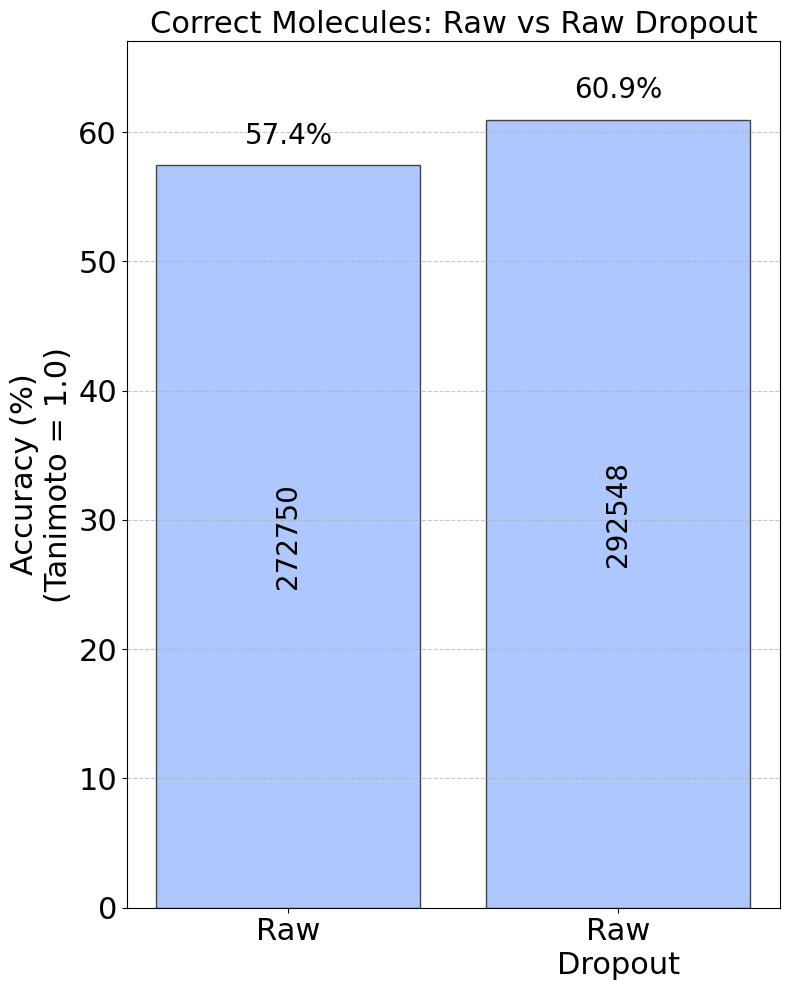


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/1.0_Raw_vs_Dropout_Correct_Molecules.png

Summary Statistics:
Raw            : 272750/474926 ( 57.4%)
Raw
Dropout    : 292548/480097 ( 60.9%)

Correct molecules comparison completed!


In [2]:
import pickle
import os
import numpy as np
import matplotlib.pyplot as plt

# Load the data files
file_path_1bi = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1bi.pkl")
with open(file_path_1bi, 'rb') as file:
    results_dict_1bi = pickle.load(file)
    
file_path_1ci = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1ci.pkl")
with open(file_path_1ci, 'rb') as file:
    results_dict_1ci = pickle.load(file)

print("Loading Raw and Raw Dropout experiments...")

# Extract Tanimoto data and calculate correct molecules (Tanimoto = 1.0)
datasets = [results_dict_1bi, results_dict_1ci]
labels = ['Raw', 'Raw\nDropout']

correct_counts = []
total_counts = []
accuracy_percentages = []

for i, (dataset, label) in enumerate(zip(datasets, labels)):
    print(f"Processing {label}...")
    
    # Get Tanimoto similarity data
    tanimoto_sim = dataset.get("tanimoto_sim", [])
    
    if len(tanimoto_sim) > 0:
        # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
        correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
        total_count = len(tanimoto_sim)
        accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
        
        correct_counts.append(correct_count)
        total_counts.append(total_count)
        accuracy_percentages.append(accuracy_percentage)
        
        print(f"  - Total molecules: {total_count}")
        print(f"  - Correct molecules: {correct_count}")
        print(f"  - Accuracy: {accuracy_percentage:.1f}%")
    else:
        print(f"  - No Tanimoto data found for {label}")

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 10))

# Define positions for the bars
positions = np.arange(len(labels))

# Use blue color for both bars
color = "#8CB0FE"

# Create bars with percentages
bars = ax.bar(positions, accuracy_percentages, color=color, alpha=0.7, edgecolor='black', linewidth=1)

# Add absolute count labels inside the bars - black, non-bold, vertical
for i, (pos, percentage, count, total) in enumerate(zip(positions, accuracy_percentages, correct_counts, total_counts)):
    ax.text(pos, percentage / 2, f'{count}', 
            rotation=90, ha='center', va='center', fontsize=20, color='black')

# Add percentage labels on top of bars
for i, (pos, percentage) in enumerate(zip(positions, accuracy_percentages)):
    ax.text(pos, percentage + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=20, color='black')

# Customizing the axes and labels
ax.set_ylabel('Accuracy (%)\n(Tanimoto = 1.0)', fontsize=22)
ax.set_title('Correct Molecules: Raw vs Raw Dropout', fontsize=22)

# Set x-ticks
ax.set_xticks(positions)
ax.set_xticklabels(labels, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)

# Add grid
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, max(accuracy_percentages) * 1.1)  # Add some space at the top

plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/1.0_Raw_vs_Dropout_Correct_Molecules.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*50)
for label, correct, total, percentage in zip(labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nCorrect molecules comparison completed!")

### 1.1 Run IBM Benchmarking

In [7]:
config.csv_1H_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
df = pd.read_csv(config.csv_1H_path_SGNN )
df

ERROR! Session/line number was not unique in database. History logging moved to new session 1534


,SMILES,shifts,sample-id
0,CN=C(N)NC(C)C(C)C,"[(0.8462862000000001, 1.5), (0.848669930000000...",IBM000007
1,CC1(CC(=O)O)CCCC(=O)C1,"[(1.1961193, 3), (1.7972641, 0.5), (1.8047166,...",IBM000008
2,CC1CC2Cc3ccccc3N2C1,"[(1.1720793, 1.5), (1.1873293, 1.5), (2.246551...",IBM000015
3,CN=C(N)C=C(N)CO,"[(2.5271945, 3), (4.0213556, 2), (4.6203794, 1)]",IBM000037
4,CC1(C)CCC2NCCCC2O1,"[(1.1951302, 3), (1.2162107, 3), (1.4378607, 0...",IBM000053
...,...,...,...
63353,COc1sc(CBr)cc1Br,"[(3.8887599, 3), (4.3800745, 2), (6.8712697, 1)]",IBM634518
63354,Cn1nccc1CCC(Br)C1CC1,"[(0.5023335999999999, 0.023809523809523808), (...",IBM634541
63355,Cc1cc(Br)ccc1OCCS,"[(1.7156170000000002, 0.5), (1.731367, 1.0), (...",IBM634554
63356,CC(C)(C)Cc1ccc(Br)cc1,"[(0.8859767, 3), (0.88686246, 3), (0.9034024, ...",IBM634574


In [ ]:
# IBM Data
config.csv_1H_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
config.csv_13C_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_13C_837154_test.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_HSQC_837154_test.csv') 
config.csv_COSY_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_COSY_837154_test.csv') 
config.csv_path_val = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
config.pickle_file_path = ""
config.IR_data_folder = os.path.abspath('./data/IBM_dataset/IBM_ir_sim') 
config.data_size = 63357 

config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/MMST_all_IBM_v2/model-epoch=19-loss=0.0534.ckpt")
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")


Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/IBM_dataset/IBM_data_1H_837154_test_351550.pkl
Pickle saved.


In [10]:
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1bi, results_dict_1bi = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1bi["tanimoto_sim"]))

# Save the data to a file
file_prob_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.0_prob_dict_results_IBM.pkl')
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1bi, file)
    
# Save the data to a file
file_results_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.1_results_dict_IBM.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1bi, file)

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Vi

KeyError: 'tanimoto_sim'

In [19]:
import os
import pickle
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from collections import defaultdict
from utils_MMT.mmt_result_test_functions_15_4 import run_precentage_calculation_v2

def calc_percentage_and_count_top_x_correct_greedy_ibm(results_dict):
    # Check if results_dict is a dictionary
    if not isinstance(results_dict, dict):
        print(f"Warning: results_dict_greedy is not a dictionary, it's a {type(results_dict)}")
        return 0, 0, 0
        
    count_yes = 0
    count_no = 0
    
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            if isinstance(result, dict) and "tanimoto_sim" in result:
                tanimoto_values = result["tanimoto_sim"]
                # Convert tensor to numpy if needed
                if torch.is_tensor(tanimoto_values):
                    tanimoto_values = tanimoto_values.cpu().numpy()
                
                # Handle both single values and arrays
                if hasattr(tanimoto_values, '__iter__'):
                    for i in tanimoto_values:
                        if i == 1:
                            count_yes += 1
                        else:
                            count_no += 1
                else:
                    # Handle single value
                    if tanimoto_values == 1:
                        count_yes += 1
                    else:
                        count_no += 1

    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total

def calc_percentage_and_count_top_x_correct_ibm(results_dict, top_x):
    # Check if results_dict is a dictionary
    if not isinstance(results_dict, dict):
        print(f"Warning: results_dict is not a dictionary, it's a {type(results_dict)}")
        return 0, 0, 0
        
    count_yes = 0
    count_no = 0
    
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            if isinstance(result, dict) and "tanimoto_sim" in result:
                tanimoto_sim = result["tanimoto_sim"]
                # Convert tensor to numpy if needed
                if torch.is_tensor(tanimoto_sim):
                    tanimoto_sim = tanimoto_sim.cpu().numpy()
                
                # Handle both single values and arrays
                if hasattr(tanimoto_sim, '__iter__'):
                    # Take only top_x elements
                    tanimoto_sim = tanimoto_sim[:top_x]
                    
                    if 1 in tanimoto_sim:
                        count_yes += 1
                    else:
                        count_no += 1
                else:
                    # Handle single value
                    if tanimoto_sim == 1:
                        count_yes += 1
                    else:
                        count_no += 1
                    
    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total

def prepare_ibm_data(results_dict_mns_10, results_dict_greedy):
    # Check the structure of results before processing
    print(f"Type of results_dict_mns_10: {type(results_dict_mns_10)}")
    print(f"Type of results_dict_greedy: {type(results_dict_greedy)}")
    
    # For greedy results, we need to handle differently based on what run_precentage_calculation_v2 returns
    if isinstance(results_dict_greedy, dict):
        percentage_greedy, count_greedy, total_greedy = calc_percentage_and_count_top_x_correct_greedy_ibm(results_dict_greedy)
    else:
        # If it's a float (which seems to be the case from the error), use it directly
        percentage_greedy = float(results_dict_greedy) * 100 if results_dict_greedy is not None else 0
        count_greedy = 0  # We don't have count information in this case
        total_greedy = 0
    
    # For multinomial results
    if isinstance(results_dict_mns_10, dict):
        percentage_top_1, count_top_1, total_1 = calc_percentage_and_count_top_x_correct_ibm(results_dict_mns_10, 1)
        percentage_top_3, count_top_3, total_3 = calc_percentage_and_count_top_x_correct_ibm(results_dict_mns_10, 3)
        percentage_top_5, count_top_5, total_5 = calc_percentage_and_count_top_x_correct_ibm(results_dict_mns_10, 5)
        percentage_top_10, count_top_10, total_10 = calc_percentage_and_count_top_x_correct_ibm(results_dict_mns_10, 10)
    else:
        # If it's not a dictionary, use percentage_collection values directly
        percentage_top_1 = percentage_collection_IBM_MW[1] * 100 if percentage_collection_IBM_MW is not None and len(percentage_collection_IBM_MW) > 1 else 0
        percentage_top_3 = percentage_collection_IBM_MW[2] * 100 if percentage_collection_IBM_MW is not None and len(percentage_collection_IBM_MW) > 2 else 0
        percentage_top_5 = percentage_collection_IBM_MW[3] * 100 if percentage_collection_IBM_MW is not None and len(percentage_collection_IBM_MW) > 3 else 0
        percentage_top_10 = percentage_collection_IBM_MW[4] * 100 if percentage_collection_IBM_MW is not None and len(percentage_collection_IBM_MW) > 4 else 0
        count_top_1 = count_top_3 = count_top_5 = count_top_10 = 0
        total_1 = total_3 = total_5 = total_10 = 0
    
    ibm_data = [(percentage_greedy, count_greedy, total_greedy), 
                (percentage_top_1, count_top_1, total_1),
                (percentage_top_3, count_top_3, total_3), 
                (percentage_top_5, count_top_5, total_5),
                (percentage_top_10, count_top_10, total_10)]
    
    return ibm_data



def plot_ibm_results(ibm_data, filter_name="MW Filter"):
    labels = ['Greedy', '1 Sample', '3 Samples', '5 Samples', '10 Samples']
    x = np.arange(len(labels))
    width = 0.6  # Wider bar since we only have one category
    color = '#FFB381'  # Using the MW filter color from your original code
    
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Plot bars
    rects = ax.bar(x, [d[0] for d in ibm_data], width, label=f'IBM with {filter_name}', color=color)

    # Set labels and title with larger font sizes
    ax.set_ylabel('Percentage', fontsize=30)
    ax.set_title(f'IBM Model Performance with {filter_name}', fontsize=30)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=30)
    ax.legend(fontsize=30)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_ylim(0, 100)  # Full scale from 0-100%

    # Function to add annotations to the bars
    def autolabel(rects, data):
        for rect, (percentage, count, total) in zip(rects, data):
            height = rect.get_height()
            
            # Add percentage on top of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, height + 2, f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20, rotation=0)
            
            # Add count/total in the middle of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, height / 2, f'{count}/{total}',
                    ha='center', va='center', fontsize=20, rotation=0)

    # Add annotations to each bar
    autolabel(rects, ibm_data)

    fig.tight_layout()
    plt.savefig(os.path.abspath(f'./IBM_experiment_results/IBM_performance_{filter_name.replace(" ", "_").lower()}.png'))
    plt.show()

def plot_violin_probability(results_dict, filter_name="MW Filter"):
    fig, ax = plt.subplots(figsize=(8, 10))
    data_for_violin = []

    # Process data for violin plot with tensor handling
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            if "aggregated_corr_prob_multi" in result:
                # Handle tensor if present
                if torch.is_tensor(result["aggregated_corr_prob_multi"]):
                    data_for_violin.append(result["aggregated_corr_prob_multi"].cpu().numpy())
                else:
                    data_for_violin.append(result["aggregated_corr_prob_multi"])
            elif "prob_list" in result:
                # Handle tensor if present
                if torch.is_tensor(result["prob_list"]):
                    data_for_violin.append(result["prob_list"].cpu().numpy())
                else:
                    data_for_violin.append(result["prob_list"])

    parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

    # Customizing colors
    color = "#8CB0FE"
    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

    # Customizing the axes and labels
    ax.set_title(f'IBM: Correct SMILES Sample Probability ({filter_name})', fontsize=22)
    ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
    ax.set_xticks([1])
    ax.set_xticklabels(['IBM Model'], fontsize=22)
    ax.tick_params(axis='both', which='major', labelsize=22)

    # Calculate mean safely
    mean_values = []
    for data in data_for_violin:
        if len(data) > 0:
            mean_values.append(np.mean(data))
            
    if mean_values:
        mean_value = np.mean(mean_values)
        ax.text(1, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

    # Add grid and set the limits
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 1)

    plt.tight_layout()
    save_path = os.path.join(results_dir, f'IBM_Violin_Prob_{filter_name.replace(" ", "_")}.png')
    plt.savefig(save_path)
    plt.show()

def plot_violin_tanimoto(results_dict, filter_name="MW Filter"):
    fig, ax = plt.subplots(figsize=(8, 10))
    data_for_violin = []

    # Process tanimoto similarity data with tensor handling
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            if "tanimoto_sim" in result:
                # Handle tensor if present
                if torch.is_tensor(result["tanimoto_sim"]):
                    data_for_violin.append(result["tanimoto_sim"].cpu().numpy())
                else:
                    data_for_violin.append(result["tanimoto_sim"])

    parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

    # Customizing colors
    color = "#8CB0FE"
    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

    # Customizing the axes and labels
    ax.set_title(f'IBM: Greedy Sampled Average Tanimoto Similarity ({filter_name})', fontsize=22)
    ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
    ax.set_xticks([1])
    ax.set_xticklabels(['IBM Model'], fontsize=22)
    ax.tick_params(axis='both', which='major', labelsize=22)

    # Calculate mean safely
    mean_values = []
    for data in data_for_violin:
        if len(data) > 0:
            mean_values.append(np.mean(data))
            
    if mean_values:
        mean_value = np.mean(mean_values)
        ax.text(1, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

    # Add grid and set the limits
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 1)

    plt.tight_layout()
    save_path = os.path.join(results_dir, f'IBM_Tanimoto_Violin_{filter_name.replace(" ", "_")}.png')
    plt.savefig(save_path)
    plt.show()

def plot_invalid_smiles(results_dict, filter_name="MW Filter"):
    fig, ax = plt.subplots(figsize=(8, 10))
    failed_count = 0
    total_entries = 0

    # Count failed and total entries
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            if "failed" in result and "gen_conv_SMI_list" in result:
                # Handle tensor if present
                if torch.is_tensor(result["failed"]):
                    failed_count += len(result["failed"].cpu().numpy())
                else:
                    failed_count += len(result["failed"])
                    
                # Handle tensor if present
                if torch.is_tensor(result["gen_conv_SMI_list"]):
                    total_entries += len(result["gen_conv_SMI_list"].cpu().numpy())
                else:
                    total_entries += len(result["gen_conv_SMI_list"])

    percentage = (failed_count / total_entries) * 100 if total_entries > 0 else 0
    color = "#8CB0FE"

    # Plotting the bar
    bar = ax.bar([0], [failed_count], width=0.35, color=color, edgecolor='black')

    # Adding value labels inside and percentage on top of each bar
    ax.text(0, failed_count / 2, f'{percentage:.1f}%', 
            rotation=90, ha='center', va='center', fontsize=22)

    # Set the title and labels
    ax.set_title(f'IBM: Greedy Sampled Number of Invalid SMILES ({filter_name})', fontsize=22)
    ax.set_ylabel('Invalid Molecules', fontsize=22)
    ax.set_xticks([0])
    ax.set_xticklabels(['IBM Model'], fontsize=22)
    ax.tick_params(axis='both', which='major', labelsize=22)

    # Adding grid lines for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Set y-limit slightly higher than max for label visibility
    ax.set_ylim(0, failed_count * 1.25 if failed_count > 0 else 1)

    plt.tight_layout()
    save_path = os.path.join(results_dir, f'IBM_Invalid_molecules_{filter_name.replace(" ", "_")}.png')
    plt.savefig(save_path)
    plt.show()
    
def run_ibm_experiment(mw_filter=True, mf_filter=False, data_size=10):
    # Configure paths for IBM dataset
    config.csv_1H_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
    config.csv_13C_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_13C_837154_test.csv')    
    config.csv_HSQC_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_HSQC_837154_test.csv') 
    config.csv_COSY_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_COSY_837154_test.csv') 
    config.csv_path_val = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
    config.pickle_file_path = ""
    config.IR_data_folder = os.path.abspath('./data/IBM_dataset/IBM_ir_sim') 
    config.data_size = data_size
    
    config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/MMST_all_IBM_v2/model-epoch=19-loss=0.0534.ckpt")
    config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" 
    config.temperature = 1
    config.multinom_runs = 10
    
    # Create filter string for file naming
    mw_str = "TRUE" if mw_filter else "FALSE"
    mf_str = "TRUE" if mf_filter else "FALSE"
    filter_str = f"{mw_str}_{mf_str}"
    
    # Create results directory
    results_dir = os.path.abspath('./IBM_experiment_results')
    os.makedirs(results_dir, exist_ok=True)
    
    # Determine filter description for plot titles
    if mw_filter and mf_filter:
        filter_desc = "MW+MF Filters"
    elif mw_filter:
        filter_desc = "MW Filter"
    elif mf_filter:
        filter_desc = "MF Filter"
    else:
        filter_desc = "No Filters"
    
    # Run the experiment
    print(f"Running IBM experiment with MW_filter={mw_filter}, MF_filter={mf_filter}")
    percentage_collection, results_dict_mns_10, results_dict_greedy = run_precentage_calculation_v2(
        config, itos, stoi, stoi_MF, MW_filter=mw_filter, MF_filter=mf_filter
    )
    
    # Print the types of the returned values to help debug
    print(f"Type of percentage_collection: {type(percentage_collection)}")
    print(f"Type of results_dict_mns_10: {type(results_dict_mns_10)}")
    print(f"Type of results_dict_greedy: {type(results_dict_greedy)}")
    
    # Save the results
    file_path = os.path.join(results_dir, f'IBM_results_dict_greedy_{filter_str}.pkl')
    with open(file_path, 'wb') as file:
        pickle.dump(results_dict_greedy, file)
    
    file_path = os.path.join(results_dir, f'IBM_results_dict_mns_10_{filter_str}.pkl')
    with open(file_path, 'wb') as file:
        pickle.dump(results_dict_mns_10, file)
    
    file_path = os.path.join(results_dir, f'IBM_percentage_collection_{filter_str}.pkl')
    with open(file_path, 'wb') as file:
        pickle.dump(percentage_collection, file)
    
    # Print results
    print(f"Experiment Results ({filter_desc}):")
    print(f"Greedy sampling accuracy: {percentage_collection[0]:.4f}")
    print(f"Top-1 accuracy: {percentage_collection[1]:.4f}")
    print(f"Top-3 accuracy: {percentage_collection[2]:.4f}")
    print(f"Top-5 accuracy: {percentage_collection[3]:.4f}")
    print(f"Top-10 accuracy: {percentage_collection[4]:.4f}")
    
    # Create bar chart visualization using percentage_collection directly
    labels = ['Greedy', '1 Sample', '3 Samples', '5 Samples', '10 Samples']
    x = np.arange(len(labels))
    width = 0.6
    color = '#FFB381'
    
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Plot bars using percentage_collection values directly
    percentages = [p * 100 for p in percentage_collection]  # Convert to percentages
    rects = ax.bar(x, percentages, width, label=f'IBM with {filter_desc}', color=color)

    # Set labels and title with larger font sizes
    ax.set_ylabel('Percentage', fontsize=30)
    ax.set_title(f'IBM Model Performance with {filter_desc}', fontsize=30)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=30)
    ax.legend(fontsize=30)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_ylim(0, 100)

    # Add percentage annotations
    for i, rect in enumerate(rects):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width() / 2, height + 2, 
                f'{percentages[i]:.1f}%',
                ha='center', va='bottom', fontsize=20)

    fig.tight_layout()
    plt.savefig(os.path.abspath(f'./IBM_experiment_results/IBM_performance_{filter_desc.replace(" ", "_").lower()}.png'))
    plt.show()
    """
    # Skip the other visualizations if we don't have the right data structure
    if isinstance(results_dict_mns_10, dict):
        # Violin plot for correct SMILES sample probability
        plot_violin_probability(results_dict_mns_10, filter_desc)
    
    if isinstance(results_dict_greedy, dict):
        # Violin plot for Tanimoto similarity
        plot_violin_tanimoto(results_dict_greedy, filter_desc)
        
        # Bar chart for invalid SMILES count
        plot_invalid_smiles(results_dict_greedy, filter_desc)
    """
    return percentage_collection, results_dict_mns_10, results_dict_greedy

# Execute the experiment with MW filter enabled
percentage_collection_IBM_MW, results_dict_mns_10_IBM_MW, results_dict_greedy_IBM_MW = run_ibm_experiment(
    mw_filter=True,
    mf_filter=False,
    data_size=63357  # Set to your desired data size (10 for testing, larger for full experiment)
)

# If you want to run with different filter settings, uncomment the relevant lines:
# Run with no filters
# percentage_collection_IBM_NONE, results_dict_mns_10_IBM_NONE, results_dict_greedy_IBM_NONE = run_ibm_experiment(
#     mw_filter=False,
#     mf_filter=False,
#     data_size=10
# )

# Run with MF filter only
# percentage_collection_IBM_MF, results_dict_mns_10_IBM_MF, results_dict_greedy_IBM_MF = run_ibm_experiment(
#     mw_filter=False,
#     mf_filter=True,
#     data_size=10
# )

# Run with both MW and MF filters
# percentage_collection_IBM_BOTH, results_dict_mns_10_IBM_BOTH, results_dict_greedy_IBM_BOTH = run_ibm_experiment(
#     mw_filter=True,
#     mf_filter=True,
#     data_size=10
# )

60915it [69:47:33,  4.63s/it]

BrC1=CC2SCC=C2C(Br)=C1


60916it [69:47:39,  4.93s/it]

C=CCC(O)c1c(Br)cncc1Br


60917it [69:47:44,  4.84s/it]

BrC1=C(Br)c2cc(Br)c(Br)cc21


60918it [69:47:48,  4.77s/it]

CCCC1(CBr)CCOC1C


60919it [69:47:53,  4.73s/it]

ONc1ncc(Br)cc1Br


60920it [69:47:58,  4.70s/it]

N#Cc1cn2c(N)ncc(Br)c2n1
60920


60921it [69:48:02,  4.68s/it]

NCC(O)c1cccc(CBr)c1


60922it [69:48:07,  4.83s/it]

CCC(Br)CCc1ncnn1C


60923it [69:48:12,  4.77s/it]

C=CCCC=CCBr


60924it [69:48:17,  4.73s/it]

C=CCCC(O)(CCC=C)C(Br)Br


60925it [69:48:21,  4.70s/it]

Cc1cc(C(N)C(=O)O)ncc1Br


60926it [69:48:26,  4.69s/it]

CCN(C)c1nc(N)cc(Br)n1


60927it [69:48:31,  4.66s/it]

CC(C)CC(O)c1coc(Br)c1


60928it [69:48:35,  4.66s/it]

O=C(O)CC(CC(=O)O)=NCCBr


60929it [69:48:41,  4.91s/it]

CN(C)CCn1cc(Br)ccc1=O


60930it [69:48:45,  4.84s/it]

Oc1c(I)ccc2cc(Br)ccc12
60930


60931it [69:48:50,  4.77s/it]

CCNCCOCCCBr


60932it [69:48:55,  4.73s/it]

Oc1ccc(CCCBr)c(O)c1O


60933it [69:48:59,  4.70s/it]

CC(CC=CO)CCC(Br)Br


60934it [69:49:04,  4.69s/it]

NN=C(N)SCc1sccc1Br


60935it [69:49:09,  4.67s/it]

CC1(CNC(=O)C(C)(C)Br)CC1


60936it [69:49:13,  4.66s/it]

NCc1cnccc1Br


60937it [69:49:18,  4.66s/it]

CC(C)(C)c1ncc(Br)c(N)c1Br


60938it [69:49:22,  4.65s/it]

CC(C)CC(=O)c1cscc1Br


60939it [69:49:27,  4.65s/it]

Cc1cc(Br)cc(C(C)(C)C)c1


60940it [69:49:32,  4.64s/it]

COCC(CBr)CCBr
60940


60941it [69:49:36,  4.64s/it]

Nc1cnc(Br)c(OC2CC2)c1


60942it [69:49:42,  4.88s/it]

COCCc1cc(C#N)ccc1Br


60943it [69:49:47,  4.84s/it]

CC(=C(C(C)C)C(Br)Br)C(C)C


60944it [69:49:51,  4.77s/it]

CC#CCC(NC)c1ccc(Br)s1


60945it [69:49:56,  4.73s/it]

CC1Oc2ccc(Br)cc2N1C


60946it [69:50:00,  4.70s/it]

CC(C)=CCN1CCC(Br)C1(C)C


60947it [69:50:05,  4.68s/it]

CCOC(C)CC(C)(C)C(C)CBr


60948it [69:50:10,  4.83s/it]

C=C(C)C=C(OC)C(=C)Br


60949it [69:50:15,  4.77s/it]

O=C1CCC(=O)C(CCBr)C1


60950it [69:50:20,  4.73s/it]

CC(=O)CCSc1cccc(Br)c1
60950


60951it [69:50:24,  4.71s/it]

CCOC(=N)CCCCBr


60952it [69:50:29,  4.68s/it]

BrC1(c2cncnc2)N=CC=CN1


60953it [69:50:33,  4.66s/it]

CC(C)(C)C#Cc1cccc(Br)c1


60954it [69:50:38,  4.66s/it]

OC1CCn2c(Br)cnc2C1


60955it [69:50:43,  4.65s/it]

Oc1cccc(S)c1Br


60956it [69:50:48,  4.90s/it]

CCCC(C)=CCCC(C)=CCBr


60957it [69:50:53,  4.82s/it]

C=CCCC1(CBr)CC(C)CO1


60958it [69:50:57,  4.76s/it]

NCC(=O)CCc1ccccc1Br


60959it [69:51:02,  4.72s/it]

COc1cc(Br)cn2c(N)cnc12


60960it [69:51:07,  4.70s/it]

C=CC=C(Br)C(O)=CC
60960


60961it [69:51:11,  4.68s/it]

O=C(O)C1CC1CC(Br)(Br)Br


60962it [69:51:16,  4.67s/it]

CC(C)(C)n1cc(Br)c(Br)n1


60964it [69:51:25,  4.65s/it]

CC(=O)CNc1ccccc1Br


60965it [69:51:30,  4.64s/it]

Cn1nc2c(N)cccc2c1Br


60966it [69:51:35,  4.64s/it]

C=C(Br)CNCCC


60967it [69:51:39,  4.64s/it]

CCCCCCC(Br)C=CC(C)Br


60968it [69:51:44,  4.64s/it]

O=C(O)c1cc(Br)cc2ncnn12


60969it [69:51:49,  4.90s/it]

CCC(Br)(C=O)OCC(C)O


60970it [69:51:54,  4.83s/it]

NC(c1ccoc1)c1sccc1Br
60970


60971it [69:51:59,  4.77s/it]

Cn1nc(Br)cc1C(=N)N


60972it [69:52:03,  4.73s/it]

OC1(CCc2ncc(Br)cn2)CC1


60973it [69:52:08,  4.87s/it]

CCCCc1cc(C)cc(Br)c1O


60974it [69:52:13,  4.79s/it]

Cc1cc(O)ccc1CC(=O)CBr


60975it [69:52:18,  4.75s/it]

CC(C)(N)Cc1ccc(Br)cc1O


60976it [69:52:22,  4.71s/it]

CC#CCN(C)Cc1cc(Br)no1


60977it [69:52:27,  4.69s/it]

Cc1cc(C(=O)O)cc(C(Br)Br)c1


60978it [69:52:32,  4.67s/it]

CCCC#COCCCCCCBr


60979it [69:52:36,  4.66s/it]

CC(Br)C(=O)CS(C)(C)CC(=O)O


60980it [69:52:41,  4.65s/it]

CC(=O)c1cnc2ncc(Br)cn12
60980


60981it [69:52:45,  4.64s/it]

Cc1ccn2c(=O)c(Br)ccc2c1


60982it [69:52:51,  4.91s/it]

OC1CCC(n2nccc2Br)C1


60983it [69:52:56,  4.83s/it]

CC(CC=O)c1ccc(O)cc1Br


60984it [69:53:00,  4.77s/it]

CCCC(Br)CCCCCSC


60985it [69:53:05,  4.73s/it]

CC(C)=CC(=O)OBr


60986it [69:53:10,  4.70s/it]

COOC(CBr)OOC


60987it [69:53:14,  4.68s/it]

N#Cc1cccc(C(=O)CBr)n1


60988it [69:53:19,  4.67s/it]

CCc1c(C=O)ccc(Br)c1N


60989it [69:53:23,  4.65s/it]

CCCC(C)(O)CC(C)Br


60990it [69:53:28,  4.65s/it]

CC(C)(C)c1nc(Br)cc(Br)n1
60990


60991it [69:53:33,  4.64s/it]

CCc1cc(N)c(C(C)=O)cc1Br


60992it [69:53:37,  4.64s/it]

O=C(O)Oc1cncc(Br)c1


60993it [69:53:42,  4.64s/it]

COc1cc(Br)cc2c1CCC2N


60994it [69:53:47,  4.64s/it]

NCC1CCCC1Br


60995it [69:53:51,  4.64s/it]

CCC1(CBr)CCCO1


60996it [69:53:57,  4.89s/it]

N#COSCC(I)=C(Br)I


60997it [69:54:01,  4.82s/it]

CN(c1nnc(Br)s1)C(C)(C)CO


60998it [69:54:06,  4.76s/it]

Cc1cc(C)c(NC(C)C)c(Br)c1


60999it [69:54:11,  4.88s/it]

C=CCc1ccc(Br)c(O)c1


61000it [69:54:16,  4.80s/it]

Cc1ccc(C2(CBr)CCC2)s1
61000


61001it [69:54:20,  4.75s/it]

C#Cc1nc(N)nc2c(Br)csc12


61002it [69:54:25,  4.72s/it]

C=Cc1cc(Br)c(Br)c(Br)c1


61003it [69:54:30,  4.69s/it]

CC1CCC(C=CCCBr)CC1


61004it [69:54:34,  4.68s/it]

COC(OC)C(Br)CC(Br)(Br)Br


61005it [69:54:39,  4.66s/it]

COc1ccc(C(N)O)cc1Br


61006it [69:54:44,  4.65s/it]

CCNC(C)c1ccc(C)cc1Br


61007it [69:54:48,  4.65s/it]

CC1(C(Br)Br)C=CC=CC1=O


61008it [69:54:53,  4.64s/it]

N#Cc1ccc(Br)c(CCO)c1


61009it [69:54:58,  4.90s/it]

COC(C)(OC)c1ccccc1Br


61010it [69:55:03,  4.82s/it]

Oc1c2c(c(O)n1Br)CCCC2
61010


61011it [69:55:08,  4.76s/it]

CC(=O)C(Br)C(=O)CCP


61012it [69:55:12,  4.72s/it]

COc1ccc(C(S)CN)cc1Br


61013it [69:55:17,  4.70s/it]

CCCCc1nc(Br)sc1C


61014it [69:55:22,  4.67s/it]

CCC(=O)c1c(Br)cccc1C=O


61015it [69:55:26,  4.66s/it]

CN1CC(=O)c2oc(Br)cc21


61016it [69:55:31,  4.66s/it]

CCc1c(Br)cc(C#N)n1C(C)C


61017it [69:55:35,  4.65s/it]

O=C1SCCN1CC1(CBr)CC1


61018it [69:55:40,  4.64s/it]

COC(=O)C(CCCCCBr)=NO


61019it [69:55:45,  4.64s/it]

Cc1cc(Br)cc2c1OCCCN2


61020it [69:55:49,  4.64s/it]

NC1=CC=CC2=C(Br)C=CCC12
61020


61021it [69:55:54,  4.64s/it]

O=Cc1nc(Br)n2ccccc12


61022it [69:55:59,  4.91s/it]

Nc1cc(C(N)CO)ccc1Br


61023it [69:56:04,  4.83s/it]

BrCC=C=CCBr


61024it [69:56:09,  4.77s/it]

COCCCNCCCCBr


61025it [69:56:14,  4.91s/it]

C=C1CC(C(C)C)CC1CBr


61026it [69:56:19,  4.83s/it]

Brc1nnc2n1CCC2


61027it [69:56:23,  4.77s/it]

CCc1cc(C)cc(Br)c1O


61028it [69:56:28,  4.73s/it]

C=CCC(O)c1cc(I)ccc1Br


61029it [69:56:33,  4.70s/it]

Cn1ccnc1CC1CCCC1Br


61030it [69:56:37,  4.68s/it]

CC(C)c1nnc(CBr)n1C1CC1
61030


61031it [69:56:42,  4.67s/it]

CNC(=S)Sc1ccc(Br)cc1


61032it [69:56:46,  4.66s/it]

NC(CO)Cc1cccnc1Br


61033it [69:56:51,  4.65s/it]

C=C(Br)CNCc1cnccc1C


61034it [69:56:56,  4.65s/it]

O=C1CSNc2ccc(Br)cc21


61035it [69:57:00,  4.65s/it]

COc1nc(Br)c2n1CCCC2


61036it [69:57:06,  4.92s/it]

C=CCC(OCC)C(C)Br


61037it [69:57:11,  4.84s/it]

O=C(C1CC1)C(Br)C1CC1


61038it [69:57:15,  4.77s/it]

Cc1ccc2c(c1I)C(Br)CCN2


61039it [69:57:20,  4.74s/it]

COCCn1cc(Br)cn1


61040it [69:57:24,  4.70s/it]

N#CC(NCCN)=C(O)Br
61040


61041it [69:57:29,  4.68s/it]

O=C1NCCOc2cnc(Br)cc21


61042it [69:57:34,  4.66s/it]

Cc1nc2c(C)sc(Br)c2s1


61043it [69:57:38,  4.66s/it]

O=C1NC(=O)C(CC=CBr)C(=O)N1


61044it [69:57:43,  4.65s/it]

BrCC#Cc1cccnc1


61045it [69:57:48,  4.65s/it]

CCC(CBr)CCCOC


61046it [69:57:52,  4.64s/it]

O=C(O)CC(=O)C=C(Br)Br


61047it [69:57:57,  4.64s/it]

O=Cc1cc2cc(Br)ncc2cn1


61048it [69:58:02,  4.64s/it]

C=C(OC)c1ccc(CCBr)cc1


61049it [69:58:07,  4.89s/it]

CC(C)COCCCC(Br)C(C)C


61050it [69:58:12,  4.98s/it]

C=C(CBr)CC(Br)=C(C)C
61050


61051it [69:58:17,  4.88s/it]

CC(C)(C)CC(=S)Br


61052it [69:58:21,  4.80s/it]

C#CC(OC)OC(C)(C)CBr


61053it [69:58:26,  4.74s/it]

CC(Oc1ccc(Br)cn1)C(=O)O


61054it [69:58:31,  4.72s/it]

N#CCNCc1cccnc1Br


61055it [69:58:35,  4.69s/it]

CC(C)N1CC(NC(=O)C#CBr)C1


61056it [69:58:40,  4.67s/it]

CCC(C)N1CC(C)OC(CBr)C1


61057it [69:58:45,  4.66s/it]

O=CCCc1c(Br)cccc1CBr


61058it [69:58:49,  4.65s/it]

COCOc1cc(I)ccc1Br


61059it [69:58:54,  4.65s/it]

BrC1=CNC(Br)C=C1


61060it [69:58:59,  4.65s/it]

CC(C)(Br)C(=O)c1cccc(I)c1
61060


61061it [69:59:03,  4.64s/it]

CCc1cccc(CC)c1Br


61062it [69:59:09,  4.90s/it]

COC(=O)c1nnsc1CBr


61063it [69:59:13,  4.83s/it]

C=C(C)C(N)c1c(Br)nnn1C


61064it [69:59:18,  4.77s/it]

COC1=NCN(C#N)C=C1Br


61065it [69:59:23,  4.73s/it]

Brc1cnc2c(c1)N=C(C1CC1)C2


61066it [69:59:27,  4.70s/it]

CNCc1cccn2nc(Br)nc12


61067it [69:59:32,  4.68s/it]

CC(=O)Cc1c(C#N)csc1Br


61068it [69:59:36,  4.67s/it]

Brc1cocc1C1CCOCC1


61069it [69:59:41,  4.66s/it]

CC(C)CCCc1ncn(C)c1Br


61070it [69:59:46,  4.65s/it]

NCc1ncc(Br)cc1Br
61070


61071it [69:59:50,  4.65s/it]

CC1(C)CCCC(Br)(C#N)C1


61072it [69:59:55,  4.65s/it]

CN1CCc2sc(Br)cc2N1C


61073it [70:00:00,  4.65s/it]

CC(C)c1nc(Br)c(CC#N)n1C


61074it [70:00:04,  4.65s/it]

CC(c1ncc(Br)s1)N(C)C1CC1


61075it [70:00:09,  4.64s/it]

CC1=CCCC(C)(C)CC(=O)C1Br


61076it [70:00:15,  5.08s/it]

CCn1nnc(Br)c1Br


61077it [70:00:20,  4.94s/it]

O=C(O)c1ccn2cnc(Br)c2c1


61078it [70:00:24,  4.85s/it]

N#Cc1ccc(CBr)c(C=O)c1


61079it [70:00:29,  4.79s/it]

Cn1ncc(C2C(CBr)C2(C)C)n1


61080it [70:00:34,  4.74s/it]

CC(Br)c1ccc2ncccc2c1
61080


61081it [70:00:38,  4.71s/it]

Cc1sc(CC(C)CN)nc1Br


61082it [70:00:43,  4.69s/it]

Cc1c(CN)cc(Br)c2c1OCO2


61083it [70:00:47,  4.67s/it]

CC(CBr)C1CC2(CCC2)C1


61084it [70:00:52,  4.66s/it]

CC(Br)Cc1cccnc1Br


61085it [70:00:57,  4.65s/it]

CCC(=O)c1cc(Br)cc(Br)c1O


61086it [70:01:01,  4.65s/it]

O=C(O)C(=O)c1cscc1Br


61087it [70:01:06,  4.64s/it]

Brc1ccc(C2CN=CN2)cc1


61088it [70:01:11,  4.64s/it]

S=C=NCC1(Br)CCCCC1


61089it [70:01:16,  4.92s/it]

CCOC(=O)c1cnccc1Br


61090it [70:01:21,  4.84s/it]

Brc1ccc(I)cc1CI
61090


61091it [70:01:25,  4.77s/it]

CC(C)(C)C#CCCCCBr


61092it [70:01:30,  4.72s/it]

Cc1cc(O)cc(CNO)c1Br


61093it [70:01:35,  4.70s/it]

CC1CC1(C)CBr


61094it [70:01:39,  4.68s/it]

CC(=O)CC1CCC1Br


61095it [70:01:44,  4.67s/it]

C=C(Br)CCC(C)C(=O)O


61096it [70:01:49,  4.66s/it]

CCNc1cc(Br)ccc1C#N


61097it [70:01:53,  4.65s/it]

CSc1cc(CC(=O)O)nc(Br)n1


61098it [70:01:58,  4.64s/it]

OC1(Br)NC=Cc2ccccc21


61099it [70:02:03,  4.64s/it]

O=C(CBr)Cc1ccc(S)c(I)c1


61100it [70:02:07,  4.64s/it]

CC1CC(Br)(C#N)CC(C)O1
61100


61101it [70:02:12,  4.64s/it]

CCc1cc(Br)ccc1I


61102it [70:02:18,  5.08s/it]

O=C1C=C(Br)N=CC1


61103it [70:02:23,  4.95s/it]

CNC(C#N)c1cc(Br)cs1


61104it [70:02:27,  4.85s/it]

OC(CBr)CN1CCC2(CC2)C1


61105it [70:02:32,  4.79s/it]

CC(NC(=O)C#CBr)C1CCCO1


61106it [70:02:36,  4.74s/it]

O=Cc1ccc(CO)c(Br)c1O


61107it [70:02:41,  4.71s/it]

Cn1nc(Br)c(C#N)c1N


61108it [70:02:46,  4.68s/it]

Brc1nsc(C2CCCOC2)n1


61109it [70:02:50,  4.67s/it]

NC1(c2sccc2Br)CCCC1


61110it [70:02:55,  4.66s/it]

Cc1cc(O)ccc1CCBr
61110


61111it [70:03:00,  4.65s/it]

COc1nnc(OC)c(C=O)c1Br


61112it [70:03:04,  4.64s/it]

C=CCC(N)c1ccoc1Br


61113it [70:03:09,  4.64s/it]

COC(C)c1c(N)cncc1Br


61114it [70:03:13,  4.64s/it]

C=C(C(=O)OC(C)C)C(C)(Br)Br


61115it [70:03:18,  4.69s/it]

CCCCOc1cccc(Br)c1Br


61116it [70:03:24,  4.88s/it]

C=C(C)CSCc1ccc(Br)cc1


61117it [70:03:28,  4.80s/it]

CC(C)N(C)c1nnc(Br)s1


61118it [70:03:33,  4.76s/it]

COCC(Br)Cc1ncccc1Br


61119it [70:03:38,  4.72s/it]

Brc1ccc(CN2CC=CC2)cc1


61120it [70:03:42,  4.69s/it]

SCc1cscc1Br
61120


61121it [70:03:47,  4.67s/it]

CCCn1ncc2cc(Br)ccc21


61122it [70:03:51,  4.66s/it]

CCc1cc(C)c(N)cc1Br


61123it [70:03:56,  4.65s/it]

OCc1cc2cccc(Br)c2s1


61124it [70:04:01,  4.65s/it]

COC(=O)C1=C2CCC(Br)(CC1)C2


61125it [70:04:05,  4.64s/it]

CC(C)(N)CCc1csc(Br)n1


61126it [70:04:10,  4.65s/it]

CNc1cc(C)c(Br)cn1


61127it [70:04:15,  4.79s/it]

C=C(CBr)c1ccc(Br)cc1C


61128it [70:04:20,  4.75s/it]

COc1cc(Br)cc(OC)c1OC


61129it [70:04:25,  4.98s/it]

N#CC(=NO)c1cccc(Br)c1


61130it [70:04:30,  4.88s/it]

CCOCc1ccc(Br)c(OC)c1
61130


61131it [70:04:35,  4.81s/it]

C#CCSc1ccc(Br)cc1


61132it [70:04:39,  4.76s/it]

Brc1ccc2c(c1)C1CC1CN2


61133it [70:04:44,  4.72s/it]

CCN(CCCCCBr)C1CC1


61134it [70:04:48,  4.69s/it]

C=C(C)C(=O)NCC1CC(Br)C1


61135it [70:04:53,  4.68s/it]

CCOC(=O)c1nc(Br)cnc1C


61136it [70:04:58,  4.66s/it]

CC(C)N(C)c1ccc(CBr)cn1


61137it [70:05:02,  4.65s/it]

NCC1(Sc2ccc(Br)s2)CC1


61138it [70:05:07,  4.65s/it]

COC1=CC(Br)(Br)C(C(C)=O)C=C1


61139it [70:05:12,  4.65s/it]

C=C(Br)CC(C=O)c1ccccc1


61140it [70:05:16,  4.64s/it]

BrCc1cnn(C2CCSC2)c1
61140


61141it [70:05:21,  4.64s/it]

CCOC(=O)C1=CC(CBr)ON1


61142it [70:05:26,  4.91s/it]

S=C1Nc2ccccc2C(=CBr)S1


61143it [70:05:31,  4.83s/it]

CC(C)C1(NC(=O)C#CBr)CC1


61144it [70:05:36,  4.76s/it]

C=CC(C)=NC=C(Br)CC(C)CC


61145it [70:05:40,  4.73s/it]

OS1(O)N=CNc2ccc(Br)cc21


61146it [70:05:45,  4.70s/it]

COC(=O)c1cnc(Br)c(O)c1


61147it [70:05:50,  4.68s/it]

Cc1ccc(C=CBr)c(C)c1


61148it [70:05:54,  4.67s/it]

Brc1csc(I)n1


61149it [70:05:59,  4.65s/it]

CCc1cc(Br)cc(CC(C)N)c1


61150it [70:06:03,  4.65s/it]

CCCC(NC)c1cncc(Br)c1
61150


61151it [70:06:08,  4.65s/it]

C=C(Br)CN1CCC(C)(NC)CC1


61152it [70:06:13,  4.64s/it]

COc1cc(Br)ccc1OC(C)=O


61153it [70:06:18,  4.81s/it]

CSc1onc(CC(=O)O)c1Br


61154it [70:06:23,  4.76s/it]

COc1c(Br)ccc(O)c1C(C)=O


61155it [70:06:28,  4.91s/it]

Brc1cc(Br)cc(C(Br)Br)c1


61156it [70:06:33,  4.90s/it]

COc1nsc(CO)c1Br


61157it [70:06:37,  4.82s/it]

CC(C)(C)c1ncc(C(C)(C)Br)o1


61158it [70:06:42,  4.77s/it]

CCCCCc1sc(Br)c(N)c1C


61159it [70:06:47,  4.72s/it]

CNC(Br)c1ccc(C)cc1C


61160it [70:06:51,  4.70s/it]

CC(C)C(C)NCc1ccc(Br)o1
61160


61161it [70:06:56,  4.68s/it]

CC1CCC(O)=C1Br


61162it [70:07:01,  4.67s/it]

CC1(NC(=O)CCBr)CCCC1


61163it [70:07:05,  4.65s/it]

BrCc1cnc(N2CCCC2)s1


61164it [70:07:10,  4.65s/it]

CNc1ccc(Br)cc1CSC


61165it [70:07:14,  4.65s/it]

CC1CNCCc2ncc(Br)cc21


61166it [70:07:19,  4.64s/it]

C=CCCC(C)(O)c1sccc1Br


61167it [70:07:24,  4.64s/it]

CCC(=Cc1cc(Br)c(Br)o1)CBr


61168it [70:07:28,  4.64s/it]

Brc1cc(Br)c(C2CCCCC2)s1


61169it [70:07:34,  4.92s/it]

N#Cc1cnc(Br)cc1N


61170it [70:07:39,  4.83s/it]

CC(=O)n1ccc2cccc(Br)c21
61170


61171it [70:07:43,  4.77s/it]

CCC(N)c1c(Br)cnn1C(C)C


61172it [70:07:48,  4.73s/it]

CN(C#CBr)c1ccccc1


61173it [70:07:52,  4.70s/it]

CC(C)CC(=O)NC(C)(C)CBr


61174it [70:07:57,  4.68s/it]

CCCCCC(C)=CCBr


61175it [70:08:02,  4.67s/it]

COCC(CBr)c1ccccc1C


61176it [70:08:06,  4.66s/it]

CC(C)(N)CCNc1nc(Br)cs1


61177it [70:08:11,  4.65s/it]

CC(C)(C=CBr)C(=O)O


61178it [70:08:16,  4.65s/it]

C=C(Br)SC(C=O)=NC


61179it [70:08:21,  4.81s/it]

CCCn1nnc(Br)c1Br


61180it [70:08:25,  4.76s/it]

CCNC(=O)NC(=O)CBr
61180


61181it [70:08:30,  4.72s/it]

CN1CC(Br)C(=O)C(Br)C1


61182it [70:08:36,  4.97s/it]

CCc1ncc(CO)cc1Br


61183it [70:08:40,  4.87s/it]

CCCc1nccn1CC(O)CBr


61184it [70:08:45,  4.80s/it]

Cc1cc(Br)cc(C)c1C


61185it [70:08:50,  4.75s/it]

CN(C)C(N)c1cccc(Br)c1


61186it [70:08:54,  4.71s/it]

O=C(C#CBr)NC1CCCC1


61187it [70:08:59,  4.69s/it]

OCCOCc1ccc(O)c(Br)c1


61188it [70:09:03,  4.67s/it]

NCCCOc1cccc(Br)n1


61189it [70:09:08,  4.66s/it]

CC1C=Nc2ccc(Br)cc2C1=O


61190it [70:09:13,  4.65s/it]

COC1=CC=S(Br)CC=C1
61190


61191it [70:09:17,  4.64s/it]

CNC(OC)c1ccc(Br)cc1


61192it [70:09:22,  4.64s/it]

CCNC(c1csc(Br)c1)C(C)C


61193it [70:09:27,  4.64s/it]

O=C(O)C(Br)Cc1ccc(O)cc1


61194it [70:09:31,  4.64s/it]

Brc1cc(N2CCNCC2)ncn1


61195it [70:09:37,  4.83s/it]

CC(C)c1c(Br)c(CCN)nn1C


61196it [70:09:41,  4.84s/it]

CCc1nc(Br)cc(SCCO)n1


61197it [70:09:46,  4.78s/it]

CCOC(=O)OCC(Br)CC


61198it [70:09:51,  4.73s/it]

O=C1N=Cc2c1c(Br)n(Br)c2O


61199it [70:09:55,  4.70s/it]

CCn1c(Br)nc2c(C)cccc21


61200it [70:10:00,  4.68s/it]

Brc1cnnn1CC1CCNCC1
61200


61201it [70:10:05,  4.67s/it]

COC(=O)CCC(=CBr)C(=O)OC


61202it [70:10:09,  4.66s/it]

BrN=C1CC2(CC2)CO1


61203it [70:10:14,  4.65s/it]

CC(C)CN(C)C(C)(C)CBr


61204it [70:10:19,  4.79s/it]

OC1(NBr)CCc2ccccc21


61205it [70:10:24,  4.76s/it]

C=C(Br)CN1CC(CO)C1


61206it [70:10:28,  4.71s/it]

NCC=CCc1cccc(Br)c1


61207it [70:10:33,  4.69s/it]

O=C(CBr)c1ncccn1


61208it [70:10:38,  4.67s/it]

O=Cc1ccc(SBr)cc1


61209it [70:10:43,  4.92s/it]

O=C(NC1CNC1)c1ccoc1Br


61210it [70:10:48,  4.83s/it]

CC1(C2CCCCC2)CC1Br
61210


61211it [70:10:52,  4.77s/it]

Cc1cc(CC=O)ncc1Br


61212it [70:10:57,  4.73s/it]

CC(N)=Nc1ccc(C)cc1Br


61213it [70:11:02,  4.70s/it]

CC(S)c1cccc(Br)c1


61214it [70:11:06,  4.68s/it]

CC1OP(Br)OC(C)C1C


61215it [70:11:11,  4.66s/it]

CCNCC1CC1c1ccc(Br)o1


61216it [70:11:15,  4.65s/it]

CC1(C)C(C=CBr)C1C(=O)O


61217it [70:11:20,  4.64s/it]

OC1CCC(Cc2cc(Br)cs2)C1


61218it [70:11:25,  4.64s/it]

Cc1cccc(C(C)CC=O)c1Br


61219it [70:11:29,  4.64s/it]

CC(C)n1c(C=O)nc(Br)c1Br


61220it [70:11:34,  4.63s/it]

O=c1c(Br)cncn1CCCCS
61220


61221it [70:11:39,  4.63s/it]

CC(CC#N)N(C)CCCBr


61222it [70:11:44,  4.91s/it]

Cc1cn(C)nc1C(C)CBr


61223it [70:11:49,  4.82s/it]

CC(C)Oc1cc(N)c(Br)cc1Br


61224it [70:11:53,  4.76s/it]

C=CC1CC1(C)Br


61225it [70:11:58,  4.73s/it]

CC1=CS(Br)(Br)C(C)=N1


61226it [70:12:03,  4.70s/it]

CC(Br)c1ccc2ccccc2n1


61227it [70:12:07,  4.68s/it]

OCC1(Br)CC12CCCCC2


61228it [70:12:12,  4.66s/it]

CNC(C)(C)Br


61229it [70:12:16,  4.65s/it]

CCOC=Cc1cnc(C)c(Br)c1


61230it [70:12:22,  4.81s/it]

Cc1nccc2nc(N)c(Br)cc12
61230


61231it [70:12:26,  4.77s/it]

CCCC(C(=O)O)=C(Br)Br


61232it [70:12:31,  4.72s/it]

CCOc1cc(N)c(N)c(CBr)c1


61233it [70:12:36,  4.70s/it]

CC(C)(Br)C(=O)OO


61234it [70:12:40,  4.68s/it]

Cc1nc(Br)cc(SC(C)C)n1


61235it [70:12:46,  4.94s/it]

CCC(=O)NC(C)CC(C)Br


61236it [70:12:50,  4.85s/it]

CCCC(Br)C1CCCCC1(C)C


61237it [70:12:55,  4.79s/it]

O=C(O)c1cc(I)cc(Br)n1


61238it [70:13:00,  4.74s/it]

OCCCC(CBr)c1cccnc1


61239it [70:13:04,  4.71s/it]

CC(=O)C(Br)Cc1cncnc1


61240it [70:13:09,  4.68s/it]

CC(Nc1nc(Br)cs1)C(=O)O
61240


61241it [70:13:14,  4.67s/it]

CC(C)(C)C(=N)Br


61242it [70:13:18,  4.66s/it]

Brc1cnnn1CC1CCCN1


61243it [70:13:23,  4.65s/it]

Nc1cc(S)c2c(CBr)csc2c1


61244it [70:13:28,  4.65s/it]

Brc1csc(Cn2cc(I)cn2)c1


61245it [70:13:32,  4.64s/it]

SCCCc1ccc(Br)o1


61246it [70:13:37,  4.64s/it]

CC1(C)CCCN(Br)C1(C)C


61247it [70:13:41,  4.64s/it]

Cc1cc2c(s1)CCC(Br)(Br)C2=O


61248it [70:13:46,  4.64s/it]

CCCC(CBr)CC(C)CC


61249it [70:13:52,  4.90s/it]

CC(CN)=NOCc1cc(Br)cs1


61250it [70:13:56,  4.82s/it]

C=C(CBr)c1cccc2c1OCC2
61250


61251it [70:14:01,  4.77s/it]

O=C1Cc2ccccc2SC1Br


61252it [70:14:05,  4.73s/it]

CCCc1ccc(Br)c(C(C)=O)c1


61253it [70:14:10,  4.70s/it]

CC1COC(=O)C(Br)C1


61254it [70:14:15,  4.68s/it]

O=C(O)C(Br)=CCc1ccccc1


61255it [70:14:19,  4.66s/it]

Cc1noc(CN(C)C)c1Br


61256it [70:14:25,  4.85s/it]

CCC(=O)c1cc(CBr)ccc1Br


61257it [70:14:29,  4.78s/it]

CSCCC(=O)c1cccc(Br)c1


61258it [70:14:34,  4.74s/it]

C=C(Br)CN1CCC(C)C1C


61259it [70:14:39,  4.71s/it]

Oc1c(Br)c(I)cc2sccc12


61260it [70:14:43,  4.68s/it]

BrCCc1ccc2cccnc2n1
61260


61261it [70:14:48,  4.66s/it]

CC(C)C=C=CCOCC=CCBr


61262it [70:14:53,  4.92s/it]

COCc1cnn(CCBr)c1


61263it [70:14:58,  4.83s/it]

Cc1ncc(Br)c(C=S)n1


61264it [70:15:03,  4.77s/it]

Nc1c(Br)cccc1C(O)C(=O)O


61265it [70:15:07,  4.73s/it]

C=C(C)C(C)=CC=C(C)C(C)=CBr


61266it [70:15:12,  4.70s/it]

BrC1=CC=C(N2CCCC2)CC1


61267it [70:15:16,  4.68s/it]

CCN(CCBr)c1nccc(C)n1


61268it [70:15:21,  4.66s/it]

CNCc1nc(C)ncc1Br


61269it [70:15:26,  4.66s/it]

CC(N)Cc1cc(Br)cc(O)c1O


61270it [70:15:30,  4.65s/it]

Cc1ccc(C2CC2)c(Br)c1
61270


61271it [70:15:35,  4.65s/it]

O=CC1(I)C=C(Br)C=CC1


61272it [70:15:40,  4.64s/it]

Brc1nc(Cc2ccccc2)no1


61273it [70:15:44,  4.64s/it]

CCC(CBr)(CBr)CC(C)C


61274it [70:15:49,  4.63s/it]

CC(=O)CCOc1ccccc1Br


61275it [70:15:54,  4.91s/it]

Cn1cc(Br)c(C=O)c1


61276it [70:15:59,  4.83s/it]

COC(=O)C(CN)c1ncc(Br)s1


61277it [70:16:04,  4.77s/it]

C=CC(Br)CCCCCC(=O)O


61278it [70:16:08,  4.73s/it]

BrCCCOCc1ccccc1


61279it [70:16:13,  4.70s/it]

COCCCOCCBr


61280it [70:16:18,  4.68s/it]

C=C1[C](Br)C=Cc2ccccc21
61280


61281it [70:16:23,  4.80s/it]

CCN(C)c1cnccc1Br


61282it [70:16:27,  4.78s/it]

CC(C)C1CCCC(Br)CC1


61283it [70:16:32,  4.73s/it]

Cc1nc(N)nc2cc(Br)ccc12


61284it [70:16:37,  4.71s/it]

NN1C=NN2C1=CC=CC2Br


61285it [70:16:41,  4.68s/it]

Cc1ccc(OCCN)cc1Br


61286it [70:16:46,  4.67s/it]

CONCc1ccc(Br)cc1OC


61287it [70:16:51,  4.65s/it]

BrC1=CCC2CC(C2)C1Br


61288it [70:16:55,  4.65s/it]

Brc1cncc(I)c1Br


61289it [70:17:01,  4.91s/it]

NC1c2cccc(Br)c2CC12CC2


61290it [70:17:05,  4.83s/it]

CCCc1nnc(Br)o1
61290


61291it [70:17:10,  4.77s/it]

CC(=O)c1cnc(CBr)cn1


61292it [70:17:15,  4.73s/it]

Nc1ncc(Cc2cc(Br)cs2)s1


61293it [70:17:19,  4.70s/it]

C=Cc1ccccc1C(C)(C)Br


61294it [70:17:24,  4.68s/it]

BrC1C=Nc2ccccc21


61295it [70:17:29,  4.67s/it]

CC(CBr)c1csc2c1CCCC2


61296it [70:17:33,  4.66s/it]

C=C1CNN(c2ccccc2Br)O1


61297it [70:17:38,  4.65s/it]

BrCC(Br)Cn1ccnc1


61298it [70:17:42,  4.65s/it]

CCC(=O)CSc1ncccc1Br


61299it [70:17:47,  4.65s/it]

CC(=O)c1cc(C=O)c(Br)s1


61300it [70:17:52,  4.64s/it]

CCCC(C)N(CCBr)C(C)C
61300


61301it [70:17:56,  4.64s/it]

CCN=C(N)Nc1cncc(Br)c1


61302it [70:18:02,  4.90s/it]

Brc1cc(CNC2CCOC2)co1


61303it [70:18:07,  4.82s/it]

CCCOC1CC(Br)C1(C)CC


61304it [70:18:11,  4.76s/it]

COc1ccc(NCCN)cc1Br


61305it [70:18:16,  4.73s/it]

CC(C)c1cc(Br)cc(C(C)C)n1


61306it [70:18:20,  4.70s/it]

CC(C)C(O)c1ccc(Br)s1


61307it [70:18:26,  4.85s/it]

CC(O)CNC(C)c1occc1Br


61308it [70:18:30,  4.78s/it]

CCCC(Br)c1ccccc1


61309it [70:18:35,  4.74s/it]

BrCC1(COCC2CCCO2)CC1


61310it [70:18:40,  4.70s/it]

CCCCOC(=O)C(CBr)C(C)C
61310


61311it [70:18:44,  4.68s/it]

CC(C)(C)c1sc(N)nc1Br


61312it [70:18:49,  4.67s/it]

S=C=Nc1c(Br)cccc1Br


61313it [70:18:53,  4.66s/it]

O=C(O)c1ccc(CBr)nc1Br


61314it [70:18:58,  4.65s/it]

C=C(Br)C1COC(=O)C1


61315it [70:19:04,  4.91s/it]

CC(C)(C)CC(=O)Br


61316it [70:19:08,  4.83s/it]

N#CCc1cc(C#N)cc(CBr)c1


61317it [70:19:13,  4.77s/it]

ON=C1CCOc2cc(Br)ccc21


61318it [70:19:17,  4.74s/it]

CC(C)COc1ccc(CBr)nc1


61319it [70:19:22,  4.71s/it]

BrC1=CCCN2CCCC12


61320it [70:19:27,  4.68s/it]

N#Cc1ccccc1COBr
61320


61321it [70:19:31,  4.67s/it]

CC(C)SCC1(CBr)CCOCC1


61322it [70:19:36,  4.66s/it]

Nc1cc2cc(Br)cnc2s1


61323it [70:19:41,  4.65s/it]

C=C(Br)CN1CC2CCC1CC2


61324it [70:19:45,  4.64s/it]

Cn1c(CN)nc2c(Br)cccc21


61325it [70:19:50,  4.64s/it]

CC(C)CC(N)Cc1sccc1Br


61326it [70:19:55,  4.64s/it]

CCN1CCC(Br)C(=O)C1


61327it [70:19:59,  4.64s/it]

CCCC(NC)c1c(Br)nnn1C


61328it [70:20:04,  4.64s/it]

CCCCN1N=CN(Br)C1C


61329it [70:20:09,  4.92s/it]

O=Cc1sc2cc(Br)ccc2c1I


61330it [70:20:14,  4.83s/it]

COCCOc1cccc(C)c1Br
61330


61331it [70:20:19,  4.77s/it]

C=C(CC(=O)O)c1cccc(Br)c1


61332it [70:20:23,  4.73s/it]

C#CC(N)c1ccc(Br)cc1Br


61333it [70:20:28,  4.87s/it]

CC1CCN(C2CCOC2)C1CBr


61334it [70:20:33,  4.80s/it]

CCc1cc(Br)n2nc(C)nc2c1


61335it [70:20:38,  4.75s/it]

OCc1c(Br)noc1C1CC1


61336it [70:20:42,  4.71s/it]

COc1cc(CBr)c(O)c(CBr)c1


61337it [70:20:47,  4.69s/it]

CC1(C)OC(=O)CC1CBr


61338it [70:20:52,  4.67s/it]

N#Cc1ccc(N)cc1CBr


61339it [70:20:56,  4.66s/it]

OP(Br)Cc1ccccc1


61340it [70:21:01,  4.65s/it]

Nc1ccc2cc(CBr)cnc2c1
61340


61341it [70:21:06,  4.64s/it]

Nc1ccc2c(c1Br)C(=O)CCC2


61342it [70:21:11,  4.92s/it]

COc1nc(N)c(Br)cc1C(=O)O


61343it [70:21:16,  4.83s/it]

CCCCCC(=O)C(Br)(Br)Br


61344it [70:21:20,  4.77s/it]

CCCc1ccc(Br)c(CN)c1


61345it [70:21:25,  4.73s/it]

CC1CN(c2ncc(Br)s2)CCO1


61346it [70:21:30,  4.71s/it]

CCC(=O)Cc1ccccc1CBr


61347it [70:21:34,  4.68s/it]

CCN(CC(C)(C)CBr)C(C)C


61348it [70:21:39,  4.67s/it]

BrCCOc1cccc(I)c1I


61349it [70:21:44,  4.66s/it]

O=C1CCOc2cc(Br)c(Br)cc21


61350it [70:21:48,  4.65s/it]

ONCCCc1ccc(Br)cc1
61350


61351it [70:21:53,  4.64s/it]

CC1CCCC(NC(=O)C(C)Br)C1


61352it [70:21:57,  4.64s/it]

C=C(Br)CN1C(C)CCC1C


61353it [70:22:02,  4.64s/it]

COc1nc(C(C)C(C)Br)cs1


61354it [70:22:07,  4.64s/it]

Cc1ccc2scc(N)c2c1Br


61355it [70:22:12,  4.90s/it]

CN1CCC(n2cncc2Br)CC1


61356it [70:22:17,  4.82s/it]

CC(O)(CN)c1ccc(Br)nc1


61357it [70:22:21,  4.76s/it]

BrCC#Cc1ccoc1


61358it [70:22:27,  4.86s/it]

CCOCCOCC(CC)CBr


61359it [70:22:31,  4.82s/it]

CCOC1C(Br)CC1OCC1CC1


61360it [70:22:36,  4.76s/it]

CCc1ccc(C=CCBr)cc1
61360


61361it [70:22:41,  4.72s/it]

CCc1nc2ncc(Br)cn2n1


61362it [70:22:45,  4.69s/it]

CCCC1CCC(C=CCBr)CC1


61363it [70:22:50,  4.68s/it]

CCC(C)(O)c1cc(C)cc(Br)c1


61364it [70:22:54,  4.66s/it]

Brc1ccsc1C1CCCC1Br


61365it [70:22:59,  4.65s/it]

OCC(Br)(Br)Br


61366it [70:23:04,  4.64s/it]

NOCCc1cc(Br)c(Br)o1


61367it [70:23:08,  4.64s/it]

C=CC(Br)C(Br)C(C)N


61368it [70:23:13,  4.73s/it]

CC(=O)Oc1cc(Br)cc(Br)c1


61369it [70:23:18,  4.87s/it]

CC1(O)CCC(Br)CC1


61370it [70:23:23,  4.80s/it]

OCc1cn(CCCCBr)nn1
61370


61371it [70:23:28,  4.75s/it]

C#Cc1cc(Br)c(C)s1


61372it [70:23:32,  4.72s/it]

CCC(Br)C(C)c1nc(C)c(C)s1


61373it [70:23:37,  4.69s/it]

Cc1ccc(N2CCC2)c(Br)c1


61374it [70:23:42,  4.67s/it]

Cc1ccc(Br)c(Br)c1N


61375it [70:23:46,  4.66s/it]

CC#CCOc1ccc(Br)cc1


61376it [70:23:51,  4.65s/it]

CC(Br)c1cnnn1CC(=O)O


61377it [70:23:55,  4.64s/it]

CCCCCC1(Br)CCCCC1=O


61378it [70:24:00,  4.64s/it]

COCC(C)NCCCCCCBr


61379it [70:24:05,  4.64s/it]

COc1ccc(Br)cc1C=CC=O


61380it [70:24:09,  4.63s/it]

Cc1cc(C)c2c(c1)OC(=O)C2Br
61380


61381it [70:24:14,  4.63s/it]

BrC12CC(C34CC(C3)C4)(C1)C2


61383it [70:24:23,  4.58s/it]

CC1=NNN(Br)N=C1


61384it [70:24:28,  4.77s/it]

CC(C)C1(O)CN(CCBr)C1


61385it [70:24:33,  4.72s/it]

Brc1ncn2ccccc12


61386it [70:24:37,  4.69s/it]

CCCC(C=C(N)Br)=CN


61387it [70:24:42,  4.68s/it]

COCc1cc(CCN)sc1Br


61388it [70:24:47,  4.66s/it]

BrCCCCNCc1ccccc1


61389it [70:24:51,  4.66s/it]

Cc1sc(C(C)(C)C#N)cc1Br


61390it [70:24:56,  4.65s/it]

Brc1cccnc1N1CCCCC1
61390


61391it [70:25:01,  4.64s/it]

NC(CCSCCCBr)C(=O)O


61392it [70:25:05,  4.64s/it]

Brc1csc(OC2CC2)n1


61393it [70:25:10,  4.64s/it]

COc1c(C(=O)O)cc(C)nc1Br


61394it [70:25:14,  4.63s/it]

O=CC1=C(Br)C(C=O)CCC1


61395it [70:25:20,  4.86s/it]

Cc1ncc(C=CCBr)s1


61396it [70:25:25,  4.83s/it]

CCc1ccc(Br)cc1CSC


61397it [70:25:29,  4.77s/it]

Cc1sc2c(c1Br)OCCNC2


61398it [70:25:34,  4.73s/it]

OCc1cnccc1CBr


61399it [70:25:39,  4.70s/it]

COc1c(Br)cccc1OCCN


61400it [70:25:43,  4.68s/it]

Cc1c(C)c(N)c(Br)c(Br)c1N
61400


61401it [70:25:48,  4.67s/it]

Brc1ccsc1CNc1cnns1


61402it [70:25:52,  4.66s/it]

OCCOc1ccccc1Br


61403it [70:25:57,  4.64s/it]

CC(=O)C(CBr)=NO


61404it [70:26:02,  4.64s/it]

C=CC(O)c1scc(C)c1Br


61405it [70:26:06,  4.64s/it]

COc1ccc(C(C)(C)O)c(Br)c1


61406it [70:26:11,  4.64s/it]

NC(=S)Nc1ccc(O)cc1Br


61407it [70:26:16,  4.63s/it]

COC(=O)c1ncc(CCCBr)s1


61408it [70:26:20,  4.64s/it]

CC1=NC(Br)=CC1


61409it [70:26:26,  4.90s/it]

CNC(Br)C1CCCN(C)C1


61410it [70:26:31,  5.00s/it]

COCCn1nnnc1Br
61410


61411it [70:26:36,  4.89s/it]

CC(=Cc1ccc(C)cc1)CBr


61412it [70:26:40,  4.81s/it]

BrCc1nonc1CBr


61413it [70:26:45,  4.76s/it]

Brc1ccsc1C=C1CCNCC1


61414it [70:26:50,  4.72s/it]

Brc1ccc(I)cc1NC1COC1


61415it [70:26:54,  4.69s/it]

Cc1cc(C(C)CBr)cc(C)c1O


61416it [70:26:59,  4.67s/it]

BrCC(c1ccccc1)P(Br)Br


61417it [70:27:03,  4.66s/it]

CCCC1CCCCN1CCCBr


61418it [70:27:08,  4.65s/it]

COCOCC=CCBr


61419it [70:27:13,  4.65s/it]

COC(=O)c1csc(Br)c1C


61420it [70:27:17,  4.64s/it]

CCC1CCN1Cc1ccc(Br)s1
61420


61421it [70:27:22,  4.64s/it]

CC1CNc2nc(Br)nc(N)c2C1


61422it [70:27:27,  4.90s/it]

CCC(CBr)CN(C)CC(C)(C)O


61423it [70:27:32,  4.82s/it]

BrC1CCC(I)NC1


61424it [70:27:37,  4.77s/it]

COc1cc(Br)c(O)c(Br)c1Br


61425it [70:27:41,  4.73s/it]

COC1=CC(C=O)=CCC1(Br)OC


61426it [70:27:46,  4.69s/it]

CC(C)(C)CN1CCC=C(Br)C1


61427it [70:27:51,  4.67s/it]

C=CCCC1(CBr)CCCO1


61428it [70:27:55,  4.67s/it]

CCn1ncc(Br)c1C(C)C(C)Br


61429it [70:28:00,  4.66s/it]

NC1CCn2ncc(Br)c2C1


61430it [70:28:05,  4.65s/it]

Nc1sc2cccc(Br)c2c1O
61430


61431it [70:28:09,  4.65s/it]

CC1=C(Br)C=NCN1O


61432it [70:28:14,  4.64s/it]

OCC1CC1Nc1ncc(Br)cn1


61433it [70:28:18,  4.64s/it]

COC(=O)C(C)N1CCC=C(Br)C1


61434it [70:28:23,  4.64s/it]

CN(c1ccncn1)C(C)(C)CBr


61435it [70:28:28,  4.76s/it]

CCNC(=O)c1csc(Br)c1C


61436it [70:28:34,  5.05s/it]

CCOc1c(CBr)cccc1OC


61437it [70:28:38,  4.92s/it]

COc1c(Br)ccc2cc(S)sc12


61438it [70:28:43,  4.83s/it]

Cc1cc(CCCC(C)Br)on1


61439it [70:28:48,  4.77s/it]

COc1cc(C)c2ncc(Br)n2c1


61440it [70:28:52,  4.73s/it]

N#Cc1cc2c(cc1Br)OCO2
61440


61441it [70:28:57,  4.70s/it]

Cc1nn(CC(C)CS)c(C)c1Br


61442it [70:29:02,  4.68s/it]

CCC(Br)C(=O)NC1(CO)CCC1


61443it [70:29:06,  4.66s/it]

C=CCCCCC(Br)CCC


61444it [70:29:11,  4.65s/it]

C#CCCC(=O)c1ccsc1Br


61445it [70:29:15,  4.65s/it]

CN(c1ncccc1CBr)C1CC1


61446it [70:29:20,  4.63s/it]

CCCC(Br)(CC)CC(=O)O


61447it [70:29:25,  4.63s/it]

CC(Br)C1OC1C


61448it [70:29:29,  4.63s/it]

BrCCC(Br)CBr


61449it [70:29:35,  4.89s/it]

BrC12C3C4C5C3C1C5C42


61450it [70:29:39,  4.82s/it]

COC(=O)Cc1c(Br)cccc1Br
61450


61451it [70:29:44,  4.76s/it]

C=CC(C)=C(Br)SCC(=O)O


61452it [70:29:49,  4.72s/it]

CC1(CO)C(CO)C1(Br)Br


61453it [70:29:53,  4.69s/it]

COCOc1ccc(I)cc1Br


61454it [70:29:58,  4.68s/it]

Cc1cccc(C(C)(C)C)c1CBr


61455it [70:30:03,  4.66s/it]

COC(=O)c1c(N)c(Br)nn1C


61456it [70:30:07,  4.66s/it]

COc1ncc(CBr)cn1


61457it [70:30:12,  4.65s/it]

CCC(C)(C)c1nc(Br)no1


61458it [70:30:16,  4.64s/it]

Cc1ccc(OCC(C)Br)cc1I


61459it [70:30:21,  4.64s/it]

C=CCC(C=C)c1ccc(Br)cc1


61460it [70:30:26,  4.64s/it]

CC=C(Br)c1ccccc1OC
61460


61461it [70:30:30,  4.64s/it]

BrNc1cccc(I)c1


61462it [70:30:36,  5.07s/it]

CC(O)c1cccc(Br)c1O


61463it [70:30:41,  4.94s/it]

Cn1cc(CCC(=O)O)nc1Br


61464it [70:30:46,  4.85s/it]

Brc1ccc(OC2CCOC2)cn1


61465it [70:30:50,  4.78s/it]

CCNC(=O)NC1=CCC(Br)C=C1


61466it [70:30:55,  4.74s/it]

CC(C)OCC(Br)Br


61467it [70:31:00,  4.70s/it]

CCOC(=O)CCN=CC(Br)=CN


61468it [70:31:04,  4.68s/it]

C=C(CBr)c1ccccn1


61469it [70:31:09,  4.66s/it]

N#CC(Br)=CC1CCCCC1


61470it [70:31:14,  4.66s/it]

C=C(Br)C=CC(=C)CC=CC=CC
61470


61471it [70:31:18,  4.65s/it]

O=C1CC(Br)NC(=O)N1


61472it [70:31:23,  4.65s/it]

Cc1ccccc1CNC(C)CBr


61473it [70:31:27,  4.64s/it]

Brc1cnc(OC2CC2)s1


61474it [70:31:32,  4.64s/it]

NC(Cc1ccc(Br)s1)=NO


61475it [70:31:38,  4.88s/it]

N#Cc1cc(Br)cc(NCCN)c1


61476it [70:31:42,  4.83s/it]

CCC(Br)COC(=O)c1nccs1


61477it [70:31:47,  4.77s/it]

CNc1ccc2c(n1)C(Br)CCO2


61478it [70:31:51,  4.73s/it]

COCCNC(=O)Br


61479it [70:31:56,  4.70s/it]

C=CCC(Br)(CC#CC)C(C)C


61480it [70:32:01,  4.68s/it]

Brc1ccc(Br)cc1
61480


61481it [70:32:05,  4.66s/it]

O=C(O)c1ccc(CBr)cn1


61482it [70:32:10,  4.65s/it]

Brc1cccc(Br)c1C1OCCO1


61483it [70:32:15,  4.65s/it]

CC(C)(C)c1nnc(CBr)nn1


61484it [70:32:19,  4.64s/it]

CC(C)(C)c1ccc(O)cc1Br


61485it [70:32:24,  4.64s/it]

CC(C)(CBr)CCCn1cccn1


61486it [70:32:29,  4.64s/it]

CN(C)c1nc2cccc(Br)c2s1


61487it [70:32:34,  4.82s/it]

CC1=CC=C(Br)C=CC1


61488it [70:32:38,  4.76s/it]

CC(=CCCN)c1ccc(Br)cc1


61489it [70:32:44,  4.97s/it]

CCCCC(Br)C(=O)OCCOC


61490it [70:32:48,  4.87s/it]

CCOc1ccc(Br)c(C=O)c1
61490


61491it [70:32:53,  4.80s/it]

CCCC(CC)=NOC(=O)C(C)Br


61492it [70:32:58,  4.75s/it]

Oc1c(Br)cc2c(c1Br)CCCC2


61493it [70:33:02,  4.72s/it]

OCC1COC(OCCBr)C1


61494it [70:33:07,  4.69s/it]

CC(C)CC(C#N)c1ccc(Br)s1


61495it [70:33:12,  4.68s/it]

OCCOc1c(Br)cc(Br)cc1Br


61496it [70:33:16,  4.66s/it]

Cc1cc(O)c(Br)c(C)c1O


61497it [70:33:21,  4.65s/it]

COC(=O)CN=C1C=CC(Br)=CC1


61498it [70:33:26,  4.64s/it]

Nc1cc(I)c(Br)cc1Br


61499it [70:33:30,  4.64s/it]

COCCOCc1cccnc1Br


61500it [70:33:35,  4.64s/it]

CCCC(CC)(C(=O)Br)C(=O)Br
61500


61501it [70:33:39,  4.63s/it]

CCOC(=O)C(Br)c1cccnc1


61502it [70:33:45,  4.91s/it]

CN1C2CCC3SC2CC(Br)C31


61503it [70:33:50,  4.82s/it]

C=Nc1cc(Br)cc(C)c1N=C


61504it [70:33:54,  4.76s/it]

CCCn1ncc(Br)c1C1CC1


61505it [70:33:59,  4.73s/it]

CC(=N)c1ccnc(Br)c1


61506it [70:34:04,  4.70s/it]

O=CC1C=C(OC2CC2)C=NC1Br


61507it [70:34:08,  4.68s/it]

COC(=O)c1csc(Br)c1CBr


61508it [70:34:13,  4.67s/it]

Cc1ccc2c(N)c(Br)ccc2n1


61509it [70:34:17,  4.66s/it]

Cc1[c]ccc(Br)c1


61510it [70:34:22,  4.65s/it]

CC(=CC=CBr)CC=O
61510


61511it [70:34:27,  4.65s/it]

O=C(O)Cc1nc(Br)sc1C(=O)O


61512it [70:34:31,  4.65s/it]

CC(C)NSc1cccc(Br)c1


61513it [70:34:37,  4.83s/it]

CCc1cccc(Br)c1C(=O)OC


61514it [70:34:41,  4.77s/it]

CCC(C)C(=O)c1sc(C)cc1Br


61515it [70:34:47,  4.99s/it]

O=C(O)c1oc(Br)c2c1CCCC2


61516it [70:34:51,  4.88s/it]

O=C(O)c1cc(Br)cc(Br)n1


61517it [70:34:56,  4.81s/it]

CCC=CN=CCBr


61518it [70:35:01,  4.76s/it]

CC1(Br)CN(CC#N)C1


61519it [70:35:05,  4.72s/it]

CCC(N)Cc1ccc(O)c(Br)c1


61520it [70:35:10,  4.69s/it]

COc1ccc(OCCBr)cc1
61520


61521it [70:35:15,  4.67s/it]

COCCCC1(CBr)CC2CC2C1


61522it [70:35:19,  4.66s/it]

CSCCC1CC(Br)C1


61523it [70:35:24,  4.65s/it]

BrCCCCCNCCC1CC1


61524it [70:35:28,  4.65s/it]

COCCn1nc(Br)nc1C(C)O


61525it [70:35:33,  4.65s/it]

Nc1nnc(Br)cc1Br


61526it [70:35:38,  4.64s/it]

OCC=CCCCCBr


61527it [70:35:42,  4.64s/it]

COc1ccc(CCNI)cc1Br


61528it [70:35:47,  4.64s/it]

Cc1cc(Br)cc(CCON)c1C


61529it [70:35:52,  4.90s/it]

N#CC(Br)Oc1ccccc1


61530it [70:35:57,  4.82s/it]

CC(Cc1ccc(Br)cc1)NN
61530


61531it [70:36:02,  4.77s/it]

Cc1cc(Br)cc(CCC=O)c1


61532it [70:36:06,  4.72s/it]

Cc1nc(C(C)(C)C)oc1Br


61533it [70:36:11,  4.70s/it]

CC(C)(CBr)OC1COC1


61534it [70:36:16,  4.67s/it]

COc1ccc(C)c(C(=O)CBr)c1


61535it [70:36:20,  4.66s/it]

CC(C)(C)CNCc1ccc(Br)o1


61536it [70:36:25,  4.65s/it]

COC(=O)c1ccc(Br)c(N)c1


61537it [70:36:30,  4.65s/it]

O=C1CCc2c(Br)ccc(S)c21


61538it [70:36:34,  4.65s/it]

Cn1c(Br)cnc1N1C=CNN1


61539it [70:36:39,  4.81s/it]

C=CC1(c2ccc(Br)cc2)CCO1


61540it [70:36:44,  4.76s/it]

CC(Br)C(O)C1CCCN(C)C1
61540


61541it [70:36:49,  4.72s/it]

Brc1ccc2c(c1)OCCC2Br


61542it [70:36:54,  4.95s/it]

CCC(=O)NC(C)(C)CCBr


61543it [70:36:59,  4.86s/it]

C#CC(O)c1cc(CBr)on1


61544it [70:37:03,  4.79s/it]

Cn1cc(Br)c2cc(Br)c(Br)cc21


61545it [70:37:08,  4.74s/it]

COC1CC(CO)CC(OC)C1Br


61546it [70:37:13,  4.71s/it]

OCc1cncc(Br)c1CO


61547it [70:37:17,  4.68s/it]

CCCN(CCBr)CCN(C)C


61548it [70:37:22,  4.67s/it]

COC1CCCC(C(C)CBr)C1


61549it [70:37:27,  4.66s/it]

CP(Br)C1CCCCC1


61550it [70:37:31,  4.65s/it]

CC(=O)c1cc(C#N)c(Br)cc1O
61550


61551it [70:37:36,  4.64s/it]

Cc1cc2cc(CO)c(Br)cc2s1


61552it [70:37:40,  4.64s/it]

CCOCC(N)Cc1ccc(Br)s1


61553it [70:37:45,  4.64s/it]

BrC1CCC(CCc2cccs2)C1


61554it [70:37:50,  4.64s/it]

CCc1c(Br)cc(I)c2ccsc12


61555it [70:37:55,  4.90s/it]

C#CC(Br)CC=C


61556it [70:38:00,  4.82s/it]

CCCCSCc1ccc(Br)cc1


61557it [70:38:05,  4.76s/it]

CC(CN)c1ccc(Br)cc1O


61558it [70:38:09,  4.73s/it]

O=C(O)CC(O)CCCCCBr


61559it [70:38:14,  4.70s/it]

CC(O)C(N)c1ncccc1Br


61560it [70:38:18,  4.67s/it]

COCCCC(O)c1occc1Br
61560


61561it [70:38:23,  4.66s/it]

CCC(Cc1ccn(C)n1)C(C)Br


61562it [70:38:28,  4.66s/it]

CCOC(=O)c1sc(CBr)nc1O


61563it [70:38:32,  4.65s/it]

CC(CO)Sc1cc(Br)cs1


61564it [70:38:38,  4.82s/it]

SCCOc1ccc(Br)cc1Br


61565it [70:38:42,  4.76s/it]

Brc1cccc2c1CCOC2


61566it [70:38:47,  4.72s/it]

CCC(C)NCc1ccc(Br)cc1


61567it [70:38:51,  4.70s/it]

CCC1CCN(CC2(CBr)CC2)C1


61568it [70:38:56,  4.73s/it]

Nc1cc(Br)cc(Br)c1I


61569it [70:39:02,  4.90s/it]

Cc1cc(C)c(C)c(C(=O)Br)c1


61570it [70:39:06,  4.82s/it]

COC(=O)c1cn(C)cc1Br
61570


61571it [70:39:11,  4.77s/it]

Cc1c(Br)ccc(Br)c1O


61572it [70:39:15,  4.73s/it]

COCC(N)Cc1ccccc1Br


61573it [70:39:20,  4.70s/it]

Cc1coc(Br)n1


61574it [70:39:25,  4.68s/it]

COc1ccccc1C(O)CBr


61575it [70:39:29,  4.66s/it]

CSCCC(C)(CBr)CBr


61576it [70:39:34,  4.66s/it]

N#CC1C=CC(Br)=C2C=CNC21


61577it [70:39:39,  4.65s/it]

CC(N)C1CC1c1ccc(Br)cc1


61578it [70:39:43,  4.64s/it]

O=C(O)c1cnn2c(Br)ccnc12


61579it [70:39:48,  4.64s/it]

COC(C)(Br)C(=O)O


61580it [70:39:52,  4.64s/it]

CC(C)=CCN(CCBr)C(C)(C)C
61580


61581it [70:39:57,  4.64s/it]

Brc1cccc(CN2CCCO2)c1


61582it [70:40:03,  4.89s/it]

COc1cc(Br)cc(N)c1C(C)=O


61583it [70:40:07,  4.81s/it]

Brc1c2c(nn1C1CC1)CNC2


61584it [70:40:12,  4.76s/it]

CCc1nc(Br)cc(OC)n1


61585it [70:40:17,  4.72s/it]

Cc1ncn(CCCBr)c(=O)c1Br


61586it [70:40:21,  4.70s/it]

Cn1cc(Br)cc1C(=O)NCC#N


61587it [70:40:26,  4.67s/it]

CSC1=NCCCc2sc(Br)cc21


61588it [70:40:30,  4.66s/it]

Brc1ccc2cccc(CI)c2c1


61589it [70:40:35,  4.65s/it]

NC(Cc1coc(Br)c1)C1CCC1


61590it [70:40:40,  4.85s/it]

NNC(N)=NCCn1cc(Br)cn1
61590


61591it [70:40:45,  4.78s/it]

Brc1ccc(COCC2CC2)nc1


61592it [70:40:50,  4.73s/it]

CCCPc1cnccc1Br


61593it [70:40:54,  4.70s/it]

CC(=O)c1cnc2ncc(Br)n2c1


61594it [70:40:59,  4.68s/it]

CC(C)CCCP(Br)Br


61595it [70:41:04,  4.92s/it]

CCOC1=CC=C(Br)C(C(C)O)C1


61596it [70:41:09,  4.83s/it]

CCC(C)CN(Br)Br


61597it [70:41:14,  4.77s/it]

Cc1nn2c(N)ccnc2c1Br


61598it [70:41:18,  4.72s/it]

CC(CBr)CCBr


61599it [70:41:23,  4.70s/it]

COc1cc(CN)cc(Br)c1OC


61600it [70:41:27,  4.67s/it]

CC(CBr)c1ccccc1Br
61600


61601it [70:41:32,  4.66s/it]

COC(=O)c1cnc(Br)c(C#N)c1


61602it [70:41:37,  4.65s/it]

Cc1nc2ccc(Br)cn2c1O


61603it [70:41:41,  4.64s/it]

CC(Br)CCCCCBr


61604it [70:41:46,  4.64s/it]

Brc1csc(NCC2CNC2)c1


61605it [70:41:51,  4.64s/it]

CCN(c1cnc(Br)cn1)C1CC1


61606it [70:41:55,  4.64s/it]

COc1cc(N)c(Br)cc1C=O


61607it [70:42:00,  4.64s/it]

NC1(c2cscc2Br)CCCCC1


61608it [70:42:05,  4.66s/it]

CC1(Br)OCC1Br


61609it [70:42:10,  4.89s/it]

C=CC(C)C(O)C(C)C(Br)CBr


61610it [70:42:15,  4.81s/it]

CCCn1cc(C)c(Br)n1
61610


61611it [70:42:19,  4.76s/it]

C=C(Br)COc1cccc(Br)c1


61612it [70:42:24,  4.72s/it]

CCc1cc(C(C)Br)on1


61613it [70:42:29,  4.70s/it]

BrCc1cnsc1


61614it [70:42:33,  4.68s/it]

C=C(Br)CNC1CSCC(C)(C)C1


61615it [70:42:38,  4.66s/it]

O=C(CBr)Cc1ccccc1


61616it [70:42:43,  4.85s/it]

CCc1cnc(C=O)cc1Br


61617it [70:42:48,  4.80s/it]

BrC1CCCN(C2CC2)C1


61618it [70:42:52,  4.76s/it]

Brc1cnn2ccc(I)nc12


61619it [70:42:57,  4.72s/it]

O=CC1=CN=C2SC(Br)=CN2C1


61620it [70:43:02,  4.69s/it]

CC(CS)Cc1cc(Br)ccc1Br
61620


61621it [70:43:06,  4.68s/it]

C=COCc1ccc(Br)cc1


61622it [70:43:12,  4.92s/it]

CC1=CC(Br)C(Br)C=C1


61623it [70:43:16,  4.83s/it]

O=C(NCCCCBr)c1ccon1


61624it [70:43:21,  4.77s/it]

C=CCN(CCCBr)CC(C)C


61625it [70:43:26,  4.73s/it]

Nc1ccccc1C#CBr


61626it [70:43:30,  4.70s/it]

COc1cccc(C)c1CBr


61627it [70:43:35,  4.68s/it]

CC1CCN1Cc1cccc(Br)c1


61628it [70:43:40,  4.66s/it]

Cc1ccoc1CSCCCBr


61629it [70:43:44,  4.65s/it]

CC(C)CCC(=O)NC1(CBr)CC1


61630it [70:43:49,  4.64s/it]

CC(C)Cc1nc(Br)oc1C(=O)O
61630


61631it [70:43:53,  4.64s/it]

CN(C)C=C(C#N)n1cc(Br)cn1


61632it [70:43:58,  4.63s/it]

OCC1(c2cncc(Br)c2)CC1


61633it [70:44:03,  4.63s/it]

COc1cc(CCCBr)ccc1C


61634it [70:44:07,  4.63s/it]

CC(=Cc1ccco1)CCBr


61635it [70:44:13,  4.89s/it]

CC1(C)CCC(CBr)O1


61636it [70:44:17,  4.82s/it]

CCC(NC)c1sccc1Br


61637it [70:44:22,  4.76s/it]

CC(C)CC(CBr)CC(C)C


61638it [70:44:27,  4.72s/it]

C=C(Br)C(=O)OC


61639it [70:44:31,  4.69s/it]

COc1ccc(OC)c(C(N)Br)c1


61640it [70:44:36,  4.67s/it]

Cc1cnc2nnc(Br)n2c1
61640


61641it [70:44:41,  4.77s/it]

CCC(C(=O)OBr)C(C)(C)C


61642it [70:44:46,  4.79s/it]

N=CC=C(N)c1ccc(Br)cc1


61643it [70:44:50,  4.74s/it]

C#CCC(O)CCC(=C)Br


61644it [70:44:55,  4.71s/it]

CCNc1ccccc1CCBr


61645it [70:45:00,  4.69s/it]

C=CCC(NC)c1sccc1Br


61646it [70:45:04,  4.67s/it]

CC(C)(C(=O)Br)c1ccccc1


61647it [70:45:09,  4.66s/it]

CC(C)CN(C)CBr


61648it [70:45:14,  4.86s/it]

BrC(Br)CCCOCCCC(Br)Br


61649it [70:45:19,  4.84s/it]

C#CC(N)=Cc1ccc(Br)cc1


61650it [70:45:24,  4.78s/it]

CCCn1nnc(C(C)(C)C)c1Br
61650


61651it [70:45:28,  4.74s/it]

Cc1cc(CC(CBr)CBr)n(C)n1


61652it [70:45:33,  4.71s/it]

OCc1cncc(CBr)c1


61653it [70:45:38,  4.69s/it]

CC(N)C1=CCc2c(Br)cccc21


61654it [70:45:42,  4.67s/it]

C=C(CBr)CN1CCCCC(C)C1


61655it [70:45:47,  4.66s/it]

OC1CCC1Cc1ccccc1Br


61656it [70:45:52,  4.65s/it]

C#CCNC(=O)NCC(=C)Br


61657it [70:45:56,  4.65s/it]

CC1(C)C=CC=C(Br)C=C1


61658it [70:46:01,  4.64s/it]

Cc1ccc2c(c1)C(Br)COCC2


61659it [70:46:05,  4.64s/it]

BrCC1=C(CBr)CNC1


61660it [70:46:10,  4.63s/it]

Cc1c(Br)c(C(C)C)nn1C(C)C
61660


61661it [70:46:15,  4.63s/it]

CSc1ncc2c(Br)ccn2n1


61662it [70:46:20,  4.90s/it]

CC(N)c1ccc(Br)cc1Br


61663it [70:46:25,  4.82s/it]

O=C(O)C=CSc1ccccc1Br


61664it [70:46:30,  4.77s/it]

Cc1cc(C#N)cc(C)c1CBr


61665it [70:46:34,  4.73s/it]

BrC=Cc1ccoc1


61666it [70:46:39,  4.70s/it]

Cc1ncc(Br)c(N)c1N


61667it [70:46:44,  4.86s/it]

CCCn1cnc(C)c(Br)c1=O


61668it [70:46:49,  4.80s/it]

CC(C)(C)N1CCCC(CBr)C1


61669it [70:46:53,  4.75s/it]

C=C(N)SC(Br)=CC


61670it [70:46:58,  4.72s/it]

COc1c(C)cccc1CC(C)Br
61670


61671it [70:47:03,  4.69s/it]

CCCNc1ncc(Br)cc1C#N


61672it [70:47:07,  4.67s/it]

COC(=O)C(O)c1cc(Br)co1


61673it [70:47:12,  4.66s/it]

Cc1cc(Br)c2nccc(N)c2c1


61674it [70:47:16,  4.65s/it]

CCc1c(Br)c(C#N)nn1CC


61675it [70:47:22,  4.91s/it]

C=C(C)CCOc1cccc(Br)n1


61676it [70:47:27,  4.83s/it]

CC(N)C1Cc2c(Br)cccc2N1


61677it [70:47:31,  4.77s/it]

Brc1ccc(Br)c2c1CCCC2Br


61678it [70:47:36,  4.73s/it]

CCCCCCC(CC)(CBr)CBr


61679it [70:47:41,  4.70s/it]

Cc1c(O)cccc1CC(Br)(Br)Br


61680it [70:47:45,  4.68s/it]

C=C(Br)CNc1cccc(Br)c1
61680


61681it [70:47:50,  4.66s/it]

NC1=NC=CN(Br)C1


61682it [70:47:54,  4.66s/it]

Cc1ccc(CBr)c(C(C)C=O)c1


61683it [70:47:59,  4.65s/it]

O=C1C(Br)=Cc2ccccc21


61684it [70:48:04,  4.64s/it]

CNc1nc(Br)cn1C


61685it [70:48:08,  4.64s/it]

O=CC(O)C(O)C(O)C(O)C(O)Br


61686it [70:48:13,  4.64s/it]

C=C(Br)CN1CCCCCC1CC


61687it [70:48:18,  4.63s/it]

O=C(O)c1c(Br)nn2c1CCC2


61688it [70:48:23,  4.77s/it]

COc1cc(CN)c(Br)cc1Br


61689it [70:48:28,  4.85s/it]

O=C(O)C(O)c1cc(Br)co1


61690it [70:48:32,  4.79s/it]

C=CC(Br)=C(O)CC
61690


61691it [70:48:37,  4.74s/it]

CC(C)Oc1ccc(Br)nc1


61692it [70:48:42,  4.70s/it]

C#CCc1c(Br)cccc1OC


61693it [70:48:47,  4.87s/it]

NCc1cc(Br)ccn1


61694it [70:48:52,  4.80s/it]

C=C1CCc2cc(Br)c(Br)cc2C1


61695it [70:48:56,  4.76s/it]

CN(C)C(CCS)c1cc(Br)cs1


61696it [70:49:01,  4.72s/it]

CCCC1(C)C(CBr)C1(C)C


61697it [70:49:05,  4.69s/it]

BrCCOC1CCCCCCC1Br


61698it [70:49:10,  4.67s/it]

CC(C)Cc1nc(Br)ns1


61699it [70:49:15,  4.66s/it]

CCC(Br)c1ccc(OC)c(Br)c1


61700it [70:49:19,  4.65s/it]

CC1c2ccccc2SC1Br
61700


61701it [70:49:24,  4.65s/it]

CSc1cc(Br)cc2scc(O)c12


61702it [70:49:29,  4.90s/it]

Cc1cc(Br)cc2sc(Br)cc12


61703it [70:49:34,  4.82s/it]

BrC1CC2CCOc3cccc1c32


61704it [70:49:39,  4.76s/it]

NOCCc1ccccc1Br


61705it [70:49:43,  4.72s/it]

CC1CCn2ncc(Br)c2N1


61706it [70:49:48,  4.70s/it]

CC(C)c1cc(C(=O)O)sc1Br


61707it [70:49:53,  4.67s/it]

CCC=CC=CBr


61708it [70:49:57,  4.66s/it]

Cn1nc(Br)cc1CC(N)C(=O)O


61709it [70:50:02,  4.65s/it]

C#CCCC(NN)c1ccoc1Br


61710it [70:50:07,  4.65s/it]

C#Cc1cc(Br)ccc1O
61710


61711it [70:50:11,  4.64s/it]

CC(N)=NC(C)=C(C)C(=O)CBr


61712it [70:50:16,  4.64s/it]

CCCC(Br)Cc1cccc(C)c1


61713it [70:50:20,  4.64s/it]

COC(=O)c1ccc(Br)c(C)c1Br


61714it [70:50:25,  4.64s/it]

CCOc1cccc(Br)c1S


61715it [70:50:31,  4.91s/it]

O=C(c1ccc(Br)s1)C1CCCN1


61716it [70:50:35,  4.83s/it]

NCC(CC(=O)O)c1ncc(Br)s1


61717it [70:50:40,  4.77s/it]

BrC=CC(Br)Br


61718it [70:50:45,  4.79s/it]

Nc1cc(Br)c2sc(Br)cc2c1


61719it [70:50:50,  4.87s/it]

CC(C)n1ncc2ncc(Br)cc21


61720it [70:50:54,  4.80s/it]

Cc1cc(I)cc(Br)c1N
61720


61721it [70:50:59,  4.75s/it]

C=C(CN)c1ccc(OC)cc1Br


61722it [70:51:04,  4.71s/it]

CN1CCC(c2ncc(Br)s2)CC1


61723it [70:51:08,  4.69s/it]

BrCc1noc(CC2CC2)n1


61724it [70:51:13,  4.68s/it]

BrCCC1CCCN1c1nncs1


61725it [70:51:18,  4.67s/it]

O=C(O)C#CC(O)c1ccc(Br)s1


61726it [70:51:22,  4.66s/it]

CC(Br)C(C)Cc1ccsc1


61727it [70:51:27,  4.65s/it]

COc1cc(Br)c(C#N)nc1C


61728it [70:51:32,  4.92s/it]

CCc1cc(Br)c(CC)cc1N


61729it [70:51:37,  4.83s/it]

Cn1nc(Br)c(O)c(C#N)c1=O


61730it [70:51:42,  4.77s/it]

C=CC(C)C(Br)C(=O)OCC
61730


61731it [70:51:46,  4.73s/it]

Brc1cncc(OC2CNC2)c1


61732it [70:51:51,  4.70s/it]

Nc1cc(Br)cc2c1OCC2


61733it [70:51:56,  4.68s/it]

NCc1c(Br)cc(Br)cc1Br


61734it [70:52:00,  4.67s/it]

C=Cc1ccc(Br)cc1C(=O)O


61735it [70:52:05,  4.65s/it]

O=C1OC2C(Br)C3CC1C2C3


61736it [70:52:09,  4.65s/it]

O=C(O)c1cnc2sc(Br)cc2c1


61737it [70:52:14,  4.65s/it]

CCOC(=S)Cc1cscc1Br


61738it [70:52:19,  4.64s/it]

CC(O)(Br)COc1ccccc1


61739it [70:52:23,  4.63s/it]

NOCCc1ccc(Br)cn1


61740it [70:52:28,  4.64s/it]

Brc1ccc(C=C2CCC2)cc1
61740


61741it [70:52:33,  4.63s/it]

CC(C)=CCCC(=O)CBr


61742it [70:52:38,  4.89s/it]

O=C(CCBr)S(O)(O)C(=O)CCBr


61743it [70:52:43,  4.81s/it]

CCc1c(N)cccc1C(=O)Br


61744it [70:52:48,  4.95s/it]

O=Cc1ccc(OCBr)cc1


61745it [70:52:53,  4.86s/it]

Brc1cccnc1SCC1CO1


61746it [70:52:57,  4.80s/it]

CCCN(Br)CCC


61747it [70:53:02,  4.74s/it]

CCCNc1cncc(Br)c1


61748it [70:53:07,  4.71s/it]

CCCN1c2ccccc2SC1Br


61749it [70:53:11,  4.69s/it]

C=C(C(=O)O)c1cc(Br)cs1


61750it [70:53:16,  4.68s/it]

Brc1cccc2c1CN=C2I
61750


61751it [70:53:20,  4.66s/it]

O=C(CBr)CC1CCCCO1


61752it [70:53:25,  4.65s/it]

Brc1noc(CC2CCCO2)n1


61753it [70:53:30,  4.64s/it]

CCNCC(C)(O)c1ccc(Br)o1


61754it [70:53:34,  4.64s/it]

O=CC1CC1=Cc1ccc(Br)cc1


61755it [70:53:40,  4.90s/it]

O=Cc1nc2ncc(Br)cn2n1


61756it [70:53:45,  4.82s/it]

CN=C(C(=O)CBr)C(Br)=CN


61757it [70:53:49,  4.76s/it]

N#Cc1ccc(Br)c(OC2CC2)c1


61758it [70:53:54,  4.72s/it]

BrCCN1CCCc2cccnc21


61759it [70:53:58,  4.70s/it]

CC(OC1CCCCO1)C(Br)(Br)Br


61760it [70:54:03,  4.67s/it]

C=CC(C)Nc1ccc(Br)c(C)c1
61760


61761it [70:54:08,  4.66s/it]

N#CCc1cc(Br)c2c(c1)OCO2


61762it [70:54:12,  4.65s/it]

OC(C1=CCCC1)c1sccc1Br


61763it [70:54:17,  4.65s/it]

CC(C)(CBr)c1cccc(C#N)c1


61764it [70:54:22,  4.65s/it]

CC(O)C(O)COCCCCBr


61765it [70:54:26,  4.64s/it]

CN1CCc2cc(Br)ccc2S1


61766it [70:54:31,  4.65s/it]

NC1(c2ccccc2Br)CCOC1


61767it [70:54:35,  4.64s/it]

CCC(C)(C)c1ccc(Br)c(O)c1


61768it [70:54:41,  4.92s/it]

Cn1cc(C2CC2Br)cn1


61769it [70:54:46,  4.83s/it]

CC1(C)CC1C(=O)c1ccc(Br)o1


61770it [70:54:51,  4.97s/it]

CC(=O)Cc1c(S)cccc1Br
61770


61771it [70:54:56,  4.87s/it]

O=C(C=NO)c1ccc(Br)cc1


61772it [70:55:00,  4.80s/it]

BrC1(Br)C23C=CC=CC12CC=CC3


61773it [70:55:05,  4.75s/it]

CCCCC(S)(S)Br


61774it [70:55:09,  4.71s/it]

COc1c(Br)cccc1CC#N


61775it [70:55:14,  4.69s/it]

O=C(O)CNCCBr


61776it [70:55:19,  4.68s/it]

O=C1CC=CCc2c(Br)cccc21


61777it [70:55:23,  4.66s/it]

CC(C)C(=N)N=C(N)Br


61778it [70:55:28,  4.66s/it]

Cc1ccsc1C1(Br)COC1


61779it [70:55:33,  4.66s/it]

Nc1ncncc1CCBr


61780it [70:55:37,  4.65s/it]

CCOCCN(C)c1nnc(Br)s1
61780


61781it [70:55:42,  4.69s/it]

C=Cc1cc(OC)ccc1CBr


61782it [70:55:48,  4.91s/it]

BrCOP(OCBr)OCBr


61783it [70:55:52,  4.84s/it]

Cc1ccc2cc(O)c(Br)cc2n1


61784it [70:55:57,  4.77s/it]

OC1(c2ccc(CBr)cc2)CCC1


61785it [70:56:01,  4.73s/it]

Cc1c(O)cccc1C(=O)C(C)Br


61786it [70:56:06,  4.70s/it]

COc1ccc2nc(C)c(Br)n2c1


61787it [70:56:11,  4.68s/it]

S=C=Nc1ccc(CCBr)cc1


61788it [70:56:15,  4.67s/it]

COCC(=CBr)SC#N


61789it [70:56:20,  4.66s/it]

CCC(C)CCC(CC)CBr


61790it [70:56:25,  4.65s/it]

C=CC=C(CCCO)C(=C)Br
61790


61791it [70:56:29,  4.65s/it]

CC(O)C1=CC(Br)=CCC=C1


61792it [70:56:34,  4.65s/it]

C=Cc1c(C)cccc1C(Br)=CC


61793it [70:56:39,  4.65s/it]

CCOCCC1(CBr)CCOC1C


61794it [70:56:43,  4.64s/it]

CC(Br)(CCCCO)C(=O)O


61795it [70:56:49,  4.94s/it]

COC(=O)c1cc(Br)ccc1C=N


61796it [70:56:54,  5.00s/it]

Nc1nc(O)cn2c(Br)cnc12


61797it [70:56:59,  4.89s/it]

CCC=CC(C)Br


61798it [70:57:03,  4.82s/it]

C=CCNCc1cc(Br)c(C)s1


61799it [70:57:08,  4.76s/it]

CSc1csc2cc(C)c(Br)cc12


61800it [70:57:13,  4.73s/it]

CC(Br)Cc1cnnn1C
61800


61801it [70:57:17,  4.70s/it]

CC1=CCC(Br)=Cn2ncnc21


61802it [70:57:22,  4.68s/it]

COc1cc(CBr)c(OC)cc1C


61803it [70:57:26,  4.67s/it]

CC(CN)CNc1ncccc1Br


61804it [70:57:31,  4.66s/it]

Cc1cc(C(C)Br)ccc1C(C)Br


61805it [70:57:36,  4.65s/it]

N#Cc1cc(N)cc(Br)c1


61806it [70:57:40,  4.65s/it]

OCCc1scnc1Br


61807it [70:57:45,  4.64s/it]

CC1NC(N)NC(O)C1Br


61808it [70:57:51,  4.91s/it]

CC(C)N=CC(C)(C)CBr


61809it [70:57:55,  4.83s/it]

CC(=CCCBr)c1ccccc1


61810it [70:58:00,  4.77s/it]

Brc1cnc2c(c1)C(I)=CCCC2
61810


61811it [70:58:04,  4.73s/it]

CC(=O)c1cc(Br)cc(I)c1N


61812it [70:58:09,  4.70s/it]

NC(CO)c1cc(Br)cc(I)c1


61813it [70:58:14,  4.68s/it]

CC1(C)C(C=C(Br)Br)CC1C(=O)O


61814it [70:58:18,  4.67s/it]

CC1(C)Sc2ccc(Br)cc2C1=O


61815it [70:58:23,  4.66s/it]

CC(C)C(CO)c1cc(Br)cs1


61816it [70:58:28,  4.65s/it]

BrCC(I)=CCOc1ccccc1


61817it [70:58:32,  4.65s/it]

CN(C)CCNCc1ccc(Br)o1


61818it [70:58:37,  4.64s/it]

BrC=CCCCCCCC=CBr


61819it [70:58:42,  4.64s/it]

CC(CBr)NCc1ccn(C)n1


61820it [70:58:46,  4.64s/it]

CCC1CCCC1CBr
61820


61821it [70:58:52,  4.85s/it]

Cc1cc(C)n2cc(CBr)nc2c1


61822it [70:58:57,  5.03s/it]

Cc1cc(Br)c(I)c(Br)c1


61823it [70:59:02,  4.91s/it]

NC(=NO)c1ccc(N)cc1Br


61824it [70:59:06,  4.83s/it]

C=C(C)C(=O)OCCOC(=O)CBr


61825it [70:59:11,  4.77s/it]

O=C(O)c1cc2sc(Br)cc2s1


61826it [70:59:15,  4.73s/it]

NCC1CCCc2cc(Br)sc21


61827it [70:59:20,  4.70s/it]

CC(=Cc1cc(Br)c(Br)s1)CBr


61828it [70:59:25,  4.68s/it]

Cc1sc(I)c(Br)c1I


61829it [70:59:29,  4.66s/it]

CC(=O)c1ccc(OC(C)Br)cc1


61830it [70:59:34,  4.65s/it]

CC(CBr)CCc1ccc(O)cc1
61830


61831it [70:59:39,  4.64s/it]

COC(=O)C1C(C=CBr)C1(C)C


61832it [70:59:43,  4.64s/it]

CSc1cc(Br)cc(C(C)O)c1


61833it [70:59:48,  4.64s/it]

CCC1COC(C)(Br)O1


61834it [70:59:53,  4.64s/it]

Brc1cc2c3c(c1)CCC3CCC2


61835it [70:59:58,  4.89s/it]

CC(C)(C)OCC1(Br)CCCS1


61836it [71:00:03,  4.82s/it]

O=C(CBr)OCCN1CCNCC1


61837it [71:00:07,  4.76s/it]

COC(=O)c1ncn2cc(Br)sc12


61838it [71:00:12,  4.73s/it]

CC(=O)C=CCCCCBr


61839it [71:00:17,  4.70s/it]

Cc1nnc(N(C)C(C)(C)CBr)s1


61840it [71:00:21,  4.68s/it]

CCOCC(C)=CCCBr
61840


61841it [71:00:26,  4.66s/it]

CCCCC(O)C(C)(Br)CBr


61842it [71:00:30,  4.65s/it]

C=Cc1ccc(Br)c(Br)c1CCBr


61843it [71:00:35,  4.65s/it]

O=C(CBr)C1(Br)CCCCC1


61844it [71:00:40,  4.64s/it]

COCCC(CBr)CC(C)C


61845it [71:00:44,  4.64s/it]

Brc1cc(CNC2CCC2)sc1Br


61846it [71:00:49,  4.64s/it]

C=NC=C(Br)C=CC


61847it [71:00:54,  4.83s/it]

OCC#CCCCCCBr


61848it [71:01:00,  5.03s/it]

CC(CCN)c1csc(Br)c1


61849it [71:01:04,  4.91s/it]

O=C(O)C1CCc2nnc(Br)n2C1


61850it [71:01:09,  4.83s/it]

C=CCC(O)c1ncccc1Br
61850


61851it [71:01:14,  4.77s/it]

CC(=CC(=O)O)c1ccc(Br)o1


61852it [71:01:18,  4.73s/it]

Cc1sc(C2CC2C(C)N)cc1Br


61853it [71:01:23,  4.70s/it]

Cc1ccc2nc(Br)ncc2c1


61854it [71:01:28,  4.68s/it]

Cc1nc(N(C)N)ccc1Br


61855it [71:01:32,  4.66s/it]

C=CCCCCc1ccc(Br)cc1


61856it [71:01:37,  4.65s/it]

Cc1ccc(CC2(CBr)CC2)cc1


61857it [71:01:41,  4.65s/it]

CC(CBr)(CBr)c1ccccc1Br


61858it [71:01:46,  4.65s/it]

O=C(NCCO)c1ccncc1Br


61859it [71:01:51,  4.64s/it]

C=Cc1ccc(Br)c2ccccc12


61860it [71:01:55,  4.64s/it]

CN(C)c1cc(C(=O)O)cc(Br)n1
61860


61861it [71:02:00,  4.66s/it]

CN1C(Br)=C(Br)N(C)C1Br


61862it [71:02:06,  4.90s/it]

Brc1nc(Br)n(C2CC2)n1


61863it [71:02:10,  4.82s/it]

Cc1cc(O)c(C(C)C#N)c(Br)c1


61864it [71:02:15,  4.77s/it]

N#CSC=C(CCBr)SC#N


61865it [71:02:19,  4.72s/it]

Oc1cc(Br)cc2cnc(Br)nc12


61866it [71:02:24,  4.69s/it]

CCC(CC)CNCCCBr


61867it [71:02:29,  4.68s/it]

Cc1nc(Br)sc1CCCC(=O)O


61868it [71:02:33,  4.66s/it]

Cc1nn(CC(=O)O)cc1Br


61869it [71:02:38,  4.65s/it]

CC(C)CN1C2CCC1CC(Br)C2


61870it [71:02:43,  4.64s/it]

CNc1ncc(Br)n2ccnc12
61870


61871it [71:02:47,  4.64s/it]

CC(=O)Oc1ccc(C)c(Br)c1C


61872it [71:02:52,  4.64s/it]

CCCc1sc2ccccc2c1Br


61873it [71:02:57,  4.84s/it]

Cc1cc(Br)oc1C1CCCN1


61874it [71:03:02,  4.78s/it]

O=Cc1ccc(C(Br)=CBr)cc1


61875it [71:03:07,  5.01s/it]

CCN(C)c1ccc(C#N)cc1Br


61876it [71:03:12,  4.89s/it]

Brc1csc(OC2CNC2)c1


61877it [71:03:17,  4.82s/it]

Cc1c(O)cc(CC#N)cc1Br


61878it [71:03:21,  4.76s/it]

BrCCc1ccnc2ccccc12


61879it [71:03:26,  4.72s/it]

BrCC=CCCCC=CCBr


61880it [71:03:30,  4.69s/it]

CSCc1nc(SC)ncc1Br
61880


61881it [71:03:35,  4.68s/it]

Cn1ncc(Br)c1N=CNO


61882it [71:03:40,  4.66s/it]

O=C(NCCBr)c1cnccn1


61883it [71:03:44,  4.66s/it]

CCC(OC)C(Br)C(=O)O


61884it [71:03:49,  4.65s/it]

Cc1ccc(C=CCCBr)cc1C


61885it [71:03:54,  4.65s/it]

O=C(CBr)c1cccc(Br)c1I


61886it [71:03:58,  4.65s/it]

CC(CN(C)C)c1cccc(Br)c1


61887it [71:04:03,  4.64s/it]

CCCc1c(Br)nc(CN)n1C


61888it [71:04:08,  4.90s/it]

CC1CC1NCc1cc(Br)cs1


61889it [71:04:13,  4.82s/it]

Nc1cc(Br)ccc1CI


61890it [71:04:18,  4.77s/it]

O=C1CCN(CCBr)CC1
61890


61891it [71:04:22,  4.73s/it]

COc1ccc(Br)cc1NN


61892it [71:04:27,  4.70s/it]

CCC(C=O)Cc1cccc(Br)c1


61893it [71:04:32,  4.68s/it]

OC1CCN(c2ccnc(Br)n2)C1


61894it [71:04:36,  4.66s/it]

Brc1ccc(NC2CCC2)cn1


61895it [71:04:41,  4.65s/it]

Cc1nnc(SCC(O)CBr)n1C


61896it [71:04:46,  4.65s/it]

CCCc1c(Br)nnn1CC(=O)O


61897it [71:04:50,  4.64s/it]

CCCCCOCC(Br)C(=O)OC


61898it [71:04:55,  4.78s/it]

Cc1ncc(Br)c(=O)n1CC(=O)O


61899it [71:05:00,  4.77s/it]

CCC(C(=O)OC)c1cc(Br)cs1


61900it [71:05:05,  4.72s/it]

BrCC12Cc3ccccc3C1O2
61900


61901it [71:05:10,  4.89s/it]

CC(C)(C)C(=NO)n1ccnc1Br


61902it [71:05:15,  4.87s/it]

C=CC(Br)=CC=O


61903it [71:05:19,  4.79s/it]

C=C(CC)Nc1cncc(Br)c1


61904it [71:05:24,  4.75s/it]

Cc1nc(Br)c2cccc(C)c2n1


61905it [71:05:29,  4.72s/it]

O=Cc1cc2sc(Br)cc2cc1O


61906it [71:05:33,  4.69s/it]

C=C(Br)COCC1CCNCC1


61907it [71:05:38,  4.67s/it]

C#CC(C)Oc1ncnc(N)c1Br


61908it [71:05:43,  4.66s/it]

CC1CCCC(C)N1CC(O)CBr


61909it [71:05:47,  4.65s/it]

OCc1ncc(Br)cc1C1CC1


61910it [71:05:52,  4.65s/it]

CC(=O)C1CNc2cccc(Br)c21
61910


61911it [71:05:56,  4.64s/it]

COc1nc(C)c2sccc2c1Br


61912it [71:06:01,  4.64s/it]

Cc1cc(P)ccc1Br


61913it [71:06:06,  4.64s/it]

Cc1cc(Br)cnc1CC(C)Br


61914it [71:06:10,  4.64s/it]

BrC1CCCCC1C1=CCCS1


61915it [71:06:16,  4.91s/it]

CC(C)OP(Br)OC(C)C


61916it [71:06:20,  4.82s/it]

COc1cc(C)cc(CON)c1Br


61917it [71:06:25,  4.77s/it]

CCC(Br)OP(=O)(OC)OC


61918it [71:06:30,  4.73s/it]

BrC=COCc1ccccc1


61919it [71:06:34,  4.70s/it]

Cc1cncc(Br)c1C1(N)CC1


61920it [71:06:39,  4.68s/it]

Nc1cc(Br)ncn1
61920


61921it [71:06:44,  4.67s/it]

Oc1c2cc(c(O)c1Br)C2


61922it [71:06:48,  4.66s/it]

O=C(O)c1ncn2cc(Br)ccc12


61923it [71:06:53,  4.65s/it]

Cc1cccc2c(Br)cccc12


61924it [71:06:58,  4.83s/it]

O=C1C=CC2C=CC(Br)=CC2=N1


61925it [71:07:03,  4.77s/it]

CCc1cc(C#N)cc(Br)n1


61926it [71:07:07,  4.73s/it]

Brc1ccoc1C1CCCCN1


61927it [71:07:12,  4.71s/it]

CC(CN)Nc1ccc(Br)cc1Br


61928it [71:07:18,  4.96s/it]

BrC1=CCC(Br)CC1


61929it [71:07:22,  4.86s/it]

CC=CN=C1C=C(Br)CCC1C


61930it [71:07:27,  4.79s/it]

Brc1cnccc1NC1CCOC1
61930


61931it [71:07:32,  4.74s/it]

CC(C)c1noc(C=O)c1Br


61932it [71:07:36,  4.71s/it]

CCC(Br)C(CC)C(C)C


61933it [71:07:41,  4.68s/it]

CC(O)CCc1cccc(O)c1Br


61934it [71:07:45,  4.67s/it]

Cc1c(I)cc(C(=O)O)c(Br)c1C


61935it [71:07:50,  4.66s/it]

C=CCNC(Br)C=C


61936it [71:07:55,  4.65s/it]

CCc1cc(Br)cc(C(C)(C)N)c1


61937it [71:07:59,  4.64s/it]

C=CCCCCc1cccnc1Br


61938it [71:08:04,  4.64s/it]

NCC=Cc1ccc(Br)c(O)c1O


61939it [71:08:09,  4.64s/it]

O=C1C2CC=CC2C1(Br)Br


61940it [71:08:13,  4.64s/it]

BrC=CCNc1ccccc1
61940


61941it [71:08:18,  4.81s/it]

CC(C)c1cc(C2CC2)nc(Br)n1


61942it [71:08:23,  4.83s/it]

Cc1ccc(Br)c(CN)c1N


61943it [71:08:28,  4.78s/it]

CC(C)(O)CSc1ccccc1Br


61944it [71:08:33,  4.73s/it]

O=CCNCc1ccc(Br)cc1


61945it [71:08:37,  4.70s/it]

CCc1cccc(OCBr)c1


61946it [71:08:42,  4.68s/it]

COC(=O)c1cc(C)ccc1Br


61947it [71:08:47,  4.66s/it]

Cc1c(C)c2c(c(N)c1Br)OCO2


61948it [71:08:51,  4.66s/it]

CCOCOc1c(N)cccc1Br


61949it [71:08:56,  4.65s/it]

CCOC(=O)c1ccc(CBr)nn1


61950it [71:09:01,  4.83s/it]

CC1=CCc2c(Br)cccc21
61950


61951it [71:09:06,  4.77s/it]

CCn1cc(Br)c2c(N)ncnc21


61952it [71:09:10,  4.73s/it]

CC(C)C(O)c1ccc(Br)o1


61953it [71:09:15,  4.70s/it]

CCC(C)CC(CBr)C(C)C


61954it [71:09:20,  4.68s/it]

COC1CCC(C)CC1Br


61955it [71:09:25,  4.93s/it]

Cc1c(C=O)ccc(Br)c1CC#N


61956it [71:09:30,  4.84s/it]

CN=C(N)Nc1ccc(Br)cc1


61957it [71:09:34,  4.78s/it]

Oc1csc2scc(Br)c12


61958it [71:09:39,  4.74s/it]

CCOP(=O)(OBr)OBr


61959it [71:09:44,  4.70s/it]

Nc1nncn1CBr


61960it [71:09:48,  4.68s/it]

Cc1ccc2sc(S)cc2c1CBr
61960


61961it [71:09:53,  4.67s/it]

OCc1ccc(Br)c(O)c1


61962it [71:09:58,  4.66s/it]

C=Nc1ccc(C)c(Br)c1C(=C)O


61963it [71:10:02,  4.65s/it]

Nc1ccc(CCC(=O)O)cc1Br


61964it [71:10:07,  4.64s/it]

COc1c(Br)cncc1C#N


61965it [71:10:11,  4.65s/it]

Oc1ccc(O)c(PBr)c1


61966it [71:10:16,  4.64s/it]

CCC1COc2cc(Br)ccc2N1


61967it [71:10:21,  4.64s/it]

BrCCC=CCC1=CCCC1


61968it [71:10:26,  4.91s/it]

C=CC(=C)NC(C)(C)Br


61969it [71:10:31,  4.83s/it]

BrCCCC1=C2CCC(C1)C2


61970it [71:10:36,  4.78s/it]

CC(C)c1cc(Br)c(N)s1
61970


61971it [71:10:40,  4.73s/it]

CC=C(CO)C(=N)Br


61972it [71:10:45,  4.71s/it]

CC1(C)C=C(C#CBr)N=N1


61973it [71:10:49,  4.69s/it]

CC(O)C(Br)CC(Br)Br


61974it [71:10:54,  4.68s/it]

BrC1=CCC2=CN=NC2=C1


61975it [71:10:59,  4.78s/it]

BrCCOc1ccc(Br)c(Br)c1


61976it [71:11:04,  4.80s/it]

CC(C)c1ncc(Br)nc1Br


61977it [71:11:09,  4.75s/it]

CC(O)CC=CC=C(Br)C#N


61978it [71:11:13,  4.72s/it]

CC(=O)C(Br)c1ccc(Br)cc1S


61979it [71:11:18,  4.69s/it]

OP(O)OCC(Br)CBr


61980it [71:11:23,  4.68s/it]

Cc1c(N)cnc(Br)c1C
61980


61981it [71:11:28,  4.93s/it]

CCn1ncc(Br)c1C(O)COC


61982it [71:11:33,  4.84s/it]

Brc1nnc(NN2CCOCC2)s1


61983it [71:11:37,  4.78s/it]

BrC1CCC(c2cccnc2)NC1


61984it [71:11:42,  4.74s/it]

COC(CO)c1cccc(Br)c1


61985it [71:11:47,  4.71s/it]

Cn1ncc(NCCN)c(Br)c1=O


61986it [71:11:51,  4.68s/it]

BrCCCNCC1=COCO1


61987it [71:11:56,  4.66s/it]

CCC(=NO)c1ccc(Br)cc1


61988it [71:12:00,  4.65s/it]

C#CCOc1ccc(OC)cc1Br


61989it [71:12:05,  4.64s/it]

NCC1CCCc2ncc(Br)cc21


61990it [71:12:10,  4.64s/it]

OCCCCCCCCBr
61990


61991it [71:12:14,  4.64s/it]

O=C(N=S)c1cccc(Br)c1


61992it [71:12:19,  4.64s/it]

COc1ccc(Br)c2c1OCCC2


61993it [71:12:24,  4.64s/it]

CCC(N)(CC)CCCCCBr


61994it [71:12:28,  4.63s/it]

COCC(C)(C)c1cccc(Br)n1


61995it [71:12:34,  4.90s/it]

N#Cc1cc(O)cc(Br)c1N


61996it [71:12:38,  4.82s/it]

COc1c(Br)cc(C#N)cc1I


61997it [71:12:43,  4.76s/it]

C=C(C)C=C(Br)C(=C)NCC


61998it [71:12:48,  4.72s/it]

N#CCC(N)c1ccc(N)cc1Br


61999it [71:12:52,  4.70s/it]

C=CCc1ccc(Br)cc1O


62000it [71:12:57,  4.68s/it]

BrC(Br)=Cc1csc2ccccc12
62000


62001it [71:13:02,  4.87s/it]

Cc1nc(Br)cn2c(Br)cnc12


62002it [71:13:07,  4.79s/it]

CCOCC(=O)NC(C)(CBr)CBr


62003it [71:13:11,  4.75s/it]

Cn1cc(Br)nc1N1CCOCC1


62004it [71:13:16,  4.71s/it]

CCC(N)c1ccc(Br)c(C)n1


62005it [71:13:21,  4.69s/it]

C=CSC(=N)C(C)(C)Br


62006it [71:13:25,  4.67s/it]

CC(O)N1CCNCC1Br


62007it [71:13:30,  4.66s/it]

CCn1cc(Br)nc1CSC(C)C


62008it [71:13:36,  4.92s/it]

C=NNCc1cccc(Br)c1


62009it [71:13:40,  4.83s/it]

Cn1c(Br)nnc1C=O


62010it [71:13:45,  4.77s/it]

C#CCC(NN)c1coc(Br)c1
62010


62011it [71:13:49,  4.73s/it]

CC(=O)c1ncsc1Br


62012it [71:13:54,  4.70s/it]

COC(N)c1ccc(Br)cc1


62013it [71:13:59,  4.68s/it]

CCC(C)COc1cccnc1Br


62014it [71:14:03,  4.66s/it]

CC1(C)CC(Br)C(=O)O1


62015it [71:14:08,  4.65s/it]

CNCc1c(O)cc(C)c(Br)c1C


62016it [71:14:13,  4.65s/it]

OC1CCNCc2sc(Br)cc21


62017it [71:14:17,  4.65s/it]

COC(=O)CCc1csc(Br)n1


62018it [71:14:22,  4.64s/it]

C=Cc1cccc(C(=O)CBr)c1


62019it [71:14:26,  4.64s/it]

Cc1cc(CBr)c(CBr)c(Br)c1C


62020it [71:14:31,  4.63s/it]

C=C(Br)CNCCSCCCO
62020


62021it [71:14:37,  4.91s/it]

CCC(C)(O)Cn1nc(Br)nc1Br


62022it [71:14:41,  4.83s/it]

CC(C)c1ccc(NN)c(Br)c1


62023it [71:14:46,  4.77s/it]

COCc1sc(CCO)nc1Br


62024it [71:14:51,  4.73s/it]

BrC1CCCC1C1CCCOC1


62025it [71:14:55,  4.70s/it]

Cc1cnc(Br)nc1


62026it [71:15:00,  4.68s/it]

COC1C=CC(OCCBr)O1


62027it [71:15:05,  4.86s/it]

C=C(CO)C(=CC(Br)=CC)CC


62028it [71:15:10,  4.79s/it]

O=C(O)CCC1(Br)CC1(Br)Br


62029it [71:15:14,  4.75s/it]

CCOC(=O)C1(Br)C=CC1


62030it [71:15:19,  4.71s/it]

OCCOCCOCCOCCBr
62030


62031it [71:15:24,  4.69s/it]

CC1(C)CC1c1nc(Br)no1


62032it [71:15:28,  4.67s/it]

CNC(CC1CC1)c1cc(Br)cs1


62033it [71:15:33,  4.66s/it]

COc1cc(OC)c(Br)cc1N


62034it [71:15:38,  4.68s/it]

O=C(O)c1cnc2c(Br)cncn12


62035it [71:15:43,  4.90s/it]

O=C(O)CC1CC=C(Br)C1=O


62036it [71:15:48,  4.82s/it]

Cc1c(Br)cnc2cc(Br)ccc12


62037it [71:15:52,  4.77s/it]

CN1C=CC(CBr)C1


62038it [71:15:57,  4.73s/it]

O=CC#CCCCCBr


62039it [71:16:02,  4.69s/it]

BrCC1(CBr)CN(SI)C1


62040it [71:16:06,  4.68s/it]

C=Cc1cnc(N)c(Br)c1
62040


62041it [71:16:11,  4.67s/it]

BrC(Br)CC(Br)c1ccccc1


62042it [71:16:15,  4.66s/it]

CC(C)(CO)Cc1ccc(Br)s1


62043it [71:16:20,  4.64s/it]

CCCCCCC=CCCCCBr


62044it [71:16:25,  4.65s/it]

BrC1=CC2CC=CC=C2C=C1


62045it [71:16:29,  4.65s/it]

CCC1CCC(C(C)CBr)CC1


62046it [71:16:34,  4.64s/it]

COc1cc(C=O)cc(OC)c1Br


62047it [71:16:39,  4.63s/it]

OC(Br)C(O)Br


62048it [71:16:44,  4.90s/it]

CCC(CCBr)NCc1nccs1


62049it [71:16:49,  4.82s/it]

Cc1cnc2ccc(Br)c(C)n12


62050it [71:16:53,  4.77s/it]

CSC(C)(C)c1ccc(C)c(Br)c1
62050


62051it [71:16:58,  4.73s/it]

C=C(C)C(O)c1ccncc1Br


62052it [71:17:03,  4.71s/it]

Nc1cc(Br)c(N)c2ccccc12


62053it [71:17:08,  4.86s/it]

CC(=N)c1csc(CBr)c1


62054it [71:17:13,  4.80s/it]

CCc1nc(CCBr)cs1


62055it [71:17:17,  4.75s/it]

N#Cc1ncn(CCCBr)c1C#N


62056it [71:17:22,  4.71s/it]

CC1(CN)Cc2cccc(Br)c2C1


62057it [71:17:27,  4.69s/it]

O=C1NCCCc2ccc(Br)cc21


62058it [71:17:31,  4.67s/it]

Cc1sc(Br)cc1OC(=O)C1CC1


62059it [71:17:36,  4.66s/it]

O=C(CBr)c1cc(O)c(I)cc1I


62060it [71:17:40,  4.65s/it]

CCC(NC(C)=O)C(=O)CBr
62060


62061it [71:17:46,  4.91s/it]

CCCC(CBr)Cc1csc(C)n1


62062it [71:17:51,  4.83s/it]

COC(=O)C1(n2cc(Br)cn2)CC1


62063it [71:17:55,  4.77s/it]

NNC(O)=CCBr


62064it [71:18:00,  4.73s/it]

CCN(C#N)CCCCCBr


62065it [71:18:04,  4.69s/it]

CNN=Cc1cc(Br)ccc1OC


62066it [71:18:09,  4.68s/it]

Br[C]=C1CCCCC1


62067it [71:18:14,  4.66s/it]

C=C1CCN(P)c2ccc(Br)cc21


62068it [71:18:18,  4.66s/it]

O=C1C=CC(Br)=NC1


62069it [71:18:23,  4.65s/it]

C=CCC1CCC(CBr)CC1


62070it [71:18:28,  4.65s/it]

Cc1cc(N)c2sc(CBr)cc2c1
62070


62071it [71:18:32,  4.64s/it]

O=CC=CNc1ccc(Br)cn1


62072it [71:18:37,  4.64s/it]

Nc1c(Br)ccc2c(Br)csc12


62073it [71:18:42,  4.64s/it]

COc1c(C=O)ccc(O)c1Br


62074it [71:18:46,  4.67s/it]

C=CC(=CC(Br)=C(C)N)C(=O)OC


62075it [71:18:52,  4.90s/it]

CCC(CBr)Cc1nnn(C)n1


62076it [71:18:56,  4.82s/it]

COCOc1c(Br)cccc1OC


62077it [71:19:01,  4.76s/it]

Cc1cc(C(=O)O)ncc1Br


62078it [71:19:06,  4.92s/it]

O=C(O)C(Br)=Cc1ccco1


62079it [71:19:11,  4.83s/it]

Cc1ccc(C(C)CBr)c(C)c1


62080it [71:19:15,  4.77s/it]

CC#CCNc1ncc(C)cc1Br
62080


62081it [71:19:20,  4.73s/it]

Brc1ccc(N2CCCCC2)cn1


62082it [71:19:25,  4.70s/it]

NC(CCBr)C(=O)O


62083it [71:19:29,  4.68s/it]

Cc1cc(C(C)(C)C)nc(Br)c1C


62084it [71:19:34,  4.66s/it]

C=CC(=CCCC)CBr


62085it [71:19:39,  4.66s/it]

CCCc1nc(Br)cnc1N


62086it [71:19:43,  4.65s/it]

CCOC(=O)c1sc(Br)cc1C


62087it [71:19:48,  4.65s/it]

CC(N)CCc1cc(N)ccc1Br


62088it [71:19:53,  4.90s/it]

CC(C)Oc1cc(N)cc(Br)c1


62089it [71:19:58,  4.82s/it]

CCCC1(CNC(=O)C(C)Br)CC1


62090it [71:20:03,  4.76s/it]

O=C1CSCc2sc(Br)cc21
62090


62091it [71:20:07,  4.72s/it]

CC(C)C(=O)CCc1occc1Br


62092it [71:20:12,  4.69s/it]

COC(OC)C(O)c1sccc1Br


62093it [71:20:17,  4.67s/it]

CC(Br)C(O)c1cccnc1


62094it [71:20:21,  4.65s/it]

Cc1cc(C(N)C2CC2)ccc1Br


62095it [71:20:26,  4.65s/it]

COc1cccc(CCBr)c1


62096it [71:20:30,  4.64s/it]

Cc1onc2ccc(Br)cc12


62097it [71:20:35,  4.63s/it]

BrCCCCNCCC1CCCO1


62098it [71:20:40,  4.63s/it]

Brc1nnc(NCc2ccco2)s1


62099it [71:20:44,  4.63s/it]

NCCCc1ccc(Br)s1


62100it [71:20:49,  4.63s/it]

Cc1nn(CCCN)cc1Br
62100


62101it [71:20:54,  4.90s/it]

CN(CCCS)Cc1cc(Br)cs1


62102it [71:20:59,  4.82s/it]

Brc1cc(NC2CC2)ncn1


62103it [71:21:04,  4.77s/it]

COC(=O)CC12CC(Br)(C1)C2


62104it [71:21:09,  4.94s/it]

O=C(O)c1cc(Br)cnn1


62105it [71:21:14,  4.85s/it]

O=Cc1ccc(I)cc1Br


62106it [71:21:18,  4.79s/it]

Cc1c(Br)cc(N)c(C(=O)O)c1Br


62107it [71:21:23,  4.74s/it]

BrCc1cc2cccc(Br)c2s1


62108it [71:21:28,  4.71s/it]

NC1CN(Cc2cccc(Br)c2)C1


62109it [71:21:32,  4.69s/it]

CCc1nc(Br)c(Br)n1CC


62110it [71:21:37,  4.67s/it]

BrC1=COC=C2NC=CC=C12
62110


62111it [71:21:42,  4.66s/it]

Nc1ccnc(CC(=O)O)c1Br


62112it [71:21:46,  4.65s/it]

Brc1nncc(C2CCSCC2)n1


62113it [71:21:51,  4.65s/it]

CC(C)(C)P(Br)C(C)(C)C


62114it [71:21:56,  4.88s/it]

O=C(O)C1C=C(Br)SC1


62115it [71:22:01,  4.84s/it]

CC=C(Br)c1cc(C)ccc1C


62116it [71:22:06,  4.78s/it]

Cc1cnc(C(Br)Br)s1


62117it [71:22:10,  4.74s/it]

Cc1ccc2c(Br)nc(N)nc2c1


62118it [71:22:15,  4.70s/it]

NCCCOc1ccc(O)c(Br)c1


62119it [71:22:19,  4.68s/it]

CCSC(Br)=Cc1cccs1


62120it [71:22:24,  4.67s/it]

C=CCN(C)CC=CC(Br)=CC
62120


62121it [71:22:29,  4.66s/it]

CC(N)C1CNc2cccc(Br)c21


62122it [71:22:33,  4.65s/it]

CNCCNc1ncc(Br)cc1C


62123it [71:22:38,  4.64s/it]

NCCOc1ccc(Br)s1


62124it [71:22:43,  4.64s/it]

COc1cccc(CBr)c1C#N


62125it [71:22:47,  4.64s/it]

O=C1CCCC(=O)C(Br)C1


62126it [71:22:52,  4.63s/it]

CCCC(=O)c1cc(Br)ccc1Br


62127it [71:22:57,  4.63s/it]

Brc1cnccc1NC1CCSC1


62128it [71:23:02,  4.90s/it]

COC(C)CN(C)C(C)CBr


62129it [71:23:07,  4.82s/it]

BrCCNc1ncncn1


62130it [71:23:12,  4.97s/it]

COCNCCc1ccc(Br)cc1
62130


62131it [71:23:17,  4.87s/it]

CCCCC(CO)CCBr


62132it [71:23:21,  4.80s/it]

CN(CCO)Cc1ccnc(Br)c1


62133it [71:23:26,  4.75s/it]

BrCc1ncoc1C1CCOC1


62134it [71:23:31,  4.72s/it]

O=CCCOC(=O)CBr


62135it [71:23:35,  4.69s/it]

CC1Cc2c(Br)cccc2C1=O


62136it [71:23:40,  4.68s/it]

Cc1cc(Br)c2c(c1)NCC2


62137it [71:23:44,  4.66s/it]

O=C1OCC1Br


62138it [71:23:49,  4.66s/it]

COC(C)Cn1cc(Br)c(N)n1


62139it [71:23:54,  4.65s/it]

CCNC(=O)c1scc(C)c1Br


62140it [71:23:58,  4.64s/it]

CCCC(C)(O)c1ccccc1Br
62140


62141it [71:24:04,  4.92s/it]

Cc1ccc(C(Br)Br)c(C)c1


62142it [71:24:09,  4.83s/it]

CC(C)CC(Br)C(=O)OC(C)(C)C


62143it [71:24:13,  4.77s/it]

CCOC(=O)C=CBr


62144it [71:24:18,  4.73s/it]

CCNCCn1nc(C)c(Br)c1C


62145it [71:24:22,  4.70s/it]

CCOC(=O)C(Br)c1ccccc1


62146it [71:24:27,  4.68s/it]

C#CCSCCNc1nc(Br)cs1


62147it [71:24:32,  4.67s/it]

CCc1ccc(N)c(S)c1Br


62148it [71:24:36,  4.66s/it]

CC(C)Cn1nccc1C=CBr


62149it [71:24:41,  4.66s/it]

Oc1cnn(C2CCSCC2)c1Br


62150it [71:24:46,  4.65s/it]

COc1ncc(Br)c2nccnc12
62150


62151it [71:24:50,  4.65s/it]

O=C1N=CN=C2C1=CC=CC2Br


62152it [71:24:55,  4.64s/it]

O=C(CCBr)NC1CC2(CCC2)C1


62153it [71:25:00,  4.64s/it]

CC1(C2CCOCC2)CCC(Br)C1


62154it [71:25:05,  4.74s/it]

ON=CC(Br)=NO


62155it [71:25:10,  5.08s/it]

CN(CCO)c1ncc(Br)cc1Br


62156it [71:25:15,  4.94s/it]

CSc1cc(Br)ccc1CC(C)N


62157it [71:25:20,  4.85s/it]

COc1cc(C(C)(C)C)sc1Br


62158it [71:25:24,  4.79s/it]

CC1CC(Nc2nc(Br)cs2)C1


62159it [71:25:29,  4.74s/it]

NNC1=Nc2cc(Br)ccc2OC1


62160it [71:25:34,  4.71s/it]

O=Cc1cn(Br)c2ccccc12
62160


62161it [71:25:38,  4.69s/it]

CC=C(Br)C(N)=NC1CCCC1


62162it [71:25:43,  4.67s/it]

CC(C)N(C)Cc1sccc1Br


62163it [71:25:47,  4.66s/it]

CC1CNc2nc(Br)ncc2C1


62164it [71:25:52,  4.65s/it]

CCCC1Cc2cccc(Br)c2C1


62165it [71:25:57,  4.65s/it]

CNc1cc(Br)ccc1CO


62166it [71:26:01,  4.64s/it]

CCc1ccc(NN)c(CBr)c1


62167it [71:26:06,  4.64s/it]

N#CCc1ccc(CBr)c(C#N)c1


62168it [71:26:11,  4.90s/it]

CC=C(Br)C(N)=NC=N


62169it [71:26:16,  4.82s/it]

Cc1ncc(CN)c(C)c1Br


62170it [71:26:21,  4.77s/it]

OP(O)OCc1ccc(Br)cc1
62170


62171it [71:26:25,  4.72s/it]

Cc1cccn1Br


62172it [71:26:30,  4.70s/it]

CNOCCc1ccccc1Br


62173it [71:26:35,  4.68s/it]

CC(C(=O)OBr)c1ccccc1


62174it [71:26:39,  4.66s/it]

O=C1CCC2CCC1(Br)N2


62175it [71:26:44,  4.66s/it]

Cc1cc(Br)c(C)n2ncnc12


62176it [71:26:49,  4.65s/it]

Cc1ccc(CBr)c(O)c1CBr


62177it [71:26:53,  4.65s/it]

CC(C)OCCn1cnc(Br)c1


62178it [71:26:58,  4.64s/it]

CSc1ccc2c(c1)C(=O)C=C2Br


62179it [71:27:02,  4.64s/it]

CCCC(C)CNCCCBr


62180it [71:27:07,  4.64s/it]

OC(Br)(Oc1ccccc1)C(Br)Br
62180


62181it [71:27:13,  5.12s/it]

Cc1ncc(C(C)C(=O)O)cc1Br


62182it [71:27:18,  4.98s/it]

CC(C)(C)C1CC(Br)C1


62183it [71:27:23,  4.87s/it]

Brc1cnn(C2CCCC2)n1


62184it [71:27:27,  4.80s/it]

C=C(Br)CNc1cccc(N)c1


62185it [71:27:32,  4.76s/it]

CC(N)CN(C)c1ccc(Br)s1


62186it [71:27:37,  4.72s/it]

CC1N=C(C2CC2)NC=C1Br


62187it [71:27:41,  4.69s/it]

OC1C=C(Br)C(Br)=C(Br)C1(O)Br


62188it [71:27:46,  4.68s/it]

CCOC(=O)C(Br)C(Br)CC(C)C


62189it [71:27:50,  4.67s/it]

C=CCC(CBr)CC(C)OC


62190it [71:27:55,  4.66s/it]

CNCC(C)Oc1ncccc1Br
62190


62191it [71:28:00,  4.65s/it]

CC(=O)CCc1c(O)cccc1Br


62192it [71:28:04,  4.65s/it]

COC1(CBr)C=CC=CC1C(=O)O


62193it [71:28:09,  4.64s/it]

CCCOc1c(N)cc(C)cc1Br


62194it [71:28:15,  4.92s/it]

N#Cc1cccc(C(Br)CBr)c1


62195it [71:28:19,  4.84s/it]

O=C(O)C1=CNCC=C1Br


62196it [71:28:24,  4.78s/it]

COc1ccc(C)cc1N(C)CBr


62197it [71:28:28,  4.74s/it]

O=C(O)c1c(Br)nc2sccn12


62198it [71:28:33,  4.70s/it]

CC(C)NC(=O)c1ccc(Br)nc1


62199it [71:28:38,  4.68s/it]

OCc1c(Br)nn2c1OCCC2


62200it [71:28:42,  4.67s/it]

Cc1c(Br)nnn1C(C)C(=O)O
62200


62201it [71:28:47,  4.66s/it]

CCC=CC(=O)Cc1cc(Br)cs1


62202it [71:28:52,  4.65s/it]

BrC1=CN=CC=CN1


62203it [71:28:56,  4.65s/it]

CC(C)c1cnc(Br)n2cnnc12


62204it [71:29:01,  4.65s/it]

CC(Br)(Br)C(Br)CCBr


62205it [71:29:06,  4.64s/it]

CC(C)(C)CCC1CCC(Br)C1


62206it [71:29:10,  4.64s/it]

Brc1nnc(SC2CCCCC2)s1


62207it [71:29:16,  4.87s/it]

CCCCCCCC1CCC(Br)C1


62208it [71:29:21,  5.06s/it]

CC(C)OCCOCC(O)CBr


62209it [71:29:26,  4.94s/it]

Cc1ccccc1C(C)CBr


62210it [71:29:30,  4.85s/it]

Cc1ccc(N(C)CC#N)cc1Br
62210


62211it [71:29:35,  4.78s/it]

O=C(O)C(Br)C(Br)CCO


62212it [71:29:40,  4.74s/it]

CN1CCn2c(Br)cnc2C1


62213it [71:29:44,  4.71s/it]

CC(CCBr)N(CC#N)CCCO


62214it [71:29:49,  4.68s/it]

CC1(C(O)c2sccc2Br)CC1


62215it [71:29:54,  4.67s/it]

Cc1cc(C)c2nc(Br)ccc2c1


62216it [71:29:58,  4.66s/it]

CCN(CC(C)C#N)CC(O)CBr


62217it [71:30:03,  4.65s/it]

CC(O)Cc1cccnc1Br


62218it [71:30:07,  4.64s/it]

CCOC(=O)c1ccc(Br)cc1N


62219it [71:30:12,  4.64s/it]

O=C(CBr)C1C#CC=CC=C1


62220it [71:30:17,  4.64s/it]

CCC(C)(N)c1cccc(Br)c1C
62220


62221it [71:30:22,  4.90s/it]

CNCCCNCc1ccoc1Br


62222it [71:30:27,  4.82s/it]

CON=C1COc2c(Br)cccc21


62223it [71:30:32,  4.76s/it]

CC1(C)CC1NCc1cc(Br)cs1


62224it [71:30:36,  4.73s/it]

Brc1ccc(C=NNC2CC2)o1


62225it [71:30:41,  4.70s/it]

C#CC(NC)c1cc(Br)sc1Br


62226it [71:30:45,  4.68s/it]

N#CC(=Cc1ccccc1)CBr


62227it [71:30:50,  4.66s/it]

OC(c1ccco1)c1ccoc1Br


62228it [71:30:55,  4.66s/it]

CC(C)c1c(C=O)ccc(Br)c1N


62229it [71:30:59,  4.65s/it]

CC1(Oc2cccc(Br)n2)CNC1


62230it [71:31:04,  4.64s/it]

OCCCC#Cc1cccc(Br)c1
62230


62231it [71:31:09,  4.64s/it]

C=C(C)CCC(C)CBr


62232it [71:31:13,  4.64s/it]

CC(C)OP(=O)(OBr)OBr


62233it [71:31:19,  4.84s/it]

BrC1(Br)CC1CCCC1CC1(Br)Br


62234it [71:31:24,  5.04s/it]

Cc1nc(C(C)Br)sc1C=O


62235it [71:31:29,  4.92s/it]

CC(Br)OC1CCCCO1


62236it [71:31:33,  4.84s/it]

CCC(C)SCC(Br)C(=O)OC


62237it [71:31:38,  4.78s/it]

CN=CC(=CN)C(=NC)C(Br)=CN


62238it [71:31:43,  4.74s/it]

CC(Br)C=Cc1ncc(I)s1


62239it [71:31:47,  4.71s/it]

CC(OCc1cc(Br)cs1)C(=O)O


62240it [71:31:52,  4.68s/it]

OCC1COCc2c(Br)cnn2C1
62240


62241it [71:31:57,  4.67s/it]

C=C(OC)c1cccc(Br)n1


62242it [71:32:01,  4.66s/it]

CC=CC(Br)C=Cc1ccccc1


62243it [71:32:06,  4.66s/it]

C=C(C)NC(O)CCBr


62244it [71:32:10,  4.65s/it]

CCOC1=CC=C(Br)CC1


62245it [71:32:15,  4.65s/it]

C=CC(Br)=C(Br)SC


62246it [71:32:20,  4.65s/it]

O=C1c2cc(Br)ccc2CC12CC2


62247it [71:32:24,  4.67s/it]

C=C(Br)C=c1ccc(OC)cc1=C


62249it [71:32:32,  4.34s/it]

CC12COc3c(Br)cccc3N1C2


62250it [71:32:37,  4.43s/it]

Cc1nc(Br)c(CCO)n1C
62250


62251it [71:32:42,  4.49s/it]

CCC(CBr)NC(C)=O


62252it [71:32:46,  4.54s/it]

C=CN=CC(=CC)OCCBr


62253it [71:32:51,  4.56s/it]

CC12CCC(Br)(C1)C(=NO)C2(C)C


62254it [71:32:55,  4.59s/it]

BrCC(Br)(Br)c1cccc(Br)n1


62255it [71:33:00,  4.60s/it]

COc1cc(CBr)ccc1N


62256it [71:33:05,  4.61s/it]

Brc1csc(OCC2CCCO2)n1


62257it [71:33:09,  4.62s/it]

CC1=CCC(C)=C(Br)C(C)=C1


62258it [71:33:14,  4.62s/it]

N#CCC(N)c1ccc(Br)c(N)c1


62259it [71:33:19,  4.82s/it]

OC=c1cnc2n1CC(Br)=CC=2


62260it [71:33:24,  4.77s/it]

Cc1cc(CON)c(O)c(Br)c1C
62260


62261it [71:33:29,  5.00s/it]

BrC1C2C=CC1c1ccccc12


62262it [71:33:34,  4.89s/it]

BrC(=CC(Br)Br)C(Br)=C(Br)Br


62263it [71:33:39,  4.81s/it]

CN(CCBr)CC1(O)CCOCC1


62264it [71:33:43,  4.76s/it]

Brc1nccnc1C1CCCCC1


62265it [71:33:48,  4.73s/it]

BrC1CCOC2(CCCC2)C1


62266it [71:33:53,  4.70s/it]

CC(O)C(O)c1cscc1Br


62267it [71:33:57,  4.68s/it]

Cc1ccc(CCCN)c(Br)c1O


62268it [71:34:02,  4.67s/it]

COC(=O)c1csc(I)c1Br


62269it [71:34:07,  4.66s/it]

CC(C#N)CN(C)CCCCCBr


62270it [71:34:11,  4.65s/it]

C=C1C(=CBr)C2CCC1C2
62270


62271it [71:34:16,  4.65s/it]

CC(Br)=C(C)CBr


62272it [71:34:20,  4.65s/it]

CC#CCNCc1cc(Br)cs1


62273it [71:34:25,  4.64s/it]

BrCC=CCCBr


62274it [71:34:30,  4.64s/it]

COc1cccc(Br)c1CC#N


62275it [71:34:35,  4.90s/it]

Cc1cc(NC2CCC2)ncc1Br


62276it [71:34:40,  4.82s/it]

N#CC(Br)CC1CCCCC1


62277it [71:34:45,  4.76s/it]

CCCOC(=O)c1cccc(Br)n1


62278it [71:34:49,  4.72s/it]

CC(CBr)Cc1nccn1C


62279it [71:34:54,  4.70s/it]

OCc1c(Br)sc2cccc(O)c12


62280it [71:34:58,  4.68s/it]

COc1ccc(Br)c2c1nnn2C
62280


62281it [71:35:03,  4.66s/it]

N#CC(O)C(Br)CBr


62282it [71:35:08,  4.66s/it]

CC1=CC(Br)CC=C1C(C)N


62283it [71:35:12,  4.65s/it]

COc1cc(Br)cc(C)c1C(C)=O


62284it [71:35:17,  4.65s/it]

CC(=O)CC(=O)c1cccnc1Br


62285it [71:35:22,  4.84s/it]

BrCC1CC=CCO1


62286it [71:35:27,  4.78s/it]

Cc1cc(O)c(Br)cc1C(C)(C)O


62287it [71:35:32,  4.73s/it]

C=CCc1ccccc1OCCBr


62288it [71:35:37,  4.98s/it]

Brc1ccc(CCNC2CNC2)s1


62289it [71:35:42,  4.87s/it]

COc1ncc(Br)c(C)c1NO


62290it [71:35:46,  4.80s/it]

CCN(C)CC(=O)c1sccc1Br
62290


62291it [71:35:51,  4.76s/it]

Nc1ccc(C(=O)C2CC2)cc1Br


62292it [71:35:56,  4.72s/it]

NC(CC(=O)O)Sc1ccc(Br)s1


62293it [71:36:00,  4.70s/it]

CCCCCCCS(C)(Br)CC


62294it [71:36:05,  4.68s/it]

CCC(C#N)n1cc(Br)cn1


62295it [71:36:10,  4.66s/it]

CC1CC(n2cc(Br)cn2)C1


62296it [71:36:14,  4.65s/it]

Nc1nn(Cc2cccs2)cc1Br


62297it [71:36:19,  4.65s/it]

CNC(=S)Nc1ccccc1Br


62298it [71:36:23,  4.64s/it]

CN1CCn2c(cc(Br)c2Br)C1


62299it [71:36:28,  4.64s/it]

COC(=O)c1sc(Br)cc1C


62300it [71:36:33,  4.64s/it]

BrCc1cccc(CC2CC2)c1
62300


62301it [71:36:38,  4.90s/it]

CCn1cc(Br)c(COC(C)C)n1


62302it [71:36:43,  4.82s/it]

CC(=O)Cn1cc(C)cc(Br)c1=O


62303it [71:36:48,  4.77s/it]

O=C1Cc2ccccc2N=C1CBr


62304it [71:36:52,  4.73s/it]

Brc1ccc(NN=C2CCC2)cn1


62305it [71:36:57,  4.70s/it]

Cc1nc(Br)oc1C(C)(C)N


62306it [71:37:01,  4.68s/it]

Oc1cnn2cc(Br)ncc12


62307it [71:37:06,  4.67s/it]

O=C(C#CBr)NCC1CCCCO1


62308it [71:37:11,  4.65s/it]

O=C(Br)NCCc1cccs1


62309it [71:37:15,  4.66s/it]

BrCCCCSc1ncccn1


62310it [71:37:21,  4.86s/it]

BrCCN1CCc2ccc(Br)cc21
62310


62311it [71:37:25,  4.80s/it]

CCC1CC1NCc1sccc1Br


62312it [71:37:30,  4.75s/it]

CC=CC(C)Cc1ccc(Br)s1


62313it [71:37:35,  4.72s/it]

NC(c1cccs1)c1occc1Br


62314it [71:37:40,  4.79s/it]

CC(=Nc1cccc(Br)n1)N(C)C


62315it [71:37:45,  4.91s/it]

CCSCCCN1CCC(CBr)C1


62316it [71:37:49,  4.83s/it]

C=C(C(=O)Br)C1CCCCC1


62317it [71:37:54,  4.77s/it]

CC=C(Br)C=NOC(C)=NNC


62318it [71:37:59,  4.73s/it]

CC(Br)Cc1cnco1


62319it [71:38:03,  4.70s/it]

O=C1CCCC2CC=C(Br)C=C12


62320it [71:38:08,  4.69s/it]

CC1C(=O)CC(Br)(Br)C1=O
62320


62321it [71:38:13,  4.67s/it]

Cc1csc2c(N)ncc(Br)c12


62322it [71:38:17,  4.67s/it]

CC1CCc2scc(C(C)Br)c2C1


62323it [71:38:22,  4.66s/it]

COCSc1cccc(Br)c1


62324it [71:38:27,  4.66s/it]

Cn1nc(N)c(Br)c1C(C)(C)C


62325it [71:38:31,  4.65s/it]

N#Cc1cncnc1Br


62326it [71:38:36,  4.65s/it]

Cn1cc(CN)c(Br)n1


62327it [71:38:40,  4.64s/it]

N=C1COC(c2ccccc2Br)O1


62328it [71:38:46,  4.92s/it]

Cc1sc(CNC(C)(C)C)cc1Br


62329it [71:38:51,  4.83s/it]

CC(CCN)c1ccccc1Br


62330it [71:38:55,  4.77s/it]

Cc1cc(Br)cnc1C(N)=NO
62330


62331it [71:39:00,  4.73s/it]

COc1cccc2c1CCCC2Br


62332it [71:39:05,  4.70s/it]

O=C(c1csnn1)c1nc(Br)cs1


62333it [71:39:09,  4.68s/it]

CC(C)C(C(=O)O)C(C)Br


62334it [71:39:14,  4.66s/it]

C=CCNCc1ccc(Br)o1


62335it [71:39:18,  4.66s/it]

CC(C=O)=Cc1ncc(Br)cc1Br


62336it [71:39:24,  4.86s/it]

CCc1ccc(C(Br)CC)s1


62337it [71:39:28,  4.80s/it]

Cc1nc(C2CCCO2)sc1CBr


62338it [71:39:33,  4.75s/it]

COc1cc(C)cc(CCCBr)c1


62339it [71:39:38,  4.71s/it]

CC(=O)C=Cc1ccc(Br)c(Br)c1


62340it [71:39:42,  4.69s/it]

CC(C)(N)Cn1nccc1Br
62340


62341it [71:39:48,  4.95s/it]

CC1NCCn2c(Br)ccc21


62342it [71:39:53,  4.86s/it]

CCC(CBr)NC(=O)CSC


62343it [71:39:57,  4.79s/it]

CNCc1cnc2c(Br)cnn2c1


62344it [71:40:02,  4.75s/it]

BrCC(Br)COc1ccccc1


62345it [71:40:06,  4.71s/it]

Brc1ccc2ncncc2n1


62346it [71:40:11,  4.69s/it]

CC1CC(OCCBr)CC(C)(C)C1


62347it [71:40:16,  4.67s/it]

Nc1nc(Cn2nncc2Br)cs1


62348it [71:40:20,  4.66s/it]

CC(C)N(C)c1ccc(Br)cn1


62349it [71:40:25,  4.65s/it]

NC1CCNc2cc(Br)ccc2C1


62350it [71:40:30,  4.65s/it]

OC(O)(O)C=CC(Br)(Br)Br
62350


62351it [71:40:34,  4.64s/it]

CC(N)C(C)NCc1ccc(Br)s1


62352it [71:40:39,  4.64s/it]

CCCCP(Br)Br


62353it [71:40:44,  4.64s/it]

CNCc1cc2c(cc1Br)OCO2


62354it [71:40:49,  4.85s/it]

CC1(C)CNc2cc(Br)ncc21


62355it [71:40:54,  4.83s/it]

O=Cc1cc(Br)ccc1SCCO


62356it [71:40:58,  4.78s/it]

CC(=O)c1ccc(CC(C)Br)cc1


62357it [71:41:03,  4.73s/it]

O=CNC(=O)c1ccc(Br)cc1


62358it [71:41:08,  4.71s/it]

O=C(O)c1ccc(C(O)(O)Br)cc1


62359it [71:41:12,  4.69s/it]

CC1(C)C=CC=C(CBr)C1


62360it [71:41:17,  4.68s/it]

CN(C)C(=S)OCCCCCCBr
62360


62361it [71:41:21,  4.66s/it]

C=CC(CC=C(C)Br)CNC


62362it [71:41:27,  4.85s/it]

O=CNCCC(Br)Br


62363it [71:41:31,  4.79s/it]

Cc1ccc(NCCN)c(Br)c1


62364it [71:41:36,  4.74s/it]

Cc1cccc(=O)n1CCCCBr


62365it [71:41:41,  4.71s/it]

N#CSc1cc(Br)ccc1O


62366it [71:41:45,  4.69s/it]

CC(C)C(=O)c1ccc(Br)nc1


62367it [71:41:50,  4.68s/it]

SCc1nc(Br)cs1


62368it [71:41:56,  4.93s/it]

BrC=Cc1ccsc1


62369it [71:42:00,  4.85s/it]

CC(Br)CC(Br)Br


62370it [71:42:05,  4.78s/it]

COc1cc(C(C)O)ncc1Br
62370


62371it [71:42:09,  4.74s/it]

CN(CCN)c1ccncc1Br


62372it [71:42:14,  4.70s/it]

Cc1ccn2c(Br)nc(CO)c2c1


62373it [71:42:19,  4.69s/it]

Sc1ccc2c(CBr)csc2c1Br


62374it [71:42:23,  4.67s/it]

Nc1nc(Br)cc(CC(=O)O)n1


62375it [71:42:28,  4.66s/it]

CC(C)(CBr)Cn1ccnc1


62376it [71:42:33,  4.65s/it]

CNCCCc1occc1Br


62377it [71:42:37,  4.65s/it]

CCc1ccc(CBr)c(NN)c1


62378it [71:42:42,  4.64s/it]

NC(=S)NN=Cc1cscc1Br


62379it [71:42:47,  4.65s/it]

CC(=Nc1ccc(Br)nc1)NC#N


62380it [71:42:51,  4.65s/it]

COCC1(CBr)CC1
62380


62381it [71:42:57,  4.90s/it]

C=C(Br)Cn1cccc1C(C)=O


62382it [71:43:01,  4.83s/it]

COc1c(C)c(C)nc(N)c1Br


62383it [71:43:06,  4.77s/it]

C=C=CC(=O)C(C)Br


62384it [71:43:11,  4.73s/it]

NC(c1cccnc1Br)C1CCC1


62385it [71:43:15,  4.70s/it]

CCCCCNCCCCBr


62386it [71:43:20,  4.68s/it]

CCCC(=CBr)C(C)=O


62387it [71:43:25,  4.89s/it]

COc1cc(Br)c(CO)cc1I


62388it [71:43:30,  4.81s/it]

COC1CC=CC(Br)C(C=O)C1


62389it [71:43:34,  4.76s/it]

O=C(O)c1ccccc1OBr


62390it [71:43:39,  4.73s/it]

BrCC1(C2CCCCC2)CCCO1
62390


62391it [71:43:44,  4.69s/it]

CCOC(OCC)=C(C)Br


62392it [71:43:48,  4.68s/it]

COc1c(Br)c(C)cc(C)c1Br


62393it [71:43:53,  4.67s/it]

CC(=N)OC(=N)c1cccc(Br)c1


62394it [71:43:59,  4.93s/it]

CCC(Br)=C(Br)c1ccccc1


62395it [71:44:03,  4.84s/it]

CC(C)(C)Oc1ccc(Br)cc1O


62396it [71:44:08,  4.79s/it]

CCC(CC)COC=CCC=CBr


62397it [71:44:13,  4.75s/it]

N#CC(Br)=C1CCCN1


62398it [71:44:17,  4.72s/it]

O=C(c1sccc1Br)C(Br)CBr


62399it [71:44:22,  4.70s/it]

OCc1nc(Br)no1


62400it [71:44:26,  4.68s/it]

C=Cc1c(Br)ccc(C)c1O
62400


62401it [71:44:31,  4.66s/it]

CC(C)NC(C(=O)O)C(C)Br


62402it [71:44:36,  4.65s/it]

C=CCCC(N)c1ccc(Br)cc1


62403it [71:44:40,  4.65s/it]

CCC(CCBr)CCBr


62404it [71:44:45,  4.64s/it]

C#CC=CN=C(C)Br


62405it [71:44:50,  4.64s/it]

CCC(C)Oc1cc(N)ncc1Br


62406it [71:44:54,  4.64s/it]

BrCCC1=CC=CC=CO1


62407it [71:44:59,  4.67s/it]

BrC1C=CC=C2CCCCCN21


62408it [71:45:04,  4.92s/it]

CC(C)(CCO)Nc1nnc(Br)s1


62409it [71:45:09,  4.83s/it]

COc1ccc2nc(Br)cnc2c1


62410it [71:45:14,  4.77s/it]

CCC(Br)c1cccs1
62410


62411it [71:45:18,  4.73s/it]

CC(Br)C(=O)c1cc(S)cc(Br)c1


62412it [71:45:23,  4.70s/it]

Cc1cc(C(=O)NCCBr)co1


62413it [71:45:28,  4.90s/it]

COCCNCc1cccc(Br)c1


62414it [71:45:33,  4.82s/it]

CNCC(O)c1ccc(C)cc1Br


62415it [71:45:38,  4.76s/it]

CC=CC(=CC=C(C)Br)NC(C)=O


62416it [71:45:42,  4.73s/it]

CC(C)(C)C(CCCBr)C(=O)O


62417it [71:45:47,  4.70s/it]

BrC1CC1=C(C1CC1)C1CC1


62418it [71:45:52,  4.68s/it]

CN(C)CC1C=CC(Br)=CC1


62419it [71:45:56,  4.66s/it]

C=CC(CCBr)(C1CC1)C1CC1


62420it [71:46:01,  4.66s/it]

CCC(Br)c1nnc(C)o1
62420


62421it [71:46:06,  4.92s/it]

C=C1Cc2cc(Br)cc(Br)c2N1


62422it [71:46:11,  4.84s/it]

CN1CCC(c2csc(CBr)n2)C1


62423it [71:46:16,  4.78s/it]

CC1C(=O)CCc2cccc(Br)c21


62424it [71:46:20,  4.74s/it]

CCc1ccc(C(C)CCBr)cc1


62425it [71:46:25,  4.71s/it]

CCC(=O)OCCCCBr


62426it [71:46:30,  4.69s/it]

CCCCCCCN(C)CC(C)Br


62427it [71:46:34,  4.67s/it]

COC(c1ccncc1Br)C1CC1


62428it [71:46:39,  4.67s/it]

Cc1nsc(CCBr)n1


62429it [71:46:43,  4.66s/it]

C=C(CC)C(Br)=CCC


62430it [71:46:48,  4.65s/it]

CC12CCC(N1)C(Br)C2
62430


62431it [71:46:53,  4.65s/it]

CC(C)C1CC1CBr


62432it [71:46:57,  4.64s/it]

Cc1ncc(Br)cc1OCC#N


62433it [71:47:02,  4.65s/it]

CC(C)(C)COP(=O)(OBr)OBr


62434it [71:47:08,  4.91s/it]

BrCCCC1OC1c1ccccc1


62435it [71:47:12,  4.83s/it]

CCCCCC=CC=CC=CBr


62436it [71:47:17,  4.77s/it]

Cc1sc2c(Br)c(C)sc2c1Br


62437it [71:47:22,  4.74s/it]

Cc1cc(Br)oc1CC(C)(C)O


62438it [71:47:26,  4.71s/it]

CCC(C#N)C(O)c1sccc1Br


62439it [71:47:31,  4.89s/it]

CC=C(Br)C(=O)OCCN(C)C


62440it [71:47:36,  4.81s/it]

Brc1ccc2scnc2c1
62440


62441it [71:47:41,  4.76s/it]

CC1(c2ccc(Br)cc2)N=CON1


62442it [71:47:45,  4.72s/it]

CC#CC(O)c1ccc(Br)cc1


62443it [71:47:50,  4.70s/it]

Brc1ccc(CSC2COC2)s1


62444it [71:47:55,  4.68s/it]

N#CCc1c(N)cncc1Br


62445it [71:47:59,  4.67s/it]

Sc1cc2sccc2c(I)c1Br


62446it [71:48:04,  4.66s/it]

Cc1cc2c(cc1Br)OC(C)CN2


62447it [71:48:09,  4.93s/it]

CCC(CBr)CCOCCOC


62448it [71:48:14,  4.84s/it]

OC(CBr)c1cccs1


62449it [71:48:19,  4.78s/it]

Oc1cccnc1Br


62450it [71:48:23,  4.74s/it]

CCc1ccc(C=CC(C)Br)s1
62450


62451it [71:48:28,  4.71s/it]

CCCC(C)C1CCCCCC1Br


62452it [71:48:33,  4.69s/it]

Cc1c(O)cc2c(c1Br)OCCO2


62453it [71:48:37,  4.67s/it]

CCNCc1cc(Br)ccc1O


62454it [71:48:42,  4.66s/it]

C=C(Br)CNC(C)(C)CO


62455it [71:48:47,  4.65s/it]

COCOCC(=CBr)C(=O)OC


62456it [71:48:51,  4.65s/it]

Cc1cc(Br)oc1CC(O)CN


62457it [71:48:56,  4.65s/it]

BrCc1csc(Br)n1


62458it [71:49:01,  4.65s/it]

CN(C)c1c(Br)cc(N)cc1Br


62459it [71:49:05,  4.64s/it]

COc1cc(Br)cnc1C(N)CO


62460it [71:49:10,  4.65s/it]

C=C(C)CC(C)=CCCBr
62460


62461it [71:49:15,  4.90s/it]

COC(=CBr)C(=O)C(C)C


62462it [71:49:20,  4.83s/it]

O=C(NC1CC1)c1ccc(Br)nc1


62463it [71:49:25,  4.76s/it]

CCc1nc(CO)c(Br)n1C


62464it [71:49:30,  4.93s/it]

COC(=O)C#Cc1cc(C)c(Br)s1


62465it [71:49:35,  4.85s/it]

CC1(CN2CCC(Br)C2)CCCC1


62466it [71:49:39,  4.78s/it]

OC1CN(c2ccc(Br)cn2)C1


62467it [71:49:44,  4.74s/it]

NC(CO)c1ccc(Br)cc1CO


62468it [71:49:48,  4.70s/it]

O=C(c1cccc(O)c1)C(O)Br


62469it [71:49:53,  4.69s/it]

CCC(c1ncccn1)C(C)Br


62470it [71:49:58,  4.67s/it]

CCc1ccc(CCBr)c(Br)c1
62470


62471it [71:50:02,  4.66s/it]

C=C(Br)CSc1nnc(N)n1C


62472it [71:50:07,  4.65s/it]

N#Cc1cncc(C(Br)Br)c1


62473it [71:50:12,  4.65s/it]

S=C=Nc1ccc(CBr)cc1CBr


62474it [71:50:17,  4.91s/it]

COc1cc(C)c(Br)c(CC#N)c1


62475it [71:50:22,  4.83s/it]

COc1c(I)cccc1CBr


62476it [71:50:26,  4.78s/it]

CCNC1=CC=C(Br)CC1


62477it [71:50:31,  4.74s/it]

C=C(Br)CNN1CCN(C)CC1


62478it [71:50:36,  4.71s/it]

CCc1nc(Br)cc(C(C)CC)n1


62479it [71:50:40,  4.69s/it]

C=C(CBr)CN1C(C)COCC1C


62480it [71:50:45,  4.68s/it]

CC(C=O)=Cc1cc(Br)c(C)s1
62480


62481it [71:50:50,  4.66s/it]

Cc1ccc(I)c(C(=O)O)c1Br


62482it [71:50:54,  4.66s/it]

CC(CO)N(C)c1ccncc1Br


62483it [71:50:59,  4.65s/it]

C=C(C)c1ccc(C(=C)C)c(Br)c1


62484it [71:51:04,  4.65s/it]

COCc1csc2cc(Br)ccc12


62485it [71:51:08,  4.64s/it]

CCCOC(=O)c1ccc(Br)nc1


62486it [71:51:13,  4.64s/it]

Cc1cc(Br)ccc1OCC1CO1


62487it [71:51:18,  4.91s/it]

BrCC(Br)=C(Br)C(Br)(Br)Br


62488it [71:51:23,  4.83s/it]

Nc1c(Br)cccc1C(O)C1CC1


62489it [71:51:28,  4.77s/it]

CC1(C)NC(=O)c2nc(Br)sc21


62490it [71:51:33,  4.97s/it]

OCC(CBr)C1CCSCC1
62490


62491it [71:51:38,  4.87s/it]

Cc1cc(O)c(O)c(Br)c1CCN


62492it [71:51:42,  4.80s/it]

BrCC1=CCC1


62493it [71:51:47,  4.75s/it]

CCCC(=O)C(Br)Br


62494it [71:51:52,  4.72s/it]

BrOC=Cc1ccccc1


62495it [71:51:56,  4.69s/it]

COCc1cc(C(C)=O)sc1Br


62496it [71:52:01,  4.68s/it]

CCC1CCCC=C1Br


62497it [71:52:06,  4.67s/it]

Oc1c(I)ccc2cnc(Br)nc12


62498it [71:52:10,  4.66s/it]

ON=CCOc1ccccc1Br


62499it [71:52:15,  4.66s/it]

CCNC(CC)CCBr


62500it [71:52:20,  4.73s/it]

Cc1ccc2ccc(C)c(Br)c2c1
62500


62501it [71:52:25,  4.89s/it]

Cc1cc(C)cc(C=CCCBr)c1


62502it [71:52:30,  4.81s/it]

BrC1=CN=C(Br)C1


62503it [71:52:34,  4.76s/it]

CCc1noc(C(Br)CC)n1


62504it [71:52:39,  4.72s/it]

CCC1=CNC(CBr)=CC=C1


62505it [71:52:44,  4.70s/it]

CC1Cc2cc(Br)ccc2N1


62506it [71:52:48,  4.68s/it]

NCCCCc1csc(Br)n1


62507it [71:52:53,  4.67s/it]

CC(C)n1ncc(Br)c1CCC=O


62508it [71:52:57,  4.66s/it]

Brc1nnc(OC2CCOCC2)s1


62509it [71:53:02,  4.66s/it]

CCCOc1ncc(Br)cc1Br


62510it [71:53:07,  4.65s/it]

NCC1(O)CCCc2cc(Br)sc21
62510


62511it [71:53:11,  4.64s/it]

C=NCc1cc(Br)cc(C)c1C


62512it [71:53:16,  4.64s/it]

Cc1cnc(CC=O)cc1Br


62513it [71:53:21,  4.64s/it]

CC(Br)(Br)C(Br)(Br)C(O)(Br)Br


62514it [71:53:26,  4.92s/it]

OC1CCSCc2ccc(Br)cc21


62515it [71:53:31,  4.83s/it]

Nc1nccc2nc(Br)ccc12


62516it [71:53:36,  4.99s/it]

Brc1sc(Br)c2sccc12


62517it [71:53:41,  4.88s/it]

Cc1cc(C)c(CCO)c(O)c1Br


62518it [71:53:45,  4.81s/it]

COc1cc(Br)c(Br)cc1C(C)=O


62519it [71:53:50,  4.75s/it]

O=C(O)c1cn2cc(Br)cnc2n1


62520it [71:53:55,  4.72s/it]

Brc1ccn(Cc2cccs2)n1
62520


62521it [71:53:59,  4.69s/it]

Brc1cncc(N2CCCCC2)n1


62522it [71:54:04,  4.68s/it]

Cc1cc(Br)c(N)c(C)c1C1CC1


62523it [71:54:09,  4.66s/it]

C=CCNC(CN)c1ccc(Br)o1


62524it [71:54:13,  4.65s/it]

CC1=C(Br)C(O)CC1


62525it [71:54:18,  4.65s/it]

COC(C)c1cc(Br)nc(SC)c1


62526it [71:54:23,  4.65s/it]

CC1(C)C=CC=CC(CBr)=C1


62527it [71:54:28,  4.92s/it]

O=CC1=CN=C(Br)C=CC1


62528it [71:54:33,  4.84s/it]

Brc1nc2ccc3cccc1n32


62529it [71:54:37,  4.78s/it]

CCSC(C)c1ccc(Br)cc1Br


62530it [71:54:42,  4.73s/it]

Cc1ncc(Br)c2ncccc12
62530


62531it [71:54:47,  4.70s/it]

NCCc1csc2cccc(Br)c12


62532it [71:54:51,  4.69s/it]

N=C(CC(=O)O)C(Br)(Br)Br


62533it [71:54:56,  4.67s/it]

CCC(C)n1cc(Br)nn1


62534it [71:55:01,  4.66s/it]

Brc1csc(Br)c1C1OO1


62535it [71:55:05,  4.65s/it]

C=C(Br)CCCOC1CCCCO1


62536it [71:55:10,  4.65s/it]

COCC(OC)c1ccc(Br)cc1


62537it [71:55:14,  4.64s/it]

Brc1ccc2c(c1)=CC1=CCSC=21


62538it [71:55:19,  4.64s/it]

C#CC(C)(C)Oc1ccc(Br)nc1


62539it [71:55:24,  4.64s/it]

CCC(CN)C(O)c1sccc1Br


62540it [71:55:29,  4.81s/it]

Brc1ncccc1NCC1CCC1
62540


62541it [71:55:35,  5.04s/it]

CNN=C(Br)c1ccccc1


62542it [71:55:39,  4.92s/it]

CC1(C)Cn2ncc(Br)c2O1


62543it [71:55:44,  4.84s/it]

COC(=O)c1sc(Br)nc1C1CC1


62544it [71:55:48,  4.78s/it]

C=CCNc1cccc(Br)c1C#N


62545it [71:55:53,  4.74s/it]

CCCN(C)c1ccc(CBr)cn1


62546it [71:55:58,  4.71s/it]

Cc1nc(I)c(C#N)cc1Br


62547it [71:56:02,  4.69s/it]

O=C(O)C1CC1Sc1ccc(Br)s1


62548it [71:56:07,  4.67s/it]

N#CC1CCc2c(Br)cccc2C1


62549it [71:56:12,  4.66s/it]

Cn1cc(Br)c(N)c(N)c1=O


62550it [71:56:16,  4.65s/it]

CCOC(=O)C(=O)CC(=O)CBr
62550


62551it [71:56:21,  4.65s/it]

CC(C)(C)C#Cc1nc(Br)cs1


62552it [71:56:26,  4.65s/it]

BrC1=C(Br)CCC=CCC1


62553it [71:56:30,  4.64s/it]

CC(=O)NC(=CBr)C(=O)O


62554it [71:56:36,  4.90s/it]

COCOCCC=CCCBr


62555it [71:56:40,  4.81s/it]

O=C(O)c1sccc1Br


62556it [71:56:45,  4.76s/it]

CC(C)c1cnc2ccc(Br)cn12


62557it [71:56:50,  4.72s/it]

CC(=O)C(Br)c1ccccn1


62558it [71:56:54,  4.69s/it]

CCC(C)=CC=CBr


62559it [71:56:59,  4.69s/it]

CC(=CCCBr)Cc1ccc(Br)s1


62560it [71:57:04,  4.67s/it]

C=C(Br)CNC(=O)c1cc(C)sn1
62560


62561it [71:57:08,  4.66s/it]

COCCC=Cc1cc(Br)ccn1


62562it [71:57:13,  4.65s/it]

CSCCNc1ccc(N)cc1Br


62563it [71:57:17,  4.65s/it]

CN(CCCBr)C1CCOC1


62564it [71:57:22,  4.64s/it]

CC(Br)C1=CCCCC1


62565it [71:57:27,  4.64s/it]

Cc1cnc(C(=O)CBr)s1


62566it [71:57:31,  4.65s/it]

O=C(O)Cn1ncc(Br)c(Br)c1=O


62567it [71:57:38,  5.14s/it]

COc1cc(I)c(OC)cc1Br


62568it [71:57:42,  4.99s/it]

CC(C)CCN1CCC(Br)C(C)C1


62569it [71:57:47,  4.89s/it]

C=Cc1c(Br)ccc(OC)c1C=O


62570it [71:57:52,  4.81s/it]

OCC1(NCc2cc(Br)cs2)CC1
62570


62571it [71:57:56,  4.76s/it]

C=C(Br)C=CSC


62572it [71:58:01,  4.72s/it]

COCC(C)(C)OC(=O)CBr


62573it [71:58:05,  4.70s/it]

O=C(CC1CNC1)c1cscc1Br


62574it [71:58:10,  4.68s/it]

CNCc1cc(Br)cc2c1CCC2


62575it [71:58:15,  4.67s/it]

CC1CC2(CCO1)CC2CBr


62576it [71:58:19,  4.66s/it]

COC(C)c1nc(Br)no1


62577it [71:58:24,  4.65s/it]

CCCCCNc1ccc(Br)nc1


62578it [71:58:29,  4.65s/it]

CSc1cc(Br)cc(C(O)CN)c1


62579it [71:58:33,  4.65s/it]

Cc1cc(Br)c(C(=O)O)c(C#N)c1


62580it [71:58:39,  4.90s/it]

CC1=Cc2ccc(Br)cc2CO1
62580


62581it [71:58:43,  4.83s/it]

CNC(C#N)CCn1cc(Br)cn1


62582it [71:58:48,  4.78s/it]

O=C(O)C(=Cc1ccccc1)CBr


62583it [71:58:53,  4.73s/it]

NNc1ccc(C=O)c(Br)c1


62584it [71:58:57,  4.70s/it]

C=C(CC)c1cccc(Br)c1


62585it [71:59:02,  4.68s/it]

COC(Br)CCC(Br)OC


62586it [71:59:07,  4.67s/it]

Cc1cc(CC2(CBr)CC2)n(C)n1


62587it [71:59:11,  4.66s/it]

C#CCNC(=O)c1cc(C)c(Br)s1


62588it [71:59:16,  4.65s/it]

CCOc1c(Br)cc(Br)cc1Br


62589it [71:59:21,  4.65s/it]

C#CC(NC)c1coc(Br)c1


62590it [71:59:25,  4.64s/it]

CN(C)Nc1ccc(C#N)cc1Br
62590


62592it [71:59:32,  4.16s/it]

Cc1cc(C)c(CBr)c(C)c1C


62593it [71:59:37,  4.30s/it]

CCNc1cc(Br)cc(CN)c1


62594it [71:59:43,  4.89s/it]

Brc1ncsc1C1CCOC1


62595it [71:59:48,  4.81s/it]

NCCC(=O)Cc1ccc(Br)cn1


62596it [71:59:52,  4.75s/it]

CCCC(N)=Nc1cccc(Br)c1


62597it [71:59:57,  4.72s/it]

O=c1cc(Br)cnn1CC1CC1


62598it [72:00:02,  4.70s/it]

O=Cc1sc(Br)c2c1CCSC2


62599it [72:00:06,  4.68s/it]

O=C(CBr)CCc1ccc(I)cc1


62600it [72:00:11,  4.66s/it]

CCC(Br)CCNCCSC
62600


62601it [72:00:16,  4.66s/it]

BrCC12CCOC1CCOC2


62602it [72:00:20,  4.65s/it]

BrC1=NCN=C1


62603it [72:00:25,  4.64s/it]

CC(C)c1onc(Br)c1C=O


62604it [72:00:29,  4.64s/it]

CSc1cc(Br)cc2ccccc12


62605it [72:00:34,  4.64s/it]

CCC(C)C(C)C(C)CBr


62606it [72:00:39,  4.64s/it]

CC(C)(Br)COC(=O)C(O)O


62607it [72:00:44,  4.92s/it]

CC(=O)CC(N)c1ccc(Br)s1


62608it [72:00:49,  4.83s/it]

CCC(C)(CC)C(=O)C(C)Br


62609it [72:00:54,  4.77s/it]

C=CCCC(Br)CBr


62610it [72:00:58,  4.73s/it]

CC1CNC(c2ccc(Br)cc2)O1
62610


62611it [72:01:03,  4.70s/it]

C#CCCC(O)c1ccc(Br)cn1


62612it [72:01:07,  4.69s/it]

CC(C)(C)Cc1nnc(Br)o1


62613it [72:01:12,  4.67s/it]

Cc1nccn1CC1(CBr)CC1


62614it [72:01:17,  4.66s/it]

CCC(C)OC1C=CN=C(Br)C=C1


62615it [72:01:21,  4.66s/it]

CC=C(Br)C=NC(C)C


62616it [72:01:26,  4.65s/it]

Cc1ccc2c(c1)SCCC2Br


62617it [72:01:31,  4.65s/it]

SC(Br)CCCc1ccccc1


62618it [72:01:35,  4.64s/it]

CCP(C)(C)(Br)CC


62619it [72:01:41,  4.85s/it]

Cc1cc(Br)c(O)cc1CCCN


62620it [72:01:46,  4.86s/it]

CCOCCCN1CCC(Br)C1
62620


62621it [72:01:51,  4.97s/it]

CCC(C)OCC(C)CBr


62622it [72:01:55,  4.87s/it]

CC1(c2cc(CBr)co2)OC=CO1


62623it [72:02:00,  4.80s/it]

Cc1ccc(C(C)CC(C)Br)s1


62624it [72:02:05,  4.76s/it]

CC1(C)CCc2ccc(Br)cc2C1


62625it [72:02:09,  4.72s/it]

CC(=O)c1c(Br)nc2n1CCCC2


62626it [72:02:14,  4.69s/it]

Cc1cc(C(C)C)c(C)c(Br)n1


62627it [72:02:19,  4.68s/it]

CC1CCC(C(C)C)C(Br)C1


62628it [72:02:23,  4.67s/it]

CC1CCC(C(=O)O)C(Br)C1Br


62629it [72:02:28,  4.65s/it]

CCCCNCCCCCBr


62630it [72:02:32,  4.65s/it]

N=C(C(=O)O)c1cccc(Br)c1
62630


62631it [72:02:37,  4.65s/it]

Brc1c2n(c3ncccc13)CCC2


62632it [72:02:42,  4.64s/it]

CSc1cc(N)cc2cc(Br)sc12


62633it [72:02:46,  4.64s/it]

Nc1cc(Br)ccc1CC(=O)CBr


62634it [72:02:52,  4.93s/it]

CCCCOC(=O)C1(C)CC1Br


62635it [72:02:57,  4.84s/it]

CCCc1cnc(Br)cc1Br


62636it [72:03:01,  4.78s/it]

CCn1cc(C=CCCBr)cn1


62637it [72:03:06,  4.74s/it]

COCc1cnccc1Br


62638it [72:03:11,  4.71s/it]

NC(c1ccc(Br)s1)c1nccs1


62639it [72:03:15,  4.69s/it]

BrCC=CCCCC=CCBr


62640it [72:03:20,  4.67s/it]

CC(C)(C)C(=CCBr)C(C)(C)C
62640


62641it [72:03:24,  4.66s/it]

CC(C)(O)C#Cc1cccc(Br)n1


62642it [72:03:29,  4.66s/it]

CC1CC(CBr)C1C


62643it [72:03:34,  4.65s/it]

Brc1sccc1Oc1ccccc1


62644it [72:03:38,  4.65s/it]

NNC1CCc2cc(Br)ccc2N1


62645it [72:03:44,  4.88s/it]

BrC1=C(Br)N(C2CCOCC2)NN1


62646it [72:03:48,  4.81s/it]

Cc1ccc(C(=O)CCBr)c(N)c1


62647it [72:03:54,  5.02s/it]

OCCNN=Cc1cccc(Br)c1


62648it [72:03:59,  4.91s/it]

CC1(Br)C=C(Br)C(Br)=CC1Br


62649it [72:04:03,  4.83s/it]

NC(CC(=O)O)c1ccc(Br)s1


62650it [72:04:08,  4.78s/it]

COC(=O)C1=C(Br)SC(C)N1C
62650


62651it [72:04:13,  4.74s/it]

BrC1(Br)CCOCC1


62652it [72:04:17,  4.71s/it]

Cc1cc(Br)c(C)c(S)c1Br


62653it [72:04:22,  4.69s/it]

O=C(c1cnns1)c1occc1Br


62654it [72:04:26,  4.67s/it]

Cc1ccc(CCC2CO2)cc1Br


62655it [72:04:31,  4.66s/it]

Oc1ccc2c(c1Br)CCCC2


62656it [72:04:36,  4.65s/it]

CCCCC(=CCCBr)CCCC


62657it [72:04:40,  4.65s/it]

COCCSCc1ccc(Br)cn1


62658it [72:04:45,  4.65s/it]

CC1C(C(Br)C(Br)(Br)Br)C1(C)C


62659it [72:04:50,  4.64s/it]

CC=C(C=CBr)CCCC


62660it [72:04:55,  4.88s/it]

Brc1cccc(Nc2nccs2)c1
62660


62661it [72:05:00,  4.84s/it]

CCC(C)Oc1nc(N)cc(Br)n1


62662it [72:05:04,  4.77s/it]

C=CC(O)C(N)c1ccc(Br)cc1


62663it [72:05:09,  4.73s/it]

C=CCC(=CC=CC)C(=O)CBr


62664it [72:05:14,  4.71s/it]

CC(CBr)COc1cccc(Br)c1


62665it [72:05:18,  4.69s/it]

NC(=NC1CC1)c1ccc(Br)s1


62666it [72:05:23,  4.68s/it]

Brc1cc(C2CCSCC2)co1


62667it [72:05:28,  4.66s/it]

C=C(Br)CNC(CC)C1CCOC1


62668it [72:05:32,  4.65s/it]

C=C=C(Br)C(=O)OC


62669it [72:05:37,  4.65s/it]

CN(Cc1occc1Br)C1CC1


62670it [72:05:42,  4.64s/it]

CC(C)OC(=O)OCCBr
62670


62671it [72:05:47,  4.86s/it]

Cc1nc(C(C)(C)O)ncc1Br


62672it [72:05:52,  4.80s/it]

CSc1cc(Br)nn1C


62673it [72:05:56,  4.75s/it]

Cc1c(N)sc2cccc(Br)c12


62674it [72:06:02,  4.99s/it]

NCCc1ccnc(Br)c1


62675it [72:06:06,  4.89s/it]

NC1=NCC(c2ccccc2Br)N1


62676it [72:06:11,  4.82s/it]

OCC(O)=C(O)C(Br)=C(O)CO


62677it [72:06:16,  4.76s/it]

CCCNC(C)c1cc(C)c(Br)s1


62678it [72:06:20,  4.73s/it]

OC1(c2cccnc2Br)CCCC1


62679it [72:06:25,  4.70s/it]

CN(CC(=O)O)Cc1sccc1Br


62680it [72:06:30,  4.68s/it]

CCCc1cnc(C#N)cc1CBr
62680


62681it [72:06:34,  4.67s/it]

CC1=CC(Br)=CCCC1


62682it [72:06:39,  4.66s/it]

C#CCN(C)Cc1csc(Br)c1


62683it [72:06:44,  4.65s/it]

CC(C)C1CC2(C1)C(CBr)C2(C)C


62684it [72:06:48,  4.65s/it]

Cc1ncc(CCBr)s1


62685it [72:06:53,  4.65s/it]

NC1=Nc2ccc(Br)cc2SC1


62686it [72:06:57,  4.65s/it]

CC1(C)C=CC(=O)C(C(Br)CBr)=C1


62687it [72:07:03,  4.90s/it]

Nc1c(Br)cc2sccc2c1S


62688it [72:07:08,  4.82s/it]

CONc1cc(Br)cc(Br)c1


62689it [72:07:12,  4.77s/it]

CCCCC(C)C(Br)CC


62690it [72:07:17,  4.72s/it]

OCC(Br)=CCc1ccccc1
62690


62691it [72:07:22,  4.70s/it]

CC(C)(C)C1=CC(=O)C(I)C=C1Br


62692it [72:07:26,  4.68s/it]

CCC(=Cc1ncc(Br)s1)C(=O)O


62693it [72:07:31,  4.66s/it]

CCc1cc(Br)ccc1C1CC1


62694it [72:07:35,  4.65s/it]

BrCCCCSc1cccc(Br)c1


62695it [72:07:40,  4.65s/it]

COC1=CC(=O)C(OC)=C(Br)C1=O


62696it [72:07:45,  4.88s/it]

CC(CO)Cc1c(Br)nnn1C


62697it [72:07:50,  4.81s/it]

OCCCNCc1sc(Br)cc1Br


62698it [72:07:55,  4.76s/it]

CC(O)c1ncc(Br)s1


62699it [72:07:59,  4.72s/it]

OCC1CCc2ccc(Br)cc2C1


62700it [72:08:05,  4.95s/it]

CC1=C(Br)C(=O)C(Br)=C(Br)C1=O
62700


62701it [72:08:09,  4.86s/it]

CSc1ccc(Br)c(OC(C)C)c1


62702it [72:08:14,  4.79s/it]

O=C(O)c1c(Br)nc2ccccn12


62703it [72:08:19,  4.75s/it]

COc1cncc(CC(C)Br)n1


62704it [72:08:23,  4.71s/it]

CC(=NOC(=O)CBr)C(=O)O


62705it [72:08:28,  4.69s/it]

Cc1cc(Br)ccc1C=CC#N


62706it [72:08:33,  4.68s/it]

COC(=O)c1sc(Br)c(N)c1O


62707it [72:08:37,  4.66s/it]

CC1Cc2cc(Br)ccc2CC1=O


62708it [72:08:42,  4.65s/it]

CC(=NO)c1cncc(Br)c1


62709it [72:08:47,  4.65s/it]

CCN(C(=O)Br)C(C)C


62710it [72:08:51,  4.65s/it]

NCCn1nccc1Br
62710


62711it [72:08:56,  4.64s/it]

C=C(C)C(=N)Br


62712it [72:09:01,  4.65s/it]

CCSCCC1CC(C)CCC1Br


62713it [72:09:05,  4.71s/it]

C=CN=CC(Br)=CN


62714it [72:09:11,  4.89s/it]

CN(CC#N)Cc1ncccc1Br


62715it [72:09:15,  4.81s/it]

BrCCCOC1CCCCC1


62716it [72:09:20,  4.76s/it]

COCCSc1cc(Br)ncn1


62717it [72:09:25,  4.72s/it]

NC1CCOCc2cc(Br)ccc21


62718it [72:09:29,  4.70s/it]

CC=Cc1cc(Br)cc(Br)c1Br


62719it [72:09:34,  4.68s/it]

Nc1ncc2cc(Br)ccc2c1I


62720it [72:09:38,  4.66s/it]

COC=c1ccc(Br)cc1=COC
62720


62721it [72:09:43,  4.66s/it]

COC(=O)c1ccccc1CNBr


62722it [72:09:48,  4.87s/it]

NCc1cccc2c(Br)ccnc12


62723it [72:09:53,  4.80s/it]

Brc1cccc(SNC2CC2)c1


62724it [72:09:58,  4.75s/it]

CC=CN=C(Br)CCCC


62725it [72:10:02,  4.72s/it]

CCCc1nn2c(c1Br)NCCC2


62726it [72:10:07,  4.68s/it]

C=C(CO)c1cncc(Br)c1


62727it [72:10:12,  4.92s/it]

Brc1cc(Br)n2cnccc12


62728it [72:10:17,  4.84s/it]

CN(c1ncccn1)C(C)(C)CBr


62729it [72:10:22,  4.78s/it]

O=C(O)CC(Br)C(Br)(Br)C(=O)O


62730it [72:10:26,  4.74s/it]

CCCc1ccc(CCCBr)s1
62730


62731it [72:10:31,  4.71s/it]

NCc1nc(Br)c2cccc(O)n12


62732it [72:10:36,  4.69s/it]

C=C(Br)CN1CC(C)OC(CC)C1


62733it [72:10:40,  4.67s/it]

CC1CCCCC1=CCBr


62734it [72:10:45,  4.66s/it]

OC1(c2cccc(Br)n2)CC1


62735it [72:10:50,  4.66s/it]

CC(Br)=CCCCO


62736it [72:10:54,  4.65s/it]

CC(C)CCCC(C)C(C)Br


62737it [72:10:59,  4.65s/it]

NN=Cc1c(Br)cccc1NN


62738it [72:11:04,  4.64s/it]

CN=C(N)c1ccc(C)c(Br)c1


62739it [72:11:08,  4.64s/it]

C=C(Br)Cc1cccc(C)c1C


62740it [72:11:14,  4.93s/it]

BrCCCC1=CCCc2sccc21
62740


62741it [72:11:18,  4.84s/it]

CC(=O)c1cc2c(Br)cncc2s1


62742it [72:11:23,  4.78s/it]

O=C(O)C(O)c1ccc(Br)cc1I


62743it [72:11:28,  4.74s/it]

Oc1c(Br)ccc2scnc12


62744it [72:11:32,  4.71s/it]

C=CCC(CBr)CC(C)CC


62745it [72:11:37,  4.68s/it]

CC(=CCC(C)(C)Br)C(C)C


62746it [72:11:42,  4.67s/it]

Cc1ccc(C(C)(C)CN)c(Br)c1


62747it [72:11:46,  4.66s/it]

CCC(Br)C(C)Cc1ccc(Br)s1


62748it [72:11:52,  4.88s/it]

O=C(NC1CNC1)c1coc(Br)c1


62749it [72:11:56,  4.80s/it]

O=CCCCc1ncc(Br)s1


62750it [72:12:01,  4.76s/it]

CC(Br)C(=O)c1cc(N)ccc1Br
62750


62751it [72:12:06,  4.73s/it]

Sc1c(I)sc2c(CBr)cccc12


62752it [72:12:10,  4.70s/it]

CCOc1c(Br)cccc1CON


62753it [72:12:16,  4.95s/it]

CC1(CBr)OCC=CCO1


62754it [72:12:20,  4.86s/it]

Cc1cnc(C#N)c(Br)c1C


62755it [72:12:25,  4.79s/it]

CC(C)(Cc1ccc(Br)o1)C(=O)O


62756it [72:12:30,  4.75s/it]

Sc1cc(CBr)cc2sc(Br)cc12


62757it [72:12:34,  4.71s/it]

CCCc1cnc(C)c(Br)n1


62758it [72:12:39,  4.69s/it]

O=C1CNCc2cc(Br)oc21


62759it [72:12:44,  4.68s/it]

CC1(C#N)NC=CC=C1Br


62760it [72:12:48,  4.66s/it]

BrC#CC=Cc1ccco1
62760


62761it [72:12:53,  4.66s/it]

CSc1cc(Br)oc1C(C)=O


62762it [72:12:57,  4.65s/it]

Cc1cc(Br)cnc1C(C)C(C)O


62763it [72:13:02,  4.65s/it]

CCOC(=N)c1occc1Br


62764it [72:13:07,  4.64s/it]

CC(C)(C=O)Cc1ccncc1Br


62765it [72:13:11,  4.64s/it]

Cc1csc(CC2(O)CNC2)c1Br


62766it [72:13:16,  4.64s/it]

COC(=O)Cc1cc(C)cc(Br)c1


62767it [72:13:22,  4.90s/it]

BrC1=CN(I)CN=C1


62768it [72:13:26,  4.82s/it]

Nc1ccc(OCCO)cc1Br


62769it [72:13:31,  4.77s/it]

Cc1cc(Br)nnc1I


62770it [72:13:35,  4.73s/it]

CC(=CCCBr)c1ccsc1
62770


62771it [72:13:40,  4.70s/it]

O=Cc1ccc(Br)c2cccnc12


62772it [72:13:45,  4.68s/it]

C=C(CS)Cn1cccc(Br)c1=O


62773it [72:13:50,  4.91s/it]

C=C(Br)CCCO


62774it [72:13:55,  4.83s/it]

BrC1C=CC2C=CC=CC1C2


62775it [72:13:59,  4.77s/it]

CC(=C1CC1)c1cc(Br)ccc1O


62776it [72:14:04,  4.73s/it]

COc1ccc(SBr)c(C)c1


62777it [72:14:09,  4.71s/it]

N#Cc1ccc(Br)c(CCS)c1


62778it [72:14:13,  4.69s/it]

CC(C)Cc1cc(Br)ccc1CO


62779it [72:14:18,  4.67s/it]

CC1OCCC1NC(=O)CCBr


62780it [72:14:24,  4.94s/it]

O=C(O)C1CCCN(CCCBr)C1
62780


62781it [72:14:28,  4.85s/it]

Brc1ncn2ccsc12


62782it [72:14:33,  4.78s/it]

COC1CCOc2ccc(Br)cc21


62783it [72:14:37,  4.74s/it]

C=C=C(CBr)CCC


62784it [72:14:42,  4.71s/it]

O=C1CC=C(Br)S1


62785it [72:14:47,  4.69s/it]

CCC(C)(Br)N=NC(C)CC(C)C


62786it [72:14:51,  4.67s/it]

COc1cc(CO)c(OC)cc1Br


62787it [72:14:56,  4.66s/it]

C=C(C)CC(N)c1sccc1Br


62788it [72:15:01,  4.65s/it]

O=C(C=CPBr)c1ccccc1


62789it [72:15:05,  4.65s/it]

CCc1cc(C(=O)CBr)ccc1N


62790it [72:15:10,  4.64s/it]

CCC(Br)C1CCCOCC1
62790


62791it [72:15:15,  4.65s/it]

Cc1ccc(C(=O)CCBr)c(I)c1


62792it [72:15:19,  4.64s/it]

CC(Nc1cccnc1Br)C1CC1


62793it [72:15:25,  4.91s/it]

CC(C)CC(O)c1csc(Br)c1


62794it [72:15:29,  4.82s/it]

OCC1COc2c(Br)cccc2O1


62795it [72:15:34,  4.77s/it]

CC(C)(CBr)NN


62796it [72:15:39,  4.73s/it]

C=Cc1snc(Br)c1C#N


62797it [72:15:43,  4.70s/it]

NCC1(N2CCC=C(Br)C2)COC1


62798it [72:15:48,  4.68s/it]

Cc1cnc2cc(Br)ccc2n1


62799it [72:15:53,  4.89s/it]

OCCc1cc(Br)ccc1CO


62800it [72:15:58,  4.81s/it]

N#CCc1cnc(N)cc1Br
62800


62801it [72:16:03,  4.76s/it]

Cc1ccc(SC(=O)CBr)cc1


62802it [72:16:07,  4.72s/it]

Cc1c(Br)ccc2c1SCCO2


62803it [72:16:12,  4.70s/it]

CC1CC(C(C)Br)CC(C)(C)C1


62804it [72:16:16,  4.68s/it]

BrC12CCC(C1)C2


62805it [72:16:21,  4.67s/it]

Brc1cncn1C1CCCNC1


62806it [72:16:26,  4.82s/it]

Cc1cccc2c(Br)nccc12


62807it [72:16:31,  4.85s/it]

SCc1csc(Br)c1


62808it [72:16:36,  4.79s/it]

Cn1cccc1C(C)(C)CBr


62809it [72:16:40,  4.74s/it]

CC(=O)C(O)Br


62810it [72:16:45,  4.71s/it]

CCCc1sc(C(C)=O)cc1Br
62810


62811it [72:16:50,  4.69s/it]

CC(N)CNCCc1ccc(Br)s1


62812it [72:16:54,  4.68s/it]

CC1=CC=C(CBr)CC1


62813it [72:16:59,  4.66s/it]

N#Cc1cccn(CCCBr)c1=O


62814it [72:17:04,  4.66s/it]

CC1=CC2=CC=C(Br)CC2=N1


62815it [72:17:08,  4.65s/it]

C=CC(C)(C)CC(C)(Br)CC


62816it [72:17:13,  4.65s/it]

BrC1Cc2ccccc2CC1Br


62817it [72:17:18,  4.64s/it]

O=C(O)c1nc(Br)c2sccn12


62818it [72:17:22,  4.65s/it]

CC(C)(C)C=C(C(=O)O)C(=O)CBr


62819it [72:17:27,  4.64s/it]

O=C(O)c1nnc2cc(Br)ccn12


62820it [72:17:32,  4.92s/it]

BrC(Cc1ccncc1)C1CCC1
62820


62821it [72:17:37,  4.83s/it]

CC(O)CCc1ccc(Br)cn1


62822it [72:17:42,  4.78s/it]

CNC(C)C=Cc1cc(Br)c(Br)s1


62823it [72:17:46,  4.73s/it]

CCOC(=O)C#CCCC(C)Br


62824it [72:17:51,  4.71s/it]

CCC(NC)c1cc(Br)ccc1Br


62825it [72:17:56,  4.91s/it]

C=CC=CCCC(CBr)C(C)C


62826it [72:18:01,  4.83s/it]

O=C1OCCC1=C1OCCC1(Br)Br


62827it [72:18:06,  4.77s/it]

CN(CC(O)CBr)c1ccccc1


62828it [72:18:10,  4.73s/it]

CSCC(C)Nc1ccncc1Br


62829it [72:18:15,  4.71s/it]

CCC1CC(Br)=NN1C


62830it [72:18:20,  4.68s/it]

O=C1OCCC2C=C(Br)CN=C12
62830


62831it [72:18:24,  4.67s/it]

CN(C)c1ncc(C(Br)C#N)cn1


62832it [72:18:29,  4.66s/it]

CCC(C)(C)C=CC(C)Br


62833it [72:18:34,  4.92s/it]

COC(=O)c1cc(I)c(C)cc1Br


62834it [72:18:39,  4.84s/it]

CCCC(CBr)CN1CCSCC1


62835it [72:18:44,  4.78s/it]

CC(=CBr)C=C(C)CO


62836it [72:18:48,  4.74s/it]

CCOC1CC(Br)C12CCCCC2


62837it [72:18:53,  4.71s/it]

Nc1cnc(I)c(Br)c1


62838it [72:18:58,  4.69s/it]

CCc1nc(Br)c2c(C)nccn12


62840it [72:19:05,  4.18s/it]

Cn1ncc(Br)c1C(=O)CCCN
62840


62841it [72:19:09,  4.31s/it]

CC1(CNCc2occc2Br)CC1


62842it [72:19:14,  4.41s/it]

COCCC(CBr)c1ccccc1


62843it [72:19:18,  4.48s/it]

CN(C)NCc1cscc1Br


62844it [72:19:23,  4.53s/it]

O=C1CC(Br)C=CC=C(Br)C1=O


62845it [72:19:28,  4.56s/it]

CC(=O)C1(C=CCBr)CCCCC1


62846it [72:19:32,  4.59s/it]

Nc1cc2c(cc1Br)CCC2


62847it [72:19:38,  4.87s/it]

NN=C(N)c1ccc(Br)cn1


62848it [72:19:43,  4.80s/it]

CCCC(C)C(=O)c1sccc1Br


62849it [72:19:47,  4.76s/it]

CCc1nc(C(C)C)ccc1CBr


62850it [72:19:52,  4.72s/it]

O=C(O)C1=NC2C(Br)=CSC2=C1
62850


62851it [72:19:57,  4.94s/it]

COc1c(Br)cc(C(C)C)cc1Br


62852it [72:20:02,  4.85s/it]

O=C(CBr)NC1CCC1


62853it [72:20:07,  4.79s/it]

COc1cccc(C(CBr)OC)c1


62854it [72:20:11,  4.74s/it]

CCn1ncc(Br)c1CCC(C)=O


62855it [72:20:16,  4.71s/it]

N#CC1CCC(Br)O1


62856it [72:20:20,  4.68s/it]

COC(=O)c1cc(O)cc(C)c1Br


62857it [72:20:25,  4.67s/it]

NCc1ccc(Br)c(I)c1


62858it [72:20:30,  4.66s/it]

CC(O)CSc1ccc(N)cc1Br


62859it [72:20:34,  4.65s/it]

CN=C(C)c1cc(Br)ccc1N


62860it [72:20:40,  4.92s/it]

O=C1COC1c1cccc(Br)c1
62860


62861it [72:20:45,  4.83s/it]

NCCC(=O)c1cccc(Br)c1N


62862it [72:20:49,  4.77s/it]

OCCCNCc1ccc(Br)o1


62863it [72:20:54,  4.73s/it]

CC(CCBr)NCc1sccc1Br


62864it [72:20:58,  4.70s/it]

CCC(Cc1nnn(C)n1)C(C)Br


62865it [72:21:03,  4.68s/it]

NC1CCc2c(cccc2SBr)O1


62866it [72:21:08,  4.67s/it]

Cc1cccc2c1cc(Br)n2C


62867it [72:21:12,  4.66s/it]

CC=C(I)c1ccc(Br)cc1


62868it [72:21:17,  4.65s/it]

O=C(CBr)C1CCNC1


62869it [72:21:22,  4.64s/it]

COC(=O)C1=CCNC(Br)=C1


62870it [72:21:26,  4.64s/it]

CC1OC1c1ccc(Br)s1
62870


62871it [72:21:31,  4.64s/it]

CC(C)(C#N)CC(C)(C)CBr


62872it [72:21:36,  4.64s/it]

CC(CBr)CC1CCCO1


62873it [72:21:41,  4.75s/it]

C=C(Br)C=CC(=C(C)I)C1CC1


62874it [72:21:46,  4.85s/it]

Cc1cccc(C(=O)C(=O)O)c1Br


62875it [72:21:50,  4.78s/it]

CCc1cc(S)cc(Br)c1


62876it [72:21:55,  4.82s/it]

CC(C(=O)O)=C(CBr)C(=O)O


62877it [72:22:00,  4.90s/it]

C=C=CC(O)c1cccc(Br)c1


62878it [72:22:05,  4.82s/it]

CC(CCCO)CCCCBr


62879it [72:22:09,  4.76s/it]

O=C(O)c1ncoc1Br


62880it [72:22:14,  4.72s/it]

OCCc1c(Br)cccc1Br
62880


62881it [72:22:19,  4.70s/it]

Brc1cn(C2CCOC2)nc1I


62882it [72:22:23,  4.67s/it]

O=C1CCCC=C1CCCCBr


62883it [72:22:28,  4.66s/it]

CC(C)N(C)CBr


62884it [72:22:33,  4.65s/it]

CC1CCCC(Br)N1


62885it [72:22:37,  4.65s/it]

Cc1cccc(NCC(C)Br)c1C


62886it [72:22:42,  4.64s/it]

NN=C1C=CC(Br)N=N1


62887it [72:22:47,  4.90s/it]

BrC1(Br)C23CC=CCC12CCCC3


62888it [72:22:52,  4.82s/it]

Cc1nc(NC2CCC2)ncc1Br


62889it [72:22:57,  4.76s/it]

CC(C)N(CCO)CC1(CBr)CC1


62890it [72:23:01,  4.72s/it]

CC(CBr)CCc1cncs1
62890


62891it [72:23:06,  4.70s/it]

CC1(C(Br)c2nc(C=O)cs2)CC1


62892it [72:23:11,  4.68s/it]

C=C(C)CC(CBr)C1CCCC1


62893it [72:23:15,  4.67s/it]

COC(=O)c1ncn(C)c1Br


62894it [72:23:20,  4.66s/it]

ONCc1cc2cc(Br)ccc2s1


62895it [72:23:24,  4.65s/it]

CCCC=C(CBr)CCC


62896it [72:23:29,  4.65s/it]

Nc1ccc(Br)c2nccn12


62897it [72:23:34,  4.64s/it]

CCC(Br)c1nc(C2CCC2)no1


62898it [72:23:38,  4.64s/it]

Cc1cc(O)c(Br)c(C)c1C#N


62899it [72:23:43,  4.63s/it]

N#CC=Cc1ccc(O)c(Br)c1


62900it [72:23:49,  4.92s/it]

Cc1cc(I)cc(C)c1Br
62900


62901it [72:23:53,  4.83s/it]

Cc1nc(CN)c2ccc(Br)cn12


62902it [72:23:59,  4.99s/it]

CN(CCBr)Cc1cnn(C)c1


62903it [72:24:03,  4.88s/it]

CNc1cccc2c(Br)cccc12


62904it [72:24:08,  4.81s/it]

NCC1CCC(n2nccc2Br)C1


62905it [72:24:12,  4.75s/it]

N#CC1(c2ccc(Br)o2)CC(=O)C1


62906it [72:24:17,  4.72s/it]

CCSc1ncc(Br)cc1C(=O)O


62907it [72:24:22,  4.69s/it]

CC1C=CC(Br)C(C)C1C


62908it [72:24:26,  4.68s/it]

CC1(C)CNc2cc(Br)cc(Br)c21


62909it [72:24:31,  4.67s/it]

C=C(C)CSc1ccc(N)cc1Br


62910it [72:24:36,  4.66s/it]

CC1(O)C2C3CC4C2C4C3C1(C)Br
62910


62911it [72:24:40,  4.65s/it]

COc1ccc(Br)c2sccc12


62912it [72:24:45,  4.65s/it]

COCC(Br)c1nc(C=O)cs1


62913it [72:24:50,  4.91s/it]

Cc1cc(Br)ccc1CCC(C)C


62914it [72:24:55,  4.83s/it]

C=Cc1c(Br)cncc1OC


62915it [72:25:00,  4.77s/it]

COOCOc1ncc(Br)cc1C


62916it [72:25:04,  4.73s/it]

CC(C)n1c(CN)cnc1Br


62917it [72:25:09,  4.70s/it]

CC(C)C(=O)c1ccc(Br)o1


62918it [72:25:14,  4.68s/it]

C=C(C)CC(O)c1cc(Br)sc1Br


62919it [72:25:18,  4.67s/it]

COc1ccc(CN(C)O)cc1Br


62920it [72:25:23,  4.65s/it]

CCCn1cc(Br)cc1C(=O)O
62920


62921it [72:25:28,  4.65s/it]

BrCC1(Cc2ccco2)CCCC1


62922it [72:25:32,  4.65s/it]

Cc1cc(Br)cc(C(O)CCN)c1


62923it [72:25:37,  4.64s/it]

COC(=O)c1cc(CCBr)oc1C


62924it [72:25:41,  4.63s/it]

CCCCC=C(C(=O)O)C(=O)CBr


62925it [72:25:46,  4.63s/it]

CC#CCNC(C)c1occc1Br


62926it [72:25:51,  4.63s/it]

NCc1ccc2c(Br)ccnc2c1


62927it [72:25:56,  4.90s/it]

COc1ccc(C(=O)CBr)c(Br)c1


62928it [72:26:02,  5.05s/it]

CCCCn1cc(Br)nn1


62929it [72:26:06,  4.93s/it]

NC(c1cncs1)c1occc1Br


62930it [72:26:11,  4.84s/it]

OC1NCc2c(Br)csc21
62930


62931it [72:26:16,  4.78s/it]

CCC(Br)C(C)(C)C(=O)OC


62932it [72:26:20,  4.73s/it]

O=C1SC=CC1Br


62933it [72:26:25,  4.70s/it]

Cc1c(Br)cccc1CNCCO


62934it [72:26:29,  4.68s/it]

CCC(Br)c1ccc(C)s1


62935it [72:26:34,  4.66s/it]

NCC1(O)CCc2cc(Br)ccc21


62936it [72:26:39,  4.65s/it]

Cc1c(Br)ccc2ccncc12


62937it [72:26:43,  4.65s/it]

Cc1c(Br)cc(C2(C)CC2)cc1Br


62938it [72:26:48,  4.64s/it]

BrCC1COc2cncnc2O1


62939it [72:26:53,  4.64s/it]

C=C(C(=O)O)C(Br)CC


62940it [72:26:58,  4.91s/it]

CCc1ccccc1C(=O)C(Br)Br
62940


62941it [72:27:03,  4.83s/it]

CC(C)(CBr)CC(=O)OC(C)(C)C


62942it [72:27:07,  4.77s/it]

Brc1cnc(C2CCCCN2)nc1


62943it [72:27:12,  4.73s/it]

COC(=O)c1cc(OCCBr)cs1


62944it [72:27:17,  4.70s/it]

N#CC(=NO)c1cccc(Br)c1


62945it [72:27:21,  4.68s/it]

NC1CC1c1cccc(Br)n1


62946it [72:27:26,  4.67s/it]

NNC(CC1CC1)c1ccc(Br)s1


62947it [72:27:31,  4.66s/it]

COc1ccccc1OC(C)Br


62948it [72:27:35,  4.65s/it]

CC1CN(CCBr)CCN1


62949it [72:27:40,  4.65s/it]

C=Cc1cc(Br)ccc1OC(C)=O


62950it [72:27:44,  4.64s/it]

CCCNC(CO)c1cc(Br)cs1
62950


62951it [72:27:49,  4.64s/it]

COc1c(CC#N)ccc(O)c1Br


62952it [72:27:54,  4.63s/it]

ON=Cc1c(O)ccc(O)c1Br


62953it [72:27:59,  4.91s/it]

CC(C)N(CCO)CCBr


62954it [72:28:05,  5.05s/it]

CCOC(O)=C(Br)Br


62955it [72:28:09,  4.92s/it]

CC(=CBr)C(C)(C)C


62956it [72:28:14,  4.84s/it]

ON1CCN=C1Br


62957it [72:28:19,  4.78s/it]

CC(CN)C(=O)c1ccccc1Br


62958it [72:28:23,  4.73s/it]

NCCc1ncc2ccc(Br)cn12


62959it [72:28:28,  4.70s/it]

BrCCCCC1CCC(I)O1


62960it [72:28:32,  4.68s/it]

OC(C1=COCC1)c1sccc1Br
62960


62961it [72:28:37,  4.66s/it]

O=C(OCCBr)C1CSCN1


62962it [72:28:42,  4.66s/it]

CC1(Cn2nncc2CBr)CCC1


62963it [72:28:46,  4.65s/it]

OC1CCNc2c(Br)cccc21


62964it [72:28:51,  4.64s/it]

BrC(Br)(Oc1ccccc1)C1CO1


62965it [72:28:56,  4.64s/it]

CC1=C(Br)C2CCC1O2


62966it [72:29:01,  4.75s/it]

CC(N)CNCCc1cc(Br)cs1


62967it [72:29:06,  4.87s/it]

CC(=O)c1cc(CO)c(Br)n1C


62968it [72:29:10,  4.81s/it]

Cc1cc(C(=O)O)c(O)c(Br)c1C


62969it [72:29:15,  4.76s/it]

CN1CCc2c1ccc(CO)c2Br


62970it [72:29:20,  4.73s/it]

CCOCc1ccc(CN)cc1Br
62970


62971it [72:29:24,  4.71s/it]

COC1(OC)C=CC(C)(O)C=C1Br


62972it [72:29:29,  4.69s/it]

O=CCc1cc(Br)cc(I)c1


62973it [72:29:34,  4.68s/it]

Cn1ncc2c(Br)ccc(C=O)c21


62974it [72:29:38,  4.67s/it]

C#CC(C)(C)c1cccc(Br)c1O


62975it [72:29:43,  4.67s/it]

OCC(CBr)c1ccccc1


62976it [72:29:48,  4.66s/it]

CCCC(N)c1cnccc1Br


62977it [72:29:52,  4.66s/it]

CSc1cc(Br)cc(CCO)c1


62978it [72:29:57,  4.65s/it]

CC(C)(C)C=C=CBr


62979it [72:30:02,  4.76s/it]

CC(C)COCCN(C)C(C)CBr


62980it [72:30:08,  5.11s/it]

C=Cc1cc(Br)ccc1C=CBr
62980


62981it [72:30:13,  4.97s/it]

Cc1cc(I)cc(CC(=O)CBr)c1


62982it [72:30:17,  4.87s/it]

CCOc1cc(I)ncc1Br


62983it [72:30:22,  4.80s/it]

NC(=NO)c1ccc(N)cc1Br


62984it [72:30:26,  4.75s/it]

C=CCCCC(C)(Br)C(=O)O


62985it [72:30:31,  4.72s/it]

O=C(O)CCc1ccc(Br)s1


62986it [72:30:36,  4.69s/it]

CCCC1CC2CC1C(Br)C2O


62987it [72:30:40,  4.68s/it]

NC(C(=O)O)c1ccc(O)c(Br)c1


62988it [72:30:45,  4.66s/it]

COc1c(Br)cnc(N)c1C(=O)O


62989it [72:30:50,  4.65s/it]

Cn1c(Br)c2c(c1C(=O)O)CCC2


62990it [72:30:54,  4.65s/it]

BrCC1COCCC1Br
62990


62991it [72:30:59,  4.65s/it]

BrCc1nc2cnccn2n1


62992it [72:31:04,  4.64s/it]

O=C(CBr)c1ccc(I)c(O)c1


62993it [72:31:09,  4.91s/it]

BrSc1cscc1SBr


62994it [72:31:14,  4.82s/it]

CCC(C)NCBr


62995it [72:31:18,  4.77s/it]

CN([O])c1c(Br)cc(Br)cc1Br


62996it [72:31:23,  4.73s/it]

BrC1CCCC(Cc2cccs2)C1


62997it [72:31:28,  4.70s/it]

CC(CN)Cc1ncncc1Br


62998it [72:31:32,  4.69s/it]

Cc1c(C(=O)O)ccc(Br)c1Br


62999it [72:31:37,  4.67s/it]

CCC(Br)CCCOC(C)(C)C


63000it [72:31:41,  4.66s/it]

OC(c1ccccc1)C1CC1(Br)Br
63000


63001it [72:31:46,  4.65s/it]

Oc1cc(Br)ccc1CC1CNC1


63002it [72:31:51,  4.65s/it]

COC(CCBr)C(C)Br


63003it [72:31:55,  4.64s/it]

Brc1ccc(N2C=CNC2)cc1


63004it [72:32:00,  4.64s/it]

CC(Br)CCCc1cccc(Br)c1


63005it [72:32:05,  4.86s/it]

C=C(Br)CNC(CO)(CO)CO


63006it [72:32:11,  5.06s/it]

Cn1nc2ccc(Br)cc2c1CO


63007it [72:32:16,  4.94s/it]

CNC(COC)c1ccc(Br)s1


63008it [72:32:20,  4.84s/it]

COCC(C)N(CCBr)C(C)C


63009it [72:32:25,  4.78s/it]

COCOc1ccc(N)cc1Br


63010it [72:32:29,  4.74s/it]

Brc1cccc(OCC2CCN2)c1
63010


63011it [72:32:34,  4.71s/it]

CCCC(CBr)(CBr)COCC


63012it [72:32:39,  4.68s/it]

CCCc1nn(C)cc1CBr


63013it [72:32:43,  4.67s/it]

CC(=O)c1c(O)c(Br)cc(Br)c1O


63014it [72:32:48,  4.66s/it]

CC(C)COc1cccc(Br)c1N


63015it [72:32:53,  4.65s/it]

CNC(C)C1(c2ccc(Br)o2)CC1


63016it [72:32:57,  4.64s/it]

CCc1c(Br)cc(C)c(N)c1C


63017it [72:33:02,  4.64s/it]

CN1C(C)(C)CC(=O)C(Br)C1(C)C


63018it [72:33:07,  4.64s/it]

NNc1ccnc2cc(Br)cnc12


63019it [72:33:11,  4.64s/it]

OP(O)c1ccc(Br)cc1Br


63020it [72:33:17,  4.90s/it]

COc1cc(Br)ccc1C=CCN
63020


63021it [72:33:21,  4.82s/it]

COC(=O)CCCc1nnc(Br)s1


63022it [72:33:26,  4.76s/it]

CC(=O)Cc1cc(C)c(Br)c(O)c1


63023it [72:33:31,  4.72s/it]

CC(C)C1NCc2c(Br)cccc21


63024it [72:33:35,  4.70s/it]

COCCNc1nccc(C)c1Br


63025it [72:33:40,  4.67s/it]

CC(C)(CO)NBr


63026it [72:33:44,  4.66s/it]

COc1ncc(CC(C)(C)CBr)s1


63027it [72:33:49,  4.66s/it]

C=C(C)CC(Br)=Cc1ccccc1


63028it [72:33:54,  4.65s/it]

BrCC1C=COC1


63029it [72:33:58,  4.65s/it]

Cc1cc(Br)cc(N)c1Br


63030it [72:34:03,  4.64s/it]

COC(=O)CCCCC(Br)CBr
63030


63031it [72:34:08,  4.86s/it]

CC(Br)C(Br)(Br)C(O)(O)O


63032it [72:34:13,  4.79s/it]

CCOC(=O)c1cnc(Br)nc1Br


63033it [72:34:19,  5.01s/it]

CC(Br)CC(C)NCCOC(C)C


63034it [72:34:23,  4.90s/it]

N#CC=C(N)c1ccc(Br)o1


63035it [72:34:28,  4.82s/it]

Cc1ccccc1CSCCBr


63036it [72:34:32,  4.76s/it]

Nc1ncc(Br)cc1CCBr


63037it [72:34:37,  4.72s/it]

CC1NNC2CCC(Br)CC12


63038it [72:34:42,  4.70s/it]

OC1CSCC1Cc1cc(Br)cs1


63039it [72:34:46,  4.68s/it]

Brc1cccc2c1NCC1(CC1)N2


63040it [72:34:51,  4.67s/it]

CC(C)=C(CBr)c1ccccc1
63040


63041it [72:34:56,  4.65s/it]

Cc1ccnc(N2CCC(Br)C2)c1


63042it [72:35:00,  4.65s/it]

Cc1cccc2nncc(Br)c12


63043it [72:35:05,  4.65s/it]

Nc1ncc(Br)nc1CS


63044it [72:35:09,  4.64s/it]

CC(O)C1(c2ccc(Br)cn2)CC1


63045it [72:35:14,  4.63s/it]

COc1cc(C)cc(OC)c1Br


63046it [72:35:20,  4.90s/it]

CCNC(C#N)c1ccccc1Br


63047it [72:35:24,  4.82s/it]

CCC1C(C)=Cc2c(Br)cccc21


63048it [72:35:29,  4.77s/it]

CC(=O)Cn1cc(Br)cc(C)c1=O


63049it [72:35:34,  4.73s/it]

OCc1cc(Br)cc2c1COCC2


63050it [72:35:38,  4.70s/it]

NCC1CC1c1ncc(Br)cn1
63050


63051it [72:35:43,  4.68s/it]

COC(=O)Cc1onc(OC)c1Br


63052it [72:35:47,  4.67s/it]

CC(C)(N)CCc1cc(Br)co1


63053it [72:35:52,  4.66s/it]

C=Cc1c(Br)cn(C)c(=O)c1C=C


63054it [72:35:57,  4.65s/it]

Cc1nccc(CBr)c1O


63055it [72:36:01,  4.65s/it]

C=C(Br)C(=C)c1ccccc1


63056it [72:36:06,  4.64s/it]

Cc1cc(Br)ccc1CC#N


63057it [72:36:11,  4.89s/it]

CCC(=Cc1ccc(Br)s1)CN


63058it [72:36:16,  4.81s/it]

CC(C)COc1cc(Br)cnc1N


63059it [72:36:21,  4.86s/it]

COC(=O)c1cccc(C(C)Br)c1


63060it [72:36:26,  4.95s/it]

CCCC1CC(CC)CCC1Br
63060


63061it [72:36:31,  4.86s/it]

C=C1C(Br)=CCC2CC1C2(C)C


63062it [72:36:35,  4.79s/it]

CC(C(=O)O)c1ccc(Br)s1


63063it [72:36:40,  4.75s/it]

BrC1(Br)C2CCC1CC2


63064it [72:36:45,  4.71s/it]

CC(Br)C(=O)OC1CCN(C)CC1


63065it [72:36:49,  4.69s/it]

COC1CN(CCCBr)C1


63066it [72:36:54,  4.67s/it]

CC(=O)c1ccc(C(C)Br)cc1


63067it [72:36:59,  4.66s/it]

N#CC(N)c1cc(Br)oc1Br


63068it [72:37:03,  4.65s/it]

CC(C)C(Br)C(C)c1ccccc1


63069it [72:37:08,  4.65s/it]

CCC1(C)Cc2ccc(Br)cc2N1


63070it [72:37:13,  4.64s/it]

CC(=O)c1nc(C(C)C)ncc1Br
63070


63071it [72:37:17,  4.64s/it]

CCOc1c#cc(C(=O)CBr)cc1


63072it [72:37:22,  4.64s/it]

CCC(c1ncccc1Br)C(C)N


63073it [72:37:27,  4.91s/it]

CSCCCC(CBr)CBr


63074it [72:37:32,  4.83s/it]

CC(CN)CSc1ccc(Br)cn1


63075it [72:37:37,  4.78s/it]

Cc1c(Br)sc2ccc(C#N)cc12


63076it [72:37:41,  4.74s/it]

O=C1C(Br)CCCCCC1(Br)Br


63077it [72:37:46,  4.70s/it]

CCONCc1cncc(Br)c1


63078it [72:37:51,  4.69s/it]

O=C(O)C1CCC(Br)C(C(=O)O)C1


63079it [72:37:55,  4.67s/it]

CC1CCc2onc(Br)c2C1O


63080it [72:38:00,  4.66s/it]

OCc1cc(Br)cc(Br)c1
63080


63081it [72:38:04,  4.65s/it]

Cc1nnc(N(C)CCBr)nc1C


63082it [72:38:10,  4.88s/it]

COCCOCc1cncc(Br)c1


63083it [72:38:14,  4.80s/it]

CC(CBr)(CBr)Cc1nccs1


63084it [72:38:19,  4.75s/it]

CCC(C)C(NN)c1ccc(Br)s1


63085it [72:38:24,  4.72s/it]

CCOc1ncccc1Br


63086it [72:38:29,  4.96s/it]

COC1=CCCc2ccc(Br)cc21


63087it [72:38:34,  4.87s/it]

CNCCC(=O)c1ccc(Br)cc1


63088it [72:38:39,  4.79s/it]

CC=CC=C(Br)C(I)=CI


63089it [72:38:43,  4.74s/it]

CCN(CC(C)=O)C(C)CCBr


63090it [72:38:48,  4.71s/it]

BrCC1(COCCC2CC2)CCC1
63090


63091it [72:38:52,  4.69s/it]

O=C(S)c1cc(Br)cc(Br)c1O


63092it [72:38:57,  4.67s/it]

N#CCc1cnccc1Br


63093it [72:39:02,  4.66s/it]

C=C(Br)CNc1cnn(C)c1


63094it [72:39:06,  4.65s/it]

Brc1ccc(Br)c2c1NSN2


63095it [72:39:11,  4.65s/it]

COCCCSCc1ccc(Br)s1


63096it [72:39:16,  4.64s/it]

COc1ncc(Br)cc1CCN


63097it [72:39:20,  4.64s/it]

CC=C(C=CC(=N)Br)OC


63098it [72:39:25,  4.64s/it]

CCC(C)(CBr)Cc1cscn1


63099it [72:39:30,  4.84s/it]

COc1scc(C(C)(C)C)c1Br


63100it [72:39:35,  4.84s/it]

CC(O)c1cc(Br)n(C)n1
63100


63101it [72:39:40,  4.77s/it]

CNC1CCC(COCCBr)CC1


63102it [72:39:44,  4.73s/it]

C=C(C)CONCC(=C)Br


63103it [72:39:49,  4.70s/it]

Cc1cncc(N)c1CBr


63104it [72:39:54,  4.69s/it]

COc1ccc(CCBr)c(C)c1


63105it [72:39:58,  4.67s/it]

CCC(=O)NCBr


63106it [72:40:03,  4.66s/it]

N=C(N)C(O)c1ccccc1Br


63107it [72:40:07,  4.65s/it]

Cc1cc(O)c(C(=O)CBr)cc1C


63108it [72:40:13,  4.88s/it]

Cc1cc(C#N)c2ccsc2c1Br


63109it [72:40:18,  4.80s/it]

CCCc1nc(Br)cc(C2CC2)n1


63110it [72:40:22,  4.75s/it]

CCSc1ccc(Br)c(C)c1
63110


63111it [72:40:27,  4.72s/it]

CN1CCc2c(Br)nn(C)c2C1


63112it [72:40:31,  4.69s/it]

CCNC(=O)c1nc(Br)sc1C


63113it [72:40:37,  4.94s/it]

CSCCC(CBr)C(C)(C)C


63114it [72:40:42,  4.85s/it]

BrC1C=C=NC=C1


63115it [72:40:46,  4.79s/it]

NC1=CN=C2SC(Br)=CN2C1


63116it [72:40:51,  4.74s/it]

CCC1CCC(C(C)Br)CC1


63117it [72:40:56,  4.71s/it]

Cn1ccc(CC2CCCC2Br)n1


63118it [72:41:00,  4.69s/it]

C=C(CBr)C(=O)OCCC(C)O


63119it [72:41:05,  4.68s/it]

CNC(c1cccc(Br)c1)C1CC1


63120it [72:41:09,  4.66s/it]

COC(=O)c1cc(N)c(N)cc1Br
63120


63121it [72:41:14,  4.66s/it]

CC(N)CCc1c(Br)nnn1C


63122it [72:41:19,  4.65s/it]

N#Cc1ccc(CBr)c(CBr)n1


63123it [72:41:23,  4.65s/it]

Cc1ccc(Br)cc1NC(=S)NN


63124it [72:41:28,  4.64s/it]

CC(C)COc1c(N)cncc1Br


63125it [72:41:33,  4.64s/it]

CSCC(Br)=CN(I)C(C)C


63126it [72:41:38,  4.91s/it]

CCCNC(=O)c1ccoc1Br


63127it [72:41:43,  4.83s/it]

CCNC(C)Cn1cc(Br)cn1


63128it [72:41:47,  4.77s/it]

CCCc1cc(C(=O)O)cc(Br)n1


63129it [72:41:52,  4.73s/it]

Nc1nc(Br)n(Cc2cncs2)n1


63130it [72:41:57,  4.70s/it]

CCc1cc(Br)cnc1C(=O)OC
63130


63131it [72:42:01,  4.68s/it]

C=CC(C)(CBr)CCOCC(C)C


63132it [72:42:06,  4.66s/it]

CC(=CCCBr)CCc1ccsc1


63133it [72:42:11,  4.65s/it]

Cc1cc2c(o1)C(=O)C=C(Br)C2=O


63134it [72:42:16,  4.90s/it]

COCc1cc(CBr)ccc1C=N


63135it [72:42:21,  4.81s/it]

CCc1cc2ncsc2cc1Br


63136it [72:42:25,  4.76s/it]

Cc1cc2ccc(C)c(Br)c2s1


63137it [72:42:30,  4.72s/it]

Brc1cnn(C2CC2)c1Br


63138it [72:42:35,  4.70s/it]

CC(C)(C)c1nc(Br)ns1


63139it [72:42:40,  4.93s/it]

CC(C)OC=CBr


63140it [72:42:45,  4.84s/it]

CCOc1c(C)cc(C)cc1Br
63140


63141it [72:42:49,  4.78s/it]

C#CCC(NC)c1cnn(C)c1Br


63142it [72:42:54,  4.74s/it]

COC(=O)CC(=O)C(Br)Br


63143it [72:42:59,  4.71s/it]

CCC(=Cc1occc1C)CBr


63144it [72:43:03,  4.68s/it]

CCCCCC(C)(Br)CCC


63145it [72:43:08,  4.67s/it]

O=C1CC=Nc2c(Br)ccc(Br)c21


63146it [72:43:12,  4.65s/it]

BrCc1ccc2ncccc2c1


63147it [72:43:17,  4.65s/it]

CC(Br)C(=N)c1ccccc1


63148it [72:43:22,  4.64s/it]

CC(C)COC(=O)OCC(C)CBr


63149it [72:43:26,  4.64s/it]

OCCCCCCn1cc(Br)cn1


63150it [72:43:31,  4.64s/it]

Cn1ncc2c(O)c(Br)cc(Br)c21
63150


63151it [72:43:36,  4.63s/it]

CCCCN(CC)CCCCCBr


63152it [72:43:40,  4.63s/it]

Oc1ccc2ncc(Br)cc2c1O


63153it [72:43:46,  4.91s/it]

COc1ccc(C2CCN2)c(Br)c1


63154it [72:43:50,  4.83s/it]

COc1ccc(C#N)c(I)c1Br


63155it [72:43:55,  4.78s/it]

CSC1=NCc2c(C)cc(Br)n2N1


63156it [72:44:00,  4.73s/it]

C=CCCOc1nc(Br)cs1


63157it [72:44:04,  4.71s/it]

COC(=O)CC1=CN1SN(C)Br


63158it [72:44:09,  4.68s/it]

CC(Br)COC(=O)c1ccoc1


63159it [72:44:14,  4.86s/it]

O=C(Cc1ccc(Br)s1)C1CC1


63160it [72:44:19,  4.83s/it]

O=C(O)c1c(Br)sc2c1CCOC2
63160


63161it [72:44:24,  4.77s/it]

Nc1ccc(Br)cc1C1C=CCC1


63162it [72:44:28,  4.73s/it]

CCCC(NCC)c1cc(Br)cs1


63163it [72:44:33,  4.70s/it]

COC(=O)c1c(N)ccc(Br)c1Br


63164it [72:44:38,  4.68s/it]

CCC(C)c1nc(Br)cnc1N


63165it [72:44:42,  4.67s/it]

Brc1ncc(CC2=CCCC=C2)s1


63166it [72:44:48,  4.94s/it]

COc1ncccc1NBr


63167it [72:44:52,  4.85s/it]

CC(CO)COc1ccc(Br)cc1


63168it [72:44:57,  4.79s/it]

CC1(C)C(Br)=C(Br)C(C)(C)N1[O]


63169it [72:45:02,  4.74s/it]

N#CCCCCC(Br)C=O


63170it [72:45:06,  4.71s/it]

N#CC(CBr)Cc1ccc(Br)cn1
63170


63171it [72:45:11,  4.69s/it]

SC#Cc1ccccc1Br


63172it [72:45:16,  4.67s/it]

CC(=Cc1cc(Br)c(C)s1)C(C)N


63173it [72:45:20,  4.66s/it]

C=CCC(N)c1ccnc(Br)c1


63174it [72:45:25,  4.66s/it]

CC(Br)Oc1ccc(C=O)cc1


63175it [72:45:30,  4.67s/it]

CC(Br)=C1C(=O)OCC1CC=O


63176it [72:45:34,  4.66s/it]

C=C(Br)CNCC(C)N(C)C


63177it [72:45:39,  4.65s/it]

C=Cc1c(Br)c(Br)c(O)c(Br)c1Br


63178it [72:45:43,  4.64s/it]

Cc1cnc(N)c(CCCBr)c1


63179it [72:45:49,  4.90s/it]

O=CCc1ncc(Br)cc1Br


63180it [72:45:54,  4.82s/it]

C=C(Br)CN1CCC(C(C)O)CC1
63180


63181it [72:45:58,  4.76s/it]

CC(=O)OCCCC#CBr


63182it [72:46:03,  4.72s/it]

Nc1c(Br)cnn1Cc1ccsc1


63183it [72:46:08,  4.70s/it]

Nc1c(Br)cc(Br)c2nccnc12


63184it [72:46:12,  4.68s/it]

CC(Br)C(Br)(Br)CCBr


63185it [72:46:18,  4.91s/it]

Brc1cc(C2CCCOC2)ccn1


63186it [72:46:22,  4.82s/it]

CC(C)CN(C)C1=NCC(CBr)S1


63187it [72:46:27,  4.76s/it]

CCC(CCC(C)(C)C)C(C)Br


63188it [72:46:31,  4.72s/it]

Cc1ccccc1C(=O)C(Br)Br


63189it [72:46:36,  4.69s/it]

O=C(c1ccc(Br)cc1)C1CO1


63190it [72:46:41,  4.68s/it]

O=C(O)C1=CC=CCC1=CBr
63190


63191it [72:46:45,  4.66s/it]

Brc1nsc(C2CC2)n1


63192it [72:46:51,  4.90s/it]

CC(N)=CN(N)c1ccc(Br)cn1


63193it [72:46:56,  4.84s/it]

Cc1cc(Br)cc2c1c(C)nn2C


63194it [72:47:00,  4.78s/it]

Cc1sc(C(Br)C#N)cc1Br


63195it [72:47:05,  4.73s/it]

CC1CN(CCCBr)CCS1


63196it [72:47:09,  4.71s/it]

Cn1nnc(Br)c1C(O)C(=O)O


63197it [72:47:14,  4.69s/it]

O=C(O)C=Cc1ccncc1Br


63198it [72:47:19,  4.68s/it]

NCC1(Nc2ccncc2Br)CC1


63199it [72:47:23,  4.66s/it]

Brc1ccc(Br)c2c1CC=CC2


63200it [72:47:28,  4.66s/it]

CCCCNCc1cc(Br)c(Br)s1
63200


63201it [72:47:33,  4.65s/it]

CC1(C)CC12CCCC2CBr


63202it [72:47:37,  4.66s/it]

NCCCn1cc(Br)c(C2CC2)n1


63203it [72:47:42,  4.65s/it]

BrC1C=Cc2ccccc2S1


63204it [72:47:47,  4.64s/it]

CCCC(NCC)c1csc(Br)c1


63206it [72:47:56,  4.65s/it]

CCCC(C)C(CBr)OCC


63207it [72:48:00,  4.65s/it]

BrCc1ccc2c(c1)CCN2


63208it [72:48:05,  4.64s/it]

C=CC(Br)N1N=CC=CC1N


63209it [72:48:09,  4.64s/it]

O=CC(O)Cc1ccccc1Br


63210it [72:48:14,  4.64s/it]

N=NCC(=O)c1ccncc1Br
63210


63211it [72:48:19,  4.87s/it]

BrC1CC2(CCCNC2)C1


63212it [72:48:24,  4.80s/it]

COC(=O)c1ccc(C(C)CBr)o1


63213it [72:48:29,  4.75s/it]

COC1CCCC1C1(CBr)CCC1


63214it [72:48:33,  4.71s/it]

CC(C)C=C(Br)C(C)(C)Br


63215it [72:48:38,  4.68s/it]

O=c1c(Br)cc(Br)cn1CCCBr


63216it [72:48:43,  4.66s/it]

COCCOc1cc(C)ncc1Br


63217it [72:48:47,  4.65s/it]

CC1Cc2c(O)cc(Br)cc2O1


63218it [72:48:52,  4.65s/it]

CC(C)SCc1ccc(N)c(Br)c1


63219it [72:48:57,  4.90s/it]

C=CC=C(Br)C=CC=CC


63220it [72:49:02,  4.82s/it]

CCCn1nc(CC(=O)O)cc1Br
63220


63221it [72:49:07,  4.76s/it]

CC(CCO)CCC(Br)C(C)(C)O


63222it [72:49:11,  4.73s/it]

CC1(C)CC(C)(C)C(C=O)=C1Br


63223it [72:49:16,  4.69s/it]

C#CCN(C)Cc1cccc(Br)c1


63224it [72:49:21,  4.67s/it]

CC1N=CC(Br)=C2C=CNC21


63225it [72:49:25,  4.66s/it]

Cc1nc(C2CCCC2)c(Br)n1C


63226it [72:49:30,  4.65s/it]

COCCN(CCBr)CCN(C)C


63227it [72:49:34,  4.64s/it]

O=CCCCCC(=O)OCCBr


63228it [72:49:39,  4.64s/it]

OC(O)=CCCCC(Br)(Br)Br


63229it [72:49:44,  4.64s/it]

C=C(C#N)C(=N)C(Br)=CC


63230it [72:49:48,  4.64s/it]

NC1=CC(N)=C(Br)CN1
63230


63231it [72:49:53,  4.64s/it]

CC(Br)C1OC(C)C(C)O1


63232it [72:49:58,  4.63s/it]

O=CC1(n2ncc(Br)n2)CC1


63233it [72:50:03,  4.91s/it]

CC1(Br)COC=N1


63234it [72:50:08,  4.82s/it]

CCCCNC(C)CC(C)Br


63235it [72:50:12,  4.77s/it]

CC(Br)C(=O)c1cccc(O)c1I


63236it [72:50:17,  4.73s/it]

ONCc1cnccc1Br


63237it [72:50:22,  4.96s/it]

O=C1CCCNc2c(Br)cccc21


63238it [72:50:27,  4.85s/it]

C=Cc1cc(Br)c(O)cc1O


63239it [72:50:32,  4.79s/it]

CSc1c(CBr)cnn1C


63240it [72:50:36,  4.74s/it]

CC(C)Oc1cc(Br)nc(Br)c1
63240


63241it [72:50:41,  4.71s/it]

O=CCc1cn2c(Br)cccc2n1


63242it [72:50:46,  4.69s/it]

OC1(Br)C=CC=CC=C1


63243it [72:50:50,  4.67s/it]

Brc1nc(Br)n2cccc2n1


63244it [72:50:55,  4.66s/it]

CCCc1nc(Br)c(CN)s1


63245it [72:51:00,  4.65s/it]

BrCC1(Br)C2CC3CC(C2)CC1C3


63246it [72:51:05,  4.92s/it]

COCCOC1(CBr)CCOCC1


63247it [72:51:10,  4.84s/it]

CCCC(C)C=CCCBr


63248it [72:51:14,  4.78s/it]

CC(O)c1nc2ccncn2c1Br


63249it [72:51:19,  4.74s/it]

C=CCCCC1CCCCC(Br)C1


63250it [72:51:24,  4.71s/it]

CSc1ccc(Br)nn1
63250


63251it [72:51:28,  4.69s/it]

CCCCSC=C(Br)CCCC


63252it [72:51:33,  4.68s/it]

CC(C)(C)C1(Br)C=CC=C1


63253it [72:51:38,  4.67s/it]

C=NC(C)=C(Br)C=NC


63254it [72:51:42,  4.66s/it]

NC(CO)Cn1cc(Br)cn1


63255it [72:51:47,  4.65s/it]

CNC1CCC(c2occc2Br)C1


63256it [72:51:51,  4.64s/it]

COc1cc(Br)c(C#N)cc1I


63257it [72:51:56,  4.65s/it]

OCc1csc2cc(I)cc(Br)c12


63258it [72:52:01,  4.64s/it]

C=C(Br)C1OC12CCCCCC2


63259it [72:52:06,  4.90s/it]

CCCC(N)(N)C(=O)CBr


63260it [72:52:11,  4.82s/it]

CC(CO)N(C)Cc1ccc(Br)s1
63260


63261it [72:52:16,  4.77s/it]

Cc1cc(C(=O)O)cc(Br)n1


63262it [72:52:20,  4.81s/it]

Cc1cc(CNCCO)sc1Br


63263it [72:52:26,  4.91s/it]

CCCC(C)NC(=O)CCCCBr


63264it [72:52:30,  4.83s/it]

CC(C)(C)c1cccc(Br)c1Br


63265it [72:52:35,  4.78s/it]

Brc1ccc2c(c1)CC2(Br)Br


63266it [72:52:40,  4.74s/it]

CC1(n2cc(Br)cn2)CCC1


63267it [72:52:44,  4.71s/it]

N#CCCOC(=O)CCCBr


63268it [72:52:49,  4.69s/it]

Nc1cc(CBr)c2scc(Br)c2c1


63269it [72:52:53,  4.68s/it]

CC(=O)CC=CBr


63270it [72:52:58,  4.66s/it]

O=CC(I)C(=O)CBr
63270


63271it [72:53:03,  4.66s/it]

Cc1ncc(CCBr)c(CO)c1O


63272it [72:53:08,  4.93s/it]

NC=Cc1cc(Br)ccn1


63273it [72:53:13,  4.84s/it]

OCc1cc(I)cnc1Br


63274it [72:53:18,  4.78s/it]

CC(CO)Oc1cc(Br)ccn1


63275it [72:53:22,  4.73s/it]

O=CCCC#Cc1ccccc1Br


63276it [72:53:27,  4.70s/it]

CC(C)c1ccc(Br)cc1OO


63277it [72:53:31,  4.68s/it]

C=C(Br)CNC(C)(C)C1CC1


63278it [72:53:36,  4.67s/it]

C=CCOc1cccc(Br)c1Br


63279it [72:53:41,  4.66s/it]

C=CC=CCCCCCCCBr


63280it [72:53:45,  4.65s/it]

COc1cc(Br)cc(C)c1O
63280


63281it [72:53:50,  4.64s/it]

CC=CC(C)N(Br)C(C)=CC


63282it [72:53:55,  4.64s/it]

CC(N)C=Cc1csc(Br)n1


63283it [72:53:59,  4.64s/it]

OCC1(Cc2cc(Br)cs2)CC1


63284it [72:54:04,  4.64s/it]

C=C(CCN)Cc1ccc(Br)cc1


63285it [72:54:09,  4.64s/it]

Cc1ccc(Br)c2nc(C)n(C)c12


63286it [72:54:14,  4.89s/it]

CCCn1cnc2cc(Br)sc21


63287it [72:54:19,  4.81s/it]

CC(C)C(c1cccnn1)C(C)Br


63288it [72:54:24,  4.99s/it]

CCC(Br)CCCCCSC


63289it [72:54:29,  4.88s/it]

C#CC(=O)CBr


63290it [72:54:33,  4.81s/it]

CC(C#N)CN(C)c1nc(Br)cs1
63290


63291it [72:54:38,  4.75s/it]

C=Cc1c(OC)cc(Br)cc1OC


63292it [72:54:43,  4.72s/it]

CC1CCCCCC1NC(=O)CBr


63293it [72:54:47,  4.69s/it]

CC(=NO)c1cc(C)c(Br)cc1O


63294it [72:54:52,  4.67s/it]

CCc1c(N)ccc2cc(Br)sc12


63295it [72:54:57,  4.67s/it]

CCC(=Cc1csc(C)n1)CBr


63296it [72:55:01,  4.65s/it]

CCCCOc1ccnc(Br)c1


63297it [72:55:06,  4.65s/it]

C=C(C(=O)O)c1sc(C)cc1Br


63298it [72:55:10,  4.65s/it]

BrC1(Br)C2C=CCCCCC21


63299it [72:55:16,  4.90s/it]

CC(C)c1ccc(I)cc1Br


63300it [72:55:21,  4.82s/it]

Cc1cccc(C(C#N)=C(Br)Br)c1
63300


63301it [72:55:25,  4.77s/it]

O=C(Br)N1CCOCCOC1CO


63302it [72:55:30,  4.73s/it]

Cc1sccc1CCC(Br)C1CC1


63303it [72:55:34,  4.70s/it]

O=Cc1nc(Br)cc2ccccc12


63304it [72:55:39,  4.68s/it]

C=CCc1cc(Br)ccc1OC#N


63305it [72:55:44,  4.67s/it]

Cc1cc(C(=O)CN)cc(Br)c1C


63306it [72:55:48,  4.66s/it]

Cc1cc2scc(CO)c2cc1Br


63307it [72:55:53,  4.65s/it]

CC(C)C(=O)OCC1(C)CC1(Br)Br


63308it [72:55:58,  4.65s/it]

CC1CCC(C(C)Br)C1


63309it [72:56:02,  4.65s/it]

NC(Cc1nc(Br)cs1)C(=O)O


63310it [72:56:07,  4.64s/it]

C#CCC(C)c1ccc(Br)c(C)c1
63310


63311it [72:56:12,  4.64s/it]

CC1(Br)CC(Br)c2ccccc21


63312it [72:56:17,  4.91s/it]

O=C(CC=CBr)ON1CCCCC1


63313it [72:56:22,  4.83s/it]

CC1=NC=C(c2ccc(Br)cc2)C1


63314it [72:56:27,  5.02s/it]

CC(C)n1nc(Br)c(CBr)n1


63315it [72:56:32,  4.90s/it]

BrCc1cccc2cncn12


63316it [72:56:36,  4.82s/it]

CC(Br)c1ccc(Br)cc1


63317it [72:56:41,  4.77s/it]

Brc1ccc2c(c1)SCCC2I


63318it [72:56:46,  4.73s/it]

Cc1ccc(Br)c(C(C)O)c1O


63319it [72:56:50,  4.70s/it]

CSCC(C)c1nc(Br)no1


63320it [72:56:55,  4.68s/it]

Cc1ccc(CBr)c(C(C)Br)c1
63320


63321it [72:57:00,  4.67s/it]

CC(CCCC(C)Br)=NN(C)C


63322it [72:57:04,  4.66s/it]

CCC(Br)C(=O)OCCOC


63323it [72:57:09,  4.65s/it]

CC1CCC(c2nsc(Br)n2)CC1


63324it [72:57:14,  4.65s/it]

O=C(O)C1CCc2cc(Br)oc2C1


63325it [72:57:19,  4.73s/it]

CC1(Br)Cc2ccccc2C1(C)C


63326it [72:57:24,  4.87s/it]

C=C(Br)C(S)Br


63327it [72:57:28,  4.80s/it]

Cc1cc(Br)oc1CC(C)(C)N


63328it [72:57:33,  4.75s/it]

OCCSc1ncccc1Br


63329it [72:57:38,  4.72s/it]

Cc1ccc2c(S)c(Br)sc2c1


63330it [72:57:42,  4.69s/it]

C=C(Br)CNc1ncc(I)n1C
63330


63331it [72:57:47,  4.68s/it]

CCCCCCCCS(C)(C)Br


63332it [72:57:52,  4.66s/it]

COc1ccc(C=CCBr)cc1C


63333it [72:57:56,  4.66s/it]

OC(Br)COCc1ccsc1


63334it [72:58:01,  4.65s/it]

CC(CO)CNc1cccc(Br)c1


63335it [72:58:05,  4.65s/it]

COc1ccc(OC)c(CBr)c1C


63336it [72:58:10,  4.64s/it]

COC12CC(n3cc(Br)cn3)(C1)C2


63337it [72:58:15,  4.64s/it]

CC=CCCCC(C)Br


63338it [72:58:19,  4.63s/it]

CONCc1cc(C)cc(Br)c1


63339it [72:58:25,  4.90s/it]

C=CC(OC(CBr)OCC)C(C)C


63340it [72:58:30,  5.05s/it]

BrC1(C2CCOCC2)COC1
63340


63341it [72:58:35,  4.93s/it]

O=C(O)c1cccc(C=CCBr)c1


63342it [72:58:40,  4.84s/it]

C=CC=CC(CCBr)C(=O)OCC


63343it [72:58:44,  4.78s/it]

COc1c(C(C)=O)csc1Br


63344it [72:58:49,  4.75s/it]

N#Cc1ccc(C#CCBr)cc1


63345it [72:58:54,  4.72s/it]

C=C(Br)CN=C(C)N


63346it [72:58:58,  4.69s/it]

CCc1cc(Br)ncc1NC


63347it [72:59:03,  4.68s/it]

Cn1nnc(Br)c1C1(O)CNC1


63348it [72:59:07,  4.68s/it]

N#Cc1c(Br)ccc(Br)c1C(=O)O


63349it [72:59:12,  4.67s/it]

CC1(COC(=O)CCCBr)COC1


63350it [72:59:17,  4.66s/it]

CC(C)c1cccc(CO)c1Br
63350


63351it [72:59:21,  4.66s/it]

CCCCC(CBr)c1ccccc1


63352it [72:59:27,  4.93s/it]

OCC1COc2csc(Br)c2O1


63353it [72:59:32,  4.85s/it]

CCC(=O)C(N)Br


63354it [72:59:36,  4.78s/it]

COc1sc(CBr)cc1Br


63355it [72:59:41,  4.74s/it]

Cn1nccc1CCC(Br)C1CC1


63356it [72:59:46,  4.71s/it]

Cc1cc(Br)ccc1OCCS


63357it [72:59:50,  4.15s/it]

CC(C)(C)Cc1ccc(Br)cc1


Pickle Loaded.
Type of percentage_collection: <class 'list'>
Type of results_dict_mns_10: <class 'collections.defaultdict'>
Type of results_dict_greedy: <class 'dict'>
Experiment Results (MW Filter):
Greedy sampling accuracy: 0.5428
Top-1 accuracy: 0.5000
Top-3 accuracy: 0.7160
Top-5 accuracy: 0.7813
Top-10 accuracy: 0.8397


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [67]:
import os
import pickle
import numpy as np
import torch
import matplotlib.pyplot as plt

# Define the results directory
results_dir = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/IBM_experiment_results"

# Load the pickle files
def load_ibm_results():
    # Load the files
    with open(os.path.join(results_dir, 'IBM_percentage_collection_TRUE_FALSE.pkl'), 'rb') as f:
        percentage_collection = pickle.load(f)
    
    with open(os.path.join(results_dir, 'IBM_results_dict_greedy_TRUE_FALSE.pkl'), 'rb') as f:
        results_dict_greedy = pickle.load(f)
    
    with open(os.path.join(results_dir, 'IBM_results_dict_mns_10_TRUE_FALSE.pkl'), 'rb') as f:
        results_dict_mns_10 = pickle.load(f)
    
    print(f"Loaded percentage_collection: {type(percentage_collection)}")
    print(f"Loaded results_dict_greedy: {type(results_dict_greedy)}")
    print(f"Loaded results_dict_mns_10: {type(results_dict_mns_10)}")
    
    return percentage_collection, results_dict_greedy, results_dict_mns_10

# Load the data
percentage_collection, results_dict_greedy, results_dict_mns_10 = load_ibm_results()


Loaded percentage_collection: <class 'list'>
Loaded results_dict_greedy: <class 'dict'>
Loaded results_dict_mns_10: <class 'collections.defaultdict'>


In [68]:
empty_gen_count = 0
total_entries = 0

for key in results_dict_mns_10.keys():
   for result in results_dict_mns_10[key]:
       total_entries += 1
       if 'gen_conv_SMI_list' in result and len(result['gen_conv_SMI_list']) == 0:
           empty_gen_count += 1

print(f"Entries with empty gen_conv_SMI_list: {empty_gen_count}")
print(f"Total entries: {total_entries}")
print(f"Percentage with empty gen_conv_SMI_list: {(empty_gen_count/total_entries)*100:.2f}%")

Entries with empty gen_conv_SMI_list: 2831
Total entries: 63357
Percentage with empty gen_conv_SMI_list: 4.47%


In [10]:
def extract_smiles_with_ids(results_dict):
    """
    Extract all SMILES with target molecule first, then generated molecules.
    
    Args:
        results_dict: Dictionary containing the results data
        
    Returns:
        dict: Dictionary with 'id' and 'smiles' columns
    """
    extracted_data = {
        'sample-id': [],
        'SMILES': []
    }
    
    for main_key in results_dict.keys():
        # Get the list of results for this key
        results_list = results_dict[main_key]
        
        for result_dict in results_list:
            # First add the target molecule as idx_0
            if 'trg_conv_SMI_list' in result_dict:
                target_smiles_list = result_dict['trg_conv_SMI_list']
                if target_smiles_list:  # Check if list is not empty
                    # Take the first target molecule as idx_0
                    target_smile = target_smiles_list[0]
                    unique_id = f"{main_key}_0"
                    
                    extracted_data['sample-id'].append(unique_id)
                    extracted_data['SMILES'].append(target_smile)
            
            # Then add all generated molecules starting from idx_1
            if 'gen_conv_SMI_list' in result_dict:
                smiles_list = result_dict['gen_conv_SMI_list']
                
                # Create ID and extract SMILES for each molecule in the list
                for mol_index, smile in enumerate(smiles_list):
                    # Create unique identifier: main_key_(mol_index + 1) since 0 is reserved for target
                    unique_id = f"{main_key}_{mol_index + 1}"
                    
                    extracted_data['sample-id'].append(unique_id)
                    extracted_data['SMILES'].append(smile)
    
    return extracted_data

# Example usage with your data
# Assuming your data is stored in a variable called results_dict_mns_10 or similar

# Extract the SMILES with IDs
smiles_data = extract_smiles_with_ids(results_dict_mns_10)

# Display the results
print("Extracted SMILES data:")
print(f"Total molecules: {len(smiles_data['sample-id'])}")
print("\nFirst 10 entries:")
for i in range(min(10, len(smiles_data['sample-id']))):
    print(f"ID: {smiles_data['sample-id'][i]}, SMILES: {smiles_data['SMILES'][i]}")

# Convert to pandas DataFrame for easier handling (optional)
import pandas as pd
df_smiles = pd.DataFrame(smiles_data)
print(f"\nDataFrame shape: {df_smiles.shape}")
print(df_smiles.head(10))

# Set the save path
save_dir = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking"
save_path = os.path.join(save_dir, 'extracted_smiles.csv')

# Save to CSV if needed
df_smiles.to_csv(save_path, index=False)


Extracted SMILES data:
Total molecules: 452938

First 10 entries:
ID: 0_0, SMILES: CN=C(N)NC(C)C(C)C
ID: 0_1, SMILES: CN=C(N)NC(C)C(C)C
ID: 0_2, SMILES: CNC(N)=NC(C)C(C)C
ID: 1_0, SMILES: CC1(CC(=O)O)CCCC(=O)C1
ID: 1_1, SMILES: CC1(CC(=O)O)CCCC(=O)C1
ID: 1_2, SMILES: CC12CCCC(CC(=O)O)(C1)O2
ID: 2_0, SMILES: CC1CC2Cc3ccccc3N2C1
ID: 2_1, SMILES: CC1CC2Cc3ccccc3N2C1
ID: 2_2, SMILES: CC1CC2CN(C1)c1ccccc12
ID: 2_3, SMILES: CC1CC2Cc3ccccc3N1C2

DataFrame shape: (452938, 2)
  sample-id                   SMILES
0       0_0        CN=C(N)NC(C)C(C)C
1       0_1        CN=C(N)NC(C)C(C)C
2       0_2        CNC(N)=NC(C)C(C)C
3       1_0   CC1(CC(=O)O)CCCC(=O)C1
4       1_1   CC1(CC(=O)O)CCCC(=O)C1
5       1_2  CC12CCCC(CC(=O)O)(C1)O2
6       2_0      CC1CC2Cc3ccccc3N2C1
7       2_1      CC1CC2Cc3ccccc3N2C1
8       2_2    CC1CC2CN(C1)c1ccccc12
9       2_3      CC1CC2Cc3ccccc3N1C2


In [11]:
import pandas as pd
import os
from utils_MMT.sgnn_code_pl_v15_4 import load_std_mean, main_execute

def generate_nmr_from_csv(csv_path, output_dir):
    """
    Generate NMR spectra from a CSV file containing SMILES.
    
    Args:
        csv_path (str): Path to CSV file with SMILES
        output_dir (str): Directory to save SDF files with NMR data
    
    Returns:
        pd.DataFrame: DataFrame with processed molecules and paths to SDF files
    """
    # Read CSV file
    df = pd.read_csv(csv_path)
    
    # Ensure required columns exist
    if 'SMILES' not in df.columns:
        raise ValueError("CSV must contain a 'SMILES' column")
    
    # Add sample-id if not present
    if 'sample-id' not in df.columns:
        df['sample-id'] = [f"{i}" for i in range(len(df))]
    
    # Select only required columns
    df_smiles = df[['sample-id', 'SMILES']]
    
    # Load SGNN means and stds the same way as in run_sgnn
    graph_representation = "sparsified"
    target = "13C"
    train_y_mean_C, train_y_std_C = load_std_mean(target, graph_representation)
    target = "1H"
    train_y_mean_H, train_y_std_H = load_std_mean(target, graph_representation)
    sgnn_means_stds = (train_y_mean_C, train_y_std_C, train_y_mean_H, train_y_std_H)
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Process SMILES in batches
    print(f"Processing {len(df_smiles)} molecules...")
    batch_data, failed_ids = main_execute(df_smiles, sgnn_means_stds, output_dir, batch_size=10)
    
    # Process failed molecules with smaller batch size
    if failed_ids:
        print(f"Retrying {len(failed_ids)} failed molecules with batch size 1...")
        df_failed = df_smiles[df_smiles['sample-id'].isin(failed_ids)]
        batch_data_add, remaining_failed = main_execute(df_failed, sgnn_means_stds, output_dir, batch_size=1)
        
        # Combine results
        if len(batch_data_add) > 0:
            batch_data = pd.concat([batch_data, batch_data_add], ignore_index=True)
        
        print(f"Final results: {len(batch_data)} successful, {len(remaining_failed)} failed")
    
    return batch_data

# Example usage
if __name__ == "__main__":
    csv_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking/extracted_smiles.csv"
    output_dir = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking"
    
    results = generate_nmr_from_csv(csv_path, output_dir)
    print(f"Generated NMR spectra for {len(results)} molecules")
    print(f"SDF files saved to {output_dir}")

Processing 452938 molecules...


KeyboardInterrupt: 

In [ ]:
from utils_MMT.data_generation_v15_4 import main_run_data_generation

# Set the required paths
config.SGNN_csv_gen_smi = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking/extracted_smiles.csv"
config.SGNN_gen_folder_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking"

# Run the SGNN simulation
combined_df, data_1H, data_13C, data_COSY, data_HSQC, csv_1H_path, csv_13C_path, csv_COSY_path, csv_HSQC_path = main_run_data_generation(config)


Using existing ran_num: 245260


Loading IBM experiment results...
Calculating IBM counts...
Processing HSQC data...
No target molecule found for group 16947
No target molecule found for group 44096
No target molecule found for group 45063
No target molecule found for group 46763
No target molecule found for group 46864
No target molecule found for group 52135
No target molecule found for group 54041
No target molecule found for group 55066
No target molecule found for group 55591
Calculating HSQC accuracies...

HSQC Results:
Top-1: 87.9% (53,170/60,516)
Top-3: 87.9% (53,192/60,516)
Top-5: 87.9% (53,196/60,516)
Top-10: 87.9% (53,200/60,516)

MMST Results:
Greedy: 54.3% (34,388/63,357)
Top-1: 50.0% (31,676/63,357)
Top-3: 71.6% (45,365/63,357)
Top-5: 78.1% (49,503/63,357)
Top-10: 84.0% (53,202/63,357)

IR + MF Reference:
Top-1: 45.3%
Top-5: 72.2%
Top-10: 78.5%


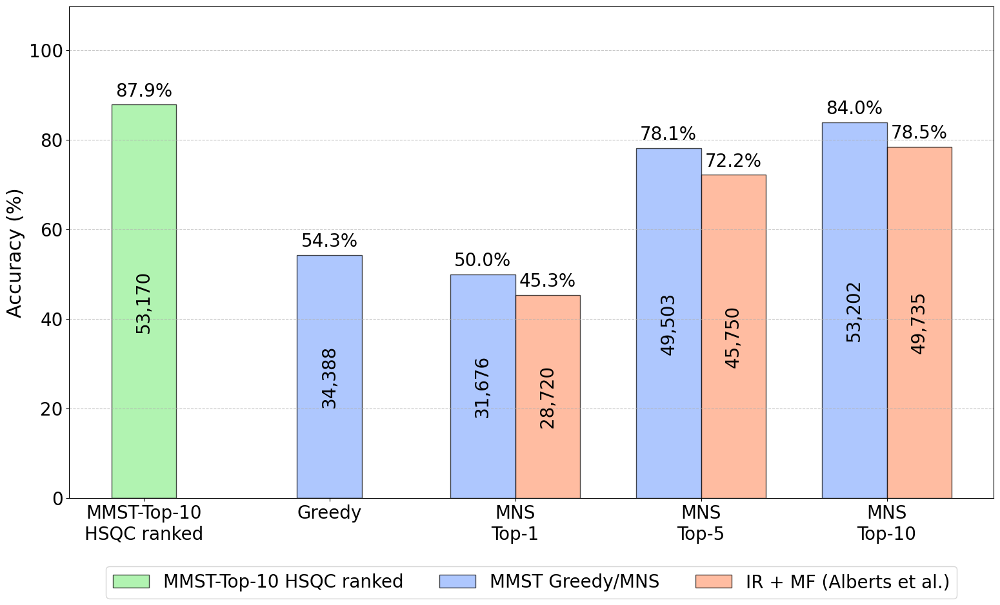


Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES


In [24]:
import pickle
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ast
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
# Assuming utils_MMT is in your Python path or the same directory
import utils_MMT.functions_HSQC_sim_v15_4 as hsqc_sim

def calculate_tanimoto(smiles1, smiles2):
    """Calculate Tanimoto similarity between two SMILES strings"""
    try:
        mol1 = Chem.MolFromSmiles(smiles1)
        mol2 = Chem.MolFromSmiles(smiles2)
        if mol1 is None or mol2 is None:
            return 0.0
            
        fp1 = AllChem.GetMorganFingerprintAsBitVect(mol1, 2, nBits=2048)
        fp2 = AllChem.GetMorganFingerprintAsBitVect(mol2, 2, nBits=2048)
        
        return DataStructs.TanimotoSimilarity(fp1, fp2)
    except Exception as e:
        print(f"Error calculating Tanimoto: {e}")
        return 0.0¶¶

def process_hsqc_data(csv_path):
    """Process the CSV file and calculate HSQC errors"""
    # Load and parse CSV data
    df = pd.read_csv(csv_path)
    df['shifts'] = df['shifts'].apply(ast.literal_eval)
    
    results_dict = {}
    
    # Group by first part of the sample-id (before underscore)
    for group_id, group_df in df.groupby(df['sample-id'].str.split('_').str[0]):
        # Find the target molecule
        target_df = group_df[group_df['sample-id'].str.endswith('_0')]
        if len(target_df) == 0:
            print(f"No target molecule found for group {group_id}")
            continue
            
        target_row = target_df.iloc[0]
        target_smile = target_row['SMILES']
        target_shifts = target_row['shifts']
        
        # Convert target shifts to required format
        target_hsqc_df = pd.DataFrame(target_shifts, columns=['F2 (ppm)', 'F1 (ppm)'])
        
        # Get generated molecules
        generated_rows = group_df[~group_df['sample-id'].str.endswith('_0')]
        
        # Calculate HSQC errors and store results
        results = []
        for _, gen_row in generated_rows.iterrows():
            gen_id = gen_row['sample-id']
            gen_smile = gen_row['SMILES']
            gen_shifts = gen_row['shifts']
            
            # Convert generated shifts to required format
            gen_hsqc_df = pd.DataFrame(gen_shifts, columns=['F2 (ppm)', 'F1 (ppm)'])
            
            # Calculate HSQC error using Hungarian distance with nearest neighbor
            hsqc_error, _, _ = hsqc_sim.similarity_calculations(
                target_hsqc_df, 
                gen_hsqc_df, 
                mode="hung_dist_nn",
                similarity_type="euclidean", 
                error="avg", 
                assignment_plot=False
            )
            
            # Calculate Tanimoto similarity
            tanimoto = calculate_tanimoto(target_smile, gen_smile)
            
            results.append({
                'generated_id': gen_id,
                'generated_smile': gen_smile,
                'hsqc_error': float(hsqc_error),
                'tanimoto': tanimoto
            })
        
        # Sort by HSQC error (lowest first)
        results = sorted(results, key=lambda x: x['hsqc_error'])
        
        # Store in the results dictionary
        results_dict[group_id] = {
            'target_smile': target_smile,
            'results': results
        }
    
    return results_dict

def calculate_top_n_accuracy(results_dict, top_n):
    """Calculate top-N accuracy and return both counts and percentage"""
    count_yes = 0
    count_total = len(results_dict)  # Total number of groups/samples
    
    for group_id, group_data in results_dict.items():
        # Get the top N results sorted by HSQC error
        top_results = group_data['results'][:top_n]
        
        # Check if any of the top results has Tanimoto=1
        has_match = any(result['tanimoto'] == 1.0 for result in top_results)
        
        if has_match:
            count_yes += 1
    
    # Calculate accuracy percentage
    percentage = (count_yes / count_total) * 100 if count_total > 0 else 0.0
    
    return count_yes, count_total, percentage

def load_ibm_results(ibm_results_dir):
    """Load IBM experiment results from pickle files"""
    
    # Load the IBM experiment results
    with open(os.path.join(ibm_results_dir, 'IBM_percentage_collection_TRUE_FALSE.pkl'), 'rb') as f:
        ibm_percentage_collection = pickle.load(f)
    
    with open(os.path.join(ibm_results_dir, 'IBM_results_dict_greedy_TRUE_FALSE.pkl'), 'rb') as f:
        results_dict_greedy = pickle.load(f)
    
    with open(os.path.join(ibm_results_dir, 'IBM_results_dict_mns_10_TRUE_FALSE.pkl'), 'rb') as f:
        results_dict_mns_10 = pickle.load(f)
    
    return ibm_percentage_collection, results_dict_greedy, results_dict_mns_10

def get_ibm_counts(results_dict_mns_10, results_dict_greedy, ibm_percentage_collection):
    """Calculate counts from IBM results"""
    
    # Calculate total samples
    mns_total = 0
    for idx in results_dict_mns_10:
        mns_total += len(results_dict_mns_10[idx])
    
    # Calculate counts
    greedy_count = int(round(ibm_percentage_collection[0] * mns_total))
    top_1_count = int(round(ibm_percentage_collection[1] * mns_total))
    top_3_count = int(round(ibm_percentage_collection[2] * mns_total))
    top_5_count = int(round(ibm_percentage_collection[3] * mns_total))
    top_10_count = int(round(ibm_percentage_collection[4] * mns_total))
    
    return greedy_count, top_1_count, top_3_count, top_5_count, top_10_count, mns_total

def plot_combined_comparison(csv_path, ibm_results_dir, save_path):
    """Load all data and create combined comparison plot"""
    
    # Load IBM results
    print("Loading IBM experiment results...")
    ibm_percentage_collection, results_dict_greedy, results_dict_mns_10 = load_ibm_results(ibm_results_dir)
    
    # Get counts and total from the IBM results
    print("Calculating IBM counts...")
    greedy_count, top_1_count, top_3_count, top_5_count, top_10_count, mns_total = get_ibm_counts(
        results_dict_mns_10, 
        results_dict_greedy, 
        ibm_percentage_collection
    )
    
    # Process the HSQC data
    print("Processing HSQC data...")
    hsqc_results_dict = process_hsqc_data(csv_path)
    
    # Calculate top-N accuracies for HSQC
    print("Calculating HSQC accuracies...")
    hsqc_top_1_count, hsqc_total, hsqc_top1_pct = calculate_top_n_accuracy(hsqc_results_dict, 1)
    hsqc_top_3_count, _, hsqc_top3_pct = calculate_top_n_accuracy(hsqc_results_dict, 3)
    hsqc_top_5_count, _, hsqc_top5_pct = calculate_top_n_accuracy(hsqc_results_dict, 5)
    hsqc_top_10_count, _, hsqc_top10_pct = calculate_top_n_accuracy(hsqc_results_dict, 10)
    
    # Extract IBM percentages and convert to percentages
    ibm_greedy = ibm_percentage_collection[0] * 100
    ibm_top1 = ibm_percentage_collection[1] * 100
    ibm_top3 = ibm_percentage_collection[2] * 100
    ibm_top5 = ibm_percentage_collection[3] * 100
    ibm_top10 = ibm_percentage_collection[4] * 100
    
    # Reference data from IR + MF paper (Alberts et al.)
    ref_top1 = 45.33
    ref_top3 = 0.0  # Not provided in reference
    ref_top5 = 72.21
    ref_top10 = 78.50
    
    # Calculate reference counts based on percentages and MNS total
    ref_counts = []
    # Note: Removed top-3 from the reference data as it's 0.0
    for ref_pct in [0.0, 0.0, ref_top1, ref_top5, ref_top10]: 
        if ref_pct > 0:
            ref_counts.append(int(round((ref_pct / 100) * mns_total)))
        else:
            ref_counts.append(0)
    
    # Print results
    print("\nHSQC Results:")
    print(f"Top-1: {hsqc_top1_pct:.1f}% ({hsqc_top_1_count:,}/{hsqc_total:,})")
    print(f"Top-3: {hsqc_top3_pct:.1f}% ({hsqc_top_3_count:,}/{hsqc_total:,})")
    print(f"Top-5: {hsqc_top5_pct:.1f}% ({hsqc_top_5_count:,}/{hsqc_total:,})")
    print(f"Top-10: {hsqc_top10_pct:.1f}% ({hsqc_top_10_count:,}/{hsqc_total:,})")
    
    print("\nMMST Results:")
    print(f"Greedy: {ibm_greedy:.1f}% ({greedy_count:,}/{mns_total:,})")
    print(f"Top-1: {ibm_top1:.1f}% ({top_1_count:,}/{mns_total:,})")
    print(f"Top-3: {ibm_top3:.1f}% ({top_3_count:,}/{mns_total:,})")
    print(f"Top-5: {ibm_top5:.1f}% ({top_5_count:,}/{mns_total:,})")
    print(f"Top-10: {ibm_top10:.1f}% ({top_10_count:,}/{mns_total:,})")
    
    print("\nIR + MF Reference:")
    print(f"Top-1: {ref_top1:.1f}%")
    print(f"Top-5: {ref_top5:.1f}%")
    print(f"Top-10: {ref_top10:.1f}%")
    
    # Define labels and data (excluding Top-3 as reference is not available)
    labels = ['MMST-Top-10\nHSQC ranked', 'Greedy', 'MNS\nTop-1', 'MNS\nTop-5', 'MNS\nTop-10']
    mmst_values = [hsqc_top1_pct, ibm_greedy, ibm_top1, ibm_top5, ibm_top10]
    ref_values = [0.0, 0.0, ref_top1, ref_top5, ref_top10]
    
    # Count data for display inside bars
    mmst_display_counts = [hsqc_top_1_count, 
                           greedy_count,
                           top_1_count,
                           top_5_count,
                           top_10_count]
    
    # Colors
    mmst_color = '#8CB0FE'  # Blue for MMST
    ref_color = '#FFA07A'   # Orange for IR+MF
    hsqc_color = '#90EE90'  # Light green for HSQC
    
    # Create the figure with 16:10 aspect ratio
    fig, ax = plt.subplots(figsize=(16, 10))
    
    # Set up bar positions
    x = np.arange(len(labels))
    width = 0.35
    
    # Create custom colors for MMST bars
    mmst_colors = [hsqc_color if i == 0 else mmst_color for i in range(len(labels))]
    
    # Create bars - center single bars for first two categories
    bars1 = []
    bars2 = []
    
    for i in range(len(labels)):
        if i <= 1:  # MMST-Top-10 HSQC ranked and Greedy - center the bars
            bar1 = ax.bar(x[i], mmst_values[i], width, color=mmst_colors[i], alpha=0.7, edgecolor='black')
            bar2 = ax.bar(x[i], 0, width, color=ref_color, alpha=0.7, edgecolor='black')  # Empty bar for reference
        else:  # Other categories - keep side by side
            bar1 = ax.bar(x[i] - width/2, mmst_values[i], width, color=mmst_colors[i], alpha=0.7, edgecolor='black')
            bar2 = ax.bar(x[i] + width/2, ref_values[i], width, color=ref_color, alpha=0.7, edgecolor='black')
        
        bars1.append(bar1)
        bars2.append(bar2)
    
    # --- UPDATED SECTION ---
    # Add value labels on bars
    for i, (bar_container1, bar_container2) in enumerate(zip(bars1, bars2)):
        # MMST bars - percentage above, count inside
        bar_patch1 = bar_container1[0]
        height1 = bar_patch1.get_height()
        
        if height1 > 0:
            # Percentage above bar (font size increased to 20)
            ax.text(bar_patch1.get_x() + bar_patch1.get_width()/2, height1 + 1,
                    f'{mmst_values[i]:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Count inside bar (formatted with comma)
            ax.text(bar_patch1.get_x() + bar_patch1.get_width()/2, height1/2,
                    f'{mmst_display_counts[i]:,}',
                    ha='center', va='center', fontsize=20, color='black', rotation=90)
        
        # Reference bars - percentage above, count inside if available
        bar_patch2 = bar_container2[0]
        height2 = bar_patch2.get_height()
        
        if height2 > 0:
            # Percentage above bar (font size increased to 20)
            ax.text(bar_patch2.get_x() + bar_patch2.get_width()/2, height2 + 1,
                    f'{ref_values[i]:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Count inside bar (formatted with comma)
            ax.text(bar_patch2.get_x() + bar_patch2.get_width()/2, height2/2,
                    f'{ref_counts[i]:,}',
                    ha='center', va='center', fontsize=20, color='black', rotation=90)
    
    # Customize the plot
    ax.set_ylabel('Accuracy (%)', fontsize=22)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_ylim(0, max(max(mmst_values), max(ref_values)) * 1.25) # Increased upper limit slightly for new font size
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=hsqc_color, label='MMST-Top-10 HSQC ranked', alpha=0.7, edgecolor='black'),
        Patch(facecolor=mmst_color, label='MMST Greedy/MNS', alpha=0.7, edgecolor='black'),
        Patch(facecolor=ref_color, label='IR + MF (Alberts et al.)', alpha=0.7, edgecolor='black')
    ]
    # Legend fontsize increased to 20
    ax.legend(handles=legend_elements, fontsize=20, loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=3)
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout(rect=[0, 0.05, 1, 1]) # Adjust layout to make space for the larger legend
    
    # Create results directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)
    
    # Save the figure
    plt.savefig(os.path.join(save_path, 'combined_mmst_vs_ir_mf_comparison.png'), dpi=300, bbox_inches='tight')
    plt.savefig(os.path.join(save_path, 'combined_mmst_vs_ir_mf_comparison.pdf'), bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")
    
    return fig

def main():
    """Main function to run the complete analysis"""
    
    # Set the path to your CSV file
    csv_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/Experiment_ranking/data_HSQC_245260.csv"
    
    # Set the path to the IBM results directory
    ibm_results_dir = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/IBM_experiment_results"
    
    # Set the save path
    save_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES"
    
    # Create the combined plot
    fig = plot_combined_comparison(csv_path, ibm_results_dir, save_path)
    
    return fig

if __name__ == "__main__":
    try:
        fig = main()
    except FileNotFoundError as e:
        print(f"Error: A required file or directory was not found.")
        print(f"Details: {e}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

#### Dataset Comparison ZINC vs Pubchem (IR)

Loading ZINC dataset...
Loading data from /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv
Sampled 5000 compounds from 489993 total
Loaded 5000 valid SMILES
Loading PubChem (IBM) dataset...
Loading data from /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/IBM_dataset/IBM_data_1H_837154_train.csv
Sampled 5000 compounds from 570214 total
Loaded 5000 valid SMILES

Calculating molecular weights...
Calculated molecular weights for 5000 compounds
Calculated molecular weights for 5000 compounds

Generating molecular weight distribution plot...


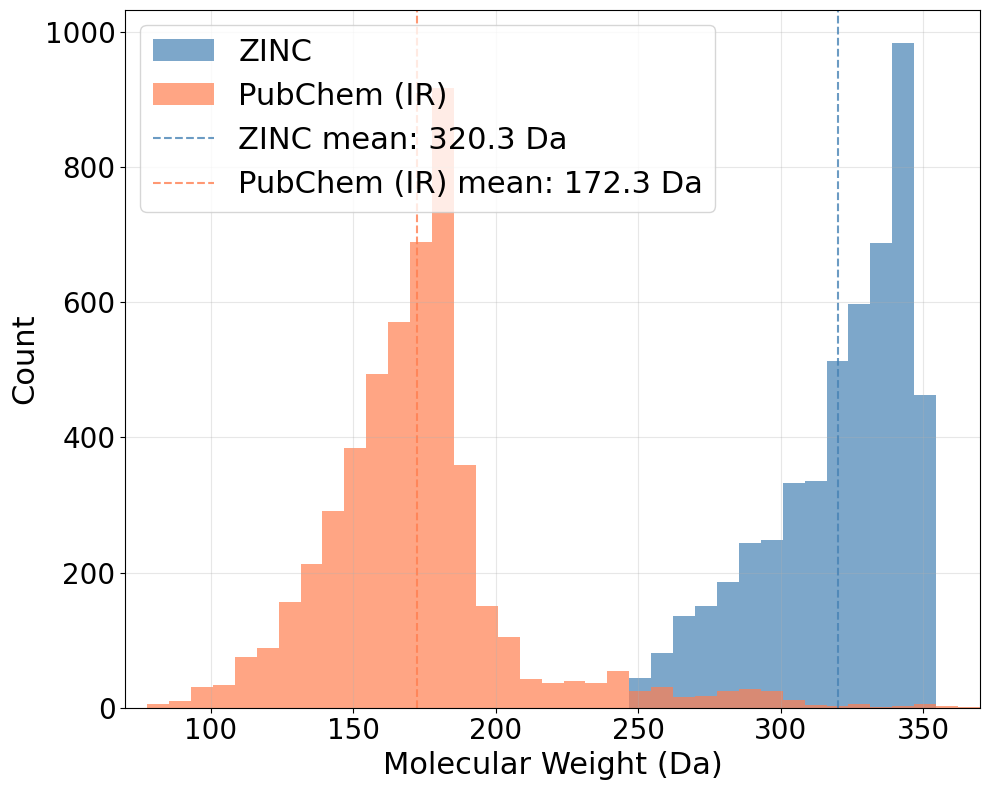

Molecular weight statistics (70-370 Da range):
ZINC: Mean = 320.3 Da, Std = 24.9 Da
PubChem (IR): Mean = 172.3 Da, Std = 33.9 Da

Calculating fingerprints for t-SNE...
Calculated fingerprints for 1000 compounds
Calculated fingerprints for 1000 compounds

Generating t-SNE chemical space comparison...
Preparing data for t-SNE...
Computing t-SNE embedding...


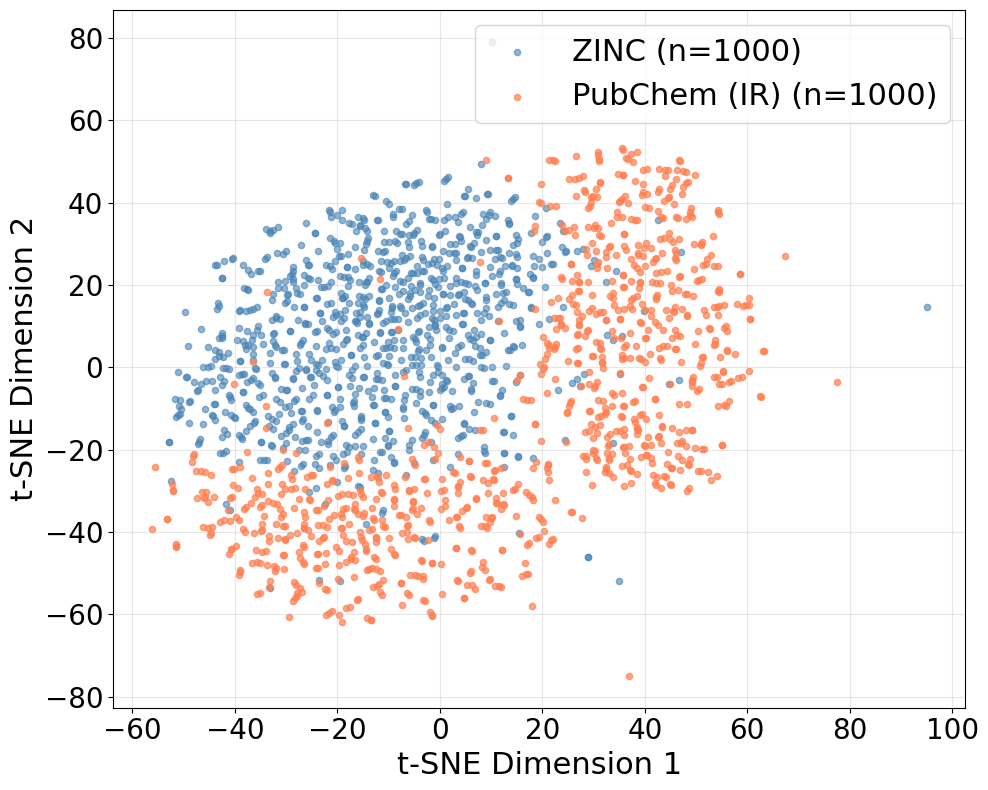


All plots saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES
Analysis complete!


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import Descriptors, rdMolDescriptors
from rdkit.Chem.Fingerprints import FingerprintMols
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import pairwise_distances
import os
import warnings
warnings.filterwarnings('ignore')

def load_smiles_from_csv(file_path, smiles_column='SMILES', sample_size=None):
    """Load SMILES from CSV file with optional sampling"""
    print(f"Loading data from {file_path}")
    df = pd.read_csv(file_path)
    
    if sample_size and len(df) > sample_size:
        df = df.sample(n=sample_size, random_state=42)
        print(f"Sampled {sample_size} compounds from {len(pd.read_csv(file_path))} total")
    
    smiles_list = df[smiles_column].dropna().tolist()
    print(f"Loaded {len(smiles_list)} valid SMILES")
    return smiles_list

def calculate_molecular_weights(smiles_list):
    """Calculate molecular weights from SMILES"""
    weights = []
    valid_smiles = []
    
    for smi in smiles_list:
        try:
            mol = Chem.MolFromSmiles(smi)
            if mol is not None:
                mw = Descriptors.MolWt(mol)
                weights.append(mw)
                valid_smiles.append(smi)
        except:
            continue
    
    print(f"Calculated molecular weights for {len(weights)} compounds")
    return weights, valid_smiles

def calculate_tanimoto_fingerprints(smiles_list):
    """Calculate Morgan fingerprints for Tanimoto similarity"""
    fingerprints = []
    valid_smiles = []
    
    for smi in smiles_list:
        try:
            mol = Chem.MolFromSmiles(smi)
            if mol is not None:
                # Use Morgan fingerprints (ECFP4)
                fp = rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, 2, nBits=1024)
                fingerprints.append(np.array(fp))
                valid_smiles.append(smi)
        except:
            continue
    
    if fingerprints:
        fingerprints = np.array(fingerprints)
        print(f"Calculated fingerprints for {len(fingerprints)} compounds")
        return fingerprints, valid_smiles
    else:
        return None, []

def plot_molecular_weight_distribution(zinc_weights, pubchem_weights, save_path):
    """Create histogram comparing molecular weight distributions"""
    plt.figure(figsize=(10, 8))
    
    # Filter weights to the desired range
    zinc_weights_filtered = [w for w in zinc_weights if 70 <= w <= 370]
    pubchem_weights_filtered = [w for w in pubchem_weights if 70 <= w <= 370]
    
    # Create histogram
    bins = np.linspace(70, 370, 40)
    
    plt.hist(zinc_weights_filtered, bins=bins, alpha=0.7, label='ZINC', 
             color='steelblue', density=False)
    plt.hist(pubchem_weights_filtered, bins=bins, alpha=0.7, label='PubChem (IR)', 
             color='coral', density=False)
    
    plt.xlabel('Molecular Weight (Da)', fontsize=22)
    plt.ylabel('Count', fontsize=22)
    plt.legend(fontsize=22)
    plt.grid(True, alpha=0.3)
    plt.xlim(70, 370)
    
    # Add statistics
    zinc_mean = np.mean(zinc_weights_filtered)
    pubchem_mean = np.mean(pubchem_weights_filtered)
    
    plt.axvline(zinc_mean, color='steelblue', linestyle='--', alpha=0.8, 
                label=f'ZINC mean: {zinc_mean:.1f} Da')
    plt.axvline(pubchem_mean, color='coral', linestyle='--', alpha=0.8, 
                label=f'PubChem (IR) mean: {pubchem_mean:.1f} Da')
    
    plt.legend(fontsize=22)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.tight_layout()
    
    # Save plot
    plt.savefig(os.path.join(save_path, 'molecular_weight_distribution_comparison.png'), 
                dpi=300, bbox_inches='tight')
    plt.savefig(os.path.join(save_path, 'molecular_weight_distribution_comparison.pdf'), 
                bbox_inches='tight')
    plt.show()
    
    print(f"Molecular weight statistics (70-370 Da range):")
    print(f"ZINC: Mean = {zinc_mean:.1f} Da, Std = {np.std(zinc_weights_filtered):.1f} Da")
    print(f"PubChem (IR): Mean = {pubchem_mean:.1f} Da, Std = {np.std(pubchem_weights_filtered):.1f} Da")

def plot_tsne_comparison(zinc_fp, pubchem_fp, save_path):
    """Create t-SNE plot comparing chemical spaces"""
    print("Preparing data for t-SNE...")
    
    # Combine fingerprints
    combined_fp = np.vstack((zinc_fp, pubchem_fp))
    labels = np.array(['ZINC'] * len(zinc_fp) + ['PubChem (IR)'] * len(pubchem_fp))
    
    print("Computing t-SNE embedding...")
    # Calculate Tanimoto distance matrix
    tanimoto_distances = pairwise_distances(combined_fp, metric='jaccard')
    
    # Perform t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, 
                metric='precomputed', init='random')
    tsne_result = tsne.fit_transform(tanimoto_distances)
    
    # Create the plot
    plt.figure(figsize=(10, 8))
    
    # Plot ZINC points
    zinc_mask = labels == 'ZINC'
    plt.scatter(tsne_result[zinc_mask, 0], tsne_result[zinc_mask, 1], 
                c='steelblue', alpha=0.6, s=20, label=f'ZINC (n={np.sum(zinc_mask)})')
    
    # Plot PubChem points
    pubchem_mask = labels == 'PubChem (IR)'
    plt.scatter(tsne_result[pubchem_mask, 0], tsne_result[pubchem_mask, 1], 
                c='coral', alpha=0.7, s=20, label=f'PubChem (IR) (n={np.sum(pubchem_mask)})')
    
    plt.xlabel('t-SNE Dimension 1', fontsize=22)
    plt.ylabel('t-SNE Dimension 2', fontsize=22)
    plt.legend(fontsize=22)
    plt.grid(True, alpha=0.3)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    plt.tight_layout()
    
    # Save plot
    plt.savefig(os.path.join(save_path, 'tsne_chemical_space_comparison.png'), 
                dpi=300, bbox_inches='tight')
    plt.savefig(os.path.join(save_path, 'tsne_chemical_space_comparison.pdf'), 
                bbox_inches='tight')
    plt.show()

def main():
    # Set random seed for reproducibility
    np.random.seed(42)
    
    # File paths
    zinc_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv"
    pubchem_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/IBM_dataset/IBM_data_1H_837154_train.csv"
    save_folder = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES"
    
    # Create save folder if it doesn't exist
    os.makedirs(save_folder, exist_ok=True)
    
    # Load SMILES data (sample for computational efficiency)
    print("Loading ZINC dataset...")
    zinc_smiles = load_smiles_from_csv(zinc_path, sample_size=5000)
    
    print("Loading PubChem (IBM) dataset...")
    pubchem_smiles = load_smiles_from_csv(pubchem_path, sample_size=5000)
    
    # Calculate molecular weights
    print("\nCalculating molecular weights...")
    zinc_weights, zinc_smiles_valid = calculate_molecular_weights(zinc_smiles)
    pubchem_weights, pubchem_smiles_valid = calculate_molecular_weights(pubchem_smiles)
    
    # Plot molecular weight distribution
    print("\nGenerating molecular weight distribution plot...")
    plot_molecular_weight_distribution(zinc_weights, pubchem_weights, save_folder)
    
    # Calculate fingerprints for t-SNE (use smaller sample for computational efficiency)
    print("\nCalculating fingerprints for t-SNE...")
    zinc_fp, _ = calculate_tanimoto_fingerprints(zinc_smiles_valid[:1000])
    pubchem_fp, _ = calculate_tanimoto_fingerprints(pubchem_smiles_valid[:1000])
    
    if zinc_fp is not None and pubchem_fp is not None:
        # Plot t-SNE comparison
        print("\nGenerating t-SNE chemical space comparison...")
        plot_tsne_comparison(zinc_fp, pubchem_fp, save_folder)
    else:
        print("Error: Could not calculate fingerprints for t-SNE analysis")
    
    print(f"\nAll plots saved to: {save_folder}")
    print("Analysis complete!")

if __name__ == "__main__":
    main()

### 2.0 Ablation Study fine-tuned

#### Run Experiment

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "13C_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# No 1H
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_1H-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1a, results_dict_2_1a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)



# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1a.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1a, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1a, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# No 13C
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_13C-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1b, results_dict_2_1b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1b.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1b, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1b, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_COSY_IR_MF_MW"
config.data_size = 489993

# No HSQC
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_HSQC-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1c, results_dict_2_1c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)



# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1c.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1c, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1c, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_IR_MF_MW"
config.data_size = 489993

# No COSY
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_COSY-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1d, results_dict_2_1d = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1d.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1d, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1d, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_MF_MW"
config.data_size = 489993

# No IR
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_IR-epoch=00-loss=0.02.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1e.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

In [4]:
"""# All small Data
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv') 
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_13C_test.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_HSQC_test.csv') 
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_13C_test.csv') 
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv') 
config.pickle_file_path = ""
config.IR_data_folder = os.path.abspath('./data/ZINK_dataset/IR_spectra_NN') 
config.data_size = 48999 

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
"""

Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_322864.pkl
Pickle saved.


In [5]:
"""
# all small
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_all_small.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_all_small.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)"""

Pickle Loaded.
calculate_corr_max_prob


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [22:32<00:00, 28.18s/it]


evaluate_greedy_2


48it [18:39, 23.33s/it]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: w

NameError: name 'file_results_dict_path' is not defined

In [47]:
from utils_MMT.data_generation_v15_4 import main_run_data_generation

# Set the required paths
config.SGNN_csv_gen_smi = '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/ML_NMR_5M_XL_1H_comb_test_V8_4000.csv'
config.SGNN_gen_folder_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINC_4000/NMR"

# Run the SGNN simulation
combined_df, data_1H, data_13C, data_COSY, data_HSQC, csv_1H_path, csv_13C_path, csv_COSY_path, csv_HSQC_path = main_run_data_generation(config)


Using existing ran_num: 4953177
0
 run_sgnn: DONE
 run_1H_generation: DONE
1H CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_1H_4953177.csv
 run_13C_generation: DONE
13C CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_13C_4953177.csv
 run_COSY_generation: DONE
COSY CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_COSY_4953177.csv
 run_HSQC_generation: DONE
HSQC CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_HSQC_4953177.csv
1H data shape: (4000, 3)
13C data shape: (4000, 3)
COSY data shape: (4000, 3)
HSQC data shape: (4000, 3)
 Starting final cleanup...
Found 4000 NMR SDF files to keep
Found 4000

In [ ]:
config.SGNN_csv_gen_smi = '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/ML_NMR_5M_XL_1H_comb_test_V8_4000.csv'


In [48]:
import os
import pickle

config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
config.data_size = 4000

# Updated paths for ZINC_4000 dataset
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINC_4000/data_1H_4953177.csv') 
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINC_4000/data_13C_4953177.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINC_4000/data_HSQC_4953177.csv') 
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINC_4000/data_COSY_4953177.csv') 
config.csv_path_val = os.path.abspath('./data/ZINC_4000/data_1H_4953177.csv') 
config.pickle_file_path = ""
config.IR_data_folder = os.path.abspath('./data/ZINK_dataset/IR_spectra_NN') 
   
# all tiny
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_ZINC_4000.pkl') 
with open(file_prob_dict_path, 'wb') as file:
   pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_ZINC_4000.pkl') 
with open(file_results_dict_path, 'wb') as file:
   pickle.dump(results_dict_2_1e, file)

Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINC_4000/data_1H_4953177_613386.pkl
Pickle saved.
calculate_corr_max_prob


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [02:06<00:00,  2.01s/it]


evaluate_greedy_2


63it [01:39,  1.59s/it]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78



In [43]:
"""# without MF_MW
# need to use a different model_MMT.py  !!!
# Rename this one: utils_MMT/models_MMT_v15_4_MW_MF.py -> models_MMT_v15_4 
# then run the experiment (reason - manually zeroing the MW and MF inputs
config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# all small
config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/MMST_MW&MF_ablation/MultimodalTransformer_time_1749700099.1328886_Loss_0.218.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_wo_MW_MF_small.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_wo_MW_MF_small.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)"""

Pickle Loaded.
calculate_corr_max_prob


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]


evaluate_greedy_2


1it [00:00,  1.38it/s]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: w

#### Load data

#### Probability of Correct SMILES - Violin Chart

In [15]:
import pickle
import os
import gc  # For garbage collection
import numpy as np
import matplotlib.pyplot as plt

# List of file paths for prob_dict_results (not results_dict)
prob_dict_file_paths = [
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.0_prob_dict_results_2ai.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1a.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1b.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1c.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1d.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1e.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_ZINC_4000.pkl'
]

labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR',
          'All (1% data)']

# Initialize lists to store the extracted data
data_for_violin = []
filtered_labels = []

print("Loading prob_dict files one by one to extract aggregated_corr_prob_multi data...")

# Load each file individually, extract data, then release memory
for i, (file_path, label) in enumerate(zip(prob_dict_file_paths, labels)):
    print(f"Loading file {i+1}/{len(prob_dict_file_paths)}: {os.path.basename(file_path)} ({label})")
    
    try:
        # Load the file
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            prob_dict = pickle.load(file)
        
        # Extract the aggregated_corr_prob_multi data
        prob_data = prob_dict.get("aggregated_corr_prob_multi", [])
        
        # Only add if data exists
        if len(prob_data) > 0:
            data_for_violin.append(prob_data)
            filtered_labels.append(label)
            print(f"  - Probability data points: {len(prob_data)}")
            print(f"  - Mean probability: {np.mean(prob_data):.3f}")
        else:
            print(f"  - No aggregated_corr_prob_multi data found for {label}")
        
        # Clear the variable and force garbage collection
        del prob_dict
        gc.collect()
        
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nProcessed {len(data_for_violin)} datasets with probability data.")

# Check if we have any data
if not data_for_violin:
    print("Error: All datasets are empty. Unable to create violin plot.")
else:
    # Create the violin plot
    fig, ax = plt.subplots(figsize=(12, 10))
    parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)
    
    # Customizing colors - different colors for the new datasets
    colors = []
    for label in filtered_labels:
        if '1%' in label:
            colors.append("#FFA07A")  # Orange for small
        else:
            colors.append("#8CB0FE")  # Blue for original ablation study
    
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)
        
    mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]
    
    # Add mean values as text
    for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
        ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=20)
    
    # Customizing the axes and labels
    ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
    ax.set_xticks(np.arange(1, len(filtered_labels) + 1))
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Add grid and set the limits
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 1)
    
    # Add vertical line to separate ablation study from dataset size comparison if we have both types
    original_count = sum(1 for label in filtered_labels if 'Small' not in label and 'Tiny' not in label)
    if original_count < len(filtered_labels):
        ax.axvline(x=original_count + 0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        # Add text annotations to clarify sections
        if original_count > 1:
            ax.text(original_count/2, 0.95, 'Ablation Study', ha='center', fontsize=16, style='italic', 
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
        if len(filtered_labels) > original_count:
            remaining_pos = original_count + (len(filtered_labels) - original_count)/2
            ax.text(remaining_pos, 0.95, 'Dataset Size', ha='center', fontsize=16, style='italic',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcoral", alpha=0.7))
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8) # Make it visible but not dominant

    plt.tight_layout()
    save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Violin_chart_with_size_comparison_v3.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print the data for debugging
print("\nDebugging information:")
print(f"Number of datasets with data: {len(data_for_violin)}")
print("Filtered labels:", filtered_labels)
print("Data lengths:", [len(data) for data in data_for_violin])

print("Memory efficient probability violin plotting completed!")

Loading prob_dict files one by one to extract aggregated_corr_prob_multi data...
Loading file 1/7: 2.0_prob_dict_results_2ai.pkl (All)
  - Probability data points: 489993
  - Mean probability: 0.507
Loading file 2/7: 2.1_prob_dict_results_2_1a.pkl (no $^1$H)
  - Probability data points: 489993
  - Mean probability: 0.365
Loading file 3/7: 2.1_prob_dict_results_2_1b.pkl (no $^{13}$C)
  - Probability data points: 489993
  - Mean probability: 0.298
Loading file 4/7: 2.1_prob_dict_results_2_1c.pkl (no HSQC)
  - Probability data points: 489993
  - Mean probability: 0.037
Loading file 5/7: 2.1_prob_dict_results_2_1d.pkl (no COSY)
  - Probability data points: 489993
  - Mean probability: 0.058
Loading file 6/7: 2.1_prob_dict_results_2_1e.pkl (no IR)
  - Probability data points: 489993
  - Mean probability: 0.461
Loading file 7/7: 2.1_prob_dict_results_2_ZINC_4000.pkl (All (1% data))
  - Probability data points: 4000
  - Mean probability: 0.508

Processed 7 datasets with probability data.

Plo

#### Invalid Molecules - Bar Chart

In [19]:
import pickle
import os
import gc  # For garbage collection
import matplotlib.pyplot as plt

# List of file paths and labels
file_paths = [
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2ai.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_ZINC_4000.pkl'
]

labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR',
          'All (1% data)']

# Initialize lists to store the extracted data
mean_results_2 = []
test_data_sizes = []

print("Loading files one by one to extract failed results...")

# Load each file individually, extract data, then release memory
for i, file_path in enumerate(file_paths):
    print(f"Loading file {i+1}/{len(file_paths)}: {os.path.basename(file_path)}")
    
    # Load the file
    full_path = os.path.abspath(file_path)
    with open(full_path, 'rb') as file:
        results_dict = pickle.load(file)
    
    # Extract only the needed data
    num_failed = len(results_dict["failed"])
    data_size = len(results_dict["trg_conv_SMI_list"])  # or another size indicator
    
    # Store the extracted data
    mean_results_2.append(num_failed)
    test_data_sizes.append(data_size)
    
    # Clear the variable and force garbage collection
    del results_dict
    gc.collect()
    
    print(f"  - Failed results: {num_failed}")
    print(f"  - Data size: {data_size}")

print("\nAll files processed. Creating plot...")

# Calculate percentages for each dataset
percentages = [(num_failed / data_size) * 100 for num_failed, data_size in zip(mean_results_2, test_data_sizes)]

# Define colors for the bars - different colors for different dataset sizes
colors = ["#8CB0FE", "#8CB0FE", "#8CB0FE", "#8CB0FE", "#8CB0FE", "#8CB0FE", "#FFA07A", "#98FB98"]

# Plotting the bar chart with percentages
fig, ax = plt.subplots(figsize=(12, 10))
bars = ax.bar(range(len(percentages)), percentages, align='center', alpha=0.7, 
              ecolor='black', capsize=10, edgecolor='black', color=colors)

# Adding absolute number labels inside each bar (vertical, black, non-bold)
for i, bar in enumerate(bars):
    yval = bar.get_height()
    absolute_num = mean_results_2[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{absolute_num}', 
            rotation=90, ha='center', va='center', fontsize=20, color='black')

# Adding percentage labels on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    percentage = percentages[i]
    ax.text(bar.get_x() + bar.get_width() / 2, yval + max(percentages) * 0.02, f'{percentage:.1f}%', 
            ha='center', va='bottom', fontsize=20, color='black')

# Set the title and labels
ax.set_ylabel('Percentage of Invalid Molecules (%)', fontsize=22)

# Set x-ticks
ax.set_xticks(range(len(percentages)))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=20)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, max(percentages) * 1.15)  # Add extra space for percentage labels on top

# Add a vertical line to separate original ablations from dataset size comparisons
ax.axvline(x=5.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)

for spine in ax.spines.values():
    spine.set_edgecolor('gray')
    spine.set_alpha(0.8) # Make it visible but not dominant

# Adjust layout
plt.tight_layout()

# Save the plot
save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Invalid_molecules_percentage_scale_v3.png')  
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

print(f"\nPlot saved to: {save_path}")

# Print summary
print("\nSummary Statistics:")
print("="*60)
for i, label in enumerate(labels):
    print(f"{label:15s}: {percentages[i]:.1f}% ({mean_results_2[i]:4d}/{test_data_sizes[i]:4d})")

print("\nPercentage-based plot completed!")

Loading files one by one to extract failed results...
Loading file 1/7: 2.1_results_dict_2ai.pkl
  - Failed results: 9907
  - Data size: 489993
Loading file 2/7: 2.1_results_dict_2_1a.pkl
  - Failed results: 12189
  - Data size: 489993
Loading file 3/7: 2.1_results_dict_2_1b.pkl
  - Failed results: 17399
  - Data size: 489993
Loading file 4/7: 2.1_results_dict_2_1c.pkl
  - Failed results: 44847
  - Data size: 489993
Loading file 5/7: 2.1_results_dict_2_1d.pkl
  - Failed results: 38798
  - Data size: 489993
Loading file 6/7: 2.1_results_dict_2_1e.pkl
  - Failed results: 12561
  - Data size: 489993
Loading file 7/7: 2.1_results_dict_2_ZINC_4000.pkl
  - Failed results: 66
  - Data size: 4000

All files processed. Creating plot...

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/2.1_Ablation_Invalid_molecules_percentage_scale_v3.png

Summary Statistics:
All            : 2.0% (9907/489993)
no $^1$H       : 2.5% (12189/489

#### Tanimoto comparison - Violin Chart

In [17]:
import pickle
import os
import gc  # For garbage collection
import numpy as np
import matplotlib.pyplot as plt

# List of file paths and labels
file_paths = [
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2ai.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_ZINC_4000.pkl'
]

labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR',
          'All (1% data)']

# Initialize lists to store the extracted data
data_for_violin = []
filtered_labels = []

print("Loading files one by one to extract Tanimoto similarity data...")

# Load each file individually, extract data, then release memory
for i, (file_path, label) in enumerate(zip(file_paths, labels)):
    print(f"Loading file {i+1}/{len(file_paths)}: {os.path.basename(file_path)} ({label})")
    
    # Load the file
    full_path = os.path.abspath(file_path)
    with open(full_path, 'rb') as file:
        results_dict = pickle.load(file)
    
    # Extract the appropriate Tanimoto similarity data
    if label in ['All']:
        tanimoto_sim = results_dict.get("tanimoto_sim", [])
    elif label in ['All (1% data)']:
        # For small and tiny datasets, look for keys starting with "tanimoto_scores_"
        tanimoto_sim = []
        for key in results_dict.keys():
            if key.startswith("tanimoto_scores_"):
                tanimoto_sim = results_dict[key]
                print(f"  - Found Tanimoto data in key: {key}")
                break
        if not tanimoto_sim:
            print(f"  - No 'tanimoto_scores_*' key found, checking 'tanimoto_sim'")
            tanimoto_sim = results_dict.get("tanimoto_sim", [])
    else:
        tanimoto_sim = results_dict.get("tanimoto_scores_all", [])
    
    # Only add if data exists
    if len(tanimoto_sim) > 0:
        data_for_violin.append(tanimoto_sim)
        filtered_labels.append(label)
        print(f"  - Tanimoto data points: {len(tanimoto_sim)}")
        print(f"  - Mean Tanimoto: {np.mean(tanimoto_sim):.3f}")
    else:
        print(f"  - No Tanimoto data found for {label}")
    
    # Clear the variable and force garbage collection
    del results_dict
    gc.collect()

print(f"\nProcessed {len(data_for_violin)} datasets with Tanimoto data.")

# Check if we have any data
if not data_for_violin:
    print("Error: All datasets are empty. Unable to create violin plot.")
else:
    # Create the violin plot
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Define positions for the violins
    positions = np.arange(1, len(filtered_labels) + 1)
    
    # Plot violins
    parts = ax.violinplot(data_for_violin, positions=positions, showmeans=True, showmedians=False, showextrema=False)
    
    # Customizing colors - different colors for different dataset sizes
    colors = []
    for label in filtered_labels:
        if '1%' in label:
            colors.append("#FFA07A")  # Orange for small
        else:
            colors.append("#8CB0FE")  # Blue for original ablation study
    
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.8)
    
    # Customizing the axes and labels
    ax.set_ylabel('Tanimoto Similarity', fontsize=22)
    
    # Set x-ticks in the middle of each group
    ax.set_xticks(positions)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Add grid and set the limits
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 1)
    
    # Calculate and add mean values as text
    for pos, data in zip(positions, data_for_violin):
        mean_value = np.mean(data)
        ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=20)
    
    # Add vertical line to separate ablation study from dataset size comparison if we have both types
    original_count = sum(1 for label in filtered_labels if 'Small' not in label and 'Tiny' not in label)
    if original_count < len(filtered_labels):
        ax.axvline(x=original_count + 0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        # Add text annotations to clarify sections
        if original_count > 1:
            ax.text(original_count/2, 0.95, 'Ablation Study', ha='center', fontsize=16, style='italic', 
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
        if len(filtered_labels) > original_count:
            remaining_pos = original_count + (len(filtered_labels) - original_count)/2
            ax.text(remaining_pos, 0.95, 'Dataset Size', ha='center', fontsize=16, style='italic',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcoral", alpha=0.7))
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8) # Make it visible but not dominant
        
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Tanimoto_with_size_comparison_v3.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print the data for debugging
print("\nDebugging information:")
print(f"Number of datasets with data: {len(data_for_violin)}")
print("Filtered labels:", filtered_labels)
print("Data lengths:", [len(data) for data in data_for_violin])

print("Memory efficient Tanimoto plotting completed!")

Loading files one by one to extract Tanimoto similarity data...
Loading file 1/7: 2.1_results_dict_2ai.pkl (All)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.823
Loading file 2/7: 2.1_results_dict_2_1a.pkl (no $^1$H)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.741
Loading file 3/7: 2.1_results_dict_2_1b.pkl (no $^{13}$C)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.692
Loading file 4/7: 2.1_results_dict_2_1c.pkl (no HSQC)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.431
Loading file 5/7: 2.1_results_dict_2_1d.pkl (no COSY)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.482
Loading file 6/7: 2.1_results_dict_2_1e.pkl (no IR)
  - Tanimoto data points: 489993
  - Mean Tanimoto: 0.793
Loading file 7/7: 2.1_results_dict_2_ZINC_4000.pkl (All (1% data))
  - Found Tanimoto data in key: tanimoto_scores_
  - Tanimoto data points: 3934
  - Mean Tanimoto: 0.838

Processed 7 datasets with Tanimoto data.

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_

#### Correct molecules - Bar Chart

In [18]:
import pickle
import os
import gc  # For garbage collection
import numpy as np
import matplotlib.pyplot as plt

# List of file paths and labels
file_paths = [
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2ai.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl',
    './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_ZINC_4000.pkl'
]

labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR',
           'All (1% data)']

# Initialize lists to store the extracted data
correct_counts = []
total_counts = []
filtered_labels = []

print("Loading files one by one to count correct molecules (Tanimoto = 1.0)...")

# Load each file individually, extract data, then release memory
for i, (file_path, label) in enumerate(zip(file_paths, labels)):
    print(f"Loading file {i+1}/{len(file_paths)}: {os.path.basename(file_path)} ({label})")
    
    try:
        # Load the file
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
        
        # Extract the appropriate Tanimoto similarity data
        if label in ['All']:
            tanimoto_sim = results_dict.get("tanimoto_sim", [])
        elif label in ['All (1% data)']:
            # For small and tiny datasets, look for keys starting with "tanimoto_scores_"
            tanimoto_sim = []
            for key in results_dict.keys():
                if key.startswith("tanimoto_scores_"):
                    tanimoto_sim = results_dict[key]
                    print(f"  - Found Tanimoto data in key: {key}")
                    break
            if not tanimoto_sim:
                print(f"  - No 'tanimoto_scores_*' key found, checking 'tanimoto_sim'")
                tanimoto_sim = results_dict.get("tanimoto_sim", [])
        else:
            tanimoto_sim = results_dict.get("tanimoto_scores_all", [])
        
        # Only process if data exists
        if len(tanimoto_sim) > 0:
            # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
            correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
            total_count = len(tanimoto_sim)
            
            correct_counts.append(correct_count)
            total_counts.append(total_count)
            filtered_labels.append(label)
            
            accuracy_percentage = (correct_count / total_count) * 100 if total_count > 0 else 0
            
            print(f"  - Total molecules: {total_count}")
            print(f"  - Correct molecules: {correct_count}")
            print(f"  - Accuracy: {accuracy_percentage:.1f}%")
        else:
            print(f"  - No Tanimoto data found for {label}")
        
        # Clear the variable and force garbage collection
        del results_dict
        gc.collect()
        
    except FileNotFoundError:
        print(f"  - File not found: {file_path}")
    except Exception as e:
        print(f"  - Error loading {file_path}: {e}")

print(f"\nProcessed {len(correct_counts)} datasets with Tanimoto data.")

# Check if we have any data
if not correct_counts:
    print("Error: All datasets are empty. Unable to create bar plot.")
else:
    # Calculate percentages
    accuracy_percentages = [(correct / total) * 100 if total > 0 else 0 
                           for correct, total in zip(correct_counts, total_counts)]
    
    # Create the bar plot
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Define positions for the bars
    positions = np.arange(len(filtered_labels))
    
    # Define colors based on dataset type
    colors = []
    for label in filtered_labels:
        if '1%' in label:
            colors.append("#FFA07A")  # Orange for small
        else:
            colors.append("#8CB0FE")  # Blue for original ablation study
    
    # Create bars with percentages - changed edgecolor from 'black' to 'gray'
    bars = ax.bar(positions, accuracy_percentages, color=colors, alpha=0.7, edgecolor='gray', linewidth=1)
    
    # Add absolute count labels inside the bars - black, non-bold, vertical
    for i, (pos, percentage, count, total) in enumerate(zip(positions, accuracy_percentages, correct_counts, total_counts)):
        ax.text(pos, percentage / 2, f'{count}', 
                rotation=90, ha='center', va='center', fontsize=20, color='black')
    
    # Add percentage labels on top of each bar
    for i, (pos, percentage) in enumerate(zip(positions, accuracy_percentages)):
        ax.text(pos, percentage + max(accuracy_percentages) * 0.02, f'{percentage:.1f}%', 
                ha='center', va='bottom', fontsize=20, color='black')
    
    # Customizing the axes and labels
    ax.set_ylabel('Accuracy (%) (Tanimoto = 1.0)', fontsize=22)
    
    # Set x-ticks
    ax.set_xticks(positions)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, max(accuracy_percentages) * 1.1)  # Add some space at the top
    
    # Add vertical line to separate ablation study from dataset size comparison if we have both types
    original_count = sum(1 for label in filtered_labels if 'Small' not in label and 'Tiny' not in label)
    if original_count < len(filtered_labels):
        ax.axvline(x=original_count - 0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        # Add text annotations to clarify sections
        if original_count > 1:
            ax.text((original_count - 1)/2, max(accuracy_percentages) * 0.9, 'Ablation Study', 
                    ha='center', fontsize=16, style='italic', 
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
        if len(filtered_labels) > original_count:
            remaining_pos = original_count + (len(filtered_labels) - original_count - 1)/2
            ax.text(remaining_pos, max(accuracy_percentages) * 0.9, 'Dataset Size', 
                    ha='center', fontsize=16, style='italic',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcoral", alpha=0.7))
    
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')
        spine.set_alpha(0.8) # Make it visible but not dominant
        
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Correct_Molecules_Percentage_v3.png')
    plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPlot saved to: {save_path}")

# Print summary statistics
print("\nSummary Statistics:")
print("="*50)
for label, correct, total, percentage in zip(filtered_labels, correct_counts, total_counts, accuracy_percentages):
    print(f"{label:15s}: {correct:4d}/{total:4d} ({percentage:5.1f}%)")

print("\nMemory efficient correct molecules counting completed!")

Loading files one by one to count correct molecules (Tanimoto = 1.0)...
Loading file 1/7: 2.1_results_dict_2ai.pkl (All)
  - Total molecules: 489993
  - Correct molecules: 292455
  - Accuracy: 59.7%
Loading file 2/7: 2.1_results_dict_2_1a.pkl (no $^1$H)
  - Total molecules: 489993
  - Correct molecules: 227189
  - Accuracy: 46.4%
Loading file 3/7: 2.1_results_dict_2_1b.pkl (no $^{13}$C)
  - Total molecules: 489993
  - Correct molecules: 180609
  - Accuracy: 36.9%
Loading file 4/7: 2.1_results_dict_2_1c.pkl (no HSQC)
  - Total molecules: 489993
  - Correct molecules: 37528
  - Accuracy: 7.7%
Loading file 5/7: 2.1_results_dict_2_1d.pkl (no COSY)
  - Total molecules: 489993
  - Correct molecules: 39601
  - Accuracy: 8.1%
Loading file 6/7: 2.1_results_dict_2_1e.pkl (no IR)
  - Total molecules: 489993
  - Correct molecules: 266566
  - Accuracy: 54.4%
Loading file 7/7: 2.1_results_dict_2_ZINC_4000.pkl (All (1% data))
  - Found Tanimoto data in key: tanimoto_scores_
  - Total molecules: 3934


In [36]:
import pickle

# Load the file
file_path = './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_wo_MW_MF.pkl'
with open(file_path, 'rb') as f:
   data = pickle.load(f)

# Check different possible keys for Tanimoto data
tanimoto_data = None
if 'tanimoto_sim' in data:
   tanimoto_data = data['tanimoto_sim']
   key_used = 'tanimoto_sim'
elif 'tanimoto_scores_all' in data:
   tanimoto_data = data['tanimoto_scores_all']
   key_used = 'tanimoto_scores_all'
else:
   # Look for any key starting with 'tanimoto_scores_'
   for key in data.keys():
       if key.startswith('tanimoto_scores_'):
           tanimoto_data = data[key]
           key_used = key
           break

if tanimoto_data:
   correct_count = sum(1 for sim in tanimoto_data if sim == 1.0)
   total_count = len(tanimoto_data)
   accuracy = (correct_count / total_count) * 100 if total_count > 0 else 0
   
   print(f"Key used: {key_used}")
   print(f"Total molecules: {total_count}")
   print(f"Correct molecules (Tanimoto = 1.0): {correct_count}")
   print(f"Accuracy: {accuracy:.1f}%")
else:
   print("No Tanimoto data found")
   print("Available keys:", list(data.keys()))

Key used: tanimoto_scores_all
Total molecules: 489993
Correct molecules (Tanimoto = 1.0): 0
Accuracy: 0.0%


In [38]:
data.keys()

dict_keys(['gen_conv_SMI_list', 'trg_conv_SMI_list', 'gen_conv_SMI_list_', 'trg_conv_SMI_list_', 'idx_list', 'token_probs_list', 'validity_term', 'tanimoto_scores_', 'tanimoto_scores_all', 'data_dict_list', 'failed', 'HSQC_sim_error_list', 'COSY_sim_error_list', 'batch_data', 'df_succ_smis', 'tensor_HSQC', 'tensor_COSY'])

In [42]:
data["trg_conv_SMI_list"]

['COCCN1CC2C(C1)C2NC(=O)c1sc(C(C)C)nc1C',
 'COc1ccc(C(=O)NCC2CCN2CCC(C)F)cc1C',
 'Cc1ncoc1CN1CC(C)C(NC(=O)c2scnc2Cl)C1',
 'CCCc1ccc(C(=O)N2CCC(NCC#CCOC)C2C)s1',
 'CCC(CNC(=O)c1ccccc1F)NC(=O)CC1(OC)CCC1',
 'CC(OC(=O)CCn1cnnn1)c1ccc(-n2cccn2)c(F)c1',
 'CC1CNCCC1NC(=O)C1CCc2ccccc21',
 'COC(=O)C1CN(Cn2nc(C(=O)O)c3ccccc32)CC1C',
 'O=C(NCC1CCN1Cc1cnon1)c1ccnc(-c2ccco2)c1',
 'CC1(C)OCC(CCOc2cnccc2Br)O1',
 'O=C(OC1CCSC1)C1CCCN1C(=O)c1ccc2c(c1)OCO2',
 'CC(Cc1nc(-c2cccn3ccnc23)no1)C1CC1',
 'CCc1cc(C(=O)NC2CCN(CCCCOC)CC2)cc(O)n1',
 'N#Cc1sccc1N1CCN(C(=O)CCC2CCCNC2)CC1',
 'COCC(=O)N1CCC(NC(=O)c2ccc3nc(C)n(C)c3c2)C1C',
 'CC(=O)NC(C)(C)C(=O)NC1CN(c2cccc(F)n2)CCC1C',
 'CCOC(=O)C(NC(=O)C1CCCc2nn(C)cc21)C1CCCOC1',
 'Cc1nc(CNC2CCCN(C(=O)CC(C)(C)O)C2)sc1C',
 'CN(C)Cc1csc(NC(=O)CCc2cncnc2)n1',
 'CC(Cc1ccc(F)cc1)C(=O)N1CC(O)C(NC(=O)C2CC2)C1',
 'CC(C(=O)N1CC2C(C1)C2NC(=O)C12CCC(CC1)C2)C1CCCO1',
 'CCC(NC1CCC(NC(=O)CCc2ccc(F)cc2)CC1)C(N)=O',
 'CCC(=O)N1CCOC(CNC(=O)C2(C)CCCc3ccccc32)C1',
 'CC(C)C(O)C(=O)NC1CCN

In [41]:
data

{'gen_conv_SMI_list': ['C1(C=CC(=O)N2CC(CC3CC3)C(C3CC3)C2)C(c2cc(C)cc(C)c2)=O1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1c(C(=O)O)cccc1',
  'C1(C=CC(=O)N2CC(CC3CC3)C(C3CC3)C2)C(c2cc(C)cc(C)c2)=O1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)c1)c',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)O)c1',
  'C1(C=CC(=O)N2CC(CC3CC3)C(C3CC3)C2)C(c2cc(C)c(C)cc2)=O1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)O)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1C(=O)c1cc(C)cc(C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C(=O)O)ccc1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)c1)c',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)C)c1',
  'C1C(C=CC(=O)N2CC(C3CC3)C(C3CC3)C2)C1c1cc(C)c(C(=O)O)c1',
  'C1C(C=CC(=O)N2CC(C3

### 3.0 Percentage Calculations V8 and V8i with TRUE or FALSE

#### Generate a table with Greedy/Top 1/3/5/10 accuracy


#### 3.2 Load/process and plot data

In [ ]:

# Relative paths from the notebook location:
config.csv_1H_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv'
config.csv_13C_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_13C.csv'    
config.csv_HSQC_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_HSQC.csv'    
config.csv_COSY_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_COSY.csv'
config.csv_path_val = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv'
config.pickle_file_path = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_355655.pkl'

In [ ]:
# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder= os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = False
# MF_filter = False

# percentage_collection_FALSE_FALSE, results_dict_mns_10_FALSE_FALSE, results_dict_greedy_FALSE_FALSE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_FALSE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_FALSE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_FALSE_FALSE, file)


In [ ]:

# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = True
# MF_filter = False

# percentage_collection_TRUE_FALSE, results_dict_mns_10_TRUE_FALSE, results_dict_greedy_TRUE_FALSE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_TRUE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_TRUE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_TRUE_FALSE, file)


In [ ]:
# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath('./data/ZINK_dataset/IR_spectra_NN')
# config.checkpoint_path = os.path.abspath('./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt')
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = False
# MF_filter = True

# percentage_collection_FALSE_TRUE, results_dict_mns_10_FALSE_TRUE, results_dict_greedy_FALSE_TRUE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_FALSE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_FALSE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_FALSE_TRUE, file)


In [ ]:

# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = True
# MF_filter = True

# percentage_collection_TRUE_TRUE, results_dict_mns_10_TRUE_TRUE, results_dict_greedy_TRUE_TRUE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_TRUE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
    
# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_TRUE_TRUE, file)


##### Plot Data

Loading data files...
Filtering datasets to first 4000 examples...

No Filter:
  Greedy: 2365/4000 = 59.1%
  Top-1: 2100/4000 = 52.5%
  Top-3: 2922/4000 = 73.0%
  Top-5: 3149/4000 = 78.7%
  Top-10: 3361/4000 = 84.0%

MF Filter:
  Greedy: 2365/4000 = 59.1%
  Top-1: 2367/4000 = 59.2%
  Top-3: 3180/4000 = 79.5%
  Top-5: 3358/4000 = 84.0%
  Top-10: 3521/4000 = 88.0%

MW Filter:
  Greedy: 2365/4000 = 59.1%
  Top-1: 2349/4000 = 58.7%
  Top-3: 3167/4000 = 79.2%
  Top-5: 3370/4000 = 84.2%
  Top-10: 3548/4000 = 88.7%

MW + MF Filter:
  Greedy: 2365/4000 = 59.1%
  Top-1: 2385/4000 = 59.6%
  Top-3: 3201/4000 = 80.0%
  Top-5: 3391/4000 = 84.8%
  Top-10: 3545/4000 = 88.6%


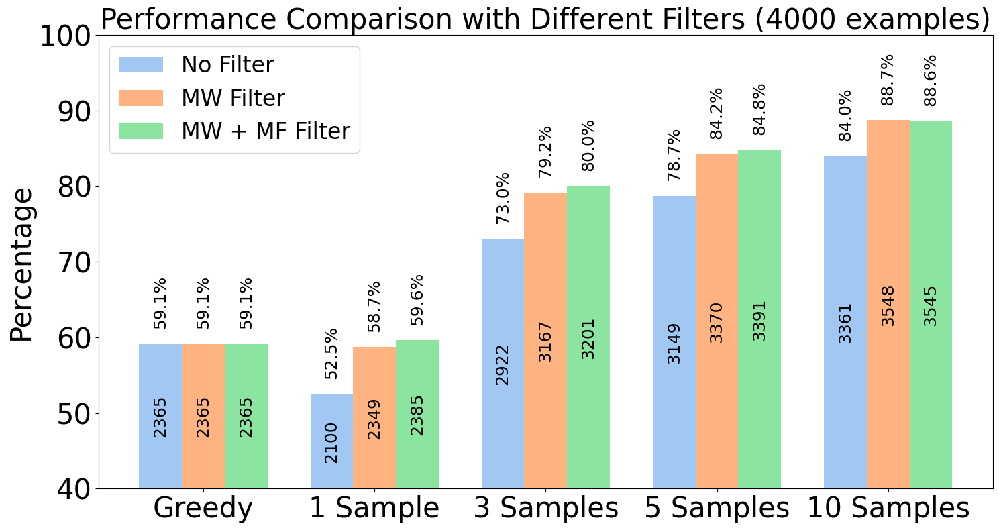

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os

def filter_first_n_examples(results_dict, n=4000):
    """Filter the first n examples from each results dictionary"""
    if isinstance(results_dict, dict):
        if "tanimoto_sim" in results_dict:
            # For greedy results (single level dict)
            filtered_dict = {}
            for key, value in results_dict.items():
                if isinstance(value, list):
                    filtered_dict[key] = value[:n]
                else:
                    filtered_dict[key] = value
            return filtered_dict
        else:
            # For MNS results (nested dict)
            filtered_dict = {}
            count = 0
            for idx in sorted(results_dict.keys()):
                if count >= n:
                    break
                remaining_slots = n - count
                samples_to_take = min(len(results_dict[idx]), remaining_slots)
                if samples_to_take > 0:
                    filtered_dict[idx] = results_dict[idx][:samples_to_take]
                    count += samples_to_take
            return filtered_dict
    return results_dict

def calc_percentage_and_count_top_x_correct_greedy(results_dict):
    count_yes = 0
    count_no = 0

    for i in results_dict["tanimoto_sim"]:
        if i == 1:
            count_yes += 1
        else:
            count_no += 1

    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total

def calc_percentage_and_count_top_x_correct(results_dict, top_x):
    count_yes = 0
    count_no = 0
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            tanimoto_sim = result["tanimoto_sim"][:top_x]
            if 1 in tanimoto_sim:
                count_yes += 1
            else:
                count_no += 1
    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total

def prepare_data(results_dict_FALSE_FALSE, results_dict_FALSE_TRUE, 
                 results_dict_TRUE_FALSE, results_dict_TRUE_TRUE, 
                 results_dict_greedy, n_examples=4000):
    
    # Filter all datasets to first n examples
    print(f"Filtering datasets to first {n_examples} examples...")
    
    filtered_FALSE_FALSE = filter_first_n_examples(results_dict_FALSE_FALSE, n_examples)
    filtered_FALSE_TRUE = filter_first_n_examples(results_dict_FALSE_TRUE, n_examples)
    filtered_TRUE_FALSE = filter_first_n_examples(results_dict_TRUE_FALSE, n_examples)
    filtered_TRUE_TRUE = filter_first_n_examples(results_dict_TRUE_TRUE, n_examples)
    filtered_greedy = filter_first_n_examples(results_dict_greedy, n_examples)
    
    # Calculate percentages for each filter combination
    def calc_percentages(results_dict, greedy_dict):
        percentage_greedy, count_greedy, total_greedy = calc_percentage_and_count_top_x_correct_greedy(greedy_dict)
        percentage_top_1, count_top_1, total_1 = calc_percentage_and_count_top_x_correct(results_dict, 1)
        percentage_top_3, count_top_3, total_3 = calc_percentage_and_count_top_x_correct(results_dict, 3)
        percentage_top_5, count_top_5, total_5 = calc_percentage_and_count_top_x_correct(results_dict, 5)
        percentage_top_10, count_top_10, total_10 = calc_percentage_and_count_top_x_correct(results_dict, 10)
        
        print(f"  Greedy: {count_greedy}/{total_greedy} = {percentage_greedy:.1f}%")
        print(f"  Top-1: {count_top_1}/{total_1} = {percentage_top_1:.1f}%")
        print(f"  Top-3: {count_top_3}/{total_3} = {percentage_top_3:.1f}%")
        print(f"  Top-5: {count_top_5}/{total_5} = {percentage_top_5:.1f}%")
        print(f"  Top-10: {count_top_10}/{total_10} = {percentage_top_10:.1f}%")
        
        return [(percentage_greedy, count_greedy), (percentage_top_1, count_top_1),
                (percentage_top_3, count_top_3), (percentage_top_5, count_top_5),
                (percentage_top_10, count_top_10)]

    print("\nNo Filter:")
    no_filter = calc_percentages(filtered_FALSE_FALSE, filtered_greedy)
    
    print("\nMF Filter:")
    mf_filter = calc_percentages(filtered_FALSE_TRUE, filtered_greedy)
    
    print("\nMW Filter:")
    mw_filter = calc_percentages(filtered_TRUE_FALSE, filtered_greedy)
    
    print("\nMW + MF Filter:")
    mw_mf_filter = calc_percentages(filtered_TRUE_TRUE, filtered_greedy)

    return no_filter, mf_filter, mw_filter, mw_mf_filter

def plot_results(no_filter, mf_filter, mw_filter, mw_mf_filter, n_examples=4000):
    labels = ['Greedy', '1 Sample', '3 Samples', '5 Samples', '10 Samples']
    x = np.arange(len(labels))
    width = 0.25  # Increased width to accommodate 3 bars
    colors = ['#A1C8F3', '#FFB381', '#8BE5A0', '#FF9D9A']
    
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Plot bars in the desired order - only 3 filters
    rects1 = ax.bar(x - width, [d[0] for d in no_filter], width, label='No Filter', color=colors[0])
    rects2 = ax.bar(x, [d[0] for d in mw_filter], width, label='MW Filter', color=colors[1])
    rects3 = ax.bar(x + width, [d[0] for d in mw_mf_filter], width, label='MW + MF Filter', color=colors[2])

    # Set labels and title with larger font sizes
    ax.set_ylabel('Percentage', fontsize=30)
    ax.set_title(f'Performance Comparison with Different Filters ({n_examples} examples)', fontsize=30)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=30)
    ax.legend(fontsize=24)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_ylim(40, 100)

    # Function to add annotations to the bars
    def autolabel(rects, data):
        for rect, (percentage, count) in zip(rects, data):
            height = rect.get_height()
            visible_height = height - 40  # Adjust for the 40% lower limit
            
            # Add rotated percentage on top of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, height + 2, f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=18, rotation=90)
            
            # Add count at the middle of the visible part of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, 40 + visible_height / 2, f'{count}',
                    ha='center', va='center', fontsize=18, rotation=90)

    # Add annotations to each bar - only 3 filters
    autolabel(rects1, no_filter)
    autolabel(rects2, mw_filter)
    autolabel(rects3, mw_mf_filter)

    fig.tight_layout()
    
    # Create output directory if it doesn't exist
    os.makedirs('./_FIGURES', exist_ok=True)
    plt.savefig(os.path.abspath(f'./_FIGURES/performance_comparison_with_counts_all_filters_{n_examples}_examples.png'), dpi=300, bbox_inches='tight')
    plt.show()

def main():
    """Main function to run the analysis with 4000 examples"""
    
    # Load your data
    file_path_base = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/')
    
    print("Loading data files...")
    with open(file_path_base + '/3.0.2_results_dict_mns_10_FALSE_FALSE_10000.pkl', 'rb') as file:
        results_dict_FALSE_FALSE = pickle.load(file)
    with open(file_path_base + '/3.0.2_results_dict_mns_10_FALSE_TRUE_10000.pkl', 'rb') as file:
        results_dict_FALSE_TRUE = pickle.load(file)
    with open(file_path_base + '/3.0.2_results_dict_mns_10_TRUE_FALSE_10000.pkl', 'rb') as file:
        results_dict_TRUE_FALSE = pickle.load(file)
    with open(file_path_base + '/3.0.2_results_dict_mns_10_TRUE_TRUE_10000.pkl', 'rb') as file:
        results_dict_TRUE_TRUE = pickle.load(file)
    with open(file_path_base + '/3.0.1_results_dict_greedy_FALSE_FALSE_10000.pkl', 'rb') as file:
        results_dict_greedy = pickle.load(file)
    
    # Prepare and plot data with 4000 examples
    no_filter, mf_filter, mw_filter, mw_mf_filter = prepare_data(
        results_dict_FALSE_FALSE, 
        results_dict_FALSE_TRUE,
        results_dict_TRUE_FALSE, 
        results_dict_TRUE_TRUE,
        results_dict_greedy,
        n_examples=4000
    )
    
    plot_results(no_filter, mf_filter, mw_filter, mw_mf_filter, n_examples=4000)
    
    return no_filter, mf_filter, mw_filter, mw_mf_filter

if __name__ == "__main__":
    results = main()

### 4.0. Similarity reduction plotting

#### 4.1 Tanimoto Similarity

In [4]:
import utils_MMT.experiment_function_v15_4 as exp_func
def main():
    np.random.seed(42)  # Set random seed for reproducibility   
    zinc_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv')
    save_folder = os.path.abspath("./_FIGURES")

    # Convert to absolute paths
    pubchem_paths = [
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv'),
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv'),
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
    ]
    
    weight_ranges = ['0-250 Da', '250-350 Da', '350-500 Da']

    print("Loading ZINC data...")
    zinc_smiles = exp_func.load_data_smi_list(zinc_path)
    zinc_smiles = exp_func.load_data_smi_list(zinc_path, sample_size=3000)

    zinc_fp = exp_func.calculate_fingerprints(zinc_smiles)  # Limit to 10000 compounds for performance

    for pubchem_path, weight_range in zip(pubchem_paths, weight_ranges):
        print(f"Processing PubChem data for {weight_range}...")
        pubchem_smiles = exp_func.load_data_smi_list(pubchem_path)
        pubchem_fp = exp_func.calculate_fingerprints(pubchem_smiles[:100])  # Limit to 100 compounds for performance

        combined_fp = np.vstack((zinc_fp, pubchem_fp))
        labels = np.array(['ZINC'] * len(zinc_fp) + ['PubChem'] * len(pubchem_fp))

        print("Performing dimensionality reduction...")
        tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_fp)

        print("Plotting results...")
        exp_func.plot_tsne_umap_pca([tsne_result, pca_result, umap_result], labels, 
                     f"ZINC vs PubChem ({weight_range})", 
                     ['t-SNE', 'PCA', 'UMAP'],
                     save_folder)

    print("All plots generated successfully!")



In [5]:
main()
    

Loading ZINC data...


Calculating fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [00:00<00:00, 6320.78it/s]


Processing PubChem data for 0-250 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 9926.17it/s]

Performing dimensionality reduction...


Plotting results...
Processing PubChem data for 250-350 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 6721.96it/s]

Performing dimensionality reduction...


Plotting results...
Processing PubChem data for 350-500 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 5075.58it/s]

Performing dimensionality reduction...


Plotting results...
All plots generated successfully!


#### 4.2 Vector Similarity

4.2.1 Pubchem vectorization

In [ ]:
# First block (commented out)
#config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = ''

# Second block (commented out)
#config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
#config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
#config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.pickle_file_path = ''

# Third block (active)
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = ''

# IR data folder
# config.IR_data_folder="./data/ZINK_dataset/IR_spectra_NN"
config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")



In [ ]:
# Test Data
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = ""

config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors.csv')

In [14]:
### Data needs to be loaded in csv_1H_path_SGNN 13C ...etc
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Pickle Loaded.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 11279.71it/s]
16it [01:12,  4.51s/it]


In [15]:
"""
vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")
"""

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 111979.50it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl


In [ ]:
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
config.pickle_file_path = ''

config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors.csv')

In [17]:
### Data needs to be loaded in csv_1H_path_SGNN 13C ...etc
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Pickle Loaded.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 16095.66it/s]
16it [01:12,  4.52s/it]


In [18]:
"""
vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")
"""

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 120415.25it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl


##### UMAP, tSNE, PCA Set 1-3

In [9]:
# Load test data
test_files = [
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'),
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl'),
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
]

weight_ranges = ['0-250 Da', '250-350 Da', '350-500 Da']
weight_ranges = ["Set 1", "Set 2", "Set 3"]
save_folder = os.path.abspath("./_FIGURES")

# Load training data
print("Loading training data...")
train_vectors, train_smiles = exp_func.load_pickle_data(os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl'), sample_size=3000)

for test_file, weight_range in zip(test_files, weight_ranges):
    print(f"Processing test data for {weight_range}...")
    test_vectors, test_smiles = exp_func.load_pickle_data(test_file)
    
    # Use only the first 100 test vectors
    test_vectors_sample = test_vectors[:300]
    
    combined_vectors = np.vstack((train_vectors, test_vectors_sample))
    labels = ['Train'] * len(train_vectors) + ['Test'] * len(test_vectors_sample)
    
    print(f"Shape of combined vectors: {combined_vectors.shape}")
    print(f"Number of labels: {len(labels)}")
    
    print("Performing dimensionality reduction...")
    tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_vectors)
    
    print("Plotting results...")
    exp_func.plot_tsne_umap_pca_train_test([tsne_result, pca_result, umap_result], labels, 
                 f"Train vs Test Vectors ({weight_range})", 
                 ['t-SNE', 'PCA', 'UMAP'],
                 save_folder)

print("All plots generated successfully!")

Loading training data...
Processing test data for Set 1...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
Processing test data for Set 2...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
Processing test data for Set 3...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
All plots generated successfully!


#### 4.3 1000 Calculations

##### PC and ZINC Latent space comparison for correct and incorrect molecules (FAIL now)
- calculations done: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer/scripts

In [4]:
"""
def main(data_configs, train_data_path, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    print("Loading training data...")
    train_vectors, train_smiles = exp_func.load_pickle_data(train_data_path, sample_size=3000)

    for data_config in data_configs:
        exp_func.process_dataset_(data_config, train_vectors, train_smiles, output_folder, ranking_method)

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_0_250/experiment_results_0_250.pkl')
        },
        {
            'weight_range': 'PC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_250_350/experiment_results_250_350.pkl')
        },
        {
            'weight_range': 'PC_350-500',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_350_500/experiment_results_350_500.pkl')
        },
        {
            'weight_range': 'ZINC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl.pkl')
        }
    ]

    train_data_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl')
    output_folder = os.path.abspath('./_FIGURES')
    ranking_method = 'HSQC'

    main(data_configs, train_data_path, output_folder, ranking_method)"""

Loading training data...
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241009_045807_before_sim_data_408_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241008_162040_before_sim_data_316_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241009_185415_before_sim_data_520_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241006_234610_before_sim_data_11_0.pkl
/projects/cc/se_users/knlr326/1_NMR_

KeyError: 'Fingerprints'

#### 4.4 Histograms for NN

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import random
import string

def main_csv_generation(data_configs, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    for data_config in data_configs:
        print(f"Processing {data_config['weight_range']}...")
        pos_csv_path, neg_csv_path = exp_func.process_dataset_and_save_csv(data_config, output_folder, ranking_method)
        print(f"Positive examples saved to: {pos_csv_path}")
        print(f"Negative examples saved to: {neg_csv_path}")

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_350-500',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350_4000',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        } ,       
    ]
    
    data_configs = [            
        {
            'weight_range': 'ZINC_250-350_4000',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        }  
    ]
    output_folder = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2')
    ranking_method = 'HSQC'

    #main_csv_generation(data_configs, output_folder, ranking_method)


#### After Fine-tuning for 100 neg compounds

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import random
import string

def main_csv_generation(data_configs, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    for data_config in data_configs:
        print(f"Processing {data_config['weight_range']}...")
        pos_csv_path, neg_csv_path = exp_func.process_dataset_and_save_csv(data_config, output_folder, ranking_method)
        print(f"Positive examples saved to: {pos_csv_path}")
        print(f"Negative examples saved to: {neg_csv_path}")

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_250-350_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_350-500_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        },
     
    ]

    
    output_folder = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples_2')
    ranking_method = 'HSQC'

    main_csv_generation(data_configs, output_folder, ranking_method)


In [ ]:
import pandas as pd
import os

# List of file paths
file_paths = [
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_positive.csv")
]

# Process each file
for file_path in file_paths:
    if os.path.exists(file_path):
        exp_func.rename_column_in_csv(file_path, "sample_id", "sample-id")
    else:
        print(f"File not found: {file_path}")

print("All files processed.")

Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_dat

In [ ]:
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negative.csv")


config.SGNN_gen_folder_path = os.path.abspath("./experiments/SGNN_gen_folder")
config = ex.gen_sim_aug_data(config, IR_config)
config.csv_path_val = config.csv_1H_path_SGNN
#config = ex.filter_invalid_criteria(config.csv_1H_path_SGNN)

outside ran_num
335713
335713
0
 run_sgnn: DONE
 run_1H_generation: DONE
 run_13C_generation: DONE
 run_COSY_generation: DONE
 run_HSQC_generation: DONE
 IR Generation: DONE


In [ ]:
import pandas as pd
import pickle
import torch
from tqdm import tqdm
import ast

config.pickle_file_path = ""
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt"
config.vector_db = config.SGNN_csv_gen_smi[:-4] + "vector.csv"
config = vectorize_db(config, stoi, stoi_MF, "db", "all")

vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")


Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/24_SGNN_gen_folder_2/data_1H_335713_440582.pkl
Pickle saved.


100%|███████████████████████████████████████████████████████████████████████████| 207/207 [00:00<00:00, 2722.13it/s]
4it [00:06,  1.53s/it]
100%|███████████████████████████████████████████████████████████████████████████| 207/207 [00:00<00:00, 5329.48it/s]


Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2.pkl


In [ ]:
PC_0_250_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positivevector_v2.pkl")
PC_250_350_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positivevector_v2.pkl")
PC_350_500_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positivevector_v2.pkl")
ZINC_250_350_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_positivevector_v2.pkl")

PC_0_250_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negativevector_v2.pkl")
PC_250_350_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negativevector_v2.pkl")
PC_350_500_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negativevector_v2.pkl")
ZINC_250_350_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negativevector_v2.pkl")

# big_vector_db = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/vector_db_train_5Mod_4M_v2_v2.pkl")
# output_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples")
# database_nr = 3975764


##### Chart PubChem, ZINC

In [10]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

# File paths
PC_0_250_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positive.csv")
PC_250_350_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positive.csv")
PC_350_500_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positive.csv")
ZINC_250_350_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_positive.csv")
PC_0_250_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negative.csv")
PC_250_350_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negative.csv")
PC_350_500_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negative.csv")
ZINC_250_350_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negative.csv")

# Save location for the figure
save_dir = "./_FIGURES"

#def load_pickle(file_path):
#    with open(file_path, 'rb') as file:
#        return pickle.load(file)
def load_pickle(file_path):
    return pd.read_csv(file_path)

def process_data(pos_df, neg_df):
    total_compounds = 1000  # Assuming 1000 compounds per range
    pos_count = len(pos_df)
    neg_count = len(neg_df)
    failed_count = total_compounds - (pos_count + neg_count)
    
    return {
        'Correct': (pos_count / total_compounds) * 100,
        'Incorrect': (neg_count / total_compounds) * 100,
        'Failed': (failed_count / total_compounds) * 100
    }

# Load DataFrames
PC_0_250_pos_df = pd.read_csv(PC_0_250_pos)
PC_0_250_neg_df = pd.read_csv(PC_0_250_neg)
PC_250_350_pos_df = pd.read_csv(PC_250_350_pos)
PC_250_350_neg_df = pd.read_csv(PC_250_350_neg)
PC_350_500_pos_df = pd.read_csv(PC_350_500_pos)
PC_350_500_neg_df = pd.read_csv(PC_350_500_neg)
ZINC_250_350_pos_df = pd.read_csv(ZINC_250_350_pos)
ZINC_250_350_neg_df = pd.read_csv(ZINC_250_350_neg)

# Process data
data_0_250 = process_data(PC_0_250_pos_df, PC_0_250_neg_df)
data_250_350 = process_data(PC_250_350_pos_df, PC_250_350_neg_df)
data_350_500 = process_data(PC_350_500_pos_df, PC_350_500_neg_df)
data_ZINC_250_350 = process_data(ZINC_250_350_pos_df, ZINC_250_350_neg_df)

# Prepare data for plotting
plot_data = {
    'Correct': [data_0_250['Correct'], data_250_350['Correct'], data_350_500['Correct'], data_ZINC_250_350['Correct']],
    'Incorrect': [data_0_250['Incorrect'], data_250_350['Incorrect'], data_350_500['Incorrect'], data_ZINC_250_350['Incorrect']],
    'Failed': [data_0_250['Failed'], data_250_350['Failed'], data_350_500['Failed'], data_ZINC_250_350['Failed']]
}

def create_stacked_bar_chart(data, categories, title, save_path):
    fontsize = 22
    colors = [
    '#8BE5A0',  # mint green
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]
    fig, ax = plt.subplots(figsize=(8, 8))
    
    bottom = np.zeros(4)
    bars = []
    for i, category in enumerate(categories):
        values = data[category]
        bar = ax.bar(range(4), values, bottom=bottom, label=category, color=colors[i], edgecolor='black')
        # Set black edges for each bar patch
        for patch in bar:
            patch.set_edgecolor('black')
        bottom += values
        bars.append(bar)
    
    ax.set_title(title, fontsize=fontsize, pad=20)
    ax.set_xticks(range(4))
    ax.set_xticklabels(['PC (0-250 Da)', 'PC (250-350 Da)', 'PC (350-500 Da)', 'ZINC (250-350 Da)'], fontsize=12)
    ax.set_xticklabels(['Set 1', 'Set 2', 'Set 3', 'ZINC'], fontsize=fontsize)
    ax.set_ylabel('Percentage', fontsize=fontsize)
    ax.set_ylim(0, 100)
    
    ax.tick_params(axis='y', labelsize=fontsize)
    
    ax.legend(loc='lower right', fontsize=fontsize-4)
    
    for i in ax.containers:
        ax.bar_label(i, fmt='%.1f%%', label_type='center', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(save_path)
    return fig

categories = ['Correct', 'Incorrect', 'Failed']

# Create save path
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
save_path = os.path.join(save_dir, 'PubChem_ZINC_Dataset_Results_v2.png')

fig = create_stacked_bar_chart(plot_data, categories, 'PubChem and ZINC Dataset Results', save_path)
"""
# Print the percentages for each range
for range_name, data in zip(['PC 0-250', 'PC 250-350', 'PC 350-500', 'ZINC 250-350'], 
                            [data_0_250, data_250_350, data_350_500, data_ZINC_250_350]):
    print(f"\nPercentages for {range_name} Da range:")
    for category, percentage in data.items():
        print(f"{category}: {percentage:.1f}%")

# Print DataFrame information
for name, df in [
    ("PC_0_250_pos", PC_0_250_pos_df),
    ("PC_0_250_neg", PC_0_250_neg_df),
    ("PC_250_350_pos", PC_250_350_pos_df),
    ("PC_250_350_neg", PC_250_350_neg_df),
    ("PC_350_500_pos", PC_350_500_pos_df),
    ("PC_350_500_neg", PC_350_500_neg_df),
    ("ZINC_250_350_pos", ZINC_250_350_pos_df),
    ("ZINC_250_350_neg", ZINC_250_350_neg_df)
]:
    print(f"\n{name} DataFrame:")
    print(df.info())
    print(df.head())

print(f"\nFigure saved to: {save_path}")"""

./_FIGURES/PubChem_ZINC_Dataset_Results_v2.png


'\n# Print the percentages for each range\nfor range_name, data in zip([\'PC 0-250\', \'PC 250-350\', \'PC 350-500\', \'ZINC 250-350\'], \n                            [data_0_250, data_250_350, data_350_500, data_ZINC_250_350]):\n    print(f"\nPercentages for {range_name} Da range:")\n    for category, percentage in data.items():\n        print(f"{category}: {percentage:.1f}%")\n\n# Print DataFrame information\nfor name, df in [\n    ("PC_0_250_pos", PC_0_250_pos_df),\n    ("PC_0_250_neg", PC_0_250_neg_df),\n    ("PC_250_350_pos", PC_250_350_pos_df),\n    ("PC_250_350_neg", PC_250_350_neg_df),\n    ("PC_350_500_pos", PC_350_500_pos_df),\n    ("PC_350_500_neg", PC_350_500_neg_df),\n    ("ZINC_250_350_pos", ZINC_250_350_pos_df),\n    ("ZINC_250_350_neg", ZINC_250_350_neg_df)\n]:\n    print(f"\n{name} DataFrame:")\n    print(df.info())\n    print(df.head())\n\nprint(f"\nFigure saved to: {save_path}")'

##### Save 100 neg molecules

In [ ]:
import pickle
import pandas as pd
import os

# File paths
negative_files = {
    'PC_0_250': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2.pkl"),
    'PC_250_350': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negativevector_v2.pkl"),
    'PC_350_500': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2.pkl"),
    'ZINC_250_350': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2.pkl")
}

def load_pickle(file_path):
    with open(file_path, 'rb') as file:
        return pickle.load(file)

def sample_and_save(file_path, sample_size=100):
    # Load the DataFrame
    df = load_pickle(file_path)
    
    # Sample 100 rows
    sampled_df = df.sample(n=sample_size, random_state=42)
    
    # Create the new file name
    dir_path = os.path.dirname(file_path)
    file_name = os.path.basename(file_path)
    new_file_name = file_name.replace('.pkl', '_100_neg.csv')
    new_file_path = os.path.join(dir_path, new_file_name)
    
    # Save the sampled DataFrame as CSV
    sampled_df.to_csv(new_file_path, index=False)
    
    print(f"Saved {sample_size} samples to: {new_file_path}")

# Process each negative file
for name, file_path in negative_files.items():
    print(f"Processing {name}...")
    sample_and_save(file_path)

print("All files processed and saved.")

Processing PC_0_250...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2_100_neg.csv
Processing PC_250_350...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negativevector_v2_100_neg.csv
Processing PC_350_500...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2_100_neg.csv
Processing ZINC_250_350...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2_100_neg.csv
All files processed and saved.


In [ ]:
import pandas as pd
import os

# File paths
csv_files = [
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negativevector_v2_100_neg.csv")
]

def add_sample_id(file_path):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Create the sample-id column
    df['sample-id'] = [f'NEG{i:05d}' for i in range(1, len(df) + 1)]
    
    # Move the sample-id column to the first position
    cols = df.columns.tolist()
    cols = ['sample-id'] + [col for col in cols if col != 'sample-id']
    df = df[cols]
    
    # Save the updated DataFrame back to CSV
    df.to_csv(file_path, index=False)
    
    print(f"Added sample-id column to: {file_path}")
    print(f"First 5 rows of the updated file:")
    print(df.head())
    print("\n")

# Process each CSV file
for file_path in csv_files:
    add_sample_id(file_path)

print("All files processed and updated with sample-id column.")

Added sample-id column to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2_100_neg.csv
First 5 rows of the updated file:
  sample-id                            SMILES  \
0  NEG00001    CC1=CC(=NNC(=O)c2ccc(N)cc2)CC1   
1  NEG00002  CN(C)c1ccc(-c2c(O)c(=O)c2=O)cc1O   
2  NEG00003            CCNCc1cnc(N2CCCC2C)nc1   
3  NEG00004               COS(=O)N(C)c1ccccc1   
4  NEG00005         O=C(C1=CC1(F)F)C1=CC1(F)F   

                                        Fingerprints  
0  tensor([ 2.3913e-01, -9.8808e-02, -2.1557e-01,...  
1  tensor([ 2.6198e-01, -1.4705e-01, -2.9422e-01,...  
2  tensor([ 9.9007e-02,  7.9029e-02, -2.8461e-01,...  
3  tensor([ 7.0396e-02, -1.7321e-01, -2.5102e-01,...  
4  tensor([ 3.4665e-01, -1.8020e-01, -4.4709e-01,...  


Added sample-id column to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350

#### 4.5 Use 100 of each failed categories to do the improvment cycle

In [ ]:
def should_skip_chunk(base_path, chunk_idx):
    """
    Check if a chunk folder exists and contains sufficient processed data,
    ignoring timestamps in folder names.
    
    Args:
        base_path (str): Base directory path
        chunk_idx (int): Index of the chunk to check
        
    Returns:
        bool: True if the chunk should be skipped (already processed), False otherwise
    """
    import os
    
    # Format the chunk prefix to match (ensuring 3 digits with leading zeros)
    chunk_prefix = f"chunk_{chunk_idx:03d}_"
    
    # Get all directories in base_path
    try:
        all_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
        
        # Find matching chunk folder (ignoring timestamp)
        matching_chunks = [d for d in all_dirs if d.startswith(chunk_prefix)]
        
        if not matching_chunks:
            return False
            
        # Use the first matching chunk folder found
        chunk_folder = matching_chunks[0]
        chunk_path = os.path.join(base_path, chunk_folder)
        
        # Check if there are any run folders inside the chunk folder
        run_folders = [d for d in os.listdir(chunk_path) if os.path.isdir(os.path.join(chunk_path, d))]
        if not run_folders:
            return False
        
        # Check if at least one run folder contains more than 5 files
        for run_folder in run_folders:
            run_path = os.path.join(chunk_path, run_folder)
            files = [f for f in os.listdir(run_path) if os.path.isfile(os.path.join(run_path, f))]
            if len(files) > 5:
                return True
                
        return False
        
    except Exception as e:
        print(f"Error checking chunk {chunk_idx}: {str(e)}")
        return False


def main_IC_neg(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, num_training_runs=3):
    chunks = icne.split_dataset(config, chunk_size)
    config.model_save_dir = config.pkl_save_folder
    model_save_dir_backup = config.model_save_dir
    original_checkpoint_path = config.checkpoint_path  # Store the original checkpoint path

    for chunk_idx, chunk in enumerate(chunks):
        print(f"Processing chunk {chunk_idx+1} of {len(chunks)}")
        
        if should_skip_chunk(config.pkl_save_folder, chunk_idx):
            print(f"Skipping chunk {chunk_idx+1} as it appears to be already processed")
            continue
            
        # If we reach here, either the chunk doesn't exist or is incomplete
        # Find and delete any existing incomplete chunk folder
        chunk_prefix = f"chunk_{chunk_idx:03d}_"
        try:
            all_dirs = [d for d in os.listdir(config.pkl_save_folder) if os.path.isdir(os.path.join(config.pkl_save_folder, d))]
            matching_chunks = [d for d in all_dirs if d.startswith(chunk_prefix)]
            if matching_chunks:
                chunk_to_delete = os.path.join(config.pkl_save_folder, matching_chunks[0])
                print(f"Removing incomplete chunk folder: {matching_chunks[0]}")
                shutil.rmtree(chunk_to_delete)
        except Exception as e:
            print(f"Error while trying to delete incomplete chunk folder: {str(e)}")
            
            
        chunk_folder = icne.create_chunk_folder(config, chunk_idx)
        config.current_chunk_folder = chunk_folder
            
        config.blank_percentage = 0
        config = icne.test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{0}")
        print(config.csv_1H_path_SGNN)
        for run_idx in range(num_training_runs):
            print(f"Starting training run {run_idx+1} of {num_training_runs}")
            
            run_folder = icne.create_run_folder(config.current_chunk_folder, f"{chunk_idx}_{run_idx}")
            config.current_run_folder = run_folder
            config.model_save_dir = run_folder

            config.blank_percentage = 50
            config, aug_mol_df, all_gen_smis = icne.fine_tune_model_aug_mol(config, IR_config, stoi, stoi_MF, chunk, f"{chunk_idx}_{run_idx}")
            #import IPython; IPython.embed();

            ### Retrun the labelling of the smiles to test it on the correct one
            #chunk.rename(columns={'SMILES': 'SMILES_regio_isomers', 'SMILES_orig': 'SMILES'}, inplace=True)

            config.blank_percentage = 0
            config = icne.setup_data_paths(config)
            config = icne.test_model_on_neg_dataset(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{run_idx}", aug_mol_df, all_gen_smis)

            config.checkpoint_path = original_checkpoint_path
        
        print(f"Chunk {chunk_idx+1} completed. All training runs finished.")
        config.model_save_dir = model_save_dir_backup


In [ ]:
### RUN 
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.pkl_save_folder = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2_100_neg.csv")

config.MF_generations = 30 #50
config.MF_delta_weight = 100
config.max_scaffold_generations = 300
config.blank_percentage = 50
config.weight_MW = 100
config.lr_pretraining = 3e-4
config.tr_te_split = 0.9
config.batch_size = 64
config.num_epochs = 30
config.temperature = 1
config.multinom_runs = 20 #20
config.train_data_blend = 0

chunk_size = 1

main_IC_neg(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, 1)

In [14]:
import os
def analyze_chunks(base_path):
    """
    Analyze all chunk folders to find those that don't meet requirements.
    
    Args:
        base_path (str): Path to the directory containing chunk folders
    """
    incomplete_chunks = []
    try:
        # Get all directories in base_path
        all_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
        chunk_dirs = [d for d in all_dirs if d.startswith('chunk_')]
        
        for chunk_dir in chunk_dirs:
            chunk_path = os.path.join(base_path, chunk_dir)
            
            # Check run folders
            run_folders = [d for d in os.listdir(chunk_path) if os.path.isdir(os.path.join(chunk_path, d))]
            
            has_sufficient_files = False
            for run_folder in run_folders:
                run_path = os.path.join(chunk_path, run_folder)
                files = [f for f in os.listdir(run_path) if os.path.isfile(os.path.join(run_path, f))]
                if len(files) > 5:
                    has_sufficient_files = True
                    break
            
            if not has_sufficient_files:
                incomplete_chunks.append(chunk_dir)
        
        print(f"\nTotal chunks analyzed: {len(chunk_dirs)}")
        print(f"Number of incomplete chunks: {len(incomplete_chunks)}")
        print("\nIncomplete chunks:")
        for chunk in incomplete_chunks:
            print(f"- {chunk}")
            
    except Exception as e:
        print(f"Error during analysis: {str(e)}")

# Run the analysis
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
analyze_chunks(base_path)


Total chunks analyzed: 0
Number of incomplete chunks: 0

Incomplete chunks:


In [ ]:
# delete before files
import os

def delete_before_files(base_path):
    """
    Delete all files containing 'before' in their name from the directory and its subdirectories.
    
    Args:
        base_path (str): Path to the directory to clean
    """
    count = 0
    try:
        # Walk through all directories and subdirectories
        for root, dirs, files in os.walk(base_path):
            # Find files containing 'before'
            before_files = [f for f in files if 'before' in f.lower()]
            
            # Delete each file
            for file in before_files:
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    print(f"Deleted: {file_path}")
                    count += 1
                except Exception as e:
                    print(f"Error deleting {file_path}: {str(e)}")
        
        print(f"\nTotal files deleted: {count}")
        
    except Exception as e:
        print(f"Error walking through directory: {str(e)}")

# Run the deletion
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
delete_before_files(base_path)

Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_204423_before_sim_data_21_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_150313_before_sim_data_70_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_152914_before_sim_data_73_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_132327_before_sim_data_57_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_121602_before_sim_data_46_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_

##### Calculate pos/neg after FT

In [ ]:
data_configs = [
        {
            'weight_range': 'PC_0-250_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'PC_250-350_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_250_350_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'PC_350-500_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'ZINC_250-350_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },    
    ]

    
output_folder = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/CSV_examples_2')
ranking_method = 'HSQC'

#main_csv_generation(data_configs, output_folder, ranking_method)


Processing PC_0-250_neg_100_IC...
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_175020_sim_sim_data_86_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_151504_sim_sim_data_60_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241025_155132_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241026_115132_sim_sim_data_90_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_150702_sim_sim_data_59_0.pkl
Processed 100 unique molecules
Saved 56 examples to /projects/cc/se_users/knlr326

##### Plot correct, incorrect, failed after IC

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/CSV_examples_2")

def load_and_process_data(weight_range):
    pos_file = f"{base_path}/PC_{weight_range}_neg_100_IC_positive.csv"
    neg_file = f"{base_path}/PC_{weight_range}_neg_100_IC_negative.csv"
    
    if weight_range == "ZINC_250-350":
        pos_file = f"{base_path}/ZINC_250-350_neg_100_IC_positive.csv"
        neg_file = f"{base_path}/ZINC_250-350_neg_100_IC_negative.csv"
    
    pos_df = pd.read_csv(pos_file)
    neg_df = pd.read_csv(neg_file)
    
    total = 100  # Total molecules per set
    correct = len(pos_df)
    incorrect = len(neg_df)
    failed = total - (correct + incorrect)
    
    return {
        'Correct': (correct/total) * 100,
        'Incorrect': (incorrect/total) * 100,
        'Failed': (failed/total) * 100
    }

# Process data for each set
data_0_250 = load_and_process_data("0-250")
data_250_350 = load_and_process_data("250-350")
data_350_500 = load_and_process_data("350-500")
data_zinc = load_and_process_data("ZINC_250-350")

# Prepare plotting data
plot_data = {
    'Correct': [data_0_250['Correct'], data_250_350['Correct'], data_350_500['Correct'], data_zinc['Correct']],
    'Incorrect': [data_0_250['Incorrect'], data_250_350['Incorrect'], data_350_500['Incorrect'], data_zinc['Incorrect']],
    'Failed': [data_0_250['Failed'], data_250_350['Failed'], data_350_500['Failed'], data_zinc['Failed']]
}

def create_stacked_bar_chart(data, categories, title, save_path):
    fontsize = 22
    colors = [
        '#8BE5A0',  # mint green for Failed
        '#A1C8F3',  # light blue for Correct
        '#FFB381',  # salmon for Incorrect
    ]
    
    fig, ax = plt.subplots(figsize=(8, 7))
    bottom = np.zeros(4)
    
    bars = []
    for i, category in enumerate(categories):
        values = data[category]
        bar = ax.bar(range(4), values, bottom=bottom, label=category, color=colors[i], edgecolor='black')
        for patch in bar:
            patch.set_edgecolor('black')
        bottom += values
        bars.append(bar)
    
    ax.set_title(title, fontsize=fontsize, pad=20)
    ax.set_xticks(range(4))
    ax.set_xticklabels(['Set 1', 'Set 2', 'Set 3', 'ZINC'], fontsize=fontsize)
    ax.set_ylabel('Percentage', fontsize=fontsize)
    ax.set_ylim(0, 100)
    
    ax.tick_params(axis='y', labelsize=fontsize)
    
    ax.legend(loc='lower right', fontsize=fontsize)
    
    for i in ax.containers:
        ax.bar_label(i, fmt='%.1f%%', label_type='center', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    return fig

# Create and save the plot
save_path = "./_FIGURES/IC_Results.png"
categories = ['Correct', 'Incorrect', 'Failed']
fig = create_stacked_bar_chart(plot_data, categories, 'Internal Coordinate Results', save_path)

# Print the percentages for verification
for i, dataset in enumerate(['Set 1 (0-250)', 'Set 2 (250-350)', 'Set 3 (350-500)', 'ZINC']):
    print(f"\n{dataset}:")
    for category in categories:
        print(f"{category}: {plot_data[category][i]:.1f}%")


Set 1 (0-250):
Correct: 56.0%
Incorrect: 43.0%
Failed: 1.0%

Set 2 (250-350):
Correct: 72.0%
Incorrect: 28.0%
Failed: 0.0%

Set 3 (350-500):
Correct: 68.0%
Incorrect: 31.0%
Failed: 1.0%

ZINC:
Correct: 54.0%
Incorrect: 46.0%
Failed: 0.0%


##### Plot Top 1, 3, 5, 10 Accuracy of IC

In [35]:
## PC 0-250
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 1 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_0_250_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_150702_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_175020_sim_sim_data_86_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241025_155132_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241026_11513

In [36]:
## PC 250-350
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_250_350_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 2 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_250_350_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 100 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/PC_250_350_neg_IC_accuracy_plot.png


In [21]:
all_rankings

defaultdict(list,
            {'Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1': [('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               1.0,
               0,
               0.0020805762652434646,
               0.000676388687870075),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(CSc2nncn2-c2ccccc2)nnc1N',
               0.6949152542372882,
               1,
               0.006926558582532103,
               0.006603137530727683),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(N)nc(SCc2nncn2-c2ccccc2)n1',
               0.6666666666666666,
               2,
               0.010497967702782678,
               0.0015632903960649648),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1cccc(Nc2nc(N)nc(CSc3nncn3-c3ccccc3)n2)c1',
               0.7413793103448276,
               3,
               0.0117279678231530

In [37]:
## PC 350-500
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 3 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_350_500_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 99 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/PC_350_500_neg_IC_accuracy_plot.png


In [38]:
## ZINC 0-250
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of ZINC (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/ZINC_250_350_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 100 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC_250_350_neg_IC_accuracy_plot.png


#### 4.5 Bar chart of ESI 7 HSQC Matching results ZINC 100

In [5]:

# V8i Raw 
config.csv_train_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100_955629.pkl')
config.IR_data_folder = os.path.abspath('./data/ZINK_dataset/IR_spectra_NN')


config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.multinom_runs = 10
#config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True
config.data_size = 100 # config.test_size # why would I do that? 

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
config.execution_type = "test_performance"
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 5 1.1
3 6 1.2000000000000002
4 8 1.3000000000000003
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 3 1.1
3 7 1.2000000000000002
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 4 1.1
3 4 1.2000000000000002
4 5 1.3000000000000003
5 5 1.4000000000000004
6 5 1.5000000000000004
7 7 1.6000000000000005
run_sgnn_sim_calculations_if_possible_return_spectra


KeyboardInterrupt: 

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/20240522_ZINC_MNS_HSQC_matching/7.0_imp_cyc_all_100_10_after.pkl'), 'wb') as f:
    pickle.dump(variables_to_save, f)


In [10]:
file_path = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/20240522_ZINC_MNS_HSQC_matching/7.0_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    variables_to_save = pickle.load(file)  

In [11]:
results_dict_bl_ZINC = variables_to_save["results_dict_bl_ZINC"]

In [12]:
# Function to check if the lowest error correctly identifies the correct molecule
def check_lowest_error_correct(results):
    correct_identifications = 0
    total_cases_with_correct_answer = 0
    total_cases_without_correct_answer = 0
    closest_identifications = 0
    incorrect_identification_keys = []

    for key, value in results.items():
        if not isinstance(value, list) or not isinstance(value[0], list):
            continue  # Skip non-list items

        for sublist in value:
            if not isinstance(sublist, list):
                continue  # Skip non-list sublists

            correct_error = None
            lowest_error = float('inf')
            highest_similarity = 0
            closest_error = float('inf')

            for item in sublist:
                if not isinstance(item, list) or len(item) < 5:
                    continue  # Skip invalid items

                similarity = item[3]
                error = item[4]

                if isinstance(similarity, (int, float)) and similarity == 1:
                    correct_error = float(error)
                if isinstance(error, (int, float)) and float(error) < lowest_error:
                    lowest_error = float(error)
                if isinstance(similarity, (int, float)) and similarity > highest_similarity:
                    highest_similarity = similarity
                    closest_error = float(error)

            if correct_error is not None:
                total_cases_with_correct_answer += 1
                if correct_error == lowest_error:
                    correct_identifications += 1
                else:
                    incorrect_identification_keys.append(key)
            else:
                total_cases_without_correct_answer += 1
                if closest_error == lowest_error:
                    closest_identifications += 1

    return (correct_identifications, total_cases_with_correct_answer, 
            closest_identifications, total_cases_without_correct_answer,
            incorrect_identification_keys)

# Run the function
correct_identifications, total_cases_with_correct_answer, closest_identifications, total_cases_without_correct_answer, incorrect_identification_keys = check_lowest_error_correct(results_dict_bl_ZINC)

# Calculate accuracies
accuracy_with_correct = correct_identifications / total_cases_with_correct_answer if total_cases_with_correct_answer > 0 else 0
accuracy_without_correct = closest_identifications / total_cases_without_correct_answer if total_cases_without_correct_answer > 0 else 0

# Print results
print(f"Correct identifications: {correct_identifications}")
print(f"Total cases with correct answer: {total_cases_with_correct_answer}")
print(f"Accuracy with correct answer: {accuracy_with_correct:.2%}")

print(f"Closest identifications: {closest_identifications}")
print(f"Total cases without correct answer: {total_cases_without_correct_answer}")
print(f"Accuracy without correct answer: {accuracy_without_correct:.2%}")

# Print keys of incorrect identifications
print(f"Keys of incorrect identifications: {incorrect_identification_keys}")


Correct identifications: 80
Total cases with correct answer: 89
Accuracy with correct answer: 89.89%
Closest identifications: 3
Total cases without correct answer: 11
Accuracy without correct answer: 27.27%
Keys of incorrect identifications: ['CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1', 'CN(Cc1ccc(OC(F)F)c(F)c1)Cc1nccn1C', 'CC(=O)N1CC2CC(NC(=O)C=CC3CC3)CC1C2', 'CC1COCCC1NC(=O)NCC1(C)CCOC2(CCC2)C1', 'c1cnc2cc(CN3CCCC4(CCO4)C3)[nH]c2c1', 'CCCC(=O)N1CCC2C(CCN2C(=O)c2ccc(F)s2)C1', 'Cc1cc(C(=O)NC2CCCCN(C(=O)C3CCCN3C)C2)on1', 'O=C(N1CCCC(CNCC2CCOC2)C1)C12CCCN1CCC2', 'COC(C1CC1)C(C)NC(=O)N=c1[nH]nc2ccccn12']


In [16]:
total_cases_greedy

100

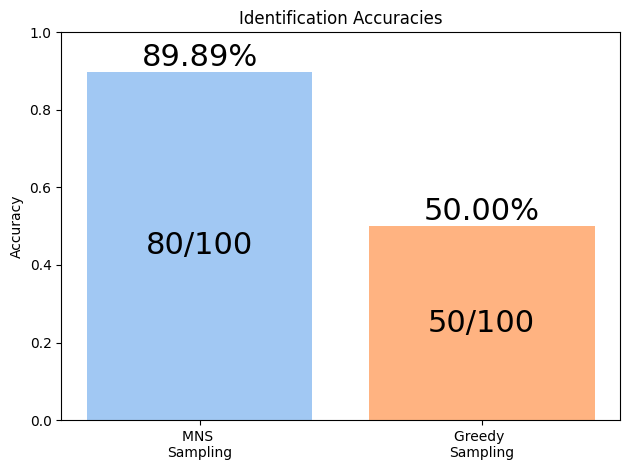

In [17]:
import matplotlib.pyplot as plt

tani_list = variables_to_save["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
greedy_correct = tani_list.count(1)
total_cases = len(tani_list)
accuracy_greedy = greedy_correct / total_cases

# Bar chart for identification accuracies
accuracies = {
    'MNS \nSampling': accuracy_with_correct,
    'Greedy \nSampling': accuracy_greedy
}

# Ratios for annotation
ratios = {
    #'MNS': f'{correct_identifications}/{total_cases_with_correct_answer}',
    'MNS': f'{correct_identifications}/{total_cases}',
    'Greedy Sampling': f'{greedy_correct}/{total_cases}'
}

fig, ax = plt.subplots()
bars = ax.bar(accuracies.keys(), accuracies.values(), color=['#A1C8F3',  '#FFB381'])  # LightBlue, LightGreen

ax.set_ylabel('Accuracy')
ax.set_title('Identification Accuracies')
ax.set_ylim(0, 1)

# Annotate bars with accuracy percentages on top of the bar
for bar, (label, ratio) in zip(bars, ratios.items()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height,
            f'{height:.2%}',
            ha='center', va='bottom', fontsize=22)

# Annotate bars with ratios inside the bar
for bar, (label, ratio) in zip(bars, ratios.items()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height / 2,
            f'{ratio}',
            ha='center', va='center', fontsize=22, color='black')

plt.tight_layout()

# Define the file path for saving the plot
output_path = os.path.abspath('./_FIGURES/7.0_identification_accuracies_new_2.png')

# Save the plot
plt.savefig(output_path, bbox_inches='tight')
plt.show()

#### 4.7 ZINC 4000 MNS Experiment

In [23]:
ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)
accuracies = accuracies[:-2]

/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000/20241022_044832_before_sim_data_3288_0.pkl
Processed 3992 unique molecules


In [ ]:
accuracies_

In [24]:
all_rankings

defaultdict(list,
            {'Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1': [('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               1.0,
               0,
               0.0023562599879555584,
               0.0075867250930982885),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(C)CC(=O)N(C)CCN1CCCC1',
               0.8181818181818182,
               1,
               0.015084218603031356,
               0.017568435408505473),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(CCN(C)C)C(=O)CN1CCCC1',
               0.5490196078431373,
               2,
               0.01605203280439599,
               0.016602823031718852),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(CCN1CCCC1)CC(=O)N(C)C',
               0.6666666666666666,
               3,
               0.016274793631373352,
               0.013813744589792986),
              ('Cc1ccccc1CN(C)C

In [24]:
accuracies

[0.7223476297968398, 0.8008527715073991, 0.8377225984449461, 0.908201655379985]

File path: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000/20241022_152242_before_sim_data_3917_0.pkl
File exists: True

Successfully loaded pickle file!
Data type: <class 'dict'>

Dictionary keys: ['avg_tani_bl_ZINC', 'results_dict_greedy_bl_ZINC', 'failed_bl_ZINC', 'avg_tani_greedy_bl_ZINC', 'results_dict_ZINC_greedy_bl', 'total_results_bl_ZINC', 'corr_sampleing_prob_bl_ZINC', 'results_dict_bl_ZINC']
Number of keys: 8

Key: 'avg_tani_bl_ZINC'
  Type: <class 'float'>

Key: 'results_dict_greedy_bl_ZINC'
  Type: <class 'NoneType'>

Key: 'failed_bl_ZINC'
  Type: <class 'NoneType'>

Key: 'avg_tani_greedy_bl_ZINC'
  Type: <class 'float'>

Key: 'results_dict_ZINC_greedy_bl'
  Type: <class 'dict'>
  Length: 9
  Sub-keys: ['gen_conv_SMI_list', 'trg_conv_SMI_list', 'tanimoto_sim', 'tanimoto_mean', 'tanimoto_std_dev', 'failed', 'prob_list', 's

In [30]:
data["results_dict_bl_ZINC"]

{'Cc1cc(C(=O)NCC2CCN(C(C)c3nncn3C)C2)ccc1F': [[['Cc1cc(C(=O)NCC2CCN(C(C)c3nncn3C)C2)ccc1F',
    2.1756815910339355,
    41.37738037109375,
    tensor([0.9926, 1.0000, 1.0000, 1.0000, 0.9321, 0.9999, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 0.9998, 1.0000, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000], device='cuda:0'),
    1.0,
    [0.010324924152721026, 0.008834543102524057]],
   ['Cc1ccc(C(=O)NCC2CCN(C(C)c3nncn3C)C2)cc1F',
    2.0659055709838867,
    42.21276092529297,
    tensor([0.9926, 1.0000, 1.0000, 1.0000, 0.0679, 1.0000, 0.9983, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 0.9998, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_accuracy_plot.png


In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import torch

def process_pkl_files_multinomial(folder_path):
    """
    Process pickle files and sort by multinomial probability (product of token probabilities)
    """
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl')]
    
    all_molecules_multinomial = defaultdict(list)
    
    for file_path in pkl_files:
        file_data = exp_func.load_data_results(file_path)  
        try:
            molecules = extract_molecules_by_probability(file_data)
            trg_smi = molecules[0][0] if molecules else None
            if trg_smi:
                for molecule in molecules:
                    all_molecules_multinomial[trg_smi].append(molecule)
        except Exception as e:
            print(f"Error processing: {file_path} - {e}")
            continue
    
    print(f"Processed {len(all_molecules_multinomial)} unique molecules (multinomial probability)")
    return all_molecules_multinomial

def extract_molecules_by_probability(file_data):
    """
    Extract molecules and sort by multiplicative token probability (multinomial sampling order)
    """
    molecule_data = []
    
    for trg_smi, value_list in file_data.items():
        try:
            for sublist in value_list[0]:
                gen_smi = sublist[0]
                # Position 3 contains the tensor with token probabilities
                token_probs = sublist[3]  
                tanimoto = sublist[4]
                
                # Convert tensor to numpy if needed and calculate product
                if isinstance(token_probs, torch.Tensor):
                    token_probs_np = token_probs.cpu().numpy()
                else:
                    token_probs_np = np.array(token_probs)
                
                # Calculate multiplicative probability (product of all token probabilities)
                multiplicative_prob = np.prod(token_probs_np)
                
                # Store: (target_smi, generated_smi, tanimoto, multiplicative_probability)
                molecule_data.append((trg_smi, gen_smi, tanimoto, multiplicative_prob))
                
        except Exception as e:
            print(f"Error processing molecule data: {e}")
            pass
    
    # Sort by multiplicative probability (descending - highest probability first)
    # This represents the multinomial sampling order
    molecule_data.sort(key=lambda x: x[3], reverse=True)
    
    return molecule_data

def calculate_multinomial_top1_accuracy(all_molecules_multinomial):
    """
    Calculate top-1 accuracy for multinomial sampling (highest probability molecule)
    """
    total_molecules = len(all_molecules_multinomial)
    correct_count = 0
    
    for trg_smi, molecules in all_molecules_multinomial.items():
        if molecules:  # Check if there are any molecules
            # Take the molecule with highest multiplicative probability (first after sorting)
            top_molecule = molecules[0]
            if top_molecule[2] == 1.0:  # Check if Tanimoto = 1.0
                correct_count += 1
    
    accuracy = correct_count / total_molecules if total_molecules > 0 else 0
    return accuracy

def calculate_multinomial_topk_accuracy(all_molecules_multinomial, k_values=[1, 3, 5, 10]):
    """
    Calculate top-k accuracy for multinomial sampling
    """
    total_molecules = len(all_molecules_multinomial)
    accuracies = []
    
    for k in k_values:
        correct_count = 0
        for trg_smi, molecules in all_molecules_multinomial.items():
            if molecules:
                # Check top-k molecules (highest k probabilities)
                top_k_molecules = molecules[:k]
                if any(mol[2] == 1.0 for mol in top_k_molecules):
                    correct_count += 1
        
        accuracy = correct_count / total_molecules if total_molecules > 0 else 0
        accuracies.append(accuracy)
    
    return accuracies

def create_combined_accuracy_plot(multinomial_accuracies, ranked_accuracies, 
                                total_molecules=4000, processed_molecules=3992):
    """
    Create plot with multinomial sampling top-1 + ranked accuracies
    """
    # Increase default font sizes
    plt.rcParams.update({'font.size': 22})
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.labelsize'] = 22
    plt.rcParams['xtick.labelsize'] = 22
    plt.rcParams['ytick.labelsize'] = 22
    
    # Combine accuracies: only multinomial top-1, then ranked accuracies
    all_accuracies = [multinomial_accuracies[0]] + ranked_accuracies[:-2]  # Remove last 2 as in original
    
    # Labels
    labels = ['Multinomial\nTop 1', 'HSQC Ranked\nTop 1', 'HSQC Ranked\nTop 3', 
              'HSQC Ranked\nTop 5', 'HSQC Ranked\nTop 10']
    
    # Calculate molecules for each accuracy
    failed_molecules = total_molecules - processed_molecules
    molecules = [int(acc * processed_molecules) for acc in all_accuracies]
    all_molecules = molecules + [failed_molecules]
    all_labels = labels + ['Failed']
    
    # Different colors for each bar
    colors = ['#FFB366', '#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC']
    
    # Create the bar plot
    fig, ax = plt.subplots(figsize=(14, 9))
    bars = ax.bar(range(len(all_molecules)), all_molecules, color=colors)
    
    # Set black edges for all bars
    for bar in bars:
        bar.set_edgecolor('black')
    
    # Customize the plot
    ax.set_xticks(range(len(all_labels)))
    ax.set_xticklabels(all_labels, fontsize=20, rotation=45, ha='right')
    ax.set_ylabel('Number of Molecules', fontsize=22)
    ax.set_title('Multinomial vs HSQC Ranked Prediction Accuracy (Total: 4000)', fontsize=22, pad=20)
    
    # Add value labels on top and inside of each bar
    for i, bar in enumerate(bars):
        height = bar.get_height()
        if i < len(all_accuracies):  # For accuracy bars
            percentage = all_accuracies[i] * 100
            # Percentage on top
            ax.text(bar.get_x() + bar.get_width()/2., height + 50,
                    f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Number inside bar
            ax.text(bar.get_x() + bar.get_width()/2., height/2,
                    f'{int(height)}',
                    ha='center', va='center', fontsize=20, color='black')
        else:  # For failed molecules bar
            percentage = (height/total_molecules) * 100
            # Percentage on top - moved higher for failed bar
            ax.text(bar.get_x() + bar.get_width()/2., height + 200,
                    f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Number inside bar - moved higher for failed bar
            ax.text(bar.get_x() + bar.get_width()/2., height + 100,
                    f'{int(height)}',
                    ha='center', va='center', fontsize=20, color='black')
    
    # Add grid for better readability
    ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    # Set y-axis limit to accommodate labels
    ax.set_ylim(0, max(all_molecules) + 400)
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save the plot
    save_path = os.path.abspath("./_FIGURES/ZINC4000_multinomial_vs_ranked_accuracy.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Plot saved to: {save_path}")
    
    return all_accuracies

def main_comparison(folder_path):
    """
    Main function to compare multinomial probability vs ranked accuracies
    """
    print("=== CALCULATING MULTINOMIAL PROBABILITY ACCURACIES ===")
    # Calculate multinomial accuracy (sorted by probability)
    all_molecules_multinomial = process_pkl_files_multinomial(folder_path)
    
    # Apply your existing deduplication and filtering if needed
    all_molecules_multinomial, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_molecules_multinomial)
    all_molecules_multinomial, filtered_out = exp_func.filter_rankings_by_molecular_formula(all_molecules_multinomial)
    
    multinomial_accuracies = calculate_multinomial_topk_accuracy(all_molecules_multinomial, [1, 3, 5, 10])
    
    print("=== CALCULATING HSQC RANKED ACCURACIES ===")
    # Calculate ranked accuracies (your existing code)
    all_rankings = exp_func.process_pkl_files_baseline(folder_path, 'HSQC')  # Your existing function
    all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
    all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
    ranked_accuracies = exp_func.calculate_top_k_accuracy(all_rankings)  # Your existing function
    
    # Create combined plot
    all_accuracies = create_combined_accuracy_plot(multinomial_accuracies, ranked_accuracies)
    
    print("\n=== RESULTS COMPARISON ===")
    print(f"Multinomial Top-1 Accuracy: {multinomial_accuracies[0]:.3f}")
    print(f"HSQC Ranked Top-1 Accuracy: {ranked_accuracies[0]:.3f}")
    print(f"Top-1 Improvement: {(ranked_accuracies[0] - multinomial_accuracies[0]):.3f}")
    
    print(f"Multinomial Top-10 Accuracy: {multinomial_accuracies[3]:.3f}")
    print(f"HSQC Ranked Top-10 Accuracy: {ranked_accuracies[3]:.3f}")
    print(f"Top-10 Improvement: {(ranked_accuracies[3] - multinomial_accuracies[3]):.3f}")
    
    return multinomial_accuracies, ranked_accuracies

# Example usage:
if __name__ == "__main__":
    folder_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
    multinomial_acc, ranked_acc = main_comparison(folder_path)

=== CALCULATING MULTINOMIAL PROBABILITY ACCURACIES ===
Processed 3993 unique molecules (multinomial probability)
=== CALCULATING HSQC RANKED ACCURACIES ===
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000/20241022_044832_before_sim_data_3288_0.pkl
Processed 3992 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_multinomial_vs_ranked_accuracy.png

=== RESULTS COMPARISON ===
Multinomial Top-1 Accuracy: 0.686
HSQC Ranked Top-1 Accuracy: 0.722
Top-1 Improvement: 0.036
Multinomial Top-10 Accuracy: 0.908
HSQC Ranked Top-10 Accuracy: 0.908
Top-10 Improvement: -0.000


In [134]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle

def load_greedy_accuracy():
    """
    Load greedy accuracy from the 1% data file
    """
    file_path = './past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_ZINC_4000.pkl'
    
    try:
        full_path = os.path.abspath(file_path)
        with open(full_path, 'rb') as file:
            results_dict = pickle.load(file)
        
        # Extract Tanimoto similarity data - look for keys starting with "tanimoto_scores_"
        tanimoto_sim = []
        for key in results_dict.keys():
            if key.startswith("tanimoto_scores_"):
                tanimoto_sim = results_dict[key]
                print(f"Found Tanimoto data in key: {key}")
                break
        
        if not tanimoto_sim:
            print("No 'tanimoto_scores_*' key found, checking 'tanimoto_sim'")
            tanimoto_sim = results_dict.get("tanimoto_sim", [])
        
        if len(tanimoto_sim) > 0:
            # Count molecules with Tanimoto similarity = 1.0 (perfect matches)
            correct_count = sum(1 for sim in tanimoto_sim if sim == 1.0)
            total_count = len(tanimoto_sim)
            accuracy = correct_count / total_count if total_count > 0 else 0
            
            print(f"Greedy results - Total molecules: {total_count}")
            print(f"Greedy results - Correct molecules: {correct_count}")
            print(f"Greedy results - Accuracy: {accuracy:.3f}")
            
            return accuracy, correct_count, total_count
        else:
            print("No Tanimoto data found in greedy file")
            return 0, 0, 0
            
    except Exception as e:
        print(f"Error loading greedy file: {e}")
        return 0, 0, 0

def create_greedy_vs_ranked_accuracy_plot(greedy_accuracy, ranked_accuracies, 
                                        total_molecules=4000, processed_molecules=3992):
    """
    Create plot with greedy + ranked accuracies
    """
    # Increase default font sizes
    plt.rcParams.update({'font.size': 22})
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.labelsize'] = 22
    plt.rcParams['xtick.labelsize'] = 22
    plt.rcParams['ytick.labelsize'] = 22
    
    # Combine accuracies: greedy first, then ranked accuracies (remove last 2 as in original)
    all_accuracies = [greedy_accuracy] + ranked_accuracies[:-2]
    
    # Labels
    labels = ['Greedy\nSampling', 'HSQC Ranked\nTop 1', 'HSQC Ranked\nTop 3', 
              'HSQC Ranked\nTop 5', 'HSQC Ranked\nTop 10']
    
    # Calculate molecules for each accuracy
    failed_molecules = total_molecules - processed_molecules
    molecules = [int(acc * processed_molecules) for acc in all_accuracies]
    all_molecules = molecules + [failed_molecules]
    all_labels = labels + ['Failed']
    
    # Different colors for each bar
    colors = ['#FF6B6B', '#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC']
    
    # Create the bar plot
    fig, ax = plt.subplots(figsize=(14, 9))
    bars = ax.bar(range(len(all_molecules)), all_molecules, color=colors)
    
    # Set black edges for all bars
    for bar in bars:
        bar.set_edgecolor('black')
    
    # Customize the plot
    ax.set_xticks(range(len(all_labels)))
    ax.set_xticklabels(all_labels, fontsize=20, rotation=45, ha='right')
    ax.set_ylabel('Number of Molecules', fontsize=22)
    ax.set_title('Greedy vs HSQC Ranked Prediction Accuracy (Total: 4000)', fontsize=22, pad=20)
    
    # Add value labels on top and inside of each bar
    for i, bar in enumerate(bars):
        height = bar.get_height()
        if i < len(all_accuracies):  # For accuracy bars
            percentage = all_accuracies[i] * 100
            # Percentage on top
            ax.text(bar.get_x() + bar.get_width()/2., height + 50,
                    f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Number inside bar
            ax.text(bar.get_x() + bar.get_width()/2., height/2,
                    f'{int(height)}',
                    ha='center', va='center', fontsize=20, color='black')
        else:  # For failed molecules bar
            percentage = (height/total_molecules) * 100
            # Percentage on top - moved higher for failed bar
            ax.text(bar.get_x() + bar.get_width()/2., height + 200,
                    f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20)
            # Number inside bar - moved higher for failed bar
            ax.text(bar.get_x() + bar.get_width()/2., height + 100,
                    f'{int(height)}',
                    ha='center', va='center', fontsize=20, color='black')
    
    # Add grid for better readability
    ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    # Set y-axis limit to accommodate labels
    ax.set_ylim(0, max(all_molecules) + 400)
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save the plot
    save_path = os.path.abspath("./_FIGURES/ZINC4000_greedy_vs_ranked_accuracy.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"Plot saved to: {save_path}")
    
    return all_accuracies

def main_greedy_comparison(folder_path):
    """
    Main function to compare greedy vs ranked accuracies
    """
    print("=== LOADING GREEDY ACCURACY (1% DATA) ===")
    # Load greedy accuracy from 1% data file
    greedy_accuracy, greedy_correct, greedy_total = load_greedy_accuracy()
    
    print("=== CALCULATING HSQC RANKED ACCURACIES ===")
    # Calculate ranked accuracies (your existing code)
    all_rankings = exp_func.process_pkl_files_baseline(folder_path, 'HSQC')  # Your existing function
    all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
    all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
    ranked_accuracies = exp_func.calculate_top_k_accuracy(all_rankings)  # Your existing function
    
    # Create combined plot
    all_accuracies = create_greedy_vs_ranked_accuracy_plot(greedy_accuracy, ranked_accuracies)
    
    print("\n=== RESULTS COMPARISON ===")
    print(f"Greedy Sampling Accuracy: {greedy_accuracy:.3f}")
    print(f"HSQC Ranked Top-1 Accuracy: {ranked_accuracies[0]:.3f}")
    print(f"Top-1 Improvement: {(ranked_accuracies[0] - greedy_accuracy):.3f}")
    
    print(f"Greedy Sampling Accuracy: {greedy_accuracy:.3f}")
    print(f"HSQC Ranked Top-10 Accuracy: {ranked_accuracies[3]:.3f}")
    print(f"Top-10 Improvement: {(ranked_accuracies[3] - greedy_accuracy):.3f}")
    
    return greedy_accuracy, ranked_accuracies

# Example usage:
if __name__ == "__main__":
    folder_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
    greedy_acc, ranked_acc = main_greedy_comparison(folder_path)

=== LOADING GREEDY ACCURACY (1% DATA) ===
Found Tanimoto data in key: tanimoto_scores_
Greedy results - Total molecules: 3934
Greedy results - Correct molecules: 2382
Greedy results - Accuracy: 0.605
=== CALCULATING HSQC RANKED ACCURACIES ===
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000/20241022_044832_before_sim_data_3288_0.pkl
Processed 3992 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_greedy_vs_ranked_accuracy.png

=== RESULTS COMPARISON ===
Greedy Sampling Accuracy: 0.605
HSQC Ranked Top-1 Accuracy: 0.722
Top-1 Improvement: 0.117
Greedy Sampling Accuracy: 0.605
HSQC Ranked Top-10 Accuracy: 0.908
Top-10 Improvement: 0.303


#### 4.8 Probabilty analysis

##### Data processing

In [62]:
import os
import pickle
from typing import List, Tuple

def process_pkl_files(folder_path: str) -> Tuple[List[float], List[float]]:
    """
    Process PKL files in the specified folder and separate molecules based on correctness.
    
    Args:
        folder_path (str): Path to the folder containing PKL files
        
    Returns:
        Tuple[List[float], List[float]]: Two lists containing correct and incorrect molecules
    """
    # Lists to store correct and incorrect molecules
    correct_molecules = []
    incorrect_molecules = []
    
    # Get all PKL files in the folder
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl')]
    
    # Process each PKL file
    for idx, pkl_file in enumerate(pkl_files[:]):
        # print( idx, len(correct_molecules), len(incorrect_molecules), pkl_file )
        try:
            with open(pkl_file, 'rb') as f:
                data = pickle.load(f)
            
            # Access the results dictionary
            results_dict = data["results_dict_bl_ZINC"]
            
            # Process each molecule in the results
            for smiles, molecule_data in results_dict.items():
                # Get the first item's data
                first_molecule = molecule_data[0][0]
                # Check if the length is at least 6 to safely access index 4
                if len(first_molecule) >= 6:
                    correctness_value = first_molecule[4]  # Fifth item (index 4)
                    
                    # Store the tensor values based on correctness
                    tensor_values = first_molecule[3]  # Fourth item (index 3)
                    
                    # Convert tensor to list if it's a tensor
                    if hasattr(tensor_values, 'tolist'):
                        tensor_values = tensor_values.tolist()
                    
                    # Classify based on correctness value
                    if correctness_value == 1.0:
                        correct_molecules.append(first_molecule)
                        #print(idx,len(correct_molecules)+len(incorrect_molecules))
                    else:
                        incorrect_molecules.append(first_molecule)
                       # print(idx,len(correct_molecules)+len(incorrect_molecules))
                    break
        except Exception as e:
            print(f"Error processing file {pkl_file}: {str(e)}")
            continue
    
    return correct_molecules, incorrect_molecules

def analyze_results(correct_molecules: List[float], incorrect_molecules: List[float]) -> None:
    """
    Print analysis of the processed molecules.
    
    Args:
        correct_molecules (List[float]): List of correct molecule values
        incorrect_molecules (List[float]): List of incorrect molecule values
    """
    print(f"\nAnalysis Results:")
    print(f"Number of correct molecules: {len(correct_molecules)}")
    print(f"Number of incorrect molecules: {len(incorrect_molecules)}")
    
# Example usage:
if __name__ == "__main__":
    # Example folder path
    folder_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
    
    # Process the files
    correct_molecules, incorrect_molecules = process_pkl_files(folder_path)
    
    # Analyze the results
    analyze_results(correct_molecules, incorrect_molecules)


Analysis Results:
Number of correct molecules: 3622
Number of incorrect molecules: 377


Number of correct molecules processed: 3622
Number of incorrect molecules processed: 377
Figure saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_min_prob_fixed.png


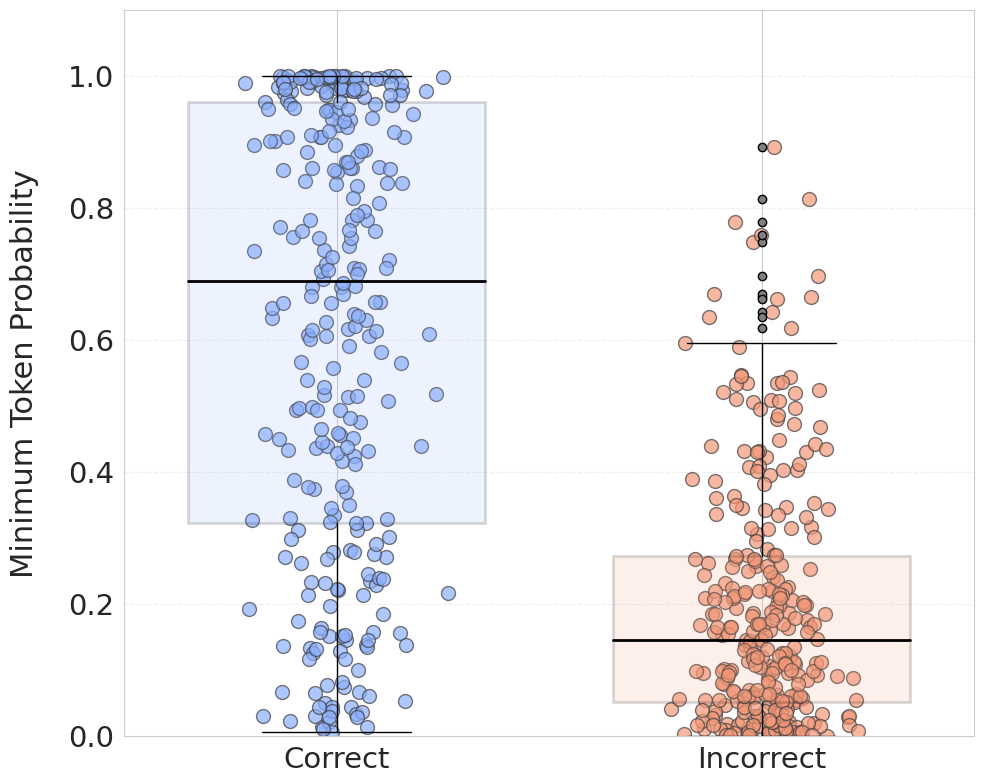


Summary Statistics (based on full dataset):

Correct molecules minimum probabilities:
Mean: 0.6254
Median: 0.6898
Std Dev: 0.3340
Number of samples plotted: 300

Incorrect molecules minimum probabilities:
Mean: 0.1959
Median: 0.1453
Std Dev: 0.1844
Number of samples plotted: 300


In [63]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os


def extract_minimum_props(molecules_list):
    """
    Extract minimum probability values from tensor data in molecules list.
    
    Args:
        molecules_list (list): List of molecule data where each item contains a tensor
        
    Returns:
        list: List of minimum probability values
    """
    minimum_props = []
    
    for molecule in molecules_list:
        # Get the tensor (fourth item, index 3)
        tensor_data = molecule[3]
        
        # Convert tensor to list if it's not already
        if hasattr(tensor_data, 'tolist'):
            tensor_values = tensor_data.tolist()
        else:
            tensor_values = tensor_data
            
        # Get the minimum value
        min_value = min(tensor_values)
        minimum_props.append(min_value)
    
    return minimum_props

# Example usage:
correct_min_props = extract_minimum_props(correct_molecules)
incorrect_min_props = extract_minimum_props(incorrect_molecules)

# Print some basic statistics
print(f"Number of correct molecules processed: {len(correct_min_props)}")
print(f"Number of incorrect molecules processed: {len(incorrect_min_props)}")


def plot_probability_distribution(correct_props, incorrect_props, max_samples=300):
    """
    Create a box plot with enhanced styling for probability distributions.
    
    Args:
        correct_props (list): List of probability values for correct molecules
        incorrect_props (list): List of probability values for incorrect molecules
        max_samples (int): Maximum number of samples to plot for each category
    """
    # Sample data if needed
    if len(correct_props) > max_samples:
        correct_props = np.random.choice(correct_props, max_samples, replace=False)
    if len(incorrect_props) > max_samples:
        incorrect_props = np.random.choice(incorrect_props, max_samples, replace=False)
    
    # Define colors
    colors = ['#8CB0FE', '#F39878']
    
    # Create figure and axis with larger size
    plt.figure(figsize=(10, 8))
    
    # Create box plot with MUCH lower opacity or no fill
    data = [correct_props, incorrect_props]
    box_plot = plt.boxplot(data, 
                          labels=['Correct', 'Incorrect'], 
                          patch_artist=True,
                          widths=0.7,
                          medianprops=dict(color="black", linewidth=2),
                          flierprops=dict(marker='o', markerfacecolor='gray'),
                          boxprops=dict(linewidth=2))
    
    # Add more padding to the plot
    plt.margins(x=0.2)
    
    # Customize axis limits for more vertical space
    plt.ylim(0, 1.1)
    
    # Customize the plot with larger font sizes
    plt.ylabel('Minimum Token Probability', labelpad=21, fontsize=22)
    
    # Increase tick label sizes
    plt.xticks(fontsize=21)
    plt.yticks(fontsize=21)
    
    # OPTION 1: Make box plots nearly transparent (recommended)
    for box, color in zip(box_plot['boxes'], colors):
        box.set(facecolor=color, alpha=0.15)  # Much lower alpha (was 0.8)
    
    # OPTION 2: Alternative - Remove box fill completely (uncomment if preferred)
    # for box in box_plot['boxes']:
    #     box.set(facecolor='none')  # No fill color
    
    # Add individual points with jitter, matching the box colors
    for i, (data_points, color) in enumerate(zip([correct_props, incorrect_props], colors), 1):
        # Add jitter to x-coordinates
        x = np.random.normal(i, 0.08, size=len(data_points))
        
        # Plot points with edge color
        plt.scatter(x, data_points, 
                   c=[color],  # Fill color
                   edgecolors='#404040',  # Dark gray edge
                   linewidth=1,  # Edge width
                   alpha=0.7,  # Slightly higher alpha for better visibility
                   s=100)  # Slightly larger points
    
    # Add grid for better readability
    plt.grid(True, axis='y', linestyle='--', alpha=0.3)
    
    # Adjust layout to prevent cutting off
    plt.tight_layout()
    
    # Save the plot
    save_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_min_prob_fixed.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Figure saved to: {save_path}")
    plt.show()
    
    # Print summary statistics
    print("\nSummary Statistics (based on full dataset):")
    print("\nCorrect molecules minimum probabilities:")
    print(f"Mean: {np.mean(correct_props):.4f}")
    print(f"Median: {np.median(correct_props):.4f}")
    print(f"Std Dev: {np.std(correct_props):.4f}")
    print(f"Number of samples plotted: {len(correct_props)}")

    print("\nIncorrect molecules minimum probabilities:")
    print(f"Mean: {np.mean(incorrect_props):.4f}")
    print(f"Median: {np.median(incorrect_props):.4f}")
    print(f"Std Dev: {np.std(incorrect_props):.4f}")
    print(f"Number of samples plotted: {len(incorrect_props)}")

# Example usage:
plot_probability_distribution(correct_min_props, incorrect_min_props, max_samples=300)

In [ ]:
ranking_method = 'HSQC'
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

#### 4.9 Dataset of 34 molecules with simulated data vectorization - t-SNE

In [14]:
# Test Data - Updated to use 8.0_Sim_Data paths
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_13C_924509.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_HSQC_924509.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_COSY_924509.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509.csv')
config.pickle_file_path = ""

# IR data folder
config.IR_data_folder = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/IR_data_924509')
config.data_size = 34  # Updated to match the dataset size
config.checkpoint_path = os.path.abspath('./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt')
# Save vectors in the same 8.0_Sim_Data folder
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509_Vectors.csv')

In [15]:
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509_322864.pkl
Pickle saved.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 1307.47it/s]
1it [00:00,  1.15it/s]


In [16]:

vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 40857.40it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509_Vectors_v2.pkl


In [10]:


def plot_tsne_umap_pca_train_test(results, labels, title, methods, save_folder):
    plt.rcParams.update({'font.size': 22})  # Set base font size
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.suptitle(title, fontsize=22)

    for ax, result, method in zip(axes, results, methods):
        for label, color, alpha in zip(set(labels), ['#FFB381', '#A1C8F3'], [0.5, 0.5]):
            mask = np.array(labels) == label
            ax.scatter(result[mask, 0], result[mask, 1], c=color, label=label, alpha=alpha)
       
        ax.legend(fontsize=22)  # Set legend font size
        ax.set_title(method, fontsize=22, pad=20)  # Set subplot title font size and add padding
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    #plt.savefig(f"{title.replace(' ', '_')}.png")
    # save_folder = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2"
    save_path = os.path.join(save_folder, f"{title.replace(' ', '_')}.png")
    plt.savefig(save_path)

    plt.close()


In [11]:
# Load test data - your new 8.0_Sim_Data
test_files = [
    os.path.abspath('./past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509_Vectors_v2.pkl')
]
weight_ranges = ["Sim Data (34 samples)"]
save_folder = os.path.abspath("./_FIGURES")

# Load training data
print("Loading training data...")
train_vectors, train_smiles = exp_func.load_pickle_data(
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl'), 
    sample_size=3000
)

for test_file, weight_range in zip(test_files, weight_ranges):
    print(f"Processing test data for {weight_range}...")
    test_vectors, test_smiles = exp_func.load_pickle_data(test_file)
    
    # Use all your test vectors (should be 34 based on your data_size)
    test_vectors_sample = test_vectors[:34]  # Use all 34 samples
    
    combined_vectors = np.vstack((train_vectors, test_vectors_sample))
    labels = ['Train'] * len(train_vectors) + ['Test'] * len(test_vectors_sample)
    
    print(f"Shape of combined vectors: {combined_vectors.shape}")
    print(f"Number of labels: {len(labels)}")
    print(f"Train samples: {len(train_vectors)}")
    print(f"Test samples: {len(test_vectors_sample)}")
    
    print("Performing dimensionality reduction...")
    tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_vectors)
    
    print("Plotting results...")
    plot_tsne_umap_pca_train_test([tsne_result, pca_result, umap_result], labels, 
                 f"Train vs Simulated Data Vectors", 
                 ['t-SNE', 'PCA', 'UMAP'],
                 save_folder)

print("All plots generated successfully!")

Loading training data...
Processing test data for Sim Data (34 samples)...
Shape of combined vectors: (3034, 512)
Number of labels: 3034
Train samples: 3000
Test samples: 34
Performing dimensionality reduction...
Plotting results...
All plots generated successfully!


#### 4.10 Dataset of 34 molecules with Experimental data vectorization - t-SNE

In [18]:
# Test Data - Updated to use 8.0_Experimental_Data paths
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_1H_with_AZ_SMILES_v3.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_13C_with_AZ_SMILES_v3.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_HSQC_with_AZ_SMILES_v3.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_COSY_with_AZ_SMILES_v3.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_1H_with_AZ_SMILES_v3.csv')
config.pickle_file_path = ""
# IR data folder
config.IR_data_folder = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/IR_data')
config.data_size = 34  # Update this to match your actual experimental dataset size
config.checkpoint_path = os.path.abspath('./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt')
# Save vectors in the same 8.0_Experimental_Data folder
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_experimental_data_Vectors.csv')

In [19]:
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/8.0_Experimenta_Data/real_1H_with_AZ_SMILES_v3_818418.pkl
Pickle saved.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 5737.31it/s]
1it [00:00,  4.62it/s]


In [20]:

vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 35493.38it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/8.0_Experimenta_Data/real_experimental_data_Vectors_v2.pkl


In [12]:
# Load test data - your new 8.0_Experimental_Data
test_files = [
    os.path.abspath('./past_experiments/ChemXriv/8.0_Experimenta_Data/real_experimental_data_Vectors_v2.pkl')
]
weight_ranges = ["Experimental Data (34 samples)"]
save_folder = os.path.abspath("./_FIGURES")

# Load training data
print("Loading training data...")
train_vectors, train_smiles = exp_func.load_pickle_data(
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl'), 
    sample_size=3000
)

for test_file, weight_range in zip(test_files, weight_ranges):
    print(f"Processing test data for {weight_range}...")
    test_vectors, test_smiles = exp_func.load_pickle_data(test_file)
    
    # Use all your test vectors (should be 34 based on your data_size)
    test_vectors_sample = test_vectors[:34]  # Use all 34 samples
    
    combined_vectors = np.vstack((train_vectors, test_vectors_sample))
    labels = ['Train'] * len(train_vectors) + ['Test'] * len(test_vectors_sample)
    
    print(f"Shape of combined vectors: {combined_vectors.shape}")
    print(f"Number of labels: {len(labels)}")
    print(f"Train samples: {len(train_vectors)}")
    print(f"Test samples: {len(test_vectors_sample)}")
    
    print("Performing dimensionality reduction...")
    tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_vectors)
    
    print("Plotting results...")
    plot_tsne_umap_pca_train_test([tsne_result, pca_result, umap_result], labels, 
                 f"Train vs Experimental Data Vectors", 
                 ['t-SNE', 'PCA', 'UMAP'],
                 save_folder)

print("All plots generated successfully!")

Loading training data...
Processing test data for Experimental Data (34 samples)...
Shape of combined vectors: (3034, 512)
Number of labels: 3034
Train samples: 3000
Test samples: 34
Performing dimensionality reduction...
Plotting results...
All plots generated successfully!


### 5.0 Test Improvement cycle 

#### 5.1 Fine Tune on all the molecules that I want to investigate

In [ ]:
config.project = "Improv_Cycle_v3" # Name of the project for wandb monitoring
config.csv_train_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/val_data_all_moldalities/ML_NMR_1H_combined_ZINC_test_10x100_955629.pkl')

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

# V8 Raw 
#config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data")

#config.IR_data_folder = ""
config.IR_data_folder = os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")

#  8Vi Raw Drop
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")

config.data_size = 100 # config.test_size # why would I do that? 
#config.data_size = 4 # config.test_size # why would I do that? 
config.execution_type = "test_performance"
config.multinom_runs = 1
#config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True
config.MF_generations = 50
config.MF_delta_weight = 20
config.max_scaffold_generations = 30


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [35]:
#Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items()]
filtered_results

['CCCNC(=O)CNC(=O)c1ccc(N(CC)C(C)C)cc1',
 'O=C(NC1C2CN(C(=O)C3CC3)CC21)C1CCC(C(F)(F)F)C1',
 'CN1CCCC1c1cc(C(=O)N(CC2CC2)C2CC2)n[nH]1',
 'Cc1nc(C)c(CN(C)CC2CCN(C(=O)CC3CC3)C2)o1',
 'CCc1ccc(CN2CCCC2CNC(=O)C(C(C)C)N(C)C)cc1',
 'COc1ccc(CNCC(N2CCOCC2)C(F)(F)F)cc1O',
 'N#CCCCCNc1ccccc1S(N)(=O)=O',
 'O=C(NCC1CN(CC2CC2)CCO1)c1nc2ccccn2c1F',
 'COc1ccc2cc(C(C)Nc3ccn(CC(N)=O)n3)ccc2c1',
 'CCSCCC(=O)NC(C)C1CCN(C(=O)c2cc(F)c[nH]2)C1',
 'CC(NC(=O)C1CC1)C1CCCCN1C(=O)c1nc[nH]c2nccc1-2',
 'CCC(CNC(=O)C1(SC)CCC1)NC(=O)C1(SC)CCC1',
 'Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'CCC(NC(=O)CCNC(=O)CC(C)C)C1CC1(C)C',
 'OC1CCCCC1C1CCCCN1Cc1nnc(C2CC2)o1',
 'CC1CC(N)CN1C(=O)Nc1ccc(C#N)c(C(F)(F)F)c1',
 'CCC(C)(C)C(=O)N1CCC(N(C)Cc2noc(CCOC)n2)C1',
 'COc1cc(Br)cnc1CN1CCCC12COC2',
 'CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1',
 'O=C(NCC1CCCN1CCC1CCOC1)C1CC2CC2C1',
 'CCCCOC(C)C(=O)NCCCNCc1cn(C)nc1C',
 'CC(Cc1cnccn1)NCCCOc1ccc(C(F)(F)F)cn1',
 'CCOC1CC(CC(=O)N2CCC(CNC(=O)c3cccnc3)C2)C1',
 'CCn1cc(CC(=O)NCC(NCc2cc(C)on2)

In [ ]:
# Create a DataFrame
data = {
    "SMILES": filtered_results,
    "sample-id": [f"SOURCE_00000{i+1}" for i in range(len(filtered_results))]
}

df = pd.DataFrame(data)

# Save DataFrame to CSV
csv_file_path = os.path.abspath('./deep-molecular-optimization/deep-molecular-optimization/data/MMP/test_selection_2.csv'
df.to_csv(csv_file_path, index=False)
csv_path_val_backup = config.csv_path_val
pickle_file_path_backup = config.pickle_file_path

print(f"CSV file '{csv_file_path}' created successfully.")

CSV file '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/deep-molecular-optimization/data/MMP/test_selection_2.csv' created successfully.


In [ ]:
config.execution_type = "SMI_generation_MF"

if config.execution_type == "SMI_generation_MF":
    config.n_samples = config.data_size
    #if config.execution_type == "SMI_generation_MF":
    print("\033[1m\033[31mThis is: SMI_generation_MF\033[0m")
    config.csv_path_val  = ex.filter_invalid_criteria(config.csv_path_val)#, config.csv_path_val)
    config, results_dict_MF = ex.SMI_generation_MF(config, stoi, stoi_MF, itos, itos_MF)
    #mode = "val"

    # Iterate through the dictionary and remove 'nan' from lists
    results_dict_MF = {key: value for key, value in results_dict_MF.items() if not hf.contains_only_nan(value)}
    for key, value in results_dict_MF.items():
        results_dict_MF[key] = hf.remove_nan_from_list(value)

    combined_list_MF, html_TSNE, html_UMAP, html_PCA = cv.plot_cluster_MF(results_dict_MF, config)
    max_num = 10
    html_plot = pt.plot_molecules_from_list(combined_list_MF, max_num)
    config.execution_type = "combine_MMT_MF"
    #import IPython; IPython.embed();
    print(config.data_size)


In [38]:
config.execution_type = "combine_MMT_MF"
combined_list_MMT = []
if config.execution_type == "combine_MMT_MF":
    print("\033[1m\033[31mThis is: combine_MMT_MF\033[0m")
    all_gen_smis = combined_list_MMT + combined_list_MF
    combined_list_MF = [smiles for smiles in combined_list_MF if smiles != 'NAN']
    all_gen_smis = [smiles for smiles in all_gen_smis if smiles != 'NAN']
    
    #filter out potential hits from the real test_set
    val_data = pd.read_csv(config.csv_path_val)
    all_gen_smis = mrtf.filter_smiles(val_data, all_gen_smis)
    length_of_list = len(all_gen_smis)   
    random_number_strings = [f"GT_{str(i).zfill(7)}" for i in range(1, length_of_list + 1)]
    aug_mol_df = pd.DataFrame({'SMILES': all_gen_smis, 'sample-id': random_number_strings})
    config.execution_type = "blend_prev_train_data"


This is: combine_MMT_MF


In [39]:
config.train_data_blend = 0
config.execution_type = "blend_prev_train_data"
if config.execution_type == "blend_prev_train_data":
    print("\033[1m\033[31mThis is: blend_prev_train_data\033[0m")
    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)
    config.execution_type = "data_generation"
    #import IPython; IPython.embed();


This is: blend_prev_train_data
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/24_SGNN_gen_folder_2/51059.csv


In [ ]:
config.execution_type = "data_generation"
if config.execution_type == "data_generation":
    #config.csv_SMI_targets = config.csv_1H_path_SGNN
    print("\033[1m\033[31mThis is: data_generation\033[0m")
    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"
    sim_data_gen = True
    #import IPython; IPython.embed();

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'all_gen_smis': all_gen_smis,
    'aug_mol_df': aug_mol_df,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [44]:
# config.csv_SMI_targets = config.csv_1H_path_SGNN
# data_IR = irs.run_IR_simulation(config, IR_config, "target")
# config.IR_data_folder = data_IR


In [ ]:
config.blank_percentage = 0
config.weight_MW = 0
config.lr_pretraining = 1e-4
config.tr_te_split = 0.9
config.model_save_dir = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/imp_cyc_all_100_50_v2") # Folder where networks are saved
data_size = len(pd.read_csv(config.csv_1H_path_SGNN))
config.data_size = data_size
config.gpu_num = 1
config.batch_size = 64
config.num_epochs = 50

In [ ]:
config.execution_type = "transformer_improvement"
sim_data_gen = True

if config.execution_type == "transformer_improvement" and sim_data_gen == True:
    print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
    config.training_setup = "pretraining"
    mtf.run_MMT(config, stoi, stoi_MF)

    # config.execution_type = "clip_improvement"
    config.execution_type = "update_model"
    # finish_while = True
    #import IPython; IPython.embed();


In [ ]:
config.csv_train_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100_909434.pkl")

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

# V8 Raw 
#config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data")

#config.IR_data_folder = ""
config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/IR_spectra_NN")

# V8i Raw Drop
config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_Drop4/MultimodalTransformer_time_1710027004.1571195_Loss_0.112.ckpt")

config.data_size = 100 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.temperature = 1
greedy_full = False
MW_filter = True
config.MF_generations = 50


In [48]:
config = ex.update_model_path(config)

/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/imp_cyc_all_100_50_v2/model-epoch=49-loss=0.00.ckpt


This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
10
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
20
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
30
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
40
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
7 0 1.6000000000000005
8 0 1.7000000000000006
9 0 1.8000000000000007
10 0 1.9000000000000008
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
7 0 1.6000000000000005
8 0 1.7000000000000006
9 0 1.8000000000000007
10 0 1.9000000000000008
11 0 2.000000000000001
12 0 2.100000000000001
13 0 2.20000000000

100%|██████████| 100/100 [00:00<00:00, 221101.95it/s]


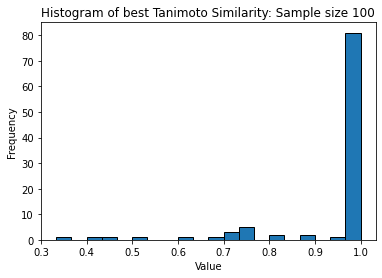

100%|██████████| 100/100 [00:46<00:00,  2.13it/s]

avg_tani, avg_tani_greedy, corr_sampleing_prob'
0.9423105742504405 0.918885 0.7095526923729778


In [49]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [50]:
# Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items()]
# filtered_results

['CCCNC(=O)CNC(=O)c1ccc(N(CC)C(C)C)cc1',
 'O=C(NC1C2CN(C(=O)C3CC3)CC21)C1CCC(C(F)(F)F)C1',
 'CN1CCCC1c1cc(C(=O)N(CC2CC2)C2CC2)n[nH]1',
 'Cc1nc(C)c(CN(C)CC2CCN(C(=O)CC3CC3)C2)o1',
 'CCc1ccc(CN2CCCC2CNC(=O)C(C(C)C)N(C)C)cc1',
 'COc1ccc(CNCC(N2CCOCC2)C(F)(F)F)cc1O',
 'N#CCCCCNc1ccccc1S(N)(=O)=O',
 'O=C(NCC1CN(CC2CC2)CCO1)c1nc2ccccn2c1F',
 'COc1ccc2cc(C(C)Nc3ccn(CC(N)=O)n3)ccc2c1',
 'CCSCCC(=O)NC(C)C1CCN(C(=O)c2cc(F)c[nH]2)C1',
 'CC(NC(=O)C1CC1)C1CCCCN1C(=O)c1nc[nH]c2nccc1-2',
 'CCC(CNC(=O)C1(SC)CCC1)NC(=O)C1(SC)CCC1',
 'Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'CCC(NC(=O)CCNC(=O)CC(C)C)C1CC1(C)C',
 'OC1CCCCC1C1CCCCN1Cc1nnc(C2CC2)o1',
 'CC1CC(N)CN1C(=O)Nc1ccc(C#N)c(C(F)(F)F)c1',
 'CCC(C)(C)C(=O)N1CCC(N(C)Cc2noc(CCOC)n2)C1',
 'COc1cc(Br)cnc1CN1CCCC12COC2',
 'CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1',
 'O=C(NCC1CCCN1CCC1CCOC1)C1CC2CC2C1',
 'CCCCOC(C)C(=O)NCCCNCc1cn(C)nc1C',
 'CC(Cc1cnccn1)NCCCOc1ccc(C(F)(F)F)cn1',
 'CCOC1CC(CC(=O)N2CCC(CNC(=O)c3cccnc3)C2)C1',
 'CCn1cc(CC(=O)NCC(NCc2cc(C)on2)

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50_after.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [52]:

config.data_size = 100 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True



This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 1 1.5000000000000004
7 1 1.6000000000000005
8 1 1.7000000000000006
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
6 2 1.5000000000000004
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 2 1.5000000000000004
7 2 1.6000000000000005
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
1 0 1
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 1 1.5000000000000004
7 1 1.6000000000000005
8 1 1.7000000000000006
9 1 1.8000000000000007
10 1 1.9000000000000008
11 1 2.000000000000001
12 1 2.100000000000001
1 0 1
2 1 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
6 2 1.5000000000000004
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.300000

100%|██████████| 100/100 [00:00<00:00, 291068.98it/s]


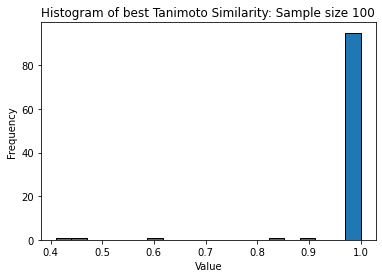

100%|██████████| 100/100 [00:50<00:00,  1.98it/s]

avg_tani, avg_tani_greedy, corr_sampleing_prob'
0.9820199972295285 0.918885 0.7095526923729778


In [53]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [54]:
#Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items() if value[0][0][-2] != 1]
#filtered_results

['Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'Cc1ccc(C(=O)N2CC(C(C)NC(=O)c3occc3C)C2)nc1C',
 'O=C1CCC(=O)N1CCC(=O)N1CCCCC1C1CCCCC1O',
 'CCc1cccc(C(=O)OCCN2C(=O)COc3ccccc32)c1O',
 'Cc1nc2cc(C(=O)N(C)C(C)CN)ccc2n1Cc1ccsc1']

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50_after_MNS_3.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [ ]:
#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_933335.pkl")


config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_285005.pkl")

# V8i Raw 
config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data"


In [ ]:

config.data_size = 100 # config.test_size # why would I do that? 
#config.data_size = 4 # config.test_size # why would I do that? 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.multinom_runs = 1
config.temperature = 1
greedy_full = False
MW_filter = True



In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240520_Improvment_Cycle_PC_v2/6.2_PC_FT_Model_0_250.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)

#### 5.2 Load ZINC

In [69]:
def mns_tani_extraction(data):
    """
    Extracts the 4th item of the first sublist of the value for each key in the dictionary.

    Parameters:
    data (dict): The input dictionary.

    Returns:
    list: A list containing the 4th item of the first sublist for each key.
    """
    # Initialize an empty list to store the results
    result_list = []

    # Iterate over the dictionary items
    for key, value in data.items():
        # Check if the value is not None and has at least one sublist
        if value and value[0]:
            # Get the 4th item of the first sublist
            item = value[0][0][3]
            # Append the item to the result list
            result_list.append(item)

    # Return the result list
    return result_list

In [ ]:
'''
# 100_10
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     
'''

##### Load ZINC data experiment

In [70]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_after_MNS_3_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_after_MNS_3_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [71]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])

In [72]:
imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"].keys()

dict_keys(['gen_conv_SMI_list', 'trg_conv_SMI_list', 'tanimoto_sim', 'tanimoto_mean', 'tanimoto_std_dev', 'failed', 'prob_list', 'src_HSQC_list'])

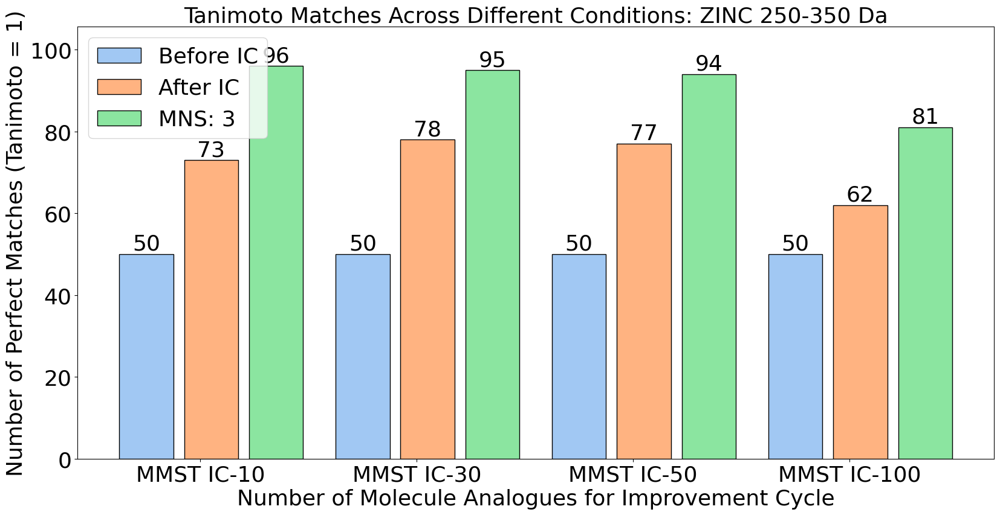

In [73]:

fontsize = 26
tani_data = [
    (tani_before_all_100_10, 'Greedy Tanomoto Before FT10'), (tani_after_all_100_10, 'Greedy Tanomoto After FT10'), (tani_after_all_100_10_mns, '3 Multinomial Sampling After FT10'),
    (tani_before_all_100_30, 'Greedy Tanomoto Before FT30'), (tani_after_all_100_30, 'Greedy Tanomoto After FT30'), (tani_after_all_100_30_mns, '3 Multinomial Sampling After FT30'),
    (tani_before_all_100_50, 'Greedy Tanomoto Before FT50'), (tani_after_all_100_50, 'Greedy Tanomoto After FT50'), (tani_after_all_100_50_mns, '3 Multinomial Sampling After FT50'), 
    (tani_before_all_100_50, 'Greedy Tanomoto Before FT100'), (tani_after_all_100_100, 'Greedy Tanomoto After FT50'), (tani_after_all_100_100_mns, '3 Multinomial Sampling After FT100')
]

# Extract numerical data (count of perfect matches)
numerical_data = [np.sum(np.array(data) == 1.0) for data, _ in tani_data]

# Labels for each group
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
condition_labels = ['Before IC', 'After IC', 'MNS: 3']

# Colors for the bars
colors = ['#A1C8F3', '#FFB381', '#8BE5A0']  # Red, Blue, Green

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, MNS
    ax.bar(positions[i], numerical_data[i::3], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: ZINC 250-350 Da', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(numerical_data):
    ax.text(positions[i % 3][i // 3], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')
ax.tick_params(axis='y', labelsize=fontsize)
ax.set_ylim(0, max(numerical_data) * 1.1)  # Set y-axis limit to 110% of max value

# Adjust layout and display
plt.tight_layout()

# Specify the path and file name where you want to save the figure.
save_path = './_FIGURES/6.1.2_ZINC_Bar_Chart_Greedy_MNS_Tanimoto_v4.png'
plt.savefig(save_path, format='png', dpi=300)  # Save as PNG with 300 dpi

plt.show()

In [74]:
# Extract the variables

corr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before['corr_sampleing_prob_bl_ZINC']
results_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before['results_dict_ZINC_greedy_bl']
results_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before['results_dict_greedy_bl_ZINC']


#avg_tani_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_bl_ZINC']
#failed_bl_ZINC = imp_cyc_all_100_10_before['failed_bl_ZINC']
#avg_tani_greedy_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_greedy_bl_ZINC']
#total_results_bl_ZINC = imp_cyc_all_100_10_before['total_results_bl_ZINC']
#filtered_results = imp_cyc_all_100_10_before['filtered_results']

In [75]:
imp_cyc_all_100_10_before.keys()

dict_keys(['avg_tani_bl_ZINC', 'results_dict_greedy_bl_ZINC', 'failed_bl_ZINC', 'avg_tani_greedy_bl_ZINC', 'results_dict_ZINC_greedy_bl', 'total_results_bl_ZINC', 'corr_sampleing_prob_bl_ZINC', 'filtered_results', 'all_gen_smis', 'aug_mol_df', 'results_dict_bl_ZINC'])

In [76]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]



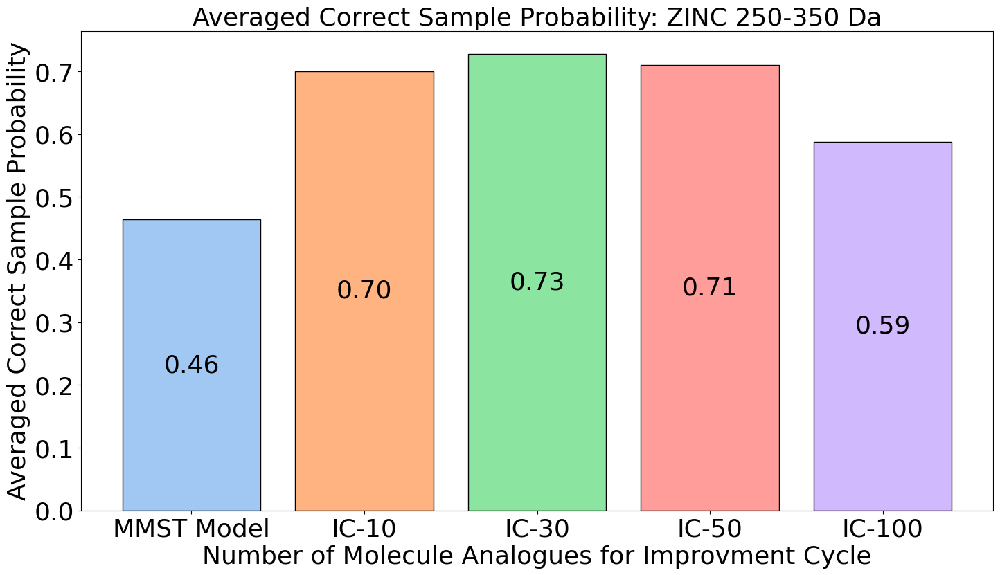

In [78]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
        '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
      ]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: ZINC 250-350 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

#plt.xlabel('Stages', fontsize=16)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_ZINC_correct_sample_prob_comparison_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Chemical spaces

In [79]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])

In [80]:
results_dict_bl_ZINC_before = imp_cyc_all_100_10_before["results_dict_bl_ZINC"]
filtered_results_false_before = [key for key, value in results_dict_bl_ZINC_before.items() if value[0][0][-2] == 1]
len(filtered_results_false_before)

56

In [81]:
results_dict_bl_ZINC_after = imp_cyc_all_100_10_after["results_dict_bl_ZINC"]
filtered_results_false_after = [key for key, value in results_dict_bl_ZINC_after.items() if value[0][0][-2] == 1]
len(filtered_results_false_after)

87

In [82]:
all_gen_smis = imp_cyc_all_100_10_before["all_gen_smis"]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 87/87 [00:00<00:00, 7173.13it/s]


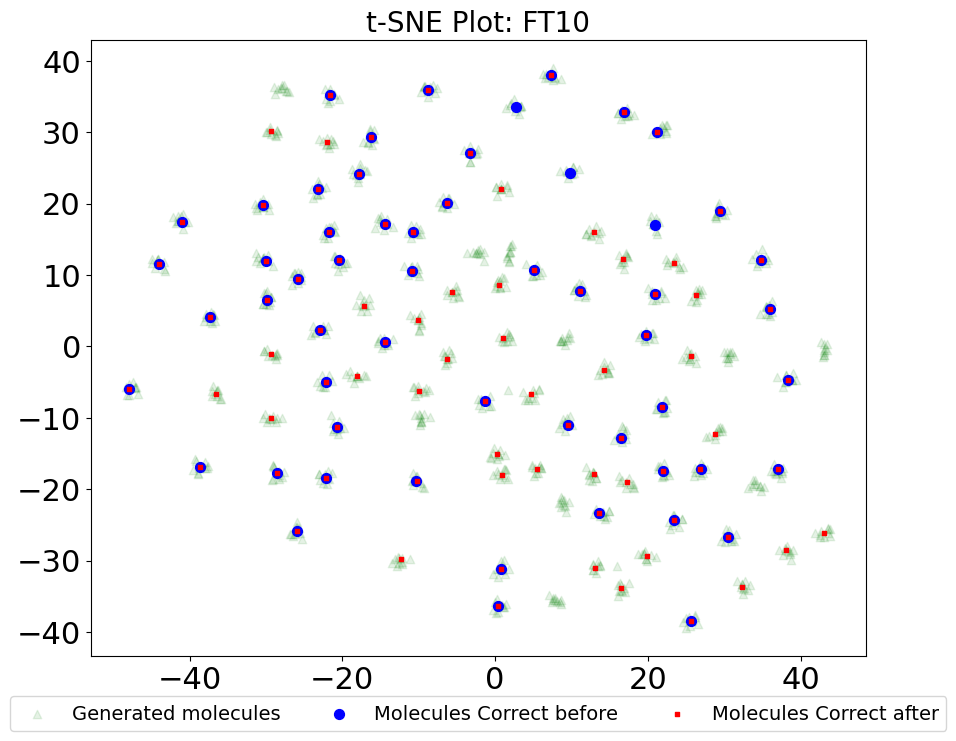

In [83]:
# Convert SMILES to fingerprints
def smiles_to_fps(smiles_list):
    fps = []
    for smiles in tqdm(smiles_list):
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=512)
            fps.append(fp)
    return np.array(fps)

fps1 = smiles_to_fps(filtered_results_false_before)
fps2 = smiles_to_fps(all_gen_smis)
fps3 = smiles_to_fps(filtered_results_false_after)

# Concatenate the two fingerprint arrays
all_fps = np.vstack([fps1, fps2, fps3])

# Dimensionality Reduction: t-SNE
tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(all_fps)

# Dimensionality Reduction: UMAP
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
X_umap = umap_model.fit_transform(all_fps)

# Dimensionality Reduction: PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(all_fps)


# Plotting function with the legend below the graph
def plot_2D(X, title, label1='Molecules Correct before', label2='Generated molecules', label3='Molecules Correct after'):
    plt.figure(figsize=(10, 8))
    plt.scatter(X[len(fps1):len(fps1)+len(fps2), 0], X[len(fps1):len(fps1)+len(fps2), 1], c='g', marker='^', label=label2, alpha=0.1)
    plt.scatter(X[:len(fps1), 0], X[:len(fps1), 1], c='b', marker='o', label=label1, alpha=1, s=50)
    plt.scatter(X[len(fps1)+len(fps2):, 0], X[len(fps1)+len(fps2):, 1], c='r', marker='s', label=label3, alpha=1, s=10)
    plt.title(title, fontsize=20)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=14)  
    output_path = "./_FIGURES/6.1.2_t-SNE_FT10_v1.png"
    plt.savefig(output_path, bbox_inches='tight')
    plt.show()

# Plot t-SNE
plot_2D(X_tsne, 't-SNE Plot: FT10')

# Plot UMAP
#plot_2D(X_umap, 'UMAP Plot')

# Plot PCA
#plot_2D(X_pca, 'PCA Plot')

#### 6.0 Load PubChem

##### Load PubChem 0-250 v1

In [128]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)

# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [129]:
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_0_250.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_0_250_FT = pickle.load(file)     

In [130]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_0_250_FT = PC_0_250_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


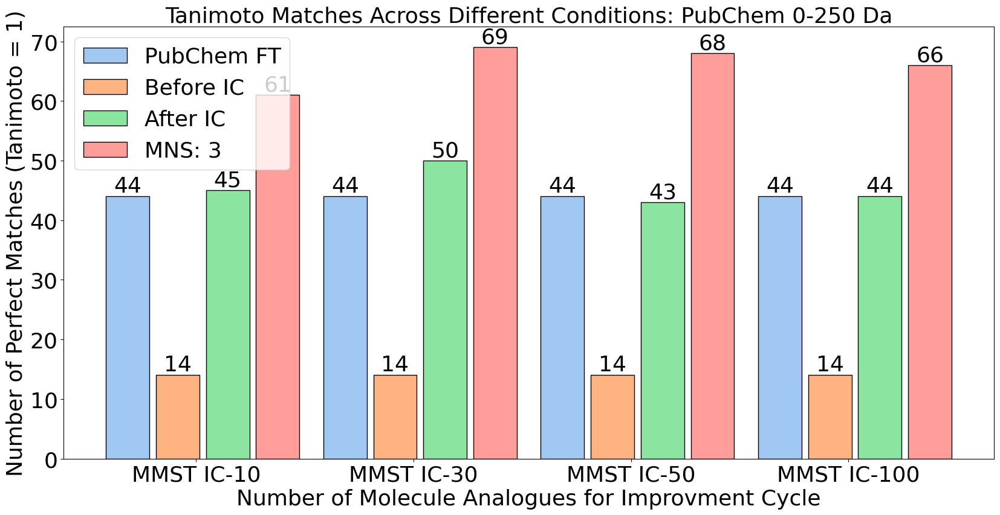

In [131]:

# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_0_250_FT_list = [tani_PC_0_250_FT for _ in range(4)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_0_250_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Labels
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 0-250 Da', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')
ax.tick_params(axis='y', labelsize=fontsize)
#ax.set_ylim(0, 105)

# Adjust layout and display
plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_0_250_v4.png')  # Update this path as needed

# Save the figure
plt.savefig(save_path, format='png', dpi=300)  # Save as PNG with 300 dpi

plt.show()

# Uncomment to save the plot
# plt.savefig("/path/to/save/grouped_perfect_matches_bar_plot.png", dpi=300, bbox_inches='tight')

In [132]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_0_250_FT = PC_0_250_FT["corr_sampleing_prob_bl_ZINC"]


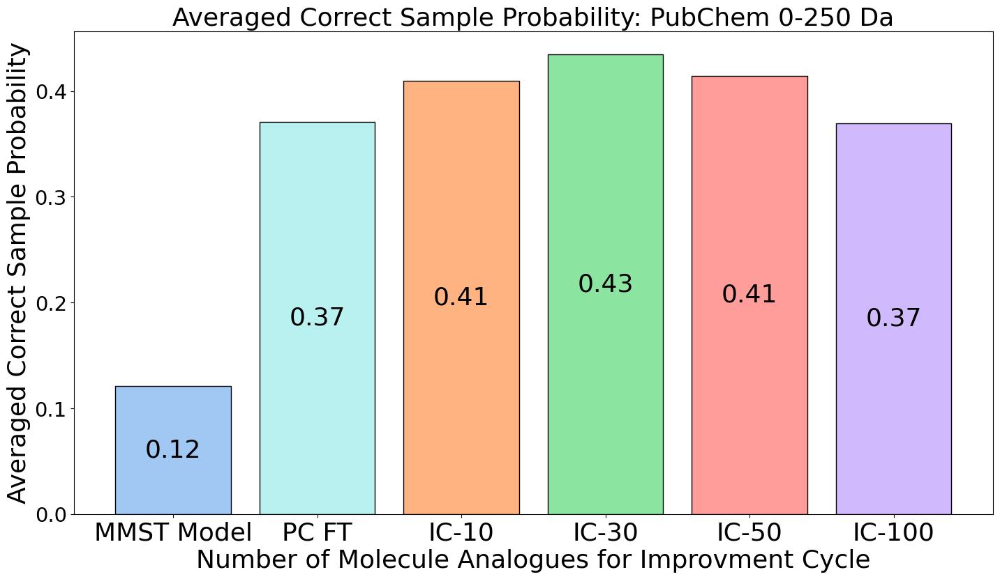

In [134]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_0_250_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 0-250 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=21)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_0_250_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Load PubChem 250-350 v2

In [102]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [104]:
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_250_350.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_250_350_FT = pickle.load(file)     

In [105]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_250_350_FT = PC_250_350_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


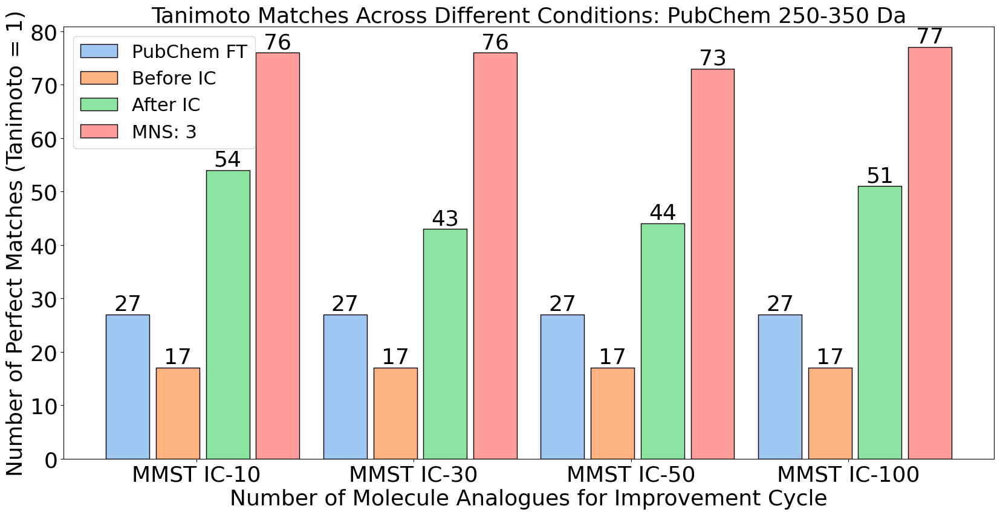

In [106]:

fontsize = 26
# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_250_350_FT_list = [tani_PC_250_350_FT for _ in range(4)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_250_350_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Labels
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
colors = [ '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 250-350 Da', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=22, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = './_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_250_350_v3.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [107]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_250_350_FT = PC_250_350_FT["corr_sampleing_prob_bl_ZINC"]


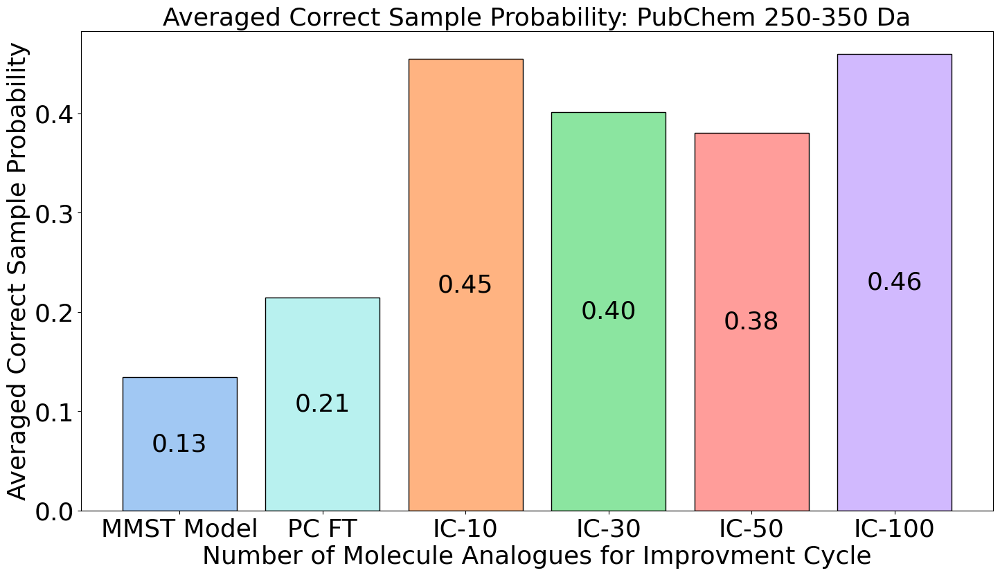

In [109]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_250_350_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 250-350 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_250_350_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Load PubChem 350-500

In [110]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [112]:
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_350_500.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_350_500_FT = pickle.load(file)     

In [113]:
# 100_10 second fine-tuning step
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_epoch41.pkl')
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_epoch41.pkl')
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns_2 = pickle.load(file)


In [114]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])

tani_after_all_100_10_2 = imp_cyc_all_100_10_after_2["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns_2 = mns_tani_extraction(imp_cyc_all_100_10_after_mns_2["results_dict_bl_ZINC"])


tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


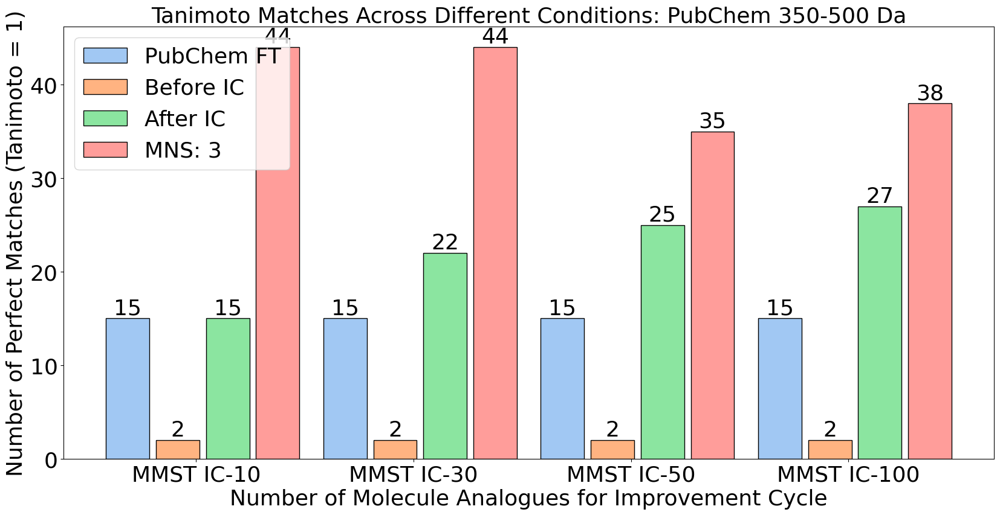

In [115]:

# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    #(tani_before_all_100_10, 'FT10 2x Before'), (tani_after_all_100_10_2, 'FT10 2x After'), (tani_after_all_100_10_mns_2, 'FT10 2x MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_350_500_FT_list = [tani_PC_350_500_FT for _ in range(5)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_350_500_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 10 2x, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    ]

# Labels
group_labels = ['MMST IC-10',  'MMST IC-30', 'MMST IC-50', 'MMST IC-100'] #'FT10 2x',
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 350-500 Da', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = "./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_350_500_v3.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [134]:
# Extract the variables
"""
corr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before['corr_sampleing_prob_bl_ZINC']
results_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before['results_dict_ZINC_greedy_bl']
results_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before['results_dict_greedy_bl_ZINC']
tani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
"""

#avg_tani_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_bl_ZINC']
#failed_bl_ZINC = imp_cyc_all_100_10_before['failed_bl_ZINC']
#avg_tani_greedy_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_greedy_bl_ZINC']
#total_results_bl_ZINC = imp_cyc_all_100_10_before['total_results_bl_ZINC']
#filtered_results = imp_cyc_all_100_10_before['filtered_results']

'\ncorr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before[\'corr_sampleing_prob_bl_ZINC\']\nresults_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before[\'results_dict_ZINC_greedy_bl\']\nresults_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before[\'results_dict_greedy_bl_ZINC\']\ntani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]\n'

In [116]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10_2 = imp_cyc_all_100_10_after_2["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_350_500_FT = PC_350_500_FT["corr_sampleing_prob_bl_ZINC"]


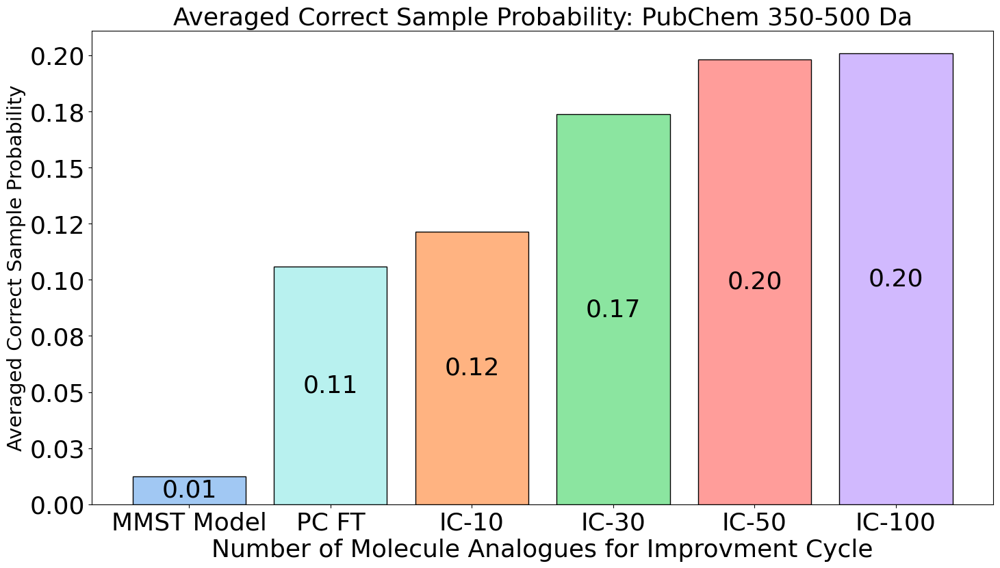

In [117]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_350_500_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
  #  corr_sp_after_all_100_10_2,  # After 2x FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 350-500 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=21)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_350_500_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


#### PubChem Second round training

In [154]:
# 100_10 0_250
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_0_250 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_0_250 = pickle.load(file)

#maybe need to take the first one    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240523_PC_Imp_Cycle_2_from_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_0_250 = pickle.load(file)


In [155]:
# 100_10 250_350
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_250_350 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_250_350 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240523_PC_Imp_Cycle_2_from_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_250_350 = pickle.load(file)

In [156]:
# 100_10 350_500
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_350_500 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_350_500 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_v3_second_round.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_350_500 = pickle.load(file)

In [157]:

tani_before_0_250 = imp_cyc_all_100_10_before_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_0_250 = imp_cyc_all_100_10_after_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_0_250 = imp_cyc_all_100_10_after_2_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_before_250_350 = imp_cyc_all_100_10_before_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_250_350 = imp_cyc_all_100_10_after_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_250_350 = imp_cyc_all_100_10_after_2_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_before_350_500 = imp_cyc_all_100_10_before_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_350_500 = imp_cyc_all_100_10_after_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_350_500 = imp_cyc_all_100_10_after_2_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


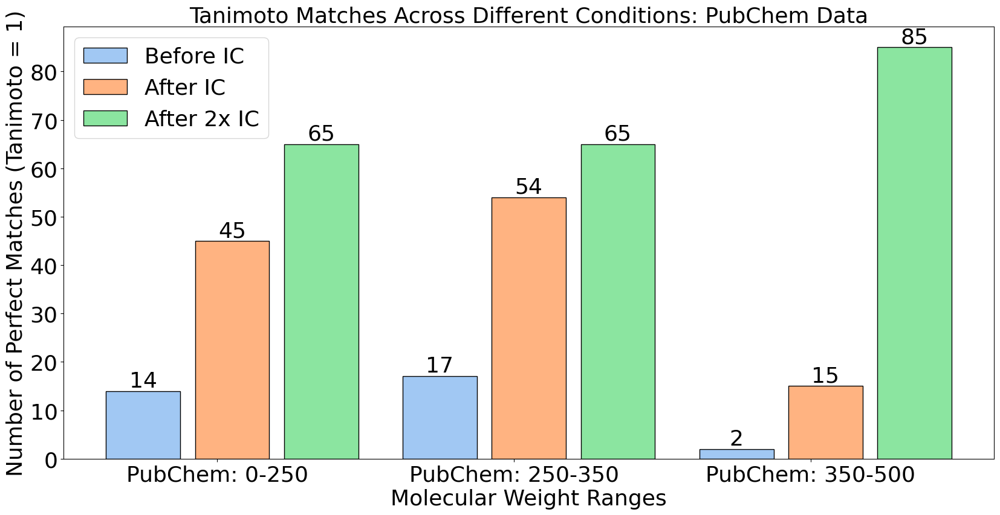

In [158]:

# Data and labels
tani_data = [
    (tani_before_0_250, 'FT0-250 Before'), (tani_after_0_250, 'FT0-250 After'), (tani_after_2_0_250, 'FT0-250 2nd Round'),
    (tani_before_250_350, 'FT250-350 Before'), (tani_after_250_350, 'FT250-350 After'), (tani_after_2_250_350, 'FT250-350 2nd Round'),
    (tani_before_350_500, 'FT350-500 Before'), (tani_after_350_500, 'FT350-500 After'), (tani_after_2_350_500, 'FT350-500 2nd Round')
]

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]

# Colors for the bars
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
        ]

# Labels
group_labels = ['PubChem: 0-250', 'PubChem: 250-350', 'PubChem: 350-500']
condition_labels = ['Before IC', 'After IC', 'After 2x IC']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, 2nd Round
    ax.bar(positions[i], perfect_matches[i::3], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Molecular Weight Ranges', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem Data', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(perfect_matches):
    ax.text(positions[i % 3][i // 3], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend to the upper right corner
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_second_round_v3.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [159]:

corr_sp_before_0_250 = imp_cyc_all_100_10_before_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_0_250 = imp_cyc_all_100_10_after_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_0_250 = imp_cyc_all_100_10_after_2_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_250_350 = imp_cyc_all_100_10_before_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_250_350 = imp_cyc_all_100_10_after_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_250_350 = imp_cyc_all_100_10_after_2_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_350_500 = imp_cyc_all_100_10_before_350_500["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_350_500 = imp_cyc_all_100_10_after_350_500["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_350_500 = imp_cyc_all_100_10_after_2_350_500["corr_sampleing_prob_bl_ZINC"]


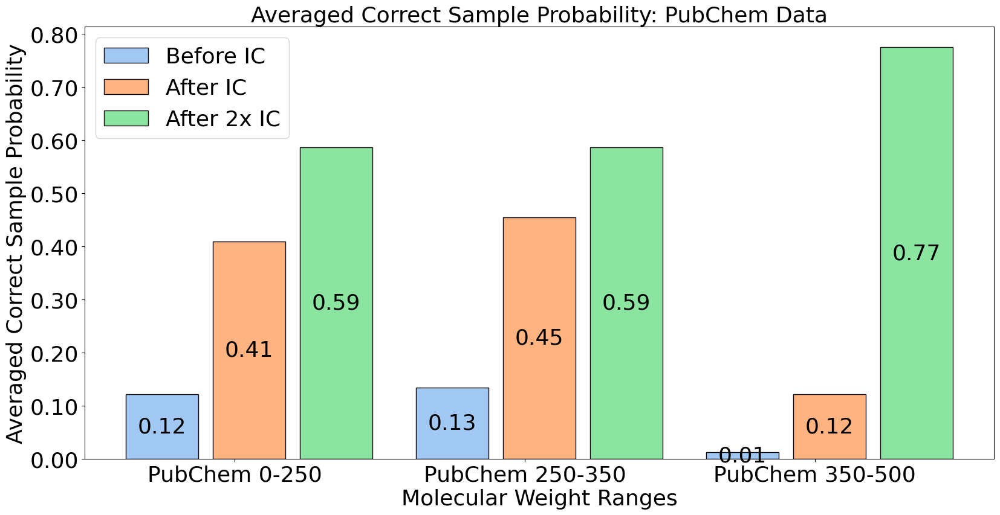

In [160]:

# Data for the bar chart
values = [
    np.mean(corr_sp_before_0_250), np.mean(corr_sp_after_0_250), np.mean(corr_sp_after_2_0_250),
    np.mean(corr_sp_before_250_350), np.mean(corr_sp_after_250_350), np.mean(corr_sp_after_2_250_350),
    np.mean(corr_sp_before_350_500), np.mean(corr_sp_after_350_500), np.mean(corr_sp_after_2_350_500)
]

# Colors for the bars
colors = ['#E57373', '#A2A37E', '#64B689']
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',]  # coral pink]  # Red, Blue, Orange, Green

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
indices = np.arange(3)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, 2nd Round
    bars = ax.bar(positions[i], values[i::3], 
                  width=bar_width, color=colors[i], edgecolor='black', 
                  label=['Before IC', 'After IC', 'After 2x IC'][i])
    
    # Add numbers inside the bars
    for bar, value in zip(bars, values[i::3]):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, 
                f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Customize the plot
ax.set_ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_title('Averaged Correct Sample Probability: PubChem Data', fontsize=fontsize)
ax.set_xlabel('Molecular Weight Ranges', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(['PubChem 0-250', 'PubChem 250-350', 'PubChem 350-500'], fontsize=fontsize)

# Set y-axis to display two decimal places
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout
plt.tight_layout()

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_second_ro_v3.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

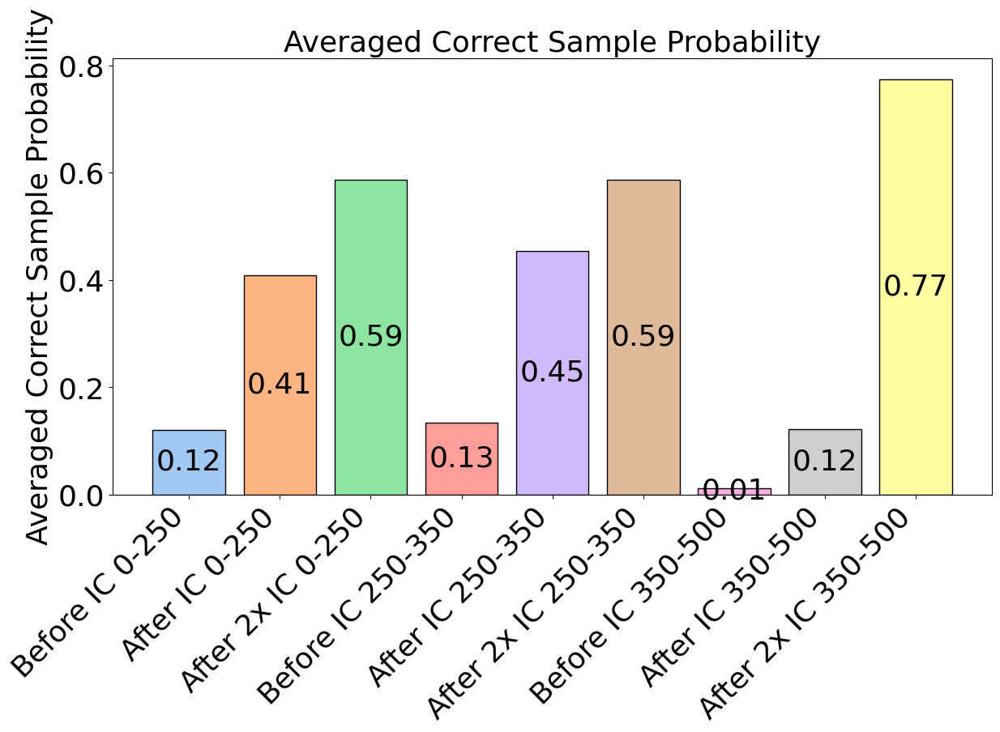

In [161]:
# Data for the bar chart
values = [
    np.mean(corr_sp_before_0_250),  # Before (0-250)
    np.mean(corr_sp_after_0_250),   # After 0-250
    np.mean(corr_sp_after_2_0_250), # 2nd Round After 0-250
    np.mean(corr_sp_before_250_350),  # Before (250-350)
    np.mean(corr_sp_after_250_350),   # After 250-350
    np.mean(corr_sp_after_2_250_350), # 2nd Round After 250-350
    np.mean(corr_sp_before_350_500),  # Before (350-500)
    np.mean(corr_sp_after_350_500),   # After 350-500
    np.mean(corr_sp_after_2_350_500)  # 2nd Round After 350-500
]

# Labels for the bars
labels = [
    'Before IC 0-250', 
    'After IC 0-250', 
    'After 2x IC 0-250',
    'Before IC 250-350', 
    'After IC 250-350', 
    'After 2x IC 250-350',
    'Before IC 350-500', 
    'After IC 350-500', 
    'After 2x IC 350-500'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(14, 7))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
#plt.xlabel('Stages', fontsize=16)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=45, ha='right')

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path =    os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_second_ro_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


### 7.0 Experimental vs Simulated Data

In [ ]:
def plot_comparison_bars(data_dict, colors, figsize=(12, 6), save_path=None):
    """
    Create a bar plot comparing different metrics across all categories.
    Shows accuracy as percentages and adds rotated value labels above bars.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with categories and their accuracy values (0-1 scale)
    colors : list
        List of colors for the bars
    figsize : tuple
        Figure size as (width, height)
    save_path : str, optional
        Full path where to save the figure
    """
    
    # Create the figure with specified figsize
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    
    # Calculate positions for bars
    categories = list(data_dict.keys())
    n_categories = len(categories)
    n_metrics = len(list(data_dict.values())[0])
    
    # Set width of bars and positions of the bars
    total_width = 0.8
    width = total_width / n_metrics
    x = np.arange(n_categories)
    
    # Create bars for each metric
    metric_names = ['top-1', 'top-3', 'top-10']
    
    # Set y-axis limit first to properly position labels
    ax.set_ylim(0, 1.1)  # Set y-axis limit from 0 to 110%
    
    for i in range(n_metrics):
        values = [data_dict[cat][i] for cat in categories]
        offset = width * i - (total_width/2) + (width/2)
        bars = ax.bar(x + offset, values, width, label=metric_names[i], color=colors[i], edgecolor='black')
        
        # Add value labels above bars with more spacing
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, 
                   height + 0.03,  # Add more space between bar and label
                   f'{height*100:.0f}%',
                   ha='center', 
                   va='bottom',
                   rotation=90,
                   fontsize=10)
    
    # Customize the plot
    ax.set_xlabel('')
    ax.set_ylabel('Accuracy (%)', fontsize=14)
    ax.set_title('Comparison Across Categories', fontsize=16, pad=20)
    
    # Set x-ticks
    ax.set_xticks(x)
    ax.set_xticklabels(categories, rotation=45, ha='right', fontsize=12)
    
    # Set y-ticks and convert to percentages
    ax.tick_params(axis='y', labelsize=12)
    y_ticks = np.arange(0, 1.2, 0.2)  # Create ticks at 0%, 20%, 40%, 60%, 80%, 100%
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{x*100:.0f}%' for x in y_ticks])
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add legend
    ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save if path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Plot saved to: {save_path}")
    
    plt.show()

# Example usage
if __name__ == "__main__":
    colors = [
        '#A1C8F3',  # light blue/periwinkle
        '#B8F1EF',  # light cyan/aqua
        '#FFB381',  # salmon/peach
        #'#8BE5A0',  # mint green
        #'#D1B9FE',  # lavender
    ]
    
    # Example save path
    save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")
    
    # Call with dummy data
    #plot_comparison_bars({}, colors, save_path=save_path)

In [163]:

def plot_comparison_bars(data_dict, colors, figsize=(12, 6), save_path=None):
    """
    Create a bar plot comparing different metrics across all categories.
    Shows accuracy as percentages with labels inside bars (except for BL Experimental).
    X-axis labels are split into two rows.
    Axis labels: font size 18
    All other text: font size 20
    """
    
    # Create the figure with specified figsize
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    
    # Calculate positions for bars
    categories = list(data_dict.keys())
    n_categories = len(categories)
    n_metrics = len(list(data_dict.values())[0])
    
    # Set width of bars and positions of the bars
    total_width = 0.8
    width = total_width / n_metrics
    x = np.arange(n_categories)
    
    # Create bars for each metric
    metric_names = ['top-1', 'top-3', 'top-10']
    
    # Set y-axis limit first to properly position labels
    ax.set_ylim(0, 1.1)
    
    for i in range(n_metrics):
        values = [data_dict[cat][i] for cat in categories]
        offset = width * i - (total_width/2) + (width/2)
        bars = ax.bar(x + offset, values, width, label=metric_names[i], color=colors[i], edgecolor='black')
        
        # Add value labels
        for j, bar in enumerate(bars):
            height = bar.get_height()
            
            # Special case for BL Experimental (target) where height is very small
            if categories[j] == 'BL Experimental (target)' and height < 0.1:
                # Place label above the bar
                ax.text(bar.get_x() + bar.get_width()/2, 
                       height + 0.03,
                       f'{height*100:.0f}%',
                       ha='center', 
                       va='bottom',
                       rotation=90,
                       fontsize=20)
            else:
                # Place label inside the bar
                ax.text(bar.get_x() + bar.get_width()/2, 
                       height/2,  # Center vertically inside bar
                       f'{height*100:.0f}%',
                       ha='center', 
                       va='center',
                       rotation=90,
                       fontsize=20)
    
    # Customize the plot
    ax.set_xlabel('')
    ax.set_ylabel('Accuracy (%)', fontsize=18)  # Changed to 18
    ax.set_title('Comparison Across Categories', fontsize=20, pad=20)
    
    # Create two-line labels
    def split_category(category):
        if '(target)' in category or '(analogue)' in category:
            main_part = category.split(' (')[0]
            suffix = f'({category.split("(")[1]}'
            return f'{main_part}\n{suffix}'
        return category
    
    # Set x-ticks
    ax.set_xticks(x)
    ax.set_xticklabels([split_category(cat) for cat in categories], 
                       ha='center',  # Center align
                       fontsize=18)  # Changed to 18
    
    # Set y-ticks and convert to percentages
    ax.tick_params(axis='y', labelsize=18)  # Changed to 18
    y_ticks = np.arange(0, 1.2, 0.2)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{x*100:.0f}%' for x in y_ticks])
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add legend inside the plot in the upper right corner
    ax.legend(fontsize=20, loc='upper right')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save if path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Plot saved to: {save_path}")
    
    plt.show()

    
# Example usage
if __name__ == "__main__":
    colors = [
        '#A1C8F3',  # light blue/periwinkle
        '#B8F1EF',  # light cyan/aqua
        '#FFB381',  # salmon/peach
    ]
    
    # Example save path
    save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")
    
    # Call with dummy data
    #plot_comparison_bars({}, colors, save_path=save_path)

#### Extracting the data for the plotting

In [164]:

def process_pkl_files_new(folder_path, file_type, ranking_method):
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl') and file_type in f]
    all_rankings = defaultdict(list)
    for file_path in pkl_files:
        file_data = load_data(file_path)
        
        for trg_smi, value_list in file_data.items():
            for sublist in value_list[0]:
                
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                if errors == 9:  # Check if both errors are 9
                    errors = [9, 9]  # Keep it as is
                try:
                    all_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, 0, errors[0], errors[1]))
                except:
                    import IPython; IPython.embed();           
    all_rankings = rank_all_molecules(all_rankings, ranking_method)
    
    return all_rankings


def rank_all_molecules(all_rankings, ranking_method):
    new_rankings = defaultdict(list)
    
    for trg_smi, molecule_list in all_rankings.items():
        molecule_data = []
        seen_gen_smiles = set()
        
        for molecule in molecule_list:
            gen_smi = molecule[1]
            if gen_smi in seen_gen_smiles:
                continue
            seen_gen_smiles.add(gen_smi)
            
            tanimoto = molecule[2]
            errors = molecule[4:6]
            if errors == (9, 9):  # Check if both errors are 9
                errors = [9, 9]  # Keep it as is
            molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
        
        if not molecule_data:
            continue
        
        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
            
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")
        
        for new_rank, i in enumerate(sorted_indices):
            gen_smi = molecule_array['gen_smi'][i]
            tanimoto = molecule_array['tanimoto'][i]
            error1 = molecule_array['error1'][i]
            error2 = molecule_array['error2'][i]
            
            new_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, new_rank, error1, error2))
    
    return new_rankings

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]

def process_experimental_data(base_folder_path, ic_folder_path, analogue_folder_path):
    """
    Process experimental data from different sources and prepare it for plotting.
    
    Parameters:
    -----------
    base_folder_path : str
        Path to the folder containing base experiment data (without IC)
    ic_folder_path : str
        Path to the folder containing IC experiment data
    analogue_folder_path : str
        Path to the folder containing analogue experiment data
    
    Returns:
    --------
    dict
        Dictionary with processed data ready for plotting
    """
    # Define constants
    ranking_method = "HSQC"
    file_types = ["exp_sim_data", "sim_sim_data"]
    
    plot_data = {}
    
    # Process IC experiments
    for file_type in file_types:
        IC_rankings = process_pkl_files_new(ic_folder_path, file_type, ranking_method)
        IC_rankings, _ = exp_func.deduplicate_smiles_from_ranking(IC_rankings)
        IC_rankings, _ = exp_func.filter_rankings_by_molecular_formula(IC_rankings)
        accuracies = exp_func.calculate_top_k_accuracy(IC_rankings, k_range=[1, 3, 10])
        accuracies = [round(acc, 3) for acc in accuracies][:3]

        if file_type == "exp_sim_data":
            plot_data['IC Experimental (target)'] = accuracies
        else:
            plot_data['IC Simulated (target)'] = accuracies
            
    # Process base experiments (without IC)
    for file_type in file_types:
        if file_type == "exp_sim_data":
            input_dict = {"exp_sim_data" : base_pkl_dicts["exp_sim_data"]}
            rankings = exp_func.process_pkl_files_BL(input_dict, ranking_method)
            accuracies = exp_func.calculate_top_k_accuracy_BL(rankings["exp_sim_data"],k_range=[1, 3, 10])
            accuracies = [round(acc, 3) for acc in accuracies][:3]
            plot_data['BL Experimental (target)'] = accuracies

        elif file_type == "sim_sim_data":
            input_dict = {"sim_sim_data" : base_pkl_dicts["sim_sim_data"]}
            rankings = exp_func.process_pkl_files_BL(input_dict, ranking_method)
            accuracies = exp_func.calculate_top_k_accuracy_BL(rankings["sim_sim_data"],k_range=[1, 3, 10])       
            accuracies = [round(acc, 3) for acc in accuracies][:3]
            plot_data['BL Simulated (target)'] = accuracies

            
    # Process analogue experiments
    for file_type in file_types:
        analogue_rankings = process_pkl_files_new(analogue_folder_path, file_type, ranking_method)
        analogue_rankings, _ = exp_func.deduplicate_smiles_from_ranking(analogue_rankings)
        analogue_rankings, _ = exp_func.filter_rankings_by_molecular_formula(analogue_rankings)
        accuracies = exp_func.calculate_top_k_accuracy(analogue_rankings, k_range=[1, 3, 10])
        accuracies = [round(acc, 3) for acc in accuracies][:3]
        
        if file_type == "exp_sim_data":
            plot_data['IC Experimental (analogue)'] = accuracies
        else:
            plot_data['IC Simulated (analogue)'] = accuracies
            
    return plot_data

def reorder_data_dict(data_dict):
    """
    Reorders the data dictionary to group simulated and experimental results together.
    """
    # Define the desired order
    desired_order = [
        'BL Simulated (target)',
        'IC Simulated (target)',
        'IC Simulated (analogue)',
        'BL Experimental (target)',
        'IC Experimental (target)',
        'IC Experimental (analogue)'
    ]
    
    # Create new ordered dictionary
    ordered_dict = {key: data_dict[key] for key in desired_order if key in data_dict}
    
    return ordered_dict

# Helper functions remain the same as in previous version

In [ ]:
# Define your folder paths
base_folder = ""
ic_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")
base_pkl_dicts = {
        "sim_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.0_sim_real_data_before_FT_MMTi_v0.pkl"),
        "exp_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.3_real_data_before_FT_MMTi_v0.pkl")
        }    
analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/Sim_ACD_Exp_aug/test_on_aug_data_34_v3/")

#file_paths_dict = {
#    "sim_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.0_sim_real_data_before_FT_MMT_v0.pkl"),
#    "ACD_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.2_simACD_real_data_before_FT_MMT_v0.pkl"),
#    "exp_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.3_real_data_before_FT_MMT_v0.pkl")
#}    

# Process the data
data = process_experimental_data(base_pkl_dicts, ic_folder, analogue_folder)
data = reorder_data_dict(data)
# Plot with your color scheme
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    #'#FF9D9A',  # coral pink
    #'#D1B9FE',  # lavender
    #'#DEBA9A',  # beige/tan
]
save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")

plot_comparison_bars( data_dict=data,     colors=colors,     save_path=save_path,    figsize=(12, 6))

FileNotFoundError: [Errno 2] No such file or directory: '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/7.0_Experiment/Sim_ACD_Exp_aug/test_on_aug_data_34_v3'

#### Extract Top 1 and top 3 correct Molecules

In [166]:
def extract_correct_smiles_analogues(analogue_folder_path, file_type="exp_sim_data", ranking_method="HSQC"):
    """
    Extract SMILES of molecules that are correct matches in top 1 and top 3 rankings
    for experimental analogues.
    
    Parameters:
    -----------
    analogue_folder_path : str
        Path to the folder containing analogue experiment data
    file_type : str
        Type of file to process ('exp_sim_data' or 'sim_sim_data')
    ranking_method : str
        Method used for ranking ('HSQC', 'COSY', or 'HSQC & COSY')
        
    Returns:
    --------
    tuple
        (correct_top1_pairs, correct_top3_pairs) where each is a list of tuples containing
        (target_smiles, generated_smiles, rank) where rank indicates which position (1,2,3)
        had the correct match
    """
    # Process the rankings
    analogue_rankings = process_pkl_files_new(analogue_folder_path, file_type, ranking_method)
    
    # Deduplicate and filter rankings
    analogue_rankings, _ = exp_func.deduplicate_smiles_from_ranking(analogue_rankings)
    analogue_rankings, _ = exp_func.filter_rankings_by_molecular_formula(analogue_rankings)
    
    correct_top1_pairs = []
    correct_top3_pairs = []
    
    # For each target molecule
    for target_smi, rankings in analogue_rankings.items():
        # Sort rankings by rank
        sorted_rankings = sorted(rankings, key=lambda x: x[3])  # x[3] is the rank
        
        # Check top 1 match
        if sorted_rankings:
            top1_gen_smi = sorted_rankings[0][1]  # x[1] is generated SMILES
            if top1_gen_smi == target_smi:  # Only append if it's a correct match
                correct_top1_pairs.append((target_smi, top1_gen_smi, 1))
        
        # Check each of the top 3 matches individually
        for idx, ranking in enumerate(sorted_rankings[:3], 1):  # idx will be 1, 2, or 3
            gen_smi = ranking[1]
            if gen_smi == target_smi:  # If we find a match at any position
                correct_top3_pairs.append((target_smi, gen_smi, idx))
    
    return correct_top1_pairs, correct_top3_pairs

def save_correct_smiles_to_file(smiles_pairs, output_path, include_rank=False):
    """
    Save correct SMILES pairs to a text file.
    
    Parameters:
    -----------
    smiles_pairs : list
        List of (target_smiles, generated_smiles, rank) tuples that are correct matches
    output_path : str
        Path where to save the file
    include_rank : bool
        If True, includes which position (1,2,3) had the correct match
    """
    with open(output_path, 'w') as f:
        if include_rank:
            f.write("SMILES\tRank\n")
            for target_smi, _, rank in smiles_pairs:  # We can use either SMILES since they're identical
                f.write(f"{target_smi}\t{rank}\n")
        else:
            f.write("SMILES\n")
            for target_smi, _, _ in smiles_pairs:
                f.write(f"{target_smi}\n")


In [169]:
### with Analogues
# Example usage:

analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/")

# Extract only correct SMILES matches
correct_top1_pairs, correct_top3_pairs = extract_correct_smiles_analogues(
    analogue_folder,
    file_type="exp_sim_data",
    ranking_method="HSQC"
)

# Save to files (only correct matches)
# For top 1, we don't need the rank
save_correct_smiles_to_file(correct_top1_pairs, "correct_top1_experimental_analogues.txt", include_rank=False)
# For top 3, we might want to know which position had the match
save_correct_smiles_to_file(correct_top3_pairs, "correct_top3_experimental_analogues.txt", include_rank=True)

# Optional: Print some statistics
print(f"Number of correct top 1 matches: {len(correct_top1_pairs)}")
print(f"Number of correct top 3 matches: {len(correct_top3_pairs)}")
print("\nBreakdown of top 3 matches by position:")
for rank in [1, 2, 3]:
    count = sum(1 for _, _, r in correct_top3_pairs if r == rank)
    print(f"Position {rank}: {count} matches")


Number of correct top 1 matches: 4
Number of correct top 3 matches: 13

Breakdown of top 3 matches by position:
Position 1: 4 matches
Position 2: 7 matches
Position 3: 2 matches


In [171]:
analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")

# Extract only correct SMILES matches
correct_top1_pairs, correct_top3_pairs = extract_correct_smiles_analogues(
    analogue_folder,
    file_type="exp_sim_data",
    ranking_method="HSQC"
)

# Save to files (only correct matches)
# For top 1, we don't need the rank
save_correct_smiles_to_file(correct_top1_pairs, "correct_top1_experimental_analogues.txt", include_rank=False)
# For top 3, we might want to know which position had the match
save_correct_smiles_to_file(correct_top3_pairs, "correct_top3_experimental_analogues.txt", include_rank=True)


# Optional: Print some statistics
print(f"Number of correct top 1 matches: {len(correct_top1_pairs)}")
print(f"Number of correct top 3 matches: {len(correct_top3_pairs)}")
print("\nBreakdown of top 3 matches by position:")
for rank in [1, 2, 3]:
    count = sum(1 for _, _, r in correct_top3_pairs if r == rank)
    print(f"Position {rank}: {count} matches")


Number of correct top 1 matches: 11
Number of correct top 3 matches: 18

Breakdown of top 3 matches by position:
Position 1: 11 matches
Position 2: 3 matches
Position 3: 4 matches


### 8.0 Simulated, Experimental results

#### Plotting

In [172]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from rdkit import Chem
from rdkit.Chem import AllChem, Draw, Descriptors
import pandas as pd
import random
import string
import rdkit
from rdkit import Chem

colors = [
    '#E57373', '#A2A37E', '#64B689', '#4DA6A9', '#5C95CC', '#9574D0', '#EB6CC2'
]

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]


def process_pkl_files_new(folder_path, file_type, ranking_method):
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl') and file_type in f]
    all_rankings = defaultdict(list)
    for file_path in pkl_files:
        file_data = load_data(file_path)
        
        for trg_smi, value_list in file_data.items():
            for sublist in value_list[0]:
                
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                if errors == 9:  # Check if both errors are 9
                    errors = [9, 9]  # Keep it as is
                try:
                    all_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, 0, errors[0], errors[1]))
                except:
                    import IPython; IPython.embed();           
    all_rankings = rank_all_molecules(all_rankings, ranking_method)
    
    return all_rankings


def calculate_top_k_accuracy(all_rankings, k_range=[1, 3, 5, 10, 20]):
    accuracies = []
    total_molecules = 34 #len(all_rankings)
    for k in k_range:
        correct_count = sum(
            any(molecule[2] == 1 for molecule in rankings[:k])
            for rankings in all_rankings.values()
        )
        accuracy = correct_count / total_molecules
        accuracies.append(accuracy)
    correct_count = sum(
        any(molecule[2] == 1 for molecule in rankings[:])
        for rankings in all_rankings.values()
    )
    accuracy = correct_count / total_molecules
    accuracies.append(accuracy)    
    return accuracies


def plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path=None, total_samples=34):
    fontsize = 30
    k_values = [1, 3, 5, 10, 20]
    labels = [f'Top {k}' for k in k_values] + ['Total']
    
    plt.figure(figsize=(12, 8))  # Slightly wider to accommodate longer labels
    bars = plt.bar(range(len(labels)), accuracies, color=colors[:len(labels)])
    
    plt.ylabel('Accuracy', fontsize=fontsize)
    plt.title(f'{data_type} Data and {ranking_method} Ranking', fontsize=fontsize+4)
    
    plt.xticks(range(len(labels)), labels, fontsize=fontsize, rotation=0, ha='center')
    plt.yticks(fontsize=fontsize)
    plt.ylim(0, 1.1)
    
    for bar in bars:
        height = bar.get_height()
        correct_samples = int(height * total_samples)
        
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.2f}',
                 ha='center', va='bottom', fontsize=fontsize)
        
        plt.text(bar.get_x() + bar.get_width()/2., height/2,
                 f'{correct_samples}',
                 ha='center', va='center', fontsize=fontsize, color='black')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {save_path}")
    
    plt.close()
    

def main_normal():
    folder_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")
    model_type = "MMT"
    ranking_methods = [ "HSQC"]
    file_types = ["exp_sim_data", "sim_sim_data"]

    data_type_map = {
        "exp_sim_data": "Experimental",
        "sim_sim_data": "Our Simulated",
    }
    filtered_out = []
    all_rankings_list = []
    for ranking_method in ranking_methods:
        for file_type in file_types:
            all_rankings = process_pkl_files_new(folder_path, file_type, ranking_method)
            #import IPython; IPython.embed();
            all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
            all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
            #filtered_out.append(filtered_out_rankings)
            all_rankings_list.append(all_rankings)
            print("second_breakout")
            #import IPython; IPython.embed();

            accuracies = calculate_top_k_accuracy(all_rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(all_rankings)

            data_type = data_type_map[file_type]
            save_path = f"./_FIGURES/top_k_accuracy_MMTi_{file_type}_{ranking_method}_va_FINAL_2.png"

            plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path, total_samples=len(all_rankings.keys()))

            print(f"Completed plot for {ranking_method} - {data_type}")
    return all_rankings_list, filtered_out


In [173]:

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]


def rank_molecules_in_file(file_data, ranking_method):
    molecule_data = []
    for trg_smi, value_list in file_data.items():
        for sublist in value_list[0]:
            gen_smi = sublist[0]
            tanimoto = sublist[4]
            errors = sublist[5]
            if errors == 9:
                errors = [9,9] ### Necessary if it doesn't manage to calculate HSQC or COSY to calculate the errors
                                ## Basically put it last then
            molecule_data.append((trg_smi, gen_smi, errors[0], errors[1], tanimoto))

    if not molecule_data:
        return []

    molecule_array = np.array(molecule_data, dtype=[('trg_smi', 'U100'), ('gen_smi', 'U100'), 
                                                    ('error1', float), ('error2', float), 
                                                    ('tanimoto', float)])
    
    if ranking_method == 'HSQC & COSY':
        rank1 = molecule_array.argsort(order='error1')
        rank2 = molecule_array.argsort(order='error2')
        average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                         np.arange(len(rank2))[np.argsort(rank2)]) / 2
        sorted_indices = average_ranks.argsort()
        
    elif ranking_method == 'HSQC':
        sorted_indices = molecule_array.argsort(order='error1')
    elif ranking_method == 'COSY':
        sorted_indices = molecule_array.argsort(order='error2')
    else:
        raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")

    sorted_molecules = [(molecule_array['trg_smi'][i], 
                         molecule_array['gen_smi'][i],
                         molecule_array["tanimoto"][i],
                         new_rank,  # Use index as rank
                         molecule_array['error1'][i], 
                         molecule_array['error2'][i]) 
                        for new_rank, i  in enumerate(sorted_indices)]
    return sorted_molecules


def rank_all_molecules(all_rankings, ranking_method):
    new_rankings = defaultdict(list)
    
    for trg_smi, molecule_list in all_rankings.items():
        molecule_data = []
        seen_gen_smiles = set()
        
        for molecule in molecule_list:
            gen_smi = molecule[1]
            if gen_smi in seen_gen_smiles:
                continue
            seen_gen_smiles.add(gen_smi)
            
            tanimoto = molecule[2]
            errors = molecule[4:6]
            if errors == (9, 9):  # Check if both errors are 9
                errors = [9, 9]  # Keep it as is
            molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
        
        if not molecule_data:
            continue
        
        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
            
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")
        
        for new_rank, i in enumerate(sorted_indices):
            gen_smi = molecule_array['gen_smi'][i]
            tanimoto = molecule_array['tanimoto'][i]
            error1 = molecule_array['error1'][i]
            error2 = molecule_array['error2'][i]
            
            new_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, new_rank, error1, error2))
    
    return new_rankings


def prepare_mol(smiles):
    mol = Chem.MolFromSmiles(smiles)
    AllChem.Compute2DCoords(mol)
    return mol

def get_mol_weight(mol):
    return round(Descriptors.ExactMolWt(mol), 2)


In [174]:
all_rankings_list, filtered_out = main_normal()


second_breakout
Plot saved to ./_FIGURES/top_k_accuracy_MMTi_exp_sim_data_HSQC_va_FINAL_2.png
Completed plot for HSQC - Experimental
second_breakout
Plot saved to ./_FIGURES/top_k_accuracy_MMTi_sim_sim_data_HSQC_va_FINAL_2.png
Completed plot for HSQC - Our Simulated


#### Plot baseline performance

In [177]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

colors = [
    '#E57373', '#A2A37E', '#64B689', '#4DA6A9', '#5C95CC', '#9574D0', '#EB6CC2'
]

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]

def rank_molecules(file_data, ranking_method):
    all_rankings = {}
    for trg_smi, value_list in file_data.items():
        molecule_data = []
        for sublist in value_list[0]:
            try:
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
            except:
                print(f"Error processing sublist for {trg_smi}: {sublist}")
                continue

        if not molecule_data:
            continue

        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")

        sorted_molecules = [(trg_smi,
                             molecule_array['gen_smi'][i],
                             molecule_array["tanimoto"][i],
                             new_rank,  # Use index as rank
                             molecule_array['error1'][i], 
                             molecule_array['error2'][i]) 
                            for  new_rank, i in enumerate(sorted_indices)]
        
        all_rankings[trg_smi] = sorted_molecules
    
    return all_rankings


def plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path=None, total_samples=34):
    fontsize = 30
    k_values = [1, 3, 5, 10, 20]
    labels = [f'Top {k}' for k in k_values] + ['Total']
    
    
    plt.figure(figsize=(12, 8))  # Slightly wider to accommodate longer labels
    # print(range(len(labels)), all_values, colors[:len(labels)])
    # bars = plt.bar(range(len(labels)), all_values, color=colors[:len(labels)])
    #bars = plt.bar(range(len(labels)), accuracies + [sim_rank_one_count / total_samples], color=colors[:len(labels)])
    bars = plt.bar(range(len(labels)), accuracies, color=colors[:len(labels)])
    
    plt.ylabel('Accuracy', fontsize=fontsize)
    plt.title(f'{data_type} Data and {ranking_method} Ranking', fontsize=fontsize+4)
    
    plt.xticks(range(len(labels)), labels, fontsize=fontsize, rotation=0, ha='center')
    plt.yticks(fontsize=fontsize)
    plt.ylim(0, 1.1)
    
    for bar in bars:
        height = bar.get_height()
        correct_samples = int(height * total_samples)
        
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.2f}',
                 ha='center', va='bottom', fontsize=fontsize)
        
        plt.text(bar.get_x() + bar.get_width()/2., height/2,
                 f'{correct_samples}',
                 ha='center', va='center', fontsize=fontsize, color='black')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {save_path}")
    
    plt.close()
    
def main_BL():
    #folder_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_a1_baseline/"
    model_type = "MMT"
    ranking_methods = ["HSQC"] #, "HSQC & COSY"
    file_types = ["sim_sim_data", "exp_sim_data"]
    
    
    file_paths_dict = {
        "sim_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.0_sim_real_data_before_FT_MMTi_v0.pkl"),
        "exp_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.3_real_data_before_FT_MMTi_v0.pkl")
    }    
    
    
    data_type_map = {
        "sim_sim_data": "Our Simulated",
        "exp_sim_data": "Experimental"
    }
    for ranking_method in ranking_methods:
        all_rankings = exp_func.process_pkl_files_BL(file_paths_dict, ranking_method)
        
        for data_type, rankings in all_rankings.items():
            #import IPython; IPython.embed();
            accuracies = calculate_top_k_accuracy(rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(rankings)
            
            save_path = os.path.abspath(f"./_FIGURES/top_k_accuracy_MMTi_baseline_{data_type}_{ranking_method}_FINAL_2.png")
            #save_path = f"/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/top_k_accuracy_MMT_baseline_{data_type}_{ranking_method}_v8.png"
            plot_top_k_accuracy(accuracies, data_type_map[data_type], model_type, ranking_method, sim_rank_one_count, save_path, total_samples=34)

            print(f"Completed plot for {ranking_method} - {data_type_map[data_type]}")



In [178]:
main_BL()

Plot saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/top_k_accuracy_MMTi_baseline_sim_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Our Simulated
Plot saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/top_k_accuracy_MMTi_baseline_exp_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Experimental


#### Plot all molecules

Saved molecules_row_aug_1.svg


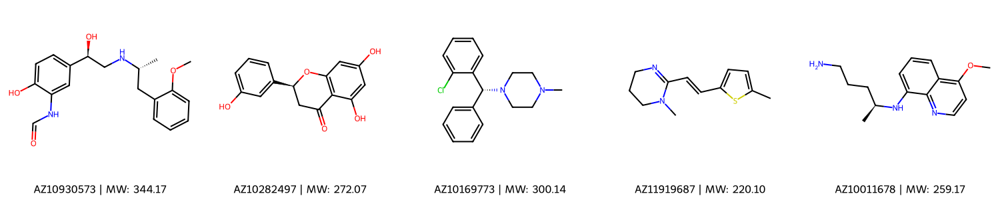

Saved molecules_row_aug_2.svg


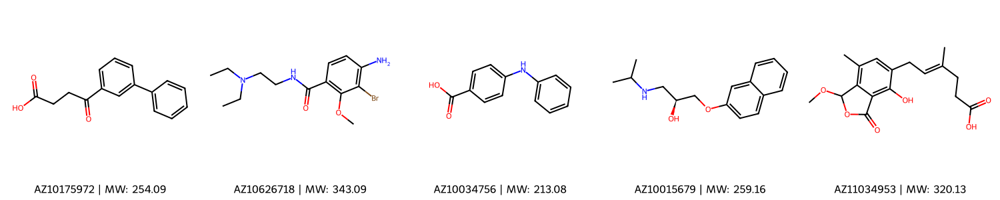

Saved molecules_row_aug_3.svg


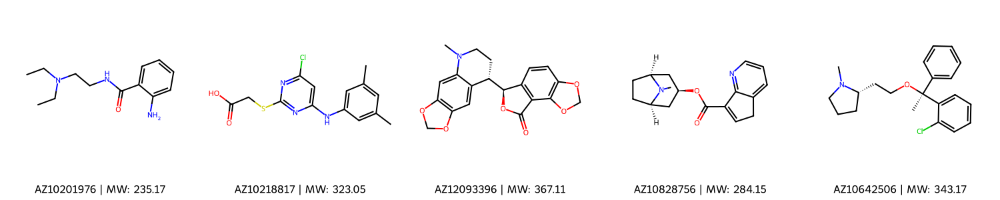

Saved molecules_row_aug_4.svg


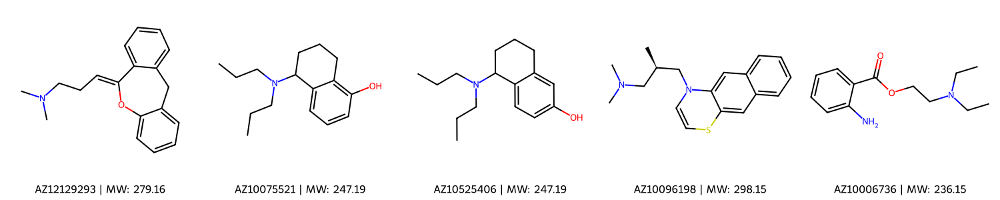

Saved molecules_row_aug_5.svg


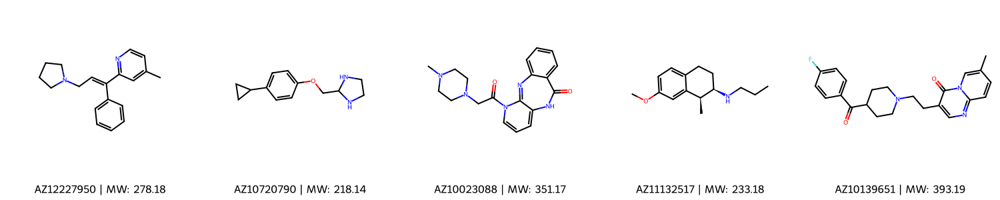

Saved molecules_row_aug_6.svg


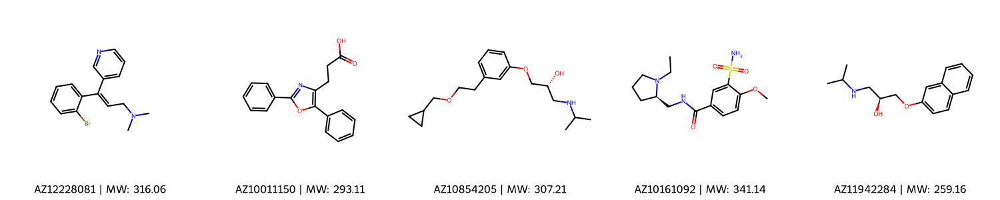

Saved molecules_row_aug_7.svg


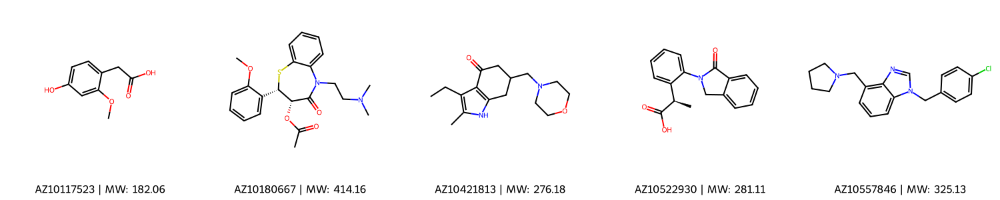

In [179]:

def plot_molecules_from_df(df, smiles_col, id_col, mols_per_row=5, output_folder='molecule_images'):
    """
    Plot molecules from a DataFrame with SMILES and sample ID columns and save images to a folder.
    
    Args:
    df (pd.DataFrame): DataFrame containing SMILES and sample ID columns
    smiles_col (str): Name of the column containing SMILES strings
    id_col (str): Name of the column containing sample IDs
    mols_per_row (int): Number of molecules to display per row (default: 5)
    output_folder (str): Name of the folder to save images (default: 'molecule_images')
    """
    mols = []
    legends = []
    
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    for _, row in df.iterrows():
        mol = Chem.MolFromSmiles(row[smiles_col])
        if mol is not None:
            mols.append(mol)
            mol_weight = Descriptors.ExactMolWt(mol)
            legend = f"{row[id_col]} | MW: {mol_weight:.2f}"
            legends.append(legend)
    
    n_rows = ceil(len(mols) / mols_per_row)
    
    for i in range(n_rows):
        start_idx = i * mols_per_row
        end_idx = min((i + 1) * mols_per_row, len(mols))
        
        img = Draw.MolsToGridImage(
            mols[start_idx:end_idx],
            molsPerRow=mols_per_row,
            subImgSize=(300, 300),
            legends=[legends[j] for j in range(start_idx, end_idx)],
            useSVG=True
        )
        
        # Save the SVG image
        filename = f'molecules_row_aug_{i+1}.svg'
        filepath = os.path.join(output_folder, filename)
        with open(filepath, 'w') as f:
            f.write(img.data)
        
        print(f"Saved {filename}")
        
        # Display the image (optional, comment out if not needed)
        display(SVG(img.data))


from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.drawOptions.addAtomIndices = False 

#df = pd.read_csv("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/37_Richard_ACD_sim_data/ACD_1H_with_SN_filtered_v3.csv")
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))
output_folder = os.path.abspath("./_FIGURES")

plot_molecules_from_df(df, 'SMILES_regio_isomers', 'sample-id', output_folder=output_folder)
#plot_molecules_from_df(df, 'SMILES', 'sample-id', output_folder=output_folder)


In [180]:

def find_duplicate_smiles(df, smiles_col, id_col):
    """
    Find duplicate SMILES in a DataFrame after canonicalization.
    
    Args:
    df (pd.DataFrame): DataFrame containing SMILES and sample ID columns
    smiles_col (str): Name of the column containing SMILES strings
    id_col (str): Name of the column containing sample IDs
    
    Returns:
    pd.DataFrame: A DataFrame containing duplicate SMILES, their IDs, and count
    """
    # Create a dictionary to store canonical SMILES and their corresponding IDs
    canonical_smiles_dict = {}
    
    for _, row in df.iterrows():
        smiles = row[smiles_col]
        mol_id = row[id_col]
        
        # Generate canonical SMILES
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            canonical_smiles = Chem.MolToSmiles(mol, canonical=True)
            
            # Add to dictionary
            if canonical_smiles in canonical_smiles_dict:
                canonical_smiles_dict[canonical_smiles].append((mol_id, smiles))
            else:
                canonical_smiles_dict[canonical_smiles] = [(mol_id, smiles)]
    
    # Filter for duplicates and create a list of results
    duplicates = []
    for canonical_smiles, id_smiles_list in canonical_smiles_dict.items():
        if len(id_smiles_list) > 1:
            for mol_id, original_smiles in id_smiles_list:
                duplicates.append({
                    'Canonical_SMILES': canonical_smiles,
                    'Original_SMILES': original_smiles,
                    'ID': mol_id,
                    'Duplicate_Count': len(id_smiles_list)
                })
    
    # Create a DataFrame from the list of duplicates
    duplicates_df = pd.DataFrame(duplicates)
    
    # Sort by Duplicate_Count (descending) and Canonical_SMILES
    duplicates_df = duplicates_df.sort_values(['Duplicate_Count', 'Canonical_SMILES'], ascending=[False, True])
    
    return duplicates_df

# Example usage:
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))
duplicate_smiles = find_duplicate_smiles(df, 'SMILES', 'sample-id')
print(duplicate_smiles)
print(f"Total number of duplicate entries: {len(duplicate_smiles)}")
print(f"Number of unique molecules with duplicates: {duplicate_smiles['Canonical_SMILES'].nunique()}")

                  Canonical_SMILES                  Original_SMILES  \
0  CC(C)NC[C@H](O)COc1cccc2ccccc12  CC(C)NC[C@H](O)COc1cccc2ccccc12   
1  CC(C)NC[C@H](O)COc1cccc2ccccc12  CC(C)NC[C@H](O)COc1cccc2ccccc12   

           ID  Duplicate_Count  
0  AZ10015679                2  
1  AZ11942284                2  
Total number of duplicate entries: 2
Number of unique molecules with duplicates: 1


#### Tanimoto Similarity from Smiles

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import DataStructs, rdMolDescriptors
from rdkit import DataStructs
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from IPython.display import display, HTML
import warnings
warnings.filterwarnings('ignore')

# Set up plotting parameters
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

def canonicalize_smiles(smiles):
    """Canonicalize SMILES string using RDKit"""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            return Chem.MolToSmiles(mol, canonical=True)
        else:
            return None
    except:
        return None

def calculate_tanimoto_similarity(smiles1, smiles2):
    """Calculate Tanimoto similarity between two SMILES strings"""
    try:
        mol1 = Chem.MolFromSmiles(smiles1)
        mol2 = Chem.MolFromSmiles(smiles2)
        
        if mol1 is None or mol2 is None:
            return None
            
        # Generate Morgan fingerprints
        fp1 = rdMolDescriptors.GetMorganFingerprintAsBitVect(mol1, 2, nBits=2048)
        fp2 = rdMolDescriptors.GetMorganFingerprintAsBitVect(mol2, 2, nBits=2048)
        
        # Calculate Tanimoto similarity
        similarity = DataStructs.TanimotoSimilarity(fp1, fp2)
        return similarity
    except:
        return None

# File paths
augmented_file = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv'
ground_truth_file = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/8.0_Sim_Data/data_1H_924509.csv'

# Read the CSV files
print("Reading CSV files...")
df_aug = pd.read_csv(augmented_file)
df_truth = pd.read_csv(ground_truth_file)

print(f"Augmented data shape: {df_aug.shape}")
print(f"Ground truth data shape: {df_truth.shape}")
print("\nAugmented data columns:", df_aug.columns.tolist())
print("Ground truth data columns:", df_truth.columns.tolist())

# Display first few rows to understand structure
print("\nFirst 3 rows of augmented data:")
display(df_aug.head(3))
print("\nFirst 3 rows of ground truth data:")
display(df_truth.head(3))

# Identify the correct column names based on the data we just examined
# From the output above, we can see the column names are different
sample_id_col_aug = 'sample-id'  # In augmented file
sample_id_col_truth = 'sample-id'  # In ground truth file
smiles_col = 'SMILES'  # Same in both files
smiles_regio_col = 'SMILES_regio_isomers'  # The regio-isomer column in augmented file

# Canonicalize SMILES in both dataframes
print("\nCanonicalizing SMILES...")
df_aug['canonical_smiles'] = df_aug[smiles_col].apply(canonicalize_smiles)
df_aug['canonical_smiles_regio'] = df_aug[smiles_regio_col].apply(canonicalize_smiles)
df_truth['canonical_smiles'] = df_truth[smiles_col].apply(canonicalize_smiles)

# Remove rows with invalid SMILES
df_aug = df_aug.dropna(subset=['canonical_smiles', 'canonical_smiles_regio'])
df_truth = df_truth.dropna(subset=['canonical_smiles'])

print(f"After canonicalization - Augmented: {len(df_aug)}, Ground truth: {len(df_truth)}")

# Merge dataframes on sample_id
print("Merging dataframes on sample ID...")
merged_df = pd.merge(df_aug, df_truth, left_on=sample_id_col_aug, right_on=sample_id_col_truth, suffixes=('_aug', '_truth'))
print(f"Merged dataframe shape: {merged_df.shape}")

if len(merged_df) == 0:
    print("ERROR: No matching sample IDs found between the two files!")
    print("Sample IDs in augmented file (first 10):", df_aug[sample_id_col_aug].head(10).tolist())
    print("Sample IDs in ground truth file (first 10):", df_truth[sample_id_col_truth].head(10).tolist())
else:
    # Calculate Tanimoto similarities between regio-isomers and ground truth
    print("Calculating Tanimoto similarities...")
    similarities = []
    for idx, row in merged_df.iterrows():
        # Compare regio-isomer (augmented) with ground truth
        sim = calculate_tanimoto_similarity(row['canonical_smiles_regio'], row['canonical_smiles_truth'])
        similarities.append(sim)
    
    merged_df['tanimoto_similarity'] = similarities
    
    # Remove rows where similarity calculation failed
    merged_df = merged_df.dropna(subset=['tanimoto_similarity'])
    print(f"Final dataframe with similarities: {len(merged_df)} pairs")
    
    # Display statistics
    print(f"\nTanimoto Similarity Statistics:")
    print(f"Mean: {merged_df['tanimoto_similarity'].mean():.3f}")
    print(f"Median: {merged_df['tanimoto_similarity'].median():.3f}")
    print(f"Min: {merged_df['tanimoto_similarity'].min():.3f}")
    print(f"Max: {merged_df['tanimoto_similarity'].max():.3f}")
    print(f"Std: {merged_df['tanimoto_similarity'].std():.3f}")
    
    # Plot distribution of Tanimoto similarities
    plt.figure(figsize=(10, 6))
    plt.hist(merged_df['tanimoto_similarity'], bins=30, alpha=0.7, edgecolor='black')
    plt.xlabel('Tanimoto Similarity')
    plt.ylabel('Frequency')
    plt.title('Distribution of Tanimoto Similarities\n(Augmented vs Ground Truth SMILES)')
    plt.axvline(merged_df['tanimoto_similarity'].mean(), color='red', linestyle='--', 
                label=f'Mean: {merged_df["tanimoto_similarity"].mean():.3f}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Create side-by-side molecular structure visualization
    def create_molecule_comparison_grid(df, num_examples=12, figsize=(20, 16)):
        """Create a grid showing side-by-side molecular comparisons"""
        
        # Select examples across different similarity ranges
        df_sorted = df.sort_values('tanimoto_similarity')
        n_total = len(df_sorted)
        
        # Select examples from different similarity ranges
        indices = []
        for i in range(num_examples):
            idx = int(i * n_total / num_examples)
            indices.append(df_sorted.iloc[idx].name)
        
        selected_df = df.loc[indices]
        
        # Calculate grid dimensions
        n_rows = int(np.ceil(num_examples / 2))
        n_cols = 4  # 2 pairs of molecules per row
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        if n_rows == 1:
            axes = axes.reshape(1, -1)
        
        for i, (idx, row) in enumerate(selected_df.iterrows()):
            row_idx = i // 2
            col_start = (i % 2) * 2
            
            # Get molecules - regio-isomer vs ground truth
            mol_regio = Chem.MolFromSmiles(row['canonical_smiles_regio'])
            mol_truth = Chem.MolFromSmiles(row['canonical_smiles_truth'])
            
            # Draw regio-isomer molecule
            if mol_regio is not None:
                img_regio = Draw.MolToImage(mol_regio, size=(300, 300))
                axes[row_idx, col_start].imshow(img_regio)
                axes[row_idx, col_start].set_title(f'Regio-isomer\nID: {row[sample_id_col_aug]}', fontsize=10)
                axes[row_idx, col_start].axis('off')
            
            # Draw ground truth molecule
            if mol_truth is not None:
                img_truth = Draw.MolToImage(mol_truth, size=(300, 300))
                axes[row_idx, col_start + 1].imshow(img_truth)
                axes[row_idx, col_start + 1].set_title(f'Ground Truth\nTanimoto: {row["tanimoto_similarity"]:.3f}', fontsize=10)
                axes[row_idx, col_start + 1].axis('off')
        
        # Hide unused subplots
        for i in range(num_examples, n_rows * 2):
            row_idx = i // 2
            col_start = (i % 2) * 2
            axes[row_idx, col_start].axis('off')
            axes[row_idx, col_start + 1].axis('off')
        
        plt.tight_layout()
        plt.suptitle('Side-by-Side Comparison: Regio-isomers vs Ground Truth Molecules', 
                     fontsize=16, y=0.98)
        plt.show()
        
        return selected_df
    
    # Create the molecule comparison grid
    print("\nCreating side-by-side molecular structure visualization...")
    comparison_df = create_molecule_comparison_grid(merged_df, num_examples=12)
    
    # Create a detailed table for the examples shown
    print("\nDetailed comparison table for visualized examples:")
    display_df = comparison_df[[sample_id_col_aug, 'canonical_smiles_regio', 'canonical_smiles_truth', 'tanimoto_similarity']].copy()
    display_df.columns = ['Sample ID', 'Regio-isomer SMILES', 'Ground Truth SMILES', 'Tanimoto Similarity']
    display_df['Tanimoto Similarity'] = display_df['Tanimoto Similarity'].round(3)
    display(display_df)
    
    # Additional analysis: similarity ranges
    print("\nSimilarity Range Analysis:")
    bins = [0, 0.5, 0.7, 0.8, 0.9, 0.95, 1.0]
    labels = ['0-0.5', '0.5-0.7', '0.7-0.8', '0.8-0.9', '0.9-0.95', '0.95-1.0']
    merged_df['similarity_range'] = pd.cut(merged_df['tanimoto_similarity'], bins=bins, labels=labels, include_lowest=True)
    
    range_counts = merged_df['similarity_range'].value_counts().sort_index()
    print(range_counts)
    
    # Plot similarity ranges
    plt.figure(figsize=(10, 6))
    range_counts.plot(kind='bar', color='skyblue', alpha=0.7, edgecolor='black')
    plt.xlabel('Tanimoto Similarity Range')
    plt.ylabel('Number of Molecule Pairs')
    plt.title('Distribution of Molecule Pairs by Similarity Range')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Save results to CSV for further analysis
    output_file = 'tanimoto_similarity_analysis.csv'
    merged_df.to_csv(output_file, index=False)
    print(f"\nResults saved to: {output_file}")
    
    # Summary for the paper
    print("\n" + "="*60)
    print("SUMMARY FOR PAPER:")
    print("="*60)
    print(f"Total molecule pairs analyzed: {len(merged_df)}")
    print(f"Tanimoto similarity range: {merged_df['tanimoto_similarity'].min():.3f} - {merged_df['tanimoto_similarity'].max():.3f}")
    print(f"Mean similarity: {merged_df['tanimoto_similarity'].mean():.3f} ± {merged_df['tanimoto_similarity'].std():.3f}")
    print(f"Median similarity: {merged_df['tanimoto_similarity'].median():.3f}")
    
    high_sim = (merged_df['tanimoto_similarity'] >= 0.7).sum()
    very_high_sim = (merged_df['tanimoto_similarity'] >= 0.8).sum()
    print(f"Pairs with similarity ≥ 0.7: {high_sim} ({high_sim/len(merged_df)*100:.1f}%)")
    print(f"Pairs with similarity ≥ 0.8: {very_high_sim} ({very_high_sim/len(merged_df)*100:.1f}%)")

Reading CSV files...
Augmented data shape: (35, 9)
Ground truth data shape: (35, 3)

Augmented data columns: ['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'sample-id', 'SMILES', 'SMILES_regio_isomers', 'shifts', 'AZ_Number', 'SN_Number']
Ground truth data columns: ['SMILES', 'shifts', 'sample-id']

First 3 rows of augmented data:


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,sample-id,SMILES,SMILES_regio_isomers,shifts,AZ_Number,SN_Number
0,0,0,0,AZ10930573,COc1ccc(C[C@@H](C)NC[C@H](O)c2ccc(O)c(NC=O)c2)cc1,Oc1ccc(cc1NC=O)[C@@H](O)CN[C@H](C)Cc1ccccc1OC,"[[0.973125, 1.489], [0.988875, 1.489], [2.4086...",AZ10930573,SN1003965023
1,1,1,1,AZ10282497,O=C1C[C@@H](c2ccc(O)cc2)Oc2cc(O)cc(O)c21,Oc1cccc(c1)[C@@H]1CC(=O)c2c(cc(O)cc2O)O1,"[[2.7312499999999997, 0.2495], [2.740225, 0.24...",AZ10282497,SN0150207227
2,2,2,2,AZ10169773,CN1CCN([C@H](c2ccccc2)c2ccc(Cl)cc2)CC1,Clc1ccccc1[C@@H](c1ccccc1)N1CCN(C)CC1,"[[2.160125, 0.12825], [2.163, 0.92], [2.165124...",AZ10169773,SN0150382857



First 3 rows of ground truth data:


,SMILES,shifts,sample-id
0,CCN(CC)CCOC(=O)c1ccc(N)cc1,"[(0.9618798, 0.5), (0.9650523, 0.5), (0.977629...",AZ10006736
1,O=C(O)CCc1nc(-c2ccccc2)c(-c2ccccc2)o1,"[(2.5818459, 0.5), (2.5985959, 1.0), (2.615345...",AZ10011150
2,COc1cc(N[C@@H](C)CCCN)c2ncccc2c1,"[(1.2353343, 1.5), (1.2505843, 1.5), (1.351984...",AZ10011678



Canonicalizing SMILES...
After canonicalization - Augmented: 35, Ground truth: 35
Merging dataframes on sample ID...
Merged dataframe shape: (35, 14)
Calculating Tanimoto similarities...
Final dataframe with similarities: 35 pairs

Tanimoto Similarity Statistics:
Mean: 0.599
Median: 0.596
Min: 0.424
Max: 0.765
Std: 0.089

Creating side-by-side molecular structure visualization...

Detailed comparison table for visualized examples:


,Sample ID,Regio-isomer SMILES,Ground Truth SMILES,Tanimoto Similarity
9,AZ11034953,COC1OC(=O)c2c(O)c(C/C=C(\C)CCC(=O)O)cc(C)c21,COc1c(C)c2c(c(O)c1C/C=C(\C)CCC(=O)O)C(=O)OC2,0.424
22,AZ10023088,CN1CCN(CC(=O)N2C=CC=C3NC(=O)c4ccccc4N=C32)CC1,CN1CCN(CC(=O)N2c3ccccc3C(=O)Nc3cccnc32)CC1,0.471
30,AZ10117523,COc1cc(O)ccc1CC(=O)O,COc1cc(CC(=O)O)ccc1O,0.514
21,AZ10720790,c1cc(C2CC2)ccc1OCC1NCCN1,c1ccc(C2CC2)c(OCC2NCCN2)c1,0.526
4,AZ10011678,COc1ccnc2c(N[C@@H](C)CCCN)cccc12,COc1cc(N[C@@H](C)CCCN)c2ncccc2c1,0.545
3,AZ11919687,Cc1ccc(/C=C/C2=NCCCN2C)s1,Cc1ccsc1/C=C/C1=NCCCN1C,0.581
12,AZ12093396,CN1CC[C@H]([C@@H]2OC(=O)c3c2ccc2c3OCO2)c2cc3c(...,CN1CCc2cc3c(cc2[C@H]1[C@@H]1OC(=O)c2c1ccc1c2OC...,0.596
29,AZ11942284,CC(C)NC[C@H](O)COc1ccc2ccccc2c1,CC(C)NC[C@H](O)COc1cccc2ccccc12,0.605
11,AZ10218817,Cc1cc(C)cc(Nc2cc(Cl)nc(SCC(=O)O)n2)c1,Cc1cccc(Nc2cc(Cl)nc(SCC(=O)O)n2)c1C,0.627
20,AZ12227950,Cc1ccnc(/C(=C/CN2CCCC2)c2ccccc2)c1,Cc1ccc(/C(=C\CN2CCCC2)c2ccccn2)cc1,0.681



Similarity Range Analysis:
0-0.5        5
0.5-0.7     25
0.7-0.8      5
0.8-0.9      0
0.9-0.95     0
0.95-1.0     0
Name: similarity_range, dtype: int64

Results saved to: tanimoto_similarity_analysis.csv

SUMMARY FOR PAPER:
Total molecule pairs analyzed: 35
Tanimoto similarity range: 0.424 - 0.765
Mean similarity: 0.599 ± 0.089
Median similarity: 0.596
Pairs with similarity ≥ 0.7: 6 (17.1%)
Pairs with similarity ≥ 0.8: 0 (0.0%)


0-0.5        5
0.5-0.7     25
0.7-0.8      5
0.8-0.9      0
0.9-0.95     0
0.95-1.0     0
Name: similarity_range, dtype: int64


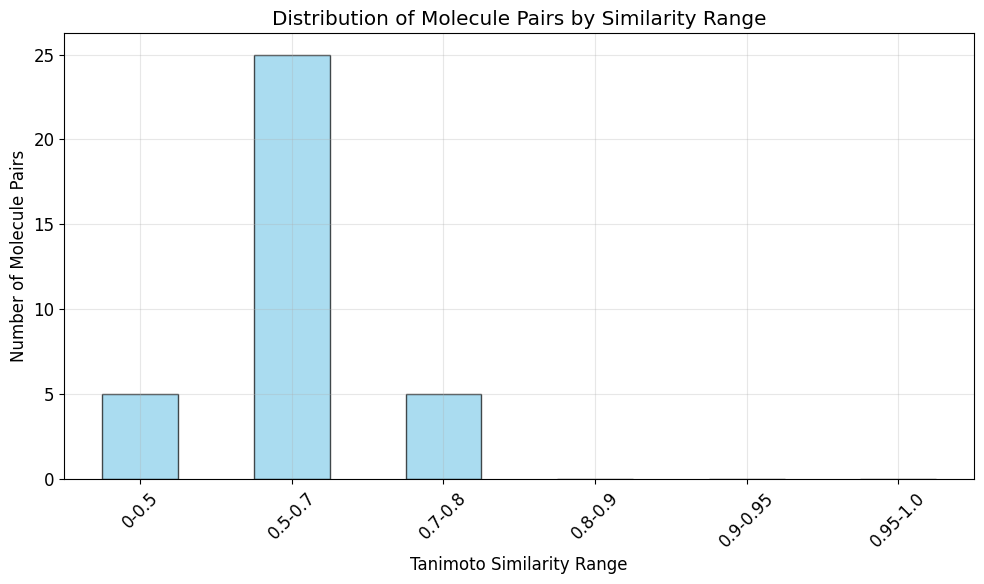

In [54]:
%matplotlib inline
import matplotlib.pyplot as plt
range_counts = merged_df['similarity_range'].value_counts().sort_index()
print(range_counts)

# Plot similarity ranges
plt.figure(figsize=(10, 6))
range_counts.plot(kind='bar', color='skyblue', alpha=0.7, edgecolor='black')
plt.xlabel('Tanimoto Similarity Range')
plt.ylabel('Number of Molecule Pairs')
plt.title('Distribution of Molecule Pairs by Similarity Range')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw
import matplotlib.gridspec as gridspec
import os
import warnings
warnings.filterwarnings('ignore')

# Set up the output directory for figures
base_dir = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned'
figures_dir = os.path.join(base_dir, '_FIGURES')

# Ensure the directory exists
if not os.path.exists(figures_dir):
    os.makedirs(figures_dir)
    print(f"Created directory: {figures_dir}")
else:
    print(f"Using existing directory: {figures_dir}")

# Load the CSV file with similarity data
file_path = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/9.0_Tanimoto_Similarity_Experiment/tanimoto_similarity_analysis.csv'
df = pd.read_csv(file_path)

# Display basic information
print(f"Loaded {len(df)} molecule pairs")
print(f"Columns in dataset: {df.columns.tolist()}")

# Check for missing values in critical columns
critical_cols = ['canonical_smiles_truth', 'canonical_smiles_regio', 'tanimoto_similarity']
missing_data = df[critical_cols].isnull().sum()
print(f"\nMissing values in critical columns:\n{missing_data}")

# Drop rows with missing values
df_clean = df.dropna(subset=critical_cols)
print(f"Molecules after removing missing data: {len(df_clean)}")

# Calculate statistics on Tanimoto similarities
sim_values = df_clean['tanimoto_similarity'].values
avg_similarity = np.mean(sim_values)
median_similarity = np.median(sim_values)
min_similarity = np.min(sim_values)
max_similarity = np.max(sim_values)
std_similarity = np.std(sim_values)

print(f"\nTanimoto Similarity Statistics:")
print(f"Average: {avg_similarity:.3f} ± {std_similarity:.3f}")
print(f"Median: {median_similarity:.3f}")
print(f"Range: {min_similarity:.3f} - {max_similarity:.3f}")

# Count molecules in different similarity ranges
similarity_ranges = [
    (0.0, 0.5, '0.0-0.5'),
    (0.5, 0.7, '0.5-0.7'),
    (0.7, 0.8, '0.7-0.8'),
    (0.8, 0.9, '0.8-0.9'),
    (0.9, 1.0, '0.9-1.0')
]

range_counts = []
for lower, upper, label in similarity_ranges:
    count = ((df_clean['tanimoto_similarity'] >= lower) & 
             (df_clean['tanimoto_similarity'] < upper)).sum()
    if upper == 1.0:  # Include exact 1.0 in the last bin
        count += (df_clean['tanimoto_similarity'] == 1.0).sum()
    range_counts.append((label, count, count/len(df_clean)*100))

print("\nSimilarity Range Distribution:")
for label, count, percentage in range_counts:
    print(f"{label}: {count} molecules ({percentage:.1f}%)")

# Function to create a grid of molecule pairs with similarities
def visualize_molecule_pairs(df, n_rows=5, n_cols=2, figsize=(12, 20), n_examples=10):
    # Sort by similarity to show a range of examples
    df_sorted = df.sort_values('tanimoto_similarity')
    
    # Select examples across the similarity spectrum
    indices = []
    if len(df_sorted) <= n_examples:
        indices = list(range(len(df_sorted)))
    else:
        # Take evenly spaced examples across the similarity range
        step = len(df_sorted) / n_examples
        for i in range(n_examples):
            idx = int(i * step)
            indices.append(idx)
    
    df_selected = df_sorted.iloc[indices].reset_index(drop=True)
    
    # Calculate number of pages needed
    examples_per_page = n_rows * n_cols
    n_pages = int(np.ceil(len(df_selected) / examples_per_page))
    
    # Process each page
    for page in range(n_pages):
        start_idx = page * examples_per_page
        end_idx = min(start_idx + examples_per_page, len(df_selected))
        
        # Create a figure with a grid layout
        fig = plt.figure(figsize=figsize)
        gs = gridspec.GridSpec(n_rows, n_cols * 2)
        
        # Add a title to the figure
        plt.suptitle(f"Target Molecules vs. Regio-isomers (Page {page+1}/{n_pages})", 
                     fontsize=16, y=0.98)
        
        # Process each pair for this page
        for i, idx in enumerate(range(start_idx, end_idx)):
            row_idx = i // n_cols
            col_idx = i % n_cols
            
            molecule_data = df_selected.iloc[idx]
            
            # Get molecule SMILES
            target_smiles = molecule_data['canonical_smiles_truth']
            regio_smiles = molecule_data['canonical_smiles_regio']
            sample_id = molecule_data['sample-id']
            similarity = molecule_data['tanimoto_similarity']
            
            # Create RDKit molecule objects
            target_mol = Chem.MolFromSmiles(target_smiles)
            regio_mol = Chem.MolFromSmiles(regio_smiles)
            
            # Create sub-plots for this pair
            ax1 = plt.subplot(gs[row_idx, col_idx*2])
            ax2 = plt.subplot(gs[row_idx, col_idx*2+1])
            
            # Draw molecules
            if target_mol and regio_mol:
                target_img = Draw.MolToImage(target_mol, size=(300, 300))
                regio_img = Draw.MolToImage(regio_mol, size=(300, 300))
                
                ax1.imshow(target_img)
                ax1.set_title(f"Original: {sample_id}", fontsize=10)
                ax1.axis('off')
                
                ax2.imshow(regio_img)
                ax2.set_title(f"Regio-isomer (Sim: {similarity:.3f})", fontsize=10)
                ax2.axis('off')
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for the suptitle
        save_path = os.path.join(figures_dir, f"molecule_pairs_page_{page+1}.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved page {page+1} to {save_path}")
        plt.close()
    
    # Create histogram of similarities
    plt.figure(figsize=(10, 6))
    plt.hist(sim_values, bins=20, edgecolor='black', alpha=0.7, color="#8CB0FE")
    plt.axvline(avg_similarity, color='red', linestyle='--', 
                label=f'Mean: {avg_similarity:.3f}')
    plt.axvline(median_similarity, color='orange', linestyle='--', 
                label=f'Median: {median_similarity:.3f}')
    plt.xlabel('Tanimoto Similarity')
    plt.ylabel('Frequency')
    plt.title('Distribution of Tanimoto Similarities Between Target Molecules and Regio-isomers')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    hist_path = os.path.join(figures_dir, "tanimoto_similarity_distribution.png")
    plt.savefig(hist_path, dpi=300)
    print(f"Saved histogram to {hist_path}")
    plt.close()
    
    # Create bar chart of similarity ranges
    plt.figure(figsize=(10, 6))
    labels = [label for label, _, _ in range_counts]
    counts = [count for _, count, _ in range_counts]
    plt.bar(labels, counts, color="#8CB0FE", edgecolor='black', alpha=0.7)
    plt.xlabel('Tanimoto Similarity Range')
    plt.ylabel('Number of Molecule Pairs')
    plt.title('Distribution of Molecule Pairs by Similarity Range')
    plt.xticks(rotation=0)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    bar_path = os.path.join(figures_dir, "similarity_ranges_barchart.png")
    plt.savefig(bar_path, dpi=300)
    print(f"Saved bar chart to {bar_path}")
    plt.close()
    
    return df_selected

# Create visualizations
print("\nGenerating visualizations...")
selected_molecules = visualize_molecule_pairs(df_clean, n_examples=20)

# Save the selected molecules with their similarities to a CSV
output_path = os.path.join(figures_dir, "selected_molecule_pairs.csv")
selected_molecules.to_csv(output_path, index=False)
print(f"Saved selected molecule pairs to {output_path}")


Using existing directory: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES
Loaded 35 molecule pairs
Columns in dataset: ['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'sample-id', 'SMILES_aug', 'SMILES_regio_isomers', 'shifts_aug', 'AZ_Number', 'SN_Number', 'canonical_smiles_aug', 'canonical_smiles_regio', 'SMILES_truth', 'shifts_truth', 'canonical_smiles_truth', 'tanimoto_similarity', 'similarity_range']

Missing values in critical columns:
canonical_smiles_truth    0
canonical_smiles_regio    0
tanimoto_similarity       0
dtype: int64
Molecules after removing missing data: 35

Tanimoto Similarity Statistics:
Average: 0.599 ± 0.088
Median: 0.596
Range: 0.424 - 0.765

Similarity Range Distribution:
0.0-0.5: 4 molecules (11.4%)
0.5-0.7: 25 molecules (71.4%)
0.7-0.8: 6 molecules (17.1%)
0.8-0.9: 0 molecules (0.0%)
0.9-1.0: 0 molecules (0.0%)

Generating visualizations...
Saved page 1 to /projects/cc/se_users/knlr326/1_NMR_project/2_

### 9.0 Improvement Cycle on Similar Molecules

In [181]:

def split_dataset(config, chunk_size: int) -> List[pd.DataFrame]:
    df = pd.read_csv(config.SGNN_csv_gen_smi)
    return [df[i:i+chunk_size] for i in range(0, len(df), chunk_size)]


def create_chunk_folder(config, idx: int) -> str:
    base_dir = config.model_save_dir
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    chunk_folder_name = f"chunk_{idx:03d}_{current_datetime}"
    chunk_folder_path = os.path.join(base_dir, chunk_folder_name)
    
    os.makedirs(chunk_folder_path, exist_ok=True)
    print(f"Created folder for chunk {idx}: {chunk_folder_path}")
    
    return chunk_folder_path

def test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, idx):
    MW_filter, greedy_full = True, False
    
    print("prepare_data")
    config = prepare_data(config, chunk)
    print("generate_simulated_data")
    config = generate_simulated_data(config, IR_config)

    print("load_model_and_data")
    model_MMT, val_dataloader, val_dataloader_multi = load_model_and_data(config, stoi, stoi_MF)

    print("run_model_analysis")
    prob_dict_results_1c_, results_dict_1c_ = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

    results = test_model_performance(config, model_MMT, val_dataloader, val_dataloader_multi, stoi, itos, stoi_MF, itos_MF)

    save_results_before(results, config, idx)

    return config

def prepare_data(config: Any, chunk: pd.DataFrame) -> Any:
    chunk_csv_path = os.path.join(config.pkl_save_folder, "SGNN_csv_gen_smi.csv")
    chunk.to_csv(chunk_csv_path)
    config.SGNN_csv_gen_smi = chunk_csv_path 
    config.data_size = len(chunk)
    return config

def generate_simulated_data(config: Any, IR_config: Any) -> Any:
    config.execution_type = "data_generation"
    if config.execution_type == "data_generation":
        print("\033[1m\033[31mThis is: data_generation\033[0m")
        #import IPython; IPython.embed();

        config = ex.gen_sim_aug_data(config, IR_config)
        backup_config_paths(config)
    return config

def backup_config_paths(config: Any) -> None:
    config.csv_1H_path_SGNN_backup = copy.deepcopy(config.csv_1H_path_SGNN)
    config.csv_13C_path_SGNN_backup = copy.deepcopy(config.csv_13C_path_SGNN)
    config.csv_HSQC_path_SGNN_backup = copy.deepcopy(config.csv_HSQC_path_SGNN)
    config.csv_COSY_path_SGNN_backup = copy.deepcopy(config.csv_COSY_path_SGNN)
    config.IR_data_folder_backup = copy.deepcopy(config.IR_data_folder)

def save_results_before(results: Dict[str, Any], config: Any, idx: int) -> None:
    variables_to_save = {
        'avg_tani_bl_ZINC': results['avg_tani_bl_ZINC_'],
        'results_dict_greedy_bl_ZINC': results.get('results_dict_greedy_bl_ZINC_'),
        'failed_bl_ZINC': results.get('failed_bl_ZINC_'),
        'avg_tani_greedy_bl_ZINC': results['avg_tani_greedy_bl_ZINC_'],
        'results_dict_ZINC_greedy_bl': results.get('results_dict_ZINC_greedy_bl_'),
        'total_results_bl_ZINC': results['total_results_bl_ZINC_'],
        'corr_sampleing_prob_bl_ZINC': results['corr_sampleing_prob_bl_ZINC_'],
        'results_dict_bl_ZINC': results['results_dict_bl_ZINC_'],
    }
    save_data_with_datetime_index(variables_to_save, config.pkl_save_folder, "before_sim_data", idx)

def create_run_folder(chunk_folder, idx):
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    run_folder_name = f"run_{idx}_{current_datetime}"
    run_folder_path = os.path.join(chunk_folder, run_folder_name)
    
    os.makedirs(run_folder_path, exist_ok=True)
    print(f"Created folder for run {idx}: {run_folder_path}")
    
    return run_folder_path

def fine_tune_model_aug_mol(config, stoi, stoi_MF, chunk, idx):
    #import IPython; IPython.embed();
    config, all_gen_smis, aug_mol_df = generate_augmented_molecules_from_aug_mol(config, chunk, idx)
    
    config.parent_model_save_dir = config.model_save_dir
    config.model_save_dir = config.current_run_folder 
    
    if config.execution_type == "transformer_improvement":
        print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
        config.training_setup = "pretraining"
        mtf.run_MMT(config, stoi, stoi_MF)
    
    config.model_save_dir = config.parent_model_save_dir
    #config = ex.update_model_path(config)

    return config, aug_mol_df, all_gen_smis


def generate_augmented_molecules_from_aug_mol(config, chunk, idx):

    ############# THis is just relevant for the augmented molecules #############
    chunk.rename(columns={'SMILES': 'SMILES_orig', 'SMILES_regio_isomers': 'SMILES'}, inplace=True)
    #############################################################################
    
    script_dir = os.getcwd()
    
    base_path = os.path.abspath(os.path.join(script_dir, 'deep-molecular-optimization'))

    csv_file_path = f'{base_path}/data/MMP/test_selection_2.csv'
    chunk.to_csv(csv_file_path, index=False)
    print(f"CSV file '{csv_file_path}' created successfully.")

    config.data_size = len(chunk)
    config.n_samples = config.data_size

    config, results_dict_MF = generate_smiles_mf(config)

    combined_list_MF = process_generated_smiles(results_dict_MF, config)

    all_gen_smis = filter_and_combine_smiles(combined_list_MF)

    aug_mol_df = create_augmented_dataframe(all_gen_smis)

    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)

    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"

    return config, all_gen_smis, aug_mol_df


def fine_tune_model(config, stoi, stoi_MF, chunk, idx):
    """
    Fine-tune the model on a chunk of data.
    """
    config, aug_mol_df, all_gen_smis = generate_augmented_molecules(config, chunk, idx)
    
    config.parent_model_save_dir = config.model_save_dir
    new_model_save_dir = create_model_save_dir(config.parent_model_save_dir, idx)
    config.model_save_dir = new_model_save_dir
    
    # Fine-tune the model
    if config.execution_type == "transformer_improvement":
        print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
        config.training_setup = "pretraining"
        mtf.run_MMT(config, stoi, stoi_MF)
        
    #config = ex.update_model_path(config)
    config.model_save_dir = config.parent_model_save_dir
    
    return config, aug_mol_df, all_gen_smis

def generate_augmented_molecules(config, chunk, idx):
    #import IPython; IPython.embed();
    script_dir = os.getcwd()
    
    base_path = os.path.abspath(os.path.join(script_dir, 'deep-molecular-optimization'))

    csv_file_path = f'{base_path}/data/MMP/test_selection_2.csv'
    chunk.to_csv(csv_file_path, index=False)
    print(f"CSV file '{csv_file_path}' created successfully.")

    config.data_size = len(chunk)
    config.n_samples = config.data_size

    config, results_dict_MF = generate_smiles_mf(config)

    combined_list_MF = process_generated_smiles(results_dict_MF, config)

    all_gen_smis = filter_and_combine_smiles(combined_list_MF)

    aug_mol_df = create_augmented_dataframe(all_gen_smis)

    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)

    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"

    return config, all_gen_smis, aug_mol_df


def generate_smiles_mf(config):
    print("\033[1m\033[31mThis is: SMI_generation_MF\033[0m")
    return ex.SMI_generation_MF(config, stoi, stoi_MF, itos, itos_MF)

def process_generated_smiles(results_dict_MF, config):
    results_dict_MF = {key: value for key, value in results_dict_MF.items() if not hf.contains_only_nan(value)}
    for key, value in results_dict_MF.items():
        results_dict_MF[key] = hf.remove_nan_from_list(value)

    combined_list_MF, _, _, _ = cv.plot_cluster_MF(results_dict_MF, config)
    return combined_list_MF

def filter_and_combine_smiles(combined_list_MF):
    print("\033[1m\033[31mThis is: combine_MMT_MF\033[0m")
    all_gen_smis = combined_list_MF
    all_gen_smis = [smiles for smiles in all_gen_smis if smiles != 'NAN']

    val_data = pd.read_csv(config.csv_path_val)
    all_gen_smis = mrtf.filter_smiles(val_data, all_gen_smis)
    return all_gen_smis

def create_augmented_dataframe(all_gen_smis):
    length_of_list = len(all_gen_smis)
    random_number_strings = [f"GT_{str(i).zfill(7)}" for i in range(1, length_of_list + 1)]
    return pd.DataFrame({'SMILES': all_gen_smis, 'sample-id': random_number_strings})

def setup_data_paths(config):
    
    base_path_exp = os.path.abspath("./past_experiments/ChemXriv/8.0_Experimenta_Data/")
    config.csv_1H_path_exp = f"{base_path_exp}real_1H_with_AZ_SMILES_v3.csv"
    config.csv_13C_path_exp = f"{base_path_exp}real_13C_with_AZ_SMILES_v3.csv"
    config.csv_HSQC_path_exp = f"{base_path_exp}real_HSQC_with_AZ_SMILES_v3.csv"
    config.csv_COSY_path_exp = f"{base_path_exp}real_COSY_with_AZ_SMILES_v3.csv"
    config.IR_data_folder_exp = f"{base_path_exp}IR_data"
    return config

def test_model_on_datasets(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, aug_mol_df, all_gen_smis):
    checkpoint_path_backup = config.checkpoint_path    
    for data_type in ['exp', 'sim']:
        print(f"Testing on {data_type} data")
        config.pickle_file_path = ""
        config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
        config = test_on_data(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, data_type, aug_mol_df, all_gen_smis)
    config.checkpoint_path = checkpoint_path_backup
    return config

def test_on_data(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, data_type, aug_mol_df, all_gen_smis):
    if data_type == 'sim':
        restore_backup_configs(config)
    else:
        sample_ids = chunk['sample-id'].tolist()
        process_spectrum_data(config, sample_ids, data_type)
    #import IPython; IPython.embed();

    update_config_settings(config)
    last_checkpoint = get_last_checkpoint(config.current_run_folder)
    config.checkpoint_path = last_checkpoint
    
    model_MMT, val_dataloader, val_dataloader_multi = load_model_and_data(config, stoi, stoi_MF)
    
    prob_dict_results_1c_, results_dict_1c_ = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

    results = test_model_performance(config, model_MMT, val_dataloader, val_dataloader_multi,
                                     stoi, itos, stoi_MF, itos_MF)
    
    if data_type == 'sim':
        results['aug_mol_df'] = aug_mol_df
        results['all_gen_smis'] = all_gen_smis
    
    save_results_acd_exp(results, config, data_type, composite_idx)
    return config

def restore_backup_configs(config):
    config.csv_1H_path_SGNN = config.csv_1H_path_SGNN_backup
    config.csv_13C_path_SGNN = config.csv_13C_path_SGNN_backup
    config.csv_HSQC_path_SGNN = config.csv_HSQC_path_SGNN_backup
    config.csv_COSY_path_SGNN = config.csv_COSY_path_SGNN_backup
    config.IR_data_folder = config.IR_data_folder_backup 
    config.csv_path_val = config.csv_1H_path_SGNN_backup
    config.pickle_file_path = ""

def process_spectrum_data(config: Any, sample_ids: List[str], data_type: str) -> None:
    spectrum_types = ['1H', '13C', 'HSQC', 'COSY']
    for spectrum in spectrum_types:
        csv_path = getattr(config, f'csv_{spectrum}_path_{data_type}')
        df_data = pd.read_csv(csv_path)
        df_data['sample-id'] = df_data['AZ_Number']
        data = select_relevant_samples(df_data, sample_ids)
        dummy_path, config = save_and_update_config(config, data_type, spectrum, data)
        print(f"Saved {spectrum} data to: {dummy_path}")
    if data_type == "ACD" or data_type == "sim":
        config.IR_data_folder = config.IR_data_folder_backup 
    elif  data_type == "exp":
        config.IR_data_folder = config.IR_data_folder_exp 

    
    
def select_relevant_samples(df: pd.DataFrame, sample_ids: List[str]) -> pd.DataFrame:
    return df[df['sample-id'].isin(sample_ids)]

def save_and_update_config(config, data_type: str, spectrum_type: str, data: pd.DataFrame) -> Tuple[str, Any]:
    temp_dir = tempfile.mkdtemp()
    dummy_path = os.path.join(temp_dir, f"{data_type}_{spectrum_type}_selected_samples.csv")
    
    data.to_csv(dummy_path, index=False)
    
    config_key = f'csv_{spectrum_type}_path_SGNN'
    setattr(config, config_key, dummy_path)
    
    return dummy_path, config

def update_config_settings(config: Any) -> None:
    config.csv_path_val = config.csv_1H_path_SGNN
    config.pickle_file_path = ""

def get_last_checkpoint(model_folder: str) -> str:
    checkpoints = [f for f in os.listdir(model_folder) if f.endswith('.ckpt')]
    if not checkpoints:
        raise ValueError(f"No checkpoints found in {model_folder}")
    
    last_checkpoint = max(checkpoints, key=lambda x: os.path.getmtime(os.path.join(model_folder, x)))
    return os.path.join(model_folder, last_checkpoint)

def load_model_and_data(config: Any, stoi: Dict, stoi_MF: Dict) -> Tuple[Any, Any, Any]:
    #import IPython; IPython.embed();

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
    model_MMT = mrtf.load_MMT_model(config)
    return model_MMT, val_dataloader, val_dataloader_multi

def test_model_performance(config: Any, model_MMT: Any, val_dataloader: Any, val_dataloader_multi: Any, 
                           stoi: Dict, itos: Dict, stoi_MF: Dict, itos_MF: Dict) -> Dict[str, Any]:
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    
    MW_filter = True
    greedy_full = False
    
    model_CLIP = mrtf.load_CLIP_model(config)
    
    results = {}
    
    results['results_dict_bl_ZINC_'] = mrtf.run_test_mns_performance_CLIP_3(
        config, model_MMT, model_CLIP, val_dataloader, stoi, itos, MW_filter)
    results['results_dict_bl_ZINC_'], counter = mrtf.filter_invalid_inputs(results['results_dict_bl_ZINC_'])

    results['avg_tani_bl_ZINC_'], html_plot = rbgvm.plot_hist_of_results(results['results_dict_bl_ZINC_'])

    if greedy_full:
        results['results_dict_greedy_bl_ZINC_'], results['failed_bl_ZINC_'] = mrtf.run_test_performance_CLIP_greedy_3(
            config, stoi, stoi_MF, itos, itos_MF)
        results['avg_tani_greedy_bl_ZINC_'], html_plot_greedy = rbgvm.plot_hist_of_results_greedy(
            results['results_dict_greedy_bl_ZINC_'])
    else:
        config, results['results_dict_ZINC_greedy_bl_'] = mrtf.run_greedy_sampling(
            config, model_MMT, val_dataloader_multi, itos, stoi)
        results['avg_tani_greedy_bl_ZINC_'] = results['results_dict_ZINC_greedy_bl_']["tanimoto_mean"]

    results['total_results_bl_ZINC_'] = mrtf.run_test_performance_CLIP_3(
        config, model_MMT, val_dataloader, stoi)
    results['corr_sampleing_prob_bl_ZINC_'] = results['total_results_bl_ZINC_']["statistics_multiplication_avg"][0]

    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(results['avg_tani_bl_ZINC_'], results['avg_tani_greedy_bl_ZINC_'], results['corr_sampleing_prob_bl_ZINC_'])
    print("Greedy tanimoto results")
    rbgvm.plot_hist_of_results_greedy_new(results['results_dict_ZINC_greedy_bl_'])

    return results

def save_results_acd_exp(results: Dict[str, Any], config: Any, data_type: str, composite_idx: str) -> None:
    variables_to_save = {
        'avg_tani_bl_ZINC': results['avg_tani_bl_ZINC_'],
        'results_dict_greedy_bl_ZINC': results.get('results_dict_greedy_bl_ZINC_'),
        'failed_bl_ZINC': results.get('failed_bl_ZINC_'),
        'avg_tani_greedy_bl_ZINC': results['avg_tani_greedy_bl_ZINC_'],
        'results_dict_ZINC_greedy_bl': results.get('results_dict_ZINC_greedy_bl_'),
        'total_results_bl_ZINC': results['total_results_bl_ZINC_'],
        'corr_sampleing_prob_bl_ZINC': results['corr_sampleing_prob_bl_ZINC_'],
        'results_dict_bl_ZINC': results['results_dict_bl_ZINC_'],
        'checkpoint_path': config.checkpoint_path,
    }
    
    if data_type == 'sim':
        variables_to_save['aug_mol_df'] = results.get('aug_mol_df')
        variables_to_save['all_gen_smis'] = results.get('all_gen_smis')
    
    save_data_with_datetime_index(
        variables_to_save, 
        config.pkl_save_folder, 
        f"{data_type}_sim_data", 
        composite_idx
    )

def save_data_with_datetime_index(data: Any, base_folder: str, name: str, idx: Union[int, str]) -> None:
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{current_datetime}_{name}_{idx}.pkl"
    os.makedirs(base_folder, exist_ok=True)
    file_path = os.path.join(base_folder, filename)

    
    with open(file_path, 'wb') as f:
        pickle.dump(data, f)
    
    print(f"Data saved to: {file_path}")

In [183]:

def main_IC(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, num_training_runs=3):
    chunks = split_dataset(config, chunk_size)
    config.model_save_dir = config.pkl_save_folder
    model_save_dir_backup = config.model_save_dir
    original_checkpoint_path = config.checkpoint_path  # Store the original checkpoint path

    for chunk_idx, chunk in enumerate(chunks):
        print(f"Processing chunk {chunk_idx+1} of {len(chunks)}")
        
        chunk_folder = create_chunk_folder(config, chunk_idx)
        config.current_chunk_folder = chunk_folder
            
        config.blank_percentage = 0
        config = test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{0}")
        print(config.csv_1H_path_SGNN)
        for run_idx in range(num_training_runs):
            print(f"Starting training run {run_idx+1} of {num_training_runs}")
            
            run_folder = create_run_folder(config.current_chunk_folder, f"{chunk_idx}_{run_idx}")
            config.current_run_folder = run_folder
            config.model_save_dir = run_folder

            config.blank_percentage = 50
            config, aug_mol_df, all_gen_smis = fine_tune_model_aug_mol(config, stoi, stoi_MF, chunk, f"{chunk_idx}_{run_idx}")
            #import IPython; IPython.embed();

            ### Retrun the labelling of the smiles to test it on the correct one
            #chunk.rename(columns={'SMILES': 'SMILES_regio_isomers', 'SMILES_orig': 'SMILES'}, inplace=True)

            config.blank_percentage = 0
            config = setup_data_paths(config)
            config = test_model_on_datasets(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{run_idx}", aug_mol_df, all_gen_smis)

            config.checkpoint_path = original_checkpoint_path
        
        print(f"Chunk {chunk_idx+1} completed. All training runs finished.")
        config.model_save_dir = model_save_dir_backup


In [184]:
### RUN a1
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.pkl_save_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3_")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv")

config.MF_generations = 30
config.MF_delta_weight = 100
config.max_scaffold_generations = 300
config.blank_percentage = 50
config.weight_MW = 100
config.lr_pretraining = 3e-4
config.tr_te_split = 0.9
config.batch_size = 64
config.num_epochs = 30
config.temperature = 1
config.multinom_runs = 20 
config.train_data_blend = 0

chunk_size = 1

main_IC(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, 3)

Processing chunk 1 of 35
Created folder for chunk 0: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3_/chunk_000_20250611_132809
prepare_data
generate_simulated_data
This is: data_generation
outside ran_num
873803
873803
Using existing ran_num: 873803
0
 run_sgnn: DONE
 run_1H_generation: DONE
1H CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_1H_873803.csv
 run_13C_generation: DONE
13C CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_13C_873803.csv
 run_COSY_generation: DONE
COSY CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_COSY_873803.csv
 run_HSQC_generation: DONE
HSQC CSV saved to:

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.57it/s]


evaluate_greedy_2


1it [00:00,  2.39it/s]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
This is: test_performance
0
1 0 1


KeyboardInterrupt: 

In [185]:
def main_aug():
    folder_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/")
    model_type = "MMT"
    ranking_methods = ["HSQC"] #"COSY", "HSQC & COSY"
    file_types = ["sim_sim_data", "exp_sim_data"]

    data_type_map = {
        "sim_sim_data": "Our Simulated",
        "exp_sim_data": "Experimental"
    }
    filtered_out = []
    all_rankings_list = []
    for ranking_method in ranking_methods:
        for file_type in file_types:
            all_rankings = process_pkl_files_new(folder_path, file_type, ranking_method)
            #import IPython; IPython.embed();
            all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
            all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
            filtered_out.append(filtered_out_rankings)
            all_rankings_list.append(all_rankings)
            
            accuracies = calculate_top_k_accuracy(all_rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(all_rankings)

            data_type = data_type_map[file_type]
            save_path = f"./_FIGURES/similar_starting_top_k_accuracy_MMT_{file_type}_{ranking_method}_FINAL_2.png"
            print(len(all_rankings.keys()))
            plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path, total_samples=len(all_rankings.keys()))

            print(f"Completed plot for {ranking_method} - {data_type}")
    return all_rankings_list, filtered_out



In [186]:
all_rankings_list, filtered_out = main_aug()

34
Plot saved to ./_FIGURES/similar_starting_top_k_accuracy_MMT_sim_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Our Simulated
34
Plot saved to ./_FIGURES/similar_starting_top_k_accuracy_MMT_exp_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Experimental


Original SMILES:


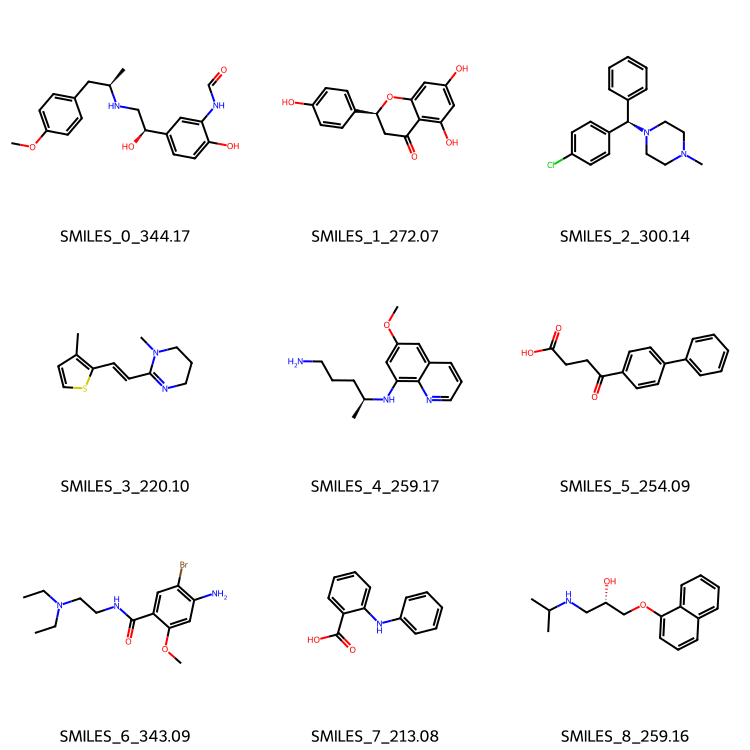

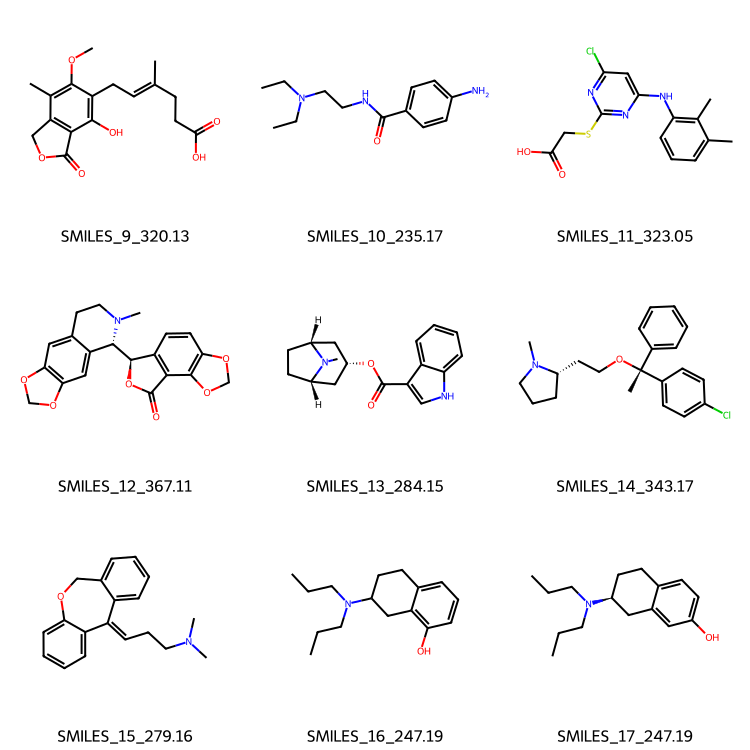

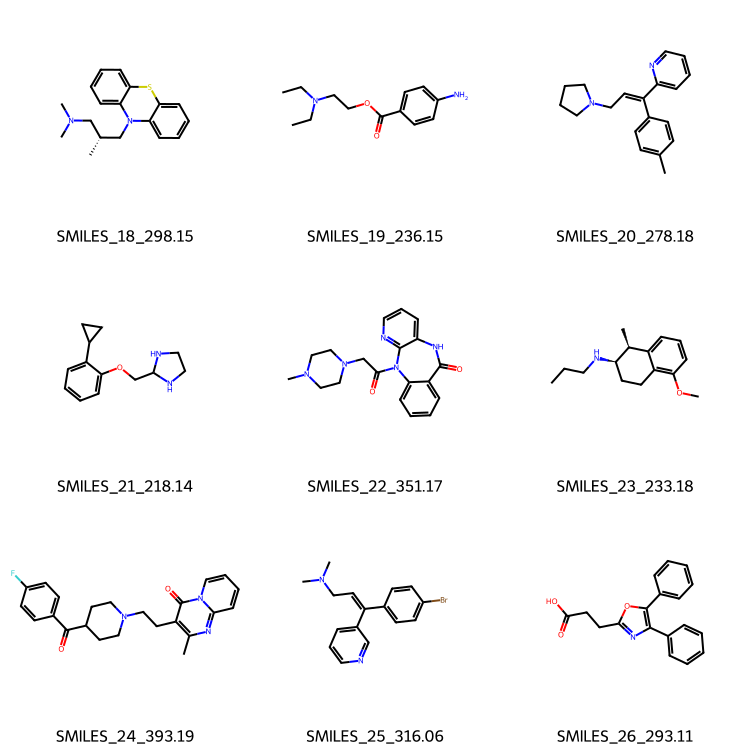

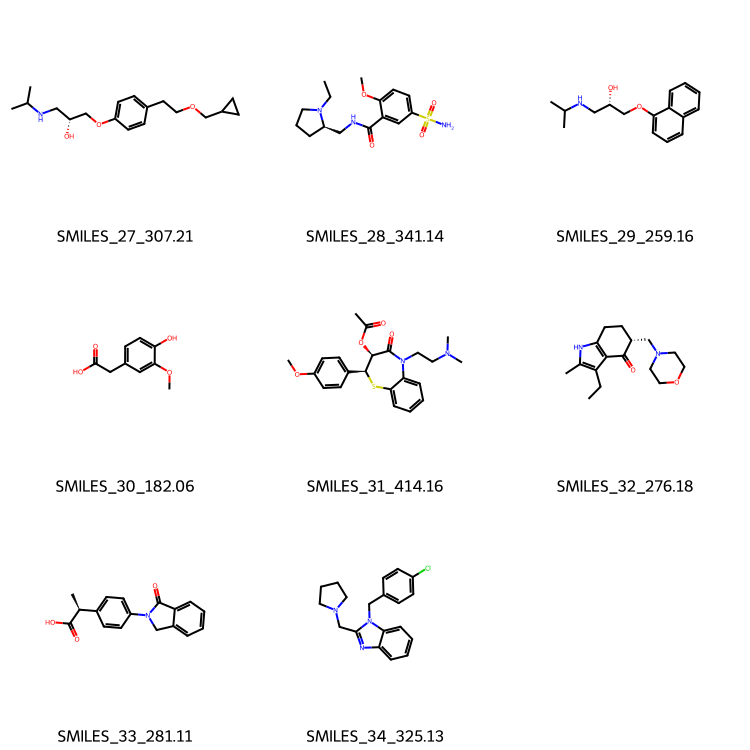


Regio Isomer SMILES:


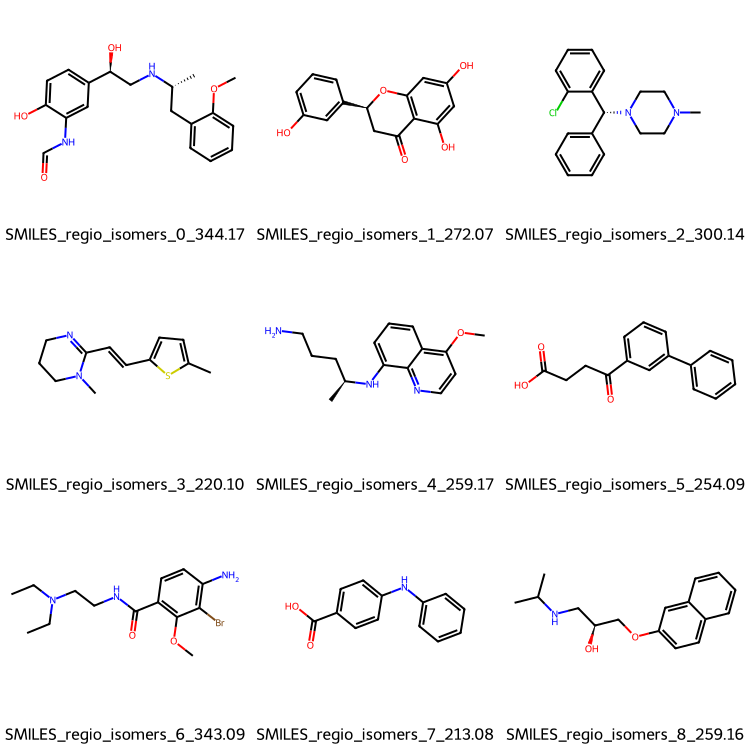

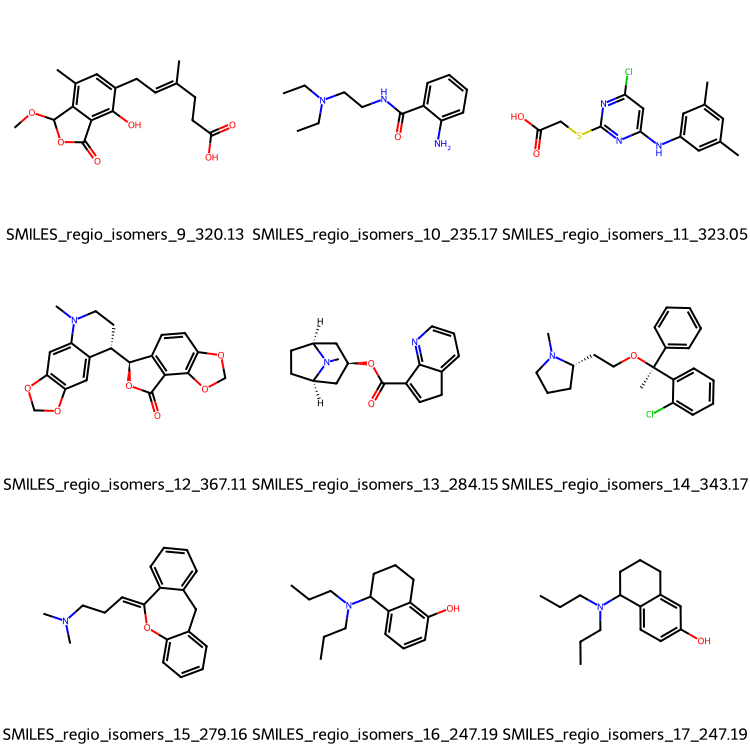

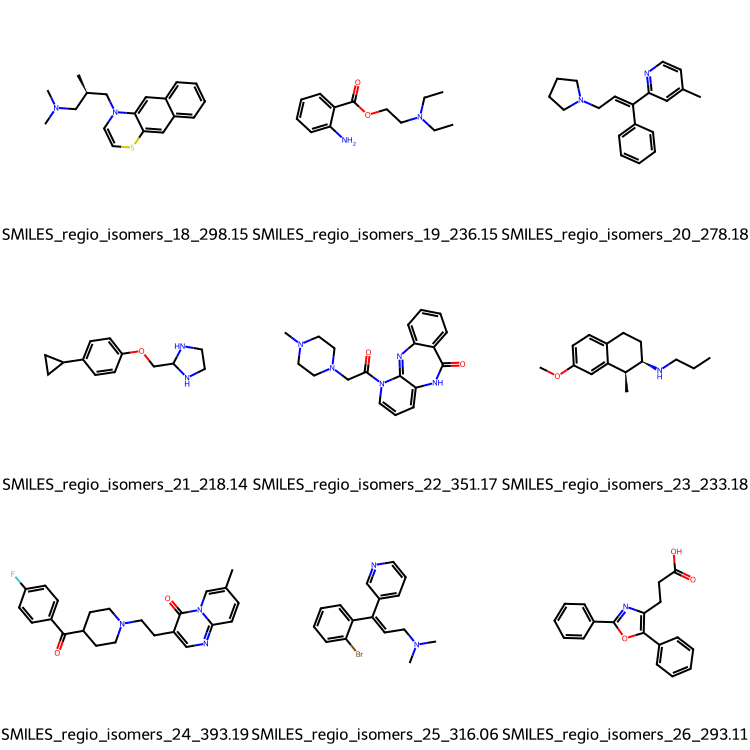

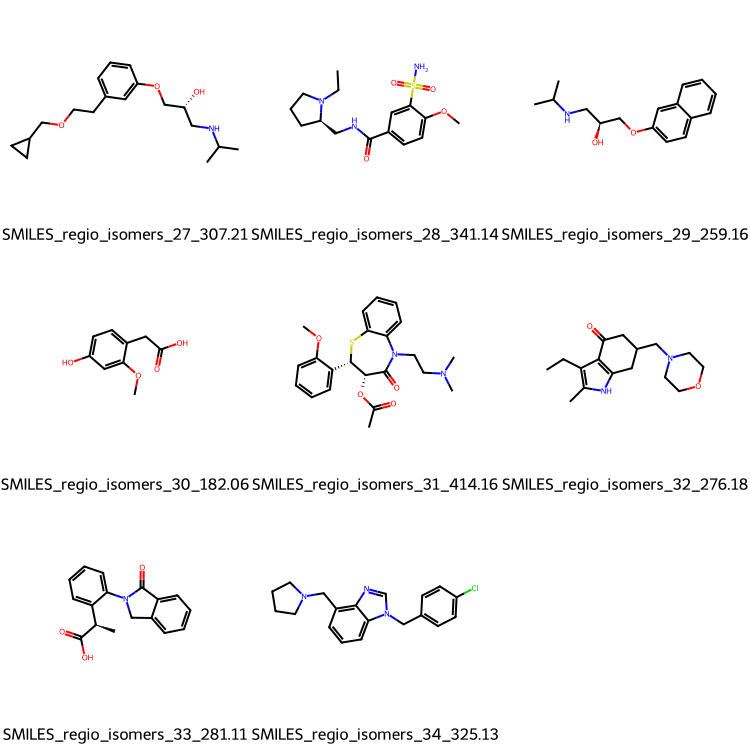


Side-by-side comparison:


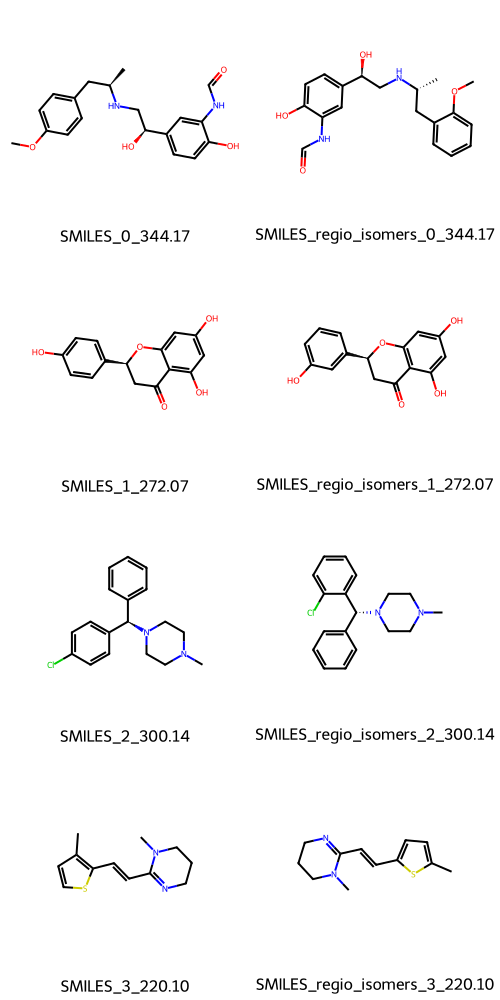

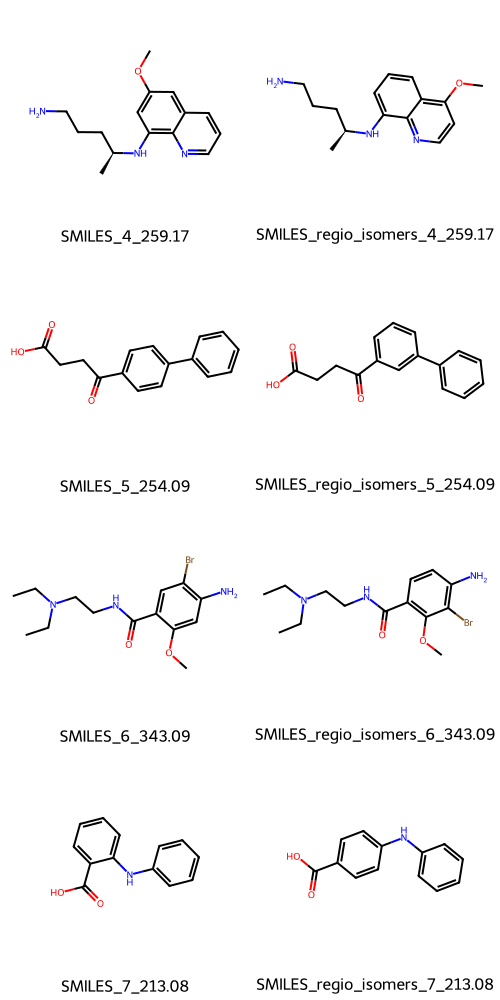

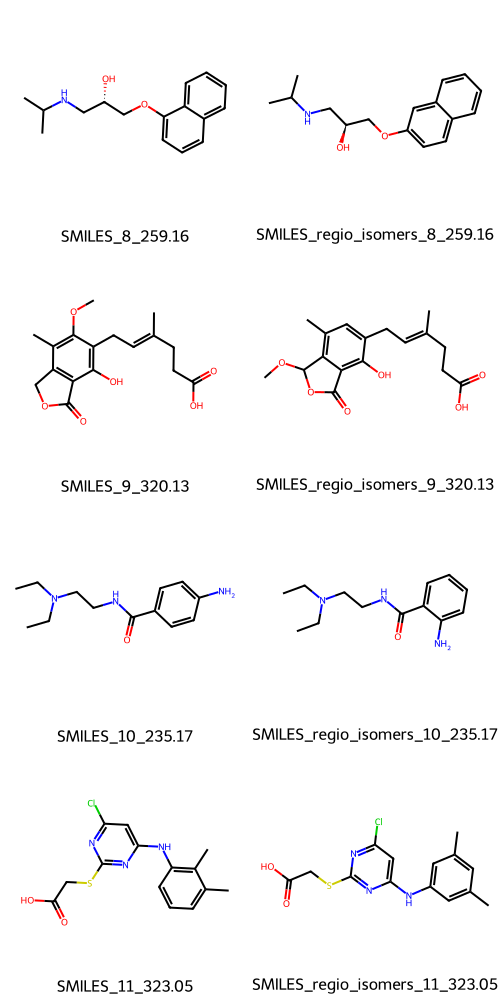

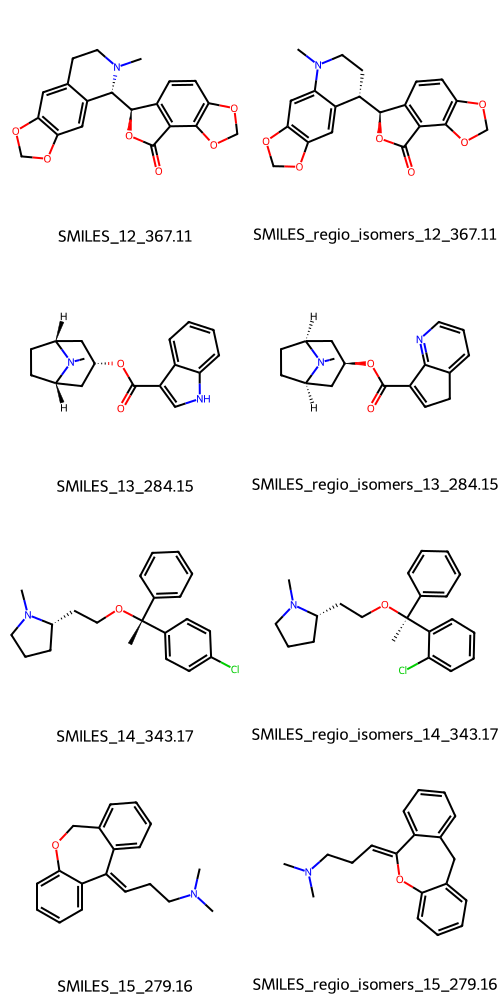

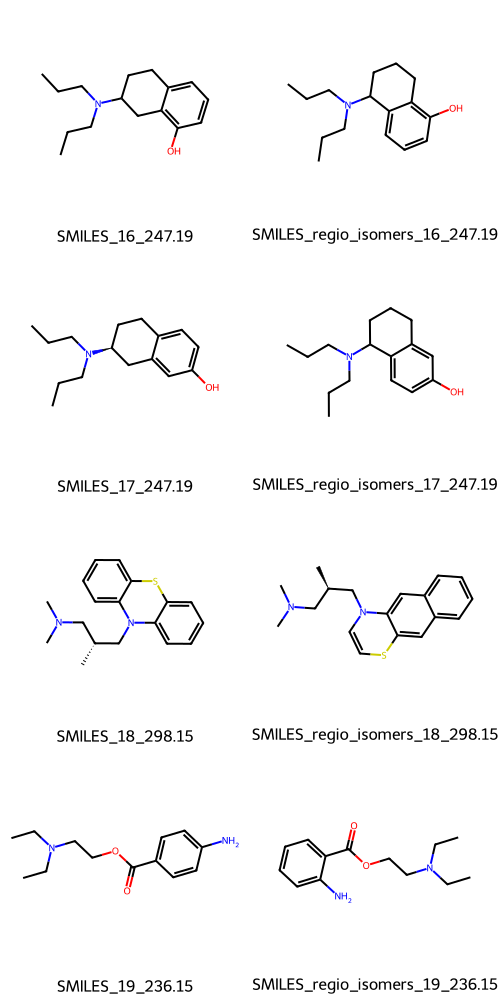

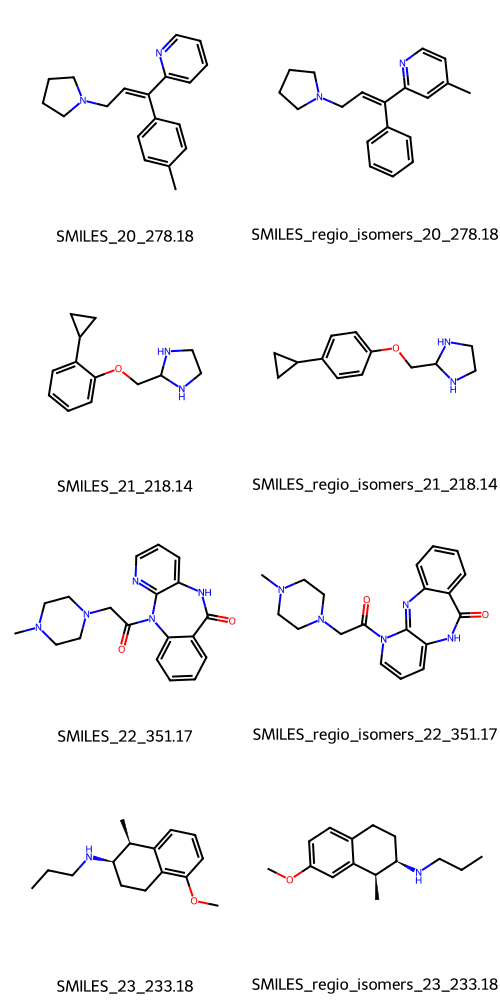

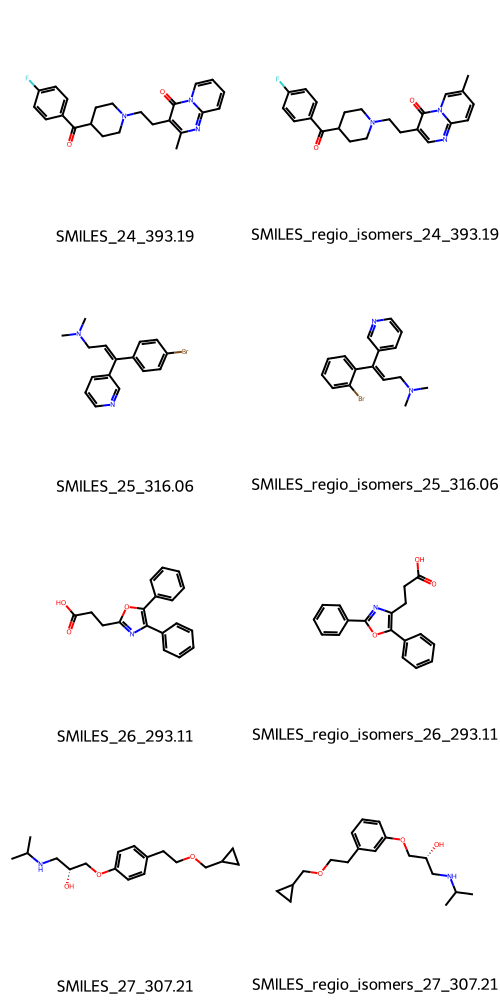

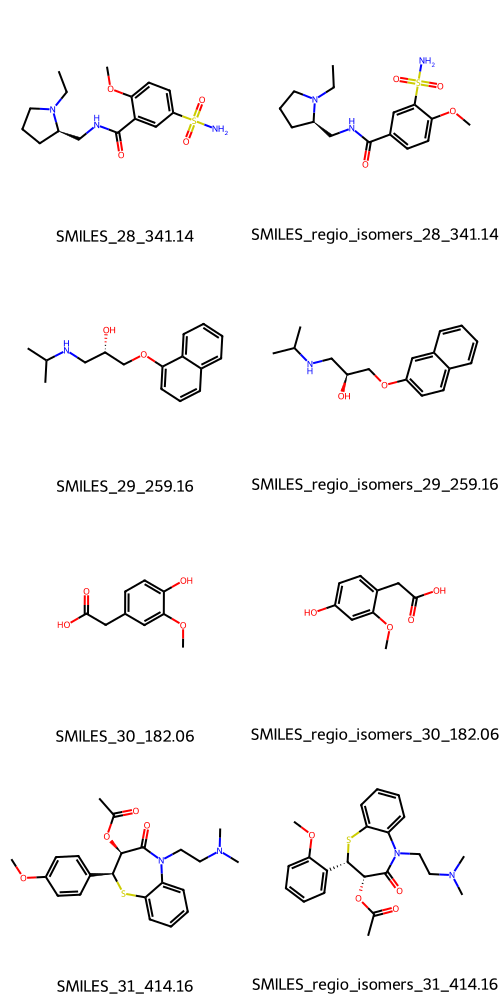

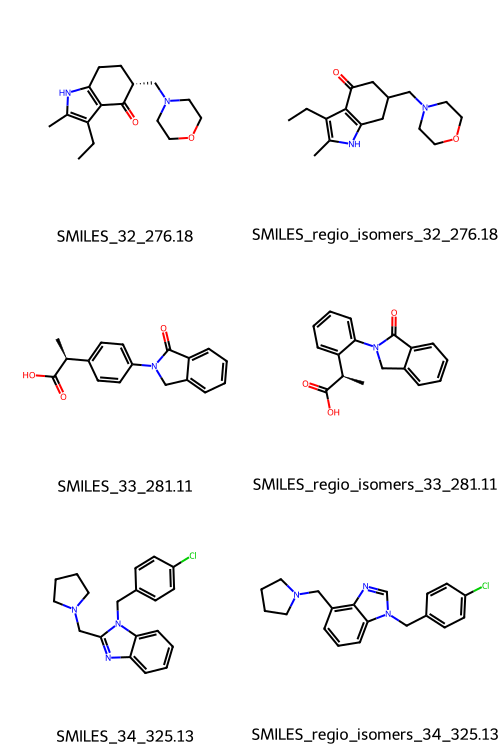

In [187]:

# Helper function to calculate molecular weight
def calculate_weight(smiles):
    mol = Chem.MolFromSmiles(smiles)
    return Chem.Descriptors.ExactMolWt(mol)

def plot_smiles_from_df(data_sorted, column_name):
    list_smiles = []
    sample_id_list = []
    for idx, smiles in enumerate(data_sorted[column_name]):
        weight = calculate_weight(smiles)
        string = f"{column_name}_{idx}_{weight:.2f}"
        sample_id_list.append(string)
        list_smiles.append(Chem.MolFromSmiles(smiles))
        if len(list_smiles) == 9 or idx == len(data_sorted) - 1:
            pic = Draw.MolsToGridImage(list_smiles, subImgSize=(250, 250), legends=sample_id_list)
            display(pic)
            list_smiles = []
            sample_id_list = []

# Read the CSV file
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))

# Plot SMILES from both columns
print("Original SMILES:")
plot_smiles_from_df(df, 'SMILES')

print("\nRegio Isomer SMILES:")
plot_smiles_from_df(df, 'SMILES_regio_isomers')

# Plotting both columns side by side
def plot_smiles_side_by_side(data_sorted, column1, column2):
    list_smiles1 = []
    list_smiles2 = []
    sample_id_list1 = []
    sample_id_list2 = []
    for idx, (smiles1, smiles2) in enumerate(zip(data_sorted[column1], data_sorted[column2])):
        weight1 = calculate_weight(smiles1)
        weight2 = calculate_weight(smiles2)
        string1 = f"{column1}_{idx}_{weight1:.2f}"
        string2 = f"{column2}_{idx}_{weight2:.2f}"
        sample_id_list1.append(string1)
        sample_id_list2.append(string2)
        list_smiles1.append(Chem.MolFromSmiles(smiles1))
        list_smiles2.append(Chem.MolFromSmiles(smiles2))
        if len(list_smiles1) == 4 or idx == len(data_sorted) - 1:
            combined_smiles = [mol for pair in zip(list_smiles1, list_smiles2) for mol in pair]
            combined_legends = [legend for pair in zip(sample_id_list1, sample_id_list2) for legend in pair]
            pic = Draw.MolsToGridImage(combined_smiles, molsPerRow=2, subImgSize=(250, 250), legends=combined_legends)
            display(pic)
            list_smiles1 = []
            list_smiles2 = []
            sample_id_list1 = []
            sample_id_list2 = []

print("\nSide-by-side comparison:")
plot_smiles_side_by_side(df, 'SMILES', 'SMILES_regio_isomers')

Number of SMILES: 11

First few SMILES:
CC(NCC(O)c1ccc(O)c(NC=O)c1)c1cc(C=O)ccc1O
COc1ccc(C(C)OCc2ccc(O)c(NC=O)c2)cc1NC=O
COc1cc(NCC(O)c2ccc(O)c(NC=O)c2)cc(C=O)c1C
COc1ccc(C(C)C(O)c2ccc(O)c(NC=O)c2)cc1NC=O
C=C(O)c1cccc(OC)c1NCC(O)c1ccc(O)c(NC=O)c1

Plotting SMILES grid:


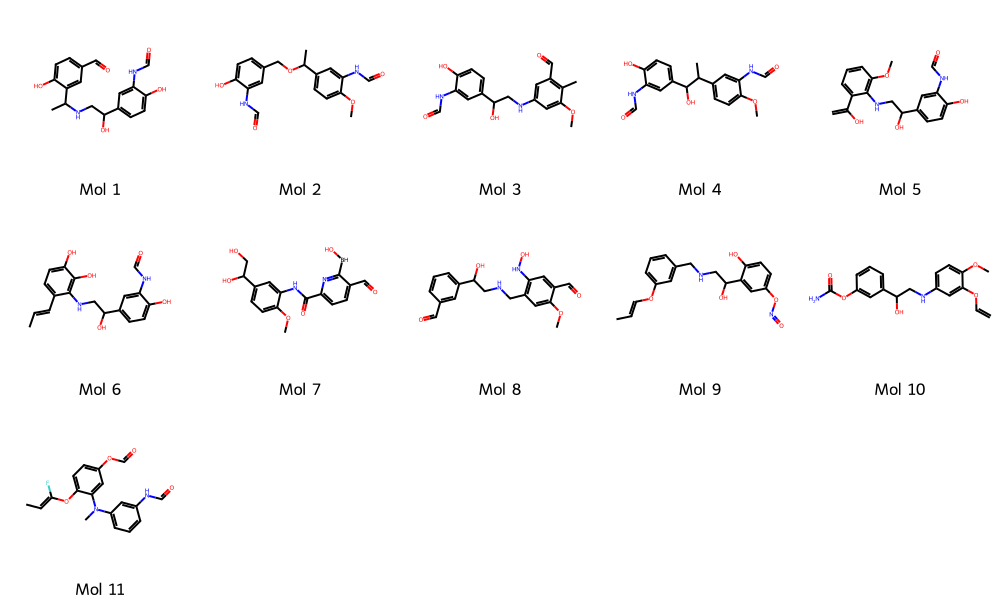

In [188]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display

def plot_smiles_grid(smiles_list, molsPerRow=5, subImgSize=(200, 200)):
    """
    Plot a list of SMILES as a grid with a specified number of molecules per row.
    
    :param smiles_list: List of SMILES strings to plot
    :param molsPerRow: Number of molecules per row in the grid (default: 5)
    :param subImgSize: Size of each molecule image (default: (200, 200))
    """
    mols = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]
    
    # Generate labels (you can customize this if needed)
    legends = [f"Mol {i+1}" for i in range(len(mols))]
    
    # Create the grid image
    img = Draw.MolsToGridImage(mols, molsPerRow=molsPerRow, subImgSize=subImgSize, legends=legends)
    
    # Display the image
    display(img)

# Read the pickle file
file_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/20240927_094958_exp_sim_data_0_0.pkl")
df = pd.read_pickle(file_path)

# Extract the SMILES list
results_dict_bl_ZINC = df['results_dict_bl_ZINC']
smiles_list = [value[0] for value in list(results_dict_bl_ZINC.values())[0][0]]

# Print the number of SMILES
print(f"Number of SMILES: {len(smiles_list)}")

# Print the first few SMILES for verification
print("\nFirst few SMILES:")
for smiles in smiles_list[:5]:
    print(smiles)

# Plot the SMILES grid
print("\nPlotting SMILES grid:")
plot_smiles_grid(smiles_list)

# Optionally, you can adjust the grid layout or image size like this:
# plot_smiles_grid(smiles_list, molsPerRow=4, subImgSize=(150, 150))

### Plot Guess Molecule in SVG

In [189]:


# SMILES string of the molecule
smiles = "OC(CNC(C)Cc1ccc(OC)cc1)c1cc(ccc1O)NC=O"

# Create a RDKit molecule object from the SMILES string
mol = Chem.MolFromSmiles(smiles)

# Generate 2D coordinates for the molecule
AllChem.Compute2DCoords(mol)

# Create a drawer object
d = Draw.MolDraw2DSVG(300, 300)

# Draw the molecule
d.DrawMolecule(mol)

# End the drawing
d.FinishDrawing()

# Get the SVG as a string
svg = d.GetDrawingText()

# Specify the path where you want to save the SVG file
save_path = os.path.abspath("./_FIGURES/20240927_094958_exp_sim_data_0_0.svg")

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the SVG to a file_k_accuracy_MMTi_baseline_sim_sim_data_COSY_FINAL_2_k_accuracy_MMTi_baseline_sim_sim_data_COSY_FINAL_2
with open(save_path, 'w') as f:
    f.write(svg)

print(f"SVG has been saved to: {save_path}")

SVG has been saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/20240927_094958_exp_sim_data_0_0.svg


## Extra Figures

Loading ZINC dataset...
Dataset shape: (100000, 3)
Calculating heavy atoms and molecular weights...
Clean dataset shape: (100000, 5)
Figure saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/heavy_atoms_molecular_weight_distribution.png


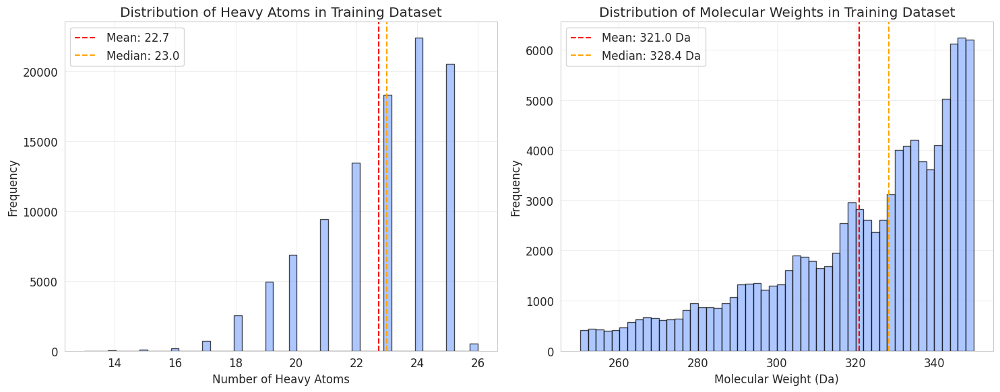


BASIC STATISTICS
Number of molecules analyzed: 100,000
Heavy atoms - Min: 13, Max: 26
Heavy atoms - Mean: 22.7 ± 2.0
Molecular weight - Min: 250.2 Da, Max: 349.9 Da
Molecular weight - Mean: 321.0 ± 24.5 Da


In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Descriptors
import warnings
warnings.filterwarnings('ignore')

# Set up plotting parameters
plt.rcParams['figure.figsize'] = (15, 6)
plt.rcParams['font.size'] = 12

def calculate_heavy_atoms(smiles):
    """Calculate number of heavy atoms from SMILES"""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            return mol.GetNumHeavyAtoms()
        else:
            return None
    except:
        return None

def calculate_molecular_weight(smiles):
    """Calculate molecular weight from SMILES"""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            return Descriptors.MolWt(mol)
        else:
            return None
    except:
        return None

# Load the dataset
print("Loading ZINC dataset...")
file_path = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv'

# Read a sample for analysis (adjust nrows based on your computational resources)
df = pd.read_csv(file_path, nrows=100000)
print(f"Dataset shape: {df.shape}")

# Calculate heavy atoms and molecular weights
print("Calculating heavy atoms and molecular weights...")
df['heavy_atoms'] = df['SMILES'].apply(calculate_heavy_atoms)
df['mol_weight'] = df['SMILES'].apply(calculate_molecular_weight)

# Remove invalid entries
df_clean = df.dropna(subset=['heavy_atoms', 'mol_weight'])
print(f"Clean dataset shape: {df_clean.shape}")

# Create side-by-side plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# 1. Heavy atom distribution histogram
ax1.hist(df_clean['heavy_atoms'], bins=50, alpha=0.7, color='#8CB0FE', edgecolor='black')
ax1.axvline(df_clean['heavy_atoms'].mean(), color='red', linestyle='--', 
            label=f'Mean: {df_clean["heavy_atoms"].mean():.1f}')
ax1.axvline(df_clean['heavy_atoms'].median(), color='orange', linestyle='--', 
            label=f'Median: {df_clean["heavy_atoms"].median():.1f}')
ax1.set_xlabel('Number of Heavy Atoms')
ax1.set_ylabel('Frequency')
ax1.set_title('Distribution of Heavy Atoms in Training Dataset')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Molecular weight distribution
ax2.hist(df_clean['mol_weight'], bins=50, alpha=0.7, color='#8CB0FE', edgecolor='black')
ax2.axvline(df_clean['mol_weight'].mean(), color='red', linestyle='--', 
            label=f'Mean: {df_clean["mol_weight"].mean():.1f} Da')
ax2.axvline(df_clean['mol_weight'].median(), color='orange', linestyle='--', 
            label=f'Median: {df_clean["mol_weight"].median():.1f} Da')
ax2.set_xlabel('Molecular Weight (Da)')
ax2.set_ylabel('Frequency')
ax2.set_title('Distribution of Molecular Weights in Training Dataset')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()

# Save the figure
save_path = '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/heavy_atoms_molecular_weight_distribution.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to: {save_path}")

plt.show()

# Print basic statistics
print("\n" + "="*60)
print("BASIC STATISTICS")
print("="*60)
print(f"Number of molecules analyzed: {len(df_clean):,}")
print(f"Heavy atoms - Min: {df_clean['heavy_atoms'].min()}, Max: {df_clean['heavy_atoms'].max()}")
print(f"Heavy atoms - Mean: {df_clean['heavy_atoms'].mean():.1f} ± {df_clean['heavy_atoms'].std():.1f}")
print(f"Molecular weight - Min: {df_clean['mol_weight'].min():.1f} Da, Max: {df_clean['mol_weight'].max():.1f} Da")
print(f"Molecular weight - Mean: {df_clean['mol_weight'].mean():.1f} ± {df_clean['mol_weight'].std():.1f} Da")